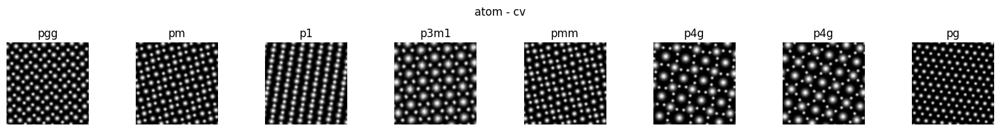

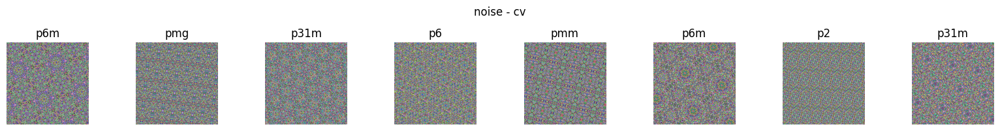

In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
from IPython.display import display
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torchvision import transforms
from torch.utils.data import DataLoader
import wandb

import sys
sys.path.append('../../src/benchmark/')
sys.path.append('../../src/utils/')
from build_model import resnet50_
from utils import split_train_valid, list_to_dict, viz_dataloader, hdf5_dataset
from trainer import Trainer, accuracy

symmetry_classes = ['p1', 'p2', 'pm', 'pg', 'cm', 'pmm', 'pmg', 'pgg', 'cmm', 'p4', 'p4m', 'p4g', 'p3', 'p3m1', 'p31m', 'p6', 'p6m']
label_converter = list_to_dict(symmetry_classes)
bs = 3600
n_cpus = 12

# # atom
atom_ds = hdf5_dataset('../../datasets/atom_v5_rot_200k.h5', folder='test', transform=transforms.ToTensor())
atom_dl = DataLoader(atom_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(atom_dl, label_converter=label_converter, title='atom - cv')

# # noise
noise_ds = hdf5_dataset('../../datasets/imagenet_atom_noise_v4_rot_10m_100k_subset.h5', folder='noise', transform=transforms.ToTensor())
noise_dl = DataLoader(noise_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(noise_dl, label_converter=label_converter, title='noise - cv')

### 1K training dataset size 

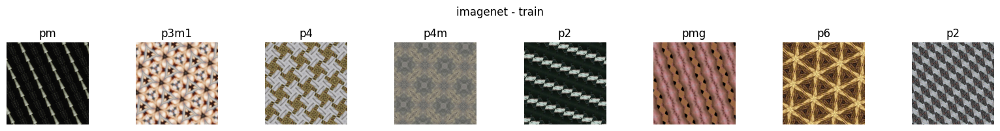

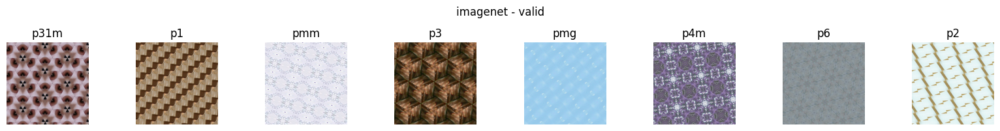

In [3]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
_, imagenet_ds = split_train_valid(imagenet_ds, 0.9999, seed=42)
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [ ]:
model = resnet50_(in_channels=3, n_classes=17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,4,5,6,7,9])
device = torch.device('cuda:3')
# model

torch.Size([2, 17])


In [ ]:
config = {'dataset': '1k datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09052024-resnet50-dataset_v5_size-1k'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records', save_code=True, config=config, resume='allow')
config = wandb.config

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: yig319. Use `wandb login --relogin` to force relogin


In [ ]:
lr = 1e-3
per_epoch = 100
epoch_start = 0
epochs = 50000
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/50000


100%|██████████| 1/1 [00:04<00:00,  4.08s/it]


train_loss: 3.1401, train_accuracy: 4.43%
Epoch 2/50000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.1733, train_accuracy: 4.78%
Epoch 3/50000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.1378, train_accuracy: 5.72%
Epoch 4/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 3.0746, train_accuracy: 7.35%
Epoch 5/50000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.1140, train_accuracy: 6.65%
Epoch 6/50000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.1404, train_accuracy: 5.95%
Epoch 7/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 3.0625, train_accuracy: 6.53%
Epoch 8/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 3.1153, train_accuracy: 5.72%
Epoch 9/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 3.0629, train_accuracy: 7.82%
Epoch 10/50000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 3.0509, train_accuracy: 8.05%
Epoch 11/50000


100%|██████████| 1/1 [00:02<00:00,  2.79s/it]


train_loss: 3.0425, train_accuracy: 6.65%
Epoch 12/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 3.0373, train_accuracy: 9.45%
Epoch 13/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 3.0607, train_accuracy: 5.95%
Epoch 14/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 3.0449, train_accuracy: 8.28%
Epoch 15/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 3.0859, train_accuracy: 6.65%
Epoch 16/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 3.0514, train_accuracy: 6.65%
Epoch 17/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 3.0162, train_accuracy: 6.53%
Epoch 18/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 3.0483, train_accuracy: 6.77%
Epoch 19/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 3.0211, train_accuracy: 7.00%
Epoch 20/50000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 3.0605, train_accuracy: 5.83%
Epoch 21/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 3.0586, train_accuracy: 6.53%
Epoch 22/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 3.0180, train_accuracy: 7.47%
Epoch 23/50000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 2.9767, train_accuracy: 8.63%
Epoch 24/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 3.0273, train_accuracy: 5.37%
Epoch 25/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 3.0488, train_accuracy: 5.37%
Epoch 26/50000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 3.0221, train_accuracy: 5.83%
Epoch 27/50000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 2.9960, train_accuracy: 8.75%
Epoch 28/50000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 2.9354, train_accuracy: 8.98%
Epoch 29/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 3.0022, train_accuracy: 7.35%
Epoch 30/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 2.9661, train_accuracy: 7.93%
Epoch 31/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 2.9933, train_accuracy: 7.35%
Epoch 32/50000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 2.9827, train_accuracy: 7.35%
Epoch 33/50000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 2.9899, train_accuracy: 8.05%
Epoch 34/50000


100%|██████████| 1/1 [00:02<00:00,  2.58s/it]


train_loss: 2.9726, train_accuracy: 9.45%
Epoch 35/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 2.9310, train_accuracy: 8.75%
Epoch 36/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 3.0000, train_accuracy: 7.12%
Epoch 37/50000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 2.9462, train_accuracy: 8.75%
Epoch 38/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 2.9371, train_accuracy: 9.33%
Epoch 39/50000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 2.9531, train_accuracy: 8.28%
Epoch 40/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.8884, train_accuracy: 8.40%
Epoch 41/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 3.0128, train_accuracy: 7.35%
Epoch 42/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 2.9229, train_accuracy: 9.33%
Epoch 43/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 2.9346, train_accuracy: 9.57%
Epoch 44/50000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 2.9374, train_accuracy: 9.45%
Epoch 45/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 2.9535, train_accuracy: 7.93%
Epoch 46/50000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 2.9079, train_accuracy: 9.33%
Epoch 47/50000


100%|██████████| 1/1 [00:02<00:00,  2.77s/it]


train_loss: 2.9009, train_accuracy: 8.87%
Epoch 48/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.9065, train_accuracy: 8.98%
Epoch 49/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.9148, train_accuracy: 9.57%
Epoch 50/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 2.9459, train_accuracy: 9.10%
Epoch 51/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 2.9541, train_accuracy: 9.10%
Epoch 52/50000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 2.9175, train_accuracy: 11.44%
Epoch 53/50000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 2.9174, train_accuracy: 9.45%
Epoch 54/50000


100%|██████████| 1/1 [00:02<00:00,  2.63s/it]


train_loss: 2.9457, train_accuracy: 10.15%
Epoch 55/50000


100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 2.9686, train_accuracy: 8.17%
Epoch 56/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.9357, train_accuracy: 8.87%
Epoch 57/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 2.9386, train_accuracy: 8.98%
Epoch 58/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 2.9166, train_accuracy: 8.05%
Epoch 59/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 2.9011, train_accuracy: 9.68%
Epoch 60/50000


100%|██████████| 1/1 [00:02<00:00,  2.80s/it]


train_loss: 2.8803, train_accuracy: 10.85%
Epoch 61/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 2.9433, train_accuracy: 8.63%
Epoch 62/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 2.9016, train_accuracy: 9.92%
Epoch 63/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 2.9011, train_accuracy: 9.45%
Epoch 64/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.8661, train_accuracy: 11.44%
Epoch 65/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 2.8793, train_accuracy: 9.22%
Epoch 66/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.8695, train_accuracy: 11.09%
Epoch 67/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.9450, train_accuracy: 9.10%
Epoch 68/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 2.8747, train_accuracy: 10.04%
Epoch 69/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.8886, train_accuracy: 9.80%
Epoch 70/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 2.8686, train_accuracy: 10.39%
Epoch 71/50000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 2.8605, train_accuracy: 10.97%
Epoch 72/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.8409, train_accuracy: 9.92%
Epoch 73/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 2.8623, train_accuracy: 10.04%
Epoch 74/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 2.8348, train_accuracy: 12.49%
Epoch 75/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 2.9063, train_accuracy: 10.27%
Epoch 76/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.8585, train_accuracy: 10.39%
Epoch 77/50000


100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


train_loss: 2.8264, train_accuracy: 10.74%
Epoch 78/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 2.8416, train_accuracy: 10.27%
Epoch 79/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.8468, train_accuracy: 11.09%
Epoch 80/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.8241, train_accuracy: 10.15%
Epoch 81/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.8362, train_accuracy: 10.39%
Epoch 82/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 2.8333, train_accuracy: 11.32%
Epoch 83/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 2.8675, train_accuracy: 11.20%
Epoch 84/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.8385, train_accuracy: 8.52%
Epoch 85/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.8225, train_accuracy: 11.32%
Epoch 86/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.8291, train_accuracy: 10.27%
Epoch 87/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 2.8151, train_accuracy: 11.44%
Epoch 88/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.8640, train_accuracy: 11.20%
Epoch 89/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 2.8231, train_accuracy: 11.79%
Epoch 90/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 2.8168, train_accuracy: 10.85%
Epoch 91/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 2.8028, train_accuracy: 11.44%
Epoch 92/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 2.8413, train_accuracy: 13.54%
Epoch 93/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.8430, train_accuracy: 12.37%
Epoch 94/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.8277, train_accuracy: 11.44%
Epoch 95/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 2.8257, train_accuracy: 14.00%
Epoch 96/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 2.7697, train_accuracy: 13.54%
Epoch 97/50000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 2.8029, train_accuracy: 11.44%
Epoch 98/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 2.7911, train_accuracy: 12.14%
Epoch 99/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 2.7788, train_accuracy: 13.65%
Epoch 100/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.8101, train_accuracy: 11.55%


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


valid_loss: 2.9586, valid_accuracy: 4.65%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 2.9164, valid_atom_accuracy: 1.75%


100%|██████████| 29/29 [00:40<00:00,  1.40s/it]


valid_noise_loss: 3.9144, valid_noise_accuracy: 5.88%
Model saved at epoch 100
Epoch 101/50000


100%|██████████| 1/1 [00:02<00:00,  2.60s/it]


train_loss: 2.7890, train_accuracy: 12.02%
Epoch 102/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 2.8271, train_accuracy: 11.32%
Epoch 103/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.8360, train_accuracy: 10.39%
Epoch 104/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 2.7587, train_accuracy: 13.07%
Epoch 105/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.7650, train_accuracy: 14.59%
Epoch 106/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 2.7745, train_accuracy: 11.79%
Epoch 107/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.7844, train_accuracy: 13.77%
Epoch 108/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 2.7703, train_accuracy: 13.30%
Epoch 109/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.7123, train_accuracy: 14.00%
Epoch 110/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.7962, train_accuracy: 11.67%
Epoch 111/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.7653, train_accuracy: 13.42%
Epoch 112/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 2.7520, train_accuracy: 13.19%
Epoch 113/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.7555, train_accuracy: 14.24%
Epoch 114/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.7403, train_accuracy: 15.75%
Epoch 115/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.8100, train_accuracy: 11.79%
Epoch 116/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 2.7223, train_accuracy: 15.52%
Epoch 117/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.7476, train_accuracy: 13.89%
Epoch 118/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 2.7338, train_accuracy: 12.72%
Epoch 119/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 2.7336, train_accuracy: 12.37%
Epoch 120/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 2.7549, train_accuracy: 13.07%
Epoch 121/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.7454, train_accuracy: 12.95%
Epoch 122/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.7272, train_accuracy: 13.19%
Epoch 123/50000


100%|██████████| 1/1 [00:02<00:00,  2.82s/it]


train_loss: 2.7810, train_accuracy: 12.60%
Epoch 124/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.6916, train_accuracy: 15.64%
Epoch 125/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.7587, train_accuracy: 14.24%
Epoch 126/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 2.7397, train_accuracy: 14.00%
Epoch 127/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.7047, train_accuracy: 15.87%
Epoch 128/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.7357, train_accuracy: 13.54%
Epoch 129/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.7212, train_accuracy: 14.24%
Epoch 130/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.6954, train_accuracy: 14.70%
Epoch 131/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.6878, train_accuracy: 15.52%
Epoch 132/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 2.7010, train_accuracy: 14.82%
Epoch 133/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.7163, train_accuracy: 13.89%
Epoch 134/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.6835, train_accuracy: 15.17%
Epoch 135/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.6499, train_accuracy: 18.55%
Epoch 136/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.6360, train_accuracy: 16.80%
Epoch 137/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 2.6342, train_accuracy: 16.57%
Epoch 138/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.6839, train_accuracy: 14.00%
Epoch 139/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.6410, train_accuracy: 17.97%
Epoch 140/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.6564, train_accuracy: 13.89%
Epoch 141/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 2.6861, train_accuracy: 15.87%
Epoch 142/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.6376, train_accuracy: 18.44%
Epoch 143/50000


100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 2.6405, train_accuracy: 16.57%
Epoch 144/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.6625, train_accuracy: 18.44%
Epoch 145/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.7093, train_accuracy: 16.22%
Epoch 146/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 2.6633, train_accuracy: 17.50%
Epoch 147/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.6116, train_accuracy: 15.75%
Epoch 148/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.6494, train_accuracy: 18.09%
Epoch 149/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.6669, train_accuracy: 16.80%
Epoch 150/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.6065, train_accuracy: 16.22%
Epoch 151/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.6509, train_accuracy: 17.50%
Epoch 152/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.6203, train_accuracy: 15.99%
Epoch 153/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.6482, train_accuracy: 17.27%
Epoch 154/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 2.6324, train_accuracy: 15.64%
Epoch 155/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.6489, train_accuracy: 17.27%
Epoch 156/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.5989, train_accuracy: 18.67%
Epoch 157/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.6009, train_accuracy: 19.49%
Epoch 158/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.6029, train_accuracy: 16.80%
Epoch 159/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.5820, train_accuracy: 20.07%
Epoch 160/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.6156, train_accuracy: 17.27%
Epoch 161/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 2.5914, train_accuracy: 17.97%
Epoch 162/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.6391, train_accuracy: 17.50%
Epoch 163/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.5867, train_accuracy: 18.09%
Epoch 164/50000


100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


train_loss: 2.5813, train_accuracy: 18.79%
Epoch 165/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.5757, train_accuracy: 18.67%
Epoch 166/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.5395, train_accuracy: 18.79%
Epoch 167/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.5301, train_accuracy: 20.19%
Epoch 168/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 2.6228, train_accuracy: 18.55%
Epoch 169/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 2.5725, train_accuracy: 19.95%
Epoch 170/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.5232, train_accuracy: 21.00%
Epoch 171/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.5334, train_accuracy: 20.54%
Epoch 172/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 2.5841, train_accuracy: 19.95%
Epoch 173/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.5543, train_accuracy: 21.35%
Epoch 174/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.5526, train_accuracy: 21.24%
Epoch 175/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.5714, train_accuracy: 19.60%
Epoch 176/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.5458, train_accuracy: 18.20%
Epoch 177/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.5096, train_accuracy: 21.82%
Epoch 178/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.5472, train_accuracy: 19.60%
Epoch 179/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.5645, train_accuracy: 19.84%
Epoch 180/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.5322, train_accuracy: 22.40%
Epoch 181/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.4939, train_accuracy: 21.00%
Epoch 182/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.4979, train_accuracy: 19.95%
Epoch 183/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.5404, train_accuracy: 19.14%
Epoch 184/50000


100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


train_loss: 2.5060, train_accuracy: 19.84%
Epoch 185/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.4776, train_accuracy: 22.99%
Epoch 186/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 2.5052, train_accuracy: 23.92%
Epoch 187/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 2.4907, train_accuracy: 22.40%
Epoch 188/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.4892, train_accuracy: 19.72%
Epoch 189/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.5194, train_accuracy: 20.77%
Epoch 190/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.4776, train_accuracy: 22.40%
Epoch 191/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.4702, train_accuracy: 23.22%
Epoch 192/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.4603, train_accuracy: 23.57%
Epoch 193/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.4751, train_accuracy: 21.59%
Epoch 194/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.4229, train_accuracy: 24.97%
Epoch 195/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.4235, train_accuracy: 25.67%
Epoch 196/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.4559, train_accuracy: 24.27%
Epoch 197/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.4578, train_accuracy: 21.94%
Epoch 198/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.4110, train_accuracy: 26.37%
Epoch 199/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 2.4881, train_accuracy: 22.64%
Epoch 200/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 2.3626, train_accuracy: 26.49%


100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


valid_loss: 3.0042, valid_accuracy: 5.12%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 2.9028, valid_atom_accuracy: 1.83%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 3.4810, valid_noise_accuracy: 5.88%
Model saved at epoch 200
Epoch 201/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 2.3969, train_accuracy: 25.67%
Epoch 202/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 2.4315, train_accuracy: 25.90%
Epoch 203/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.3881, train_accuracy: 23.80%
Epoch 204/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 2.4399, train_accuracy: 23.92%
Epoch 205/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 2.4086, train_accuracy: 25.20%
Epoch 206/50000


100%|██████████| 1/1 [00:03<00:00,  3.06s/it]


train_loss: 2.4189, train_accuracy: 23.45%
Epoch 207/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.4403, train_accuracy: 24.15%
Epoch 208/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.4205, train_accuracy: 25.20%
Epoch 209/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 2.3670, train_accuracy: 26.84%
Epoch 210/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.3711, train_accuracy: 24.27%
Epoch 211/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 2.3953, train_accuracy: 22.99%
Epoch 212/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.3731, train_accuracy: 26.72%
Epoch 213/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 2.3504, train_accuracy: 27.54%
Epoch 214/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.3438, train_accuracy: 27.07%
Epoch 215/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.3846, train_accuracy: 23.92%
Epoch 216/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.3594, train_accuracy: 25.20%
Epoch 217/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.3891, train_accuracy: 26.14%
Epoch 218/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.3618, train_accuracy: 25.55%
Epoch 219/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 2.3834, train_accuracy: 26.14%
Epoch 220/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 2.3360, train_accuracy: 26.60%
Epoch 221/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.4261, train_accuracy: 23.92%
Epoch 222/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.3355, train_accuracy: 29.99%
Epoch 223/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.2555, train_accuracy: 31.27%
Epoch 224/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.3386, train_accuracy: 27.77%
Epoch 225/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 2.3100, train_accuracy: 27.65%
Epoch 226/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 2.3107, train_accuracy: 29.40%
Epoch 227/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 2.2712, train_accuracy: 30.11%
Epoch 228/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 2.3367, train_accuracy: 28.24%
Epoch 229/50000


100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 2.2691, train_accuracy: 29.87%
Epoch 230/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.2929, train_accuracy: 29.52%
Epoch 231/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.2363, train_accuracy: 33.02%
Epoch 232/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.2694, train_accuracy: 31.04%
Epoch 233/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 2.2859, train_accuracy: 27.77%
Epoch 234/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 2.2635, train_accuracy: 27.07%
Epoch 235/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.2821, train_accuracy: 30.92%
Epoch 236/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.2869, train_accuracy: 30.69%
Epoch 237/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.2540, train_accuracy: 29.87%
Epoch 238/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.2441, train_accuracy: 31.04%
Epoch 239/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 2.1858, train_accuracy: 34.07%
Epoch 240/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.2838, train_accuracy: 29.29%
Epoch 241/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 2.1548, train_accuracy: 36.29%
Epoch 242/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 2.2099, train_accuracy: 34.42%
Epoch 243/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.1680, train_accuracy: 34.19%
Epoch 244/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.1657, train_accuracy: 34.77%
Epoch 245/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 2.1725, train_accuracy: 33.14%
Epoch 246/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.1506, train_accuracy: 36.64%
Epoch 247/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 2.1426, train_accuracy: 32.32%
Epoch 248/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 2.1900, train_accuracy: 33.14%
Epoch 249/50000


100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 2.1543, train_accuracy: 34.07%
Epoch 250/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.2048, train_accuracy: 33.72%
Epoch 251/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.1454, train_accuracy: 34.42%
Epoch 252/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 2.1311, train_accuracy: 35.01%
Epoch 253/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.2890, train_accuracy: 29.17%
Epoch 254/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 2.1463, train_accuracy: 34.54%
Epoch 255/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 2.0629, train_accuracy: 36.87%
Epoch 256/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 2.0987, train_accuracy: 37.46%
Epoch 257/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 2.0791, train_accuracy: 38.62%
Epoch 258/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 2.0872, train_accuracy: 35.94%
Epoch 259/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 2.0461, train_accuracy: 39.56%
Epoch 260/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 2.0950, train_accuracy: 35.71%
Epoch 261/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 2.0910, train_accuracy: 37.34%
Epoch 262/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 2.1447, train_accuracy: 33.96%
Epoch 263/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 2.0844, train_accuracy: 36.41%
Epoch 264/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 2.0359, train_accuracy: 38.27%
Epoch 265/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.1092, train_accuracy: 35.12%
Epoch 266/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 2.0407, train_accuracy: 38.39%
Epoch 267/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 1.9827, train_accuracy: 42.36%
Epoch 268/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.1022, train_accuracy: 36.29%
Epoch 269/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 2.0009, train_accuracy: 41.31%
Epoch 270/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 2.0192, train_accuracy: 41.19%
Epoch 271/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 2.0527, train_accuracy: 35.71%
Epoch 272/50000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 1.9732, train_accuracy: 43.41%
Epoch 273/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 1.9760, train_accuracy: 41.19%
Epoch 274/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 1.9397, train_accuracy: 44.46%
Epoch 275/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 1.9473, train_accuracy: 42.94%
Epoch 276/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 2.0015, train_accuracy: 41.07%
Epoch 277/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 2.0130, train_accuracy: 42.94%
Epoch 278/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.9907, train_accuracy: 41.77%
Epoch 279/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 1.9592, train_accuracy: 41.89%
Epoch 280/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 1.9953, train_accuracy: 41.19%
Epoch 281/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 2.0197, train_accuracy: 40.02%
Epoch 282/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.9587, train_accuracy: 40.26%
Epoch 283/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 1.8940, train_accuracy: 45.74%
Epoch 284/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.8480, train_accuracy: 47.96%
Epoch 285/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 1.9598, train_accuracy: 43.52%
Epoch 286/50000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 1.9629, train_accuracy: 45.16%
Epoch 287/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 1.8801, train_accuracy: 45.16%
Epoch 288/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 1.8874, train_accuracy: 44.69%
Epoch 289/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 1.9268, train_accuracy: 45.97%
Epoch 290/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 1.8202, train_accuracy: 48.31%
Epoch 291/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 1.8502, train_accuracy: 46.56%
Epoch 292/50000


100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


train_loss: 1.8834, train_accuracy: 46.21%
Epoch 293/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 1.8909, train_accuracy: 47.61%
Epoch 294/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 1.9210, train_accuracy: 43.99%
Epoch 295/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 1.7902, train_accuracy: 50.29%
Epoch 296/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 1.8512, train_accuracy: 48.89%
Epoch 297/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 1.8043, train_accuracy: 50.64%
Epoch 298/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 1.7768, train_accuracy: 52.86%
Epoch 299/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 1.8081, train_accuracy: 50.53%
Epoch 300/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 1.8673, train_accuracy: 45.74%


100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


valid_loss: 3.0745, valid_accuracy: 7.44%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 3.0039, valid_atom_accuracy: 5.76%


100%|██████████| 29/29 [00:40<00:00,  1.40s/it]


valid_noise_loss: 2.9362, valid_noise_accuracy: 5.88%
Model saved at epoch 300
Epoch 301/50000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 1.8511, train_accuracy: 47.02%
Epoch 302/50000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 1.8555, train_accuracy: 48.19%
Epoch 303/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 1.7352, train_accuracy: 54.26%
Epoch 304/50000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 1.7626, train_accuracy: 50.64%
Epoch 305/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.7260, train_accuracy: 55.31%
Epoch 306/50000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 1.8104, train_accuracy: 47.37%
Epoch 307/50000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 1.7498, train_accuracy: 52.51%
Epoch 308/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.8190, train_accuracy: 49.71%
Epoch 309/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.7312, train_accuracy: 53.44%
Epoch 310/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.6742, train_accuracy: 54.38%
Epoch 311/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 1.6604, train_accuracy: 56.24%
Epoch 312/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 1.6455, train_accuracy: 57.64%
Epoch 313/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.7320, train_accuracy: 52.74%
Epoch 314/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.6944, train_accuracy: 56.36%
Epoch 315/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.6655, train_accuracy: 56.83%
Epoch 316/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 1.6972, train_accuracy: 53.44%
Epoch 317/50000


100%|██████████| 1/1 [00:02<00:00,  2.58s/it]


train_loss: 1.6363, train_accuracy: 57.18%
Epoch 318/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.6564, train_accuracy: 56.71%
Epoch 319/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.6287, train_accuracy: 57.64%
Epoch 320/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.5938, train_accuracy: 61.61%
Epoch 321/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.6012, train_accuracy: 58.93%
Epoch 322/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.7091, train_accuracy: 55.08%
Epoch 323/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.6123, train_accuracy: 58.11%
Epoch 324/50000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 1.5977, train_accuracy: 60.21%
Epoch 325/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.5779, train_accuracy: 58.58%
Epoch 326/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 1.6039, train_accuracy: 58.34%
Epoch 327/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.6150, train_accuracy: 58.34%
Epoch 328/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.6460, train_accuracy: 58.46%
Epoch 329/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 1.5364, train_accuracy: 63.59%
Epoch 330/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.6465, train_accuracy: 56.24%
Epoch 331/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.6092, train_accuracy: 59.04%
Epoch 332/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.5397, train_accuracy: 61.26%
Epoch 333/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.5545, train_accuracy: 60.79%
Epoch 334/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.5321, train_accuracy: 63.24%
Epoch 335/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.4978, train_accuracy: 65.34%
Epoch 336/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.5327, train_accuracy: 61.61%
Epoch 337/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.6047, train_accuracy: 59.28%
Epoch 338/50000


100%|██████████| 1/1 [00:02<00:00,  2.66s/it]


train_loss: 1.5185, train_accuracy: 63.24%
Epoch 339/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.5029, train_accuracy: 63.71%
Epoch 340/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.5574, train_accuracy: 61.61%
Epoch 341/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 1.5156, train_accuracy: 61.26%
Epoch 342/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.6386, train_accuracy: 58.58%
Epoch 343/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.5663, train_accuracy: 60.56%
Epoch 344/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.4198, train_accuracy: 66.04%
Epoch 345/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.5232, train_accuracy: 62.31%
Epoch 346/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.3910, train_accuracy: 70.83%
Epoch 347/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.4585, train_accuracy: 66.86%
Epoch 348/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.3920, train_accuracy: 69.54%
Epoch 349/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.3887, train_accuracy: 69.08%
Epoch 350/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.4549, train_accuracy: 66.04%
Epoch 351/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.4439, train_accuracy: 66.04%
Epoch 352/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.4679, train_accuracy: 66.04%
Epoch 353/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.3778, train_accuracy: 70.01%
Epoch 354/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 1.4069, train_accuracy: 70.25%
Epoch 355/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.3872, train_accuracy: 68.61%
Epoch 356/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.4047, train_accuracy: 68.03%
Epoch 357/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.3329, train_accuracy: 73.40%
Epoch 358/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.3670, train_accuracy: 69.78%
Epoch 359/50000


100%|██████████| 1/1 [00:02<00:00,  2.57s/it]


train_loss: 1.4048, train_accuracy: 68.14%
Epoch 360/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.3308, train_accuracy: 71.53%
Epoch 361/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.3069, train_accuracy: 73.16%
Epoch 362/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.3186, train_accuracy: 73.16%
Epoch 363/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.3909, train_accuracy: 68.26%
Epoch 364/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.3910, train_accuracy: 69.08%
Epoch 365/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.3023, train_accuracy: 72.70%
Epoch 366/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.3040, train_accuracy: 70.36%
Epoch 367/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.3120, train_accuracy: 73.16%
Epoch 368/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 1.3117, train_accuracy: 74.56%
Epoch 369/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.2684, train_accuracy: 73.40%
Epoch 370/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 1.4760, train_accuracy: 64.64%
Epoch 371/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.2599, train_accuracy: 76.66%
Epoch 372/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.2197, train_accuracy: 77.13%
Epoch 373/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 1.3534, train_accuracy: 71.76%
Epoch 374/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 1.2266, train_accuracy: 77.13%
Epoch 375/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.2622, train_accuracy: 75.15%
Epoch 376/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.1979, train_accuracy: 77.36%
Epoch 377/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 1.2623, train_accuracy: 75.15%
Epoch 378/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.1990, train_accuracy: 78.06%
Epoch 379/50000


100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


train_loss: 1.1985, train_accuracy: 77.36%
Epoch 380/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.2568, train_accuracy: 75.38%
Epoch 381/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.2595, train_accuracy: 76.20%
Epoch 382/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.2666, train_accuracy: 74.45%
Epoch 383/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.2596, train_accuracy: 74.68%
Epoch 384/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.2592, train_accuracy: 75.50%
Epoch 385/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 1.2202, train_accuracy: 76.90%
Epoch 386/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.2587, train_accuracy: 75.03%
Epoch 387/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.2045, train_accuracy: 79.00%
Epoch 388/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.1869, train_accuracy: 77.36%
Epoch 389/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 1.2448, train_accuracy: 74.80%
Epoch 390/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.2288, train_accuracy: 76.31%
Epoch 391/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.1082, train_accuracy: 83.08%
Epoch 392/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.1296, train_accuracy: 81.45%
Epoch 393/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 1.1893, train_accuracy: 78.30%
Epoch 394/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.2976, train_accuracy: 71.06%
Epoch 395/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.2096, train_accuracy: 77.60%
Epoch 396/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 1.1876, train_accuracy: 77.60%
Epoch 397/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 1.1945, train_accuracy: 77.83%
Epoch 398/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.2246, train_accuracy: 75.15%
Epoch 399/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.3057, train_accuracy: 70.83%
Epoch 400/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 1.0796, train_accuracy: 84.13%


100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


valid_loss: 3.0795, valid_accuracy: 6.98%


100%|██████████| 57/57 [01:16<00:00,  1.34s/it]


valid_atom_loss: 3.1171, valid_atom_accuracy: 4.96%


100%|██████████| 29/29 [00:41<00:00,  1.43s/it]


valid_noise_loss: 2.9453, valid_noise_accuracy: 5.87%
Model saved at epoch 400
Epoch 401/50000


100%|██████████| 1/1 [00:02<00:00,  2.60s/it]


train_loss: 1.0893, train_accuracy: 82.96%
Epoch 402/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.0751, train_accuracy: 82.61%
Epoch 403/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 1.0477, train_accuracy: 85.65%
Epoch 404/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.0899, train_accuracy: 82.73%
Epoch 405/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.0508, train_accuracy: 86.00%
Epoch 406/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 1.0854, train_accuracy: 82.38%
Epoch 407/50000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 1.0468, train_accuracy: 83.90%
Epoch 408/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 1.2611, train_accuracy: 74.45%
Epoch 409/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 1.1085, train_accuracy: 83.43%
Epoch 410/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 1.1396, train_accuracy: 77.95%
Epoch 411/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 1.1132, train_accuracy: 80.16%
Epoch 412/50000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 1.0971, train_accuracy: 81.56%
Epoch 413/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.1080, train_accuracy: 81.33%
Epoch 414/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 1.0744, train_accuracy: 81.91%
Epoch 415/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.1594, train_accuracy: 78.76%
Epoch 416/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.0459, train_accuracy: 84.60%
Epoch 417/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 1.1174, train_accuracy: 80.16%
Epoch 418/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.9668, train_accuracy: 87.98%
Epoch 419/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.9704, train_accuracy: 86.81%
Epoch 420/50000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.9378, train_accuracy: 87.16%
Epoch 421/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 1.0440, train_accuracy: 83.08%
Epoch 422/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.9758, train_accuracy: 89.03%
Epoch 423/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.9950, train_accuracy: 86.93%
Epoch 424/50000


100%|██████████| 1/1 [00:02<00:00,  3.00s/it]


train_loss: 1.0121, train_accuracy: 84.36%
Epoch 425/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 1.0075, train_accuracy: 84.25%
Epoch 426/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 1.0005, train_accuracy: 87.05%
Epoch 427/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.9572, train_accuracy: 87.16%
Epoch 428/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 1.0721, train_accuracy: 83.66%
Epoch 429/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 1.1778, train_accuracy: 77.48%
Epoch 430/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.9799, train_accuracy: 87.75%
Epoch 431/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.9357, train_accuracy: 87.40%
Epoch 432/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.9646, train_accuracy: 86.93%
Epoch 433/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.9677, train_accuracy: 85.88%
Epoch 434/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.9623, train_accuracy: 86.70%
Epoch 435/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.9369, train_accuracy: 88.10%
Epoch 436/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.9627, train_accuracy: 87.28%
Epoch 437/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.9475, train_accuracy: 86.93%
Epoch 438/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.8976, train_accuracy: 89.73%
Epoch 439/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.9053, train_accuracy: 88.33%
Epoch 440/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 1.0009, train_accuracy: 86.11%
Epoch 441/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.9053, train_accuracy: 89.03%
Epoch 442/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.9794, train_accuracy: 86.70%
Epoch 443/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.8705, train_accuracy: 90.78%
Epoch 444/50000


100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


train_loss: 0.9286, train_accuracy: 89.61%
Epoch 445/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.9879, train_accuracy: 86.35%
Epoch 446/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.9003, train_accuracy: 88.91%
Epoch 447/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.9524, train_accuracy: 86.58%
Epoch 448/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.9132, train_accuracy: 87.63%
Epoch 449/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.8529, train_accuracy: 90.90%
Epoch 450/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.9085, train_accuracy: 90.08%
Epoch 451/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.8808, train_accuracy: 89.73%
Epoch 452/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.9818, train_accuracy: 86.23%
Epoch 453/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.8279, train_accuracy: 92.07%
Epoch 454/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.9229, train_accuracy: 86.93%
Epoch 455/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.9301, train_accuracy: 87.75%
Epoch 456/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.8188, train_accuracy: 92.53%
Epoch 457/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.8709, train_accuracy: 91.13%
Epoch 458/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.8378, train_accuracy: 89.96%
Epoch 459/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.9722, train_accuracy: 86.81%
Epoch 460/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.8889, train_accuracy: 87.86%
Epoch 461/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.8735, train_accuracy: 88.33%
Epoch 462/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.8743, train_accuracy: 90.20%
Epoch 463/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.8893, train_accuracy: 88.68%
Epoch 464/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.7943, train_accuracy: 92.53%
Epoch 465/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.8277, train_accuracy: 90.90%
Epoch 466/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.8569, train_accuracy: 90.67%
Epoch 467/50000


100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


train_loss: 0.8867, train_accuracy: 89.50%
Epoch 468/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.8112, train_accuracy: 90.67%
Epoch 469/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.9699, train_accuracy: 85.06%
Epoch 470/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.8582, train_accuracy: 89.50%
Epoch 471/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.7703, train_accuracy: 92.42%
Epoch 472/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.8179, train_accuracy: 91.25%
Epoch 473/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.9955, train_accuracy: 82.85%
Epoch 474/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.8569, train_accuracy: 90.20%
Epoch 475/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.8371, train_accuracy: 90.90%
Epoch 476/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.8025, train_accuracy: 92.42%
Epoch 477/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.7649, train_accuracy: 93.00%
Epoch 478/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.8657, train_accuracy: 89.96%
Epoch 479/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.9052, train_accuracy: 86.11%
Epoch 480/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.9271, train_accuracy: 86.93%
Epoch 481/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.8518, train_accuracy: 88.68%
Epoch 482/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.7374, train_accuracy: 93.47%
Epoch 483/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.8081, train_accuracy: 91.60%
Epoch 484/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.8036, train_accuracy: 91.25%
Epoch 485/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.7401, train_accuracy: 93.58%
Epoch 486/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.7635, train_accuracy: 93.35%
Epoch 487/50000


100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.8605, train_accuracy: 88.91%
Epoch 488/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.7648, train_accuracy: 93.12%
Epoch 489/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.7161, train_accuracy: 94.05%
Epoch 490/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.7668, train_accuracy: 93.00%
Epoch 491/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.7612, train_accuracy: 93.00%
Epoch 492/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.7617, train_accuracy: 93.93%
Epoch 493/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.8280, train_accuracy: 89.73%
Epoch 494/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.8578, train_accuracy: 89.15%
Epoch 495/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.7303, train_accuracy: 92.88%
Epoch 496/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.6978, train_accuracy: 93.58%
Epoch 497/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.7213, train_accuracy: 94.87%
Epoch 498/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.7144, train_accuracy: 93.70%
Epoch 499/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.7714, train_accuracy: 92.30%
Epoch 500/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.7380, train_accuracy: 93.00%


100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


valid_loss: 3.1624, valid_accuracy: 5.12%


100%|██████████| 57/57 [01:16<00:00,  1.34s/it]


valid_atom_loss: 3.1429, valid_atom_accuracy: 4.79%


100%|██████████| 29/29 [00:41<00:00,  1.43s/it]


valid_noise_loss: 3.0560, valid_noise_accuracy: 5.88%
Model saved at epoch 500
Epoch 501/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.7171, train_accuracy: 93.82%
Epoch 502/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.7252, train_accuracy: 93.23%
Epoch 503/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.7322, train_accuracy: 94.17%
Epoch 504/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.7142, train_accuracy: 94.17%
Epoch 505/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.6600, train_accuracy: 95.57%
Epoch 506/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.7849, train_accuracy: 91.37%
Epoch 507/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.7001, train_accuracy: 94.17%
Epoch 508/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.7543, train_accuracy: 92.30%
Epoch 509/50000


100%|██████████| 1/1 [00:02<00:00,  2.80s/it]


train_loss: 0.7385, train_accuracy: 92.88%
Epoch 510/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.7461, train_accuracy: 91.83%
Epoch 511/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.7580, train_accuracy: 92.07%
Epoch 512/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.7035, train_accuracy: 93.47%
Epoch 513/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.7071, train_accuracy: 94.17%
Epoch 514/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.7023, train_accuracy: 93.93%
Epoch 515/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.6657, train_accuracy: 95.33%
Epoch 516/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.7608, train_accuracy: 91.72%
Epoch 517/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.8629, train_accuracy: 87.75%
Epoch 518/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.7165, train_accuracy: 93.23%
Epoch 519/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.6322, train_accuracy: 96.27%
Epoch 520/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.7222, train_accuracy: 92.88%
Epoch 521/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.7232, train_accuracy: 92.77%
Epoch 522/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.6353, train_accuracy: 96.15%
Epoch 523/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.6904, train_accuracy: 93.93%
Epoch 524/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.6938, train_accuracy: 95.22%
Epoch 525/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.6626, train_accuracy: 94.52%
Epoch 526/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.7243, train_accuracy: 92.18%
Epoch 527/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.6219, train_accuracy: 95.57%
Epoch 528/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.7832, train_accuracy: 91.02%
Epoch 529/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.6248, train_accuracy: 95.57%
Epoch 530/50000


100%|██████████| 1/1 [00:02<00:00,  2.73s/it]


train_loss: 0.7078, train_accuracy: 93.58%
Epoch 531/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.6083, train_accuracy: 97.20%
Epoch 532/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.6705, train_accuracy: 94.63%
Epoch 533/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.6843, train_accuracy: 94.17%
Epoch 534/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.7334, train_accuracy: 91.83%
Epoch 535/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.6221, train_accuracy: 94.75%
Epoch 536/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.6183, train_accuracy: 96.97%
Epoch 537/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.7249, train_accuracy: 92.88%
Epoch 538/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.6360, train_accuracy: 95.10%
Epoch 539/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.6094, train_accuracy: 96.27%
Epoch 540/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.6717, train_accuracy: 94.40%
Epoch 541/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.6785, train_accuracy: 95.33%
Epoch 542/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.5846, train_accuracy: 96.27%
Epoch 543/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.6073, train_accuracy: 96.50%
Epoch 544/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.6407, train_accuracy: 95.10%
Epoch 545/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.7184, train_accuracy: 93.58%
Epoch 546/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.6261, train_accuracy: 95.22%
Epoch 547/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.6490, train_accuracy: 94.52%
Epoch 548/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.6316, train_accuracy: 95.10%
Epoch 549/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.5841, train_accuracy: 96.03%
Epoch 550/50000


100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.6419, train_accuracy: 94.75%
Epoch 551/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.6214, train_accuracy: 95.80%
Epoch 552/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.6146, train_accuracy: 96.15%
Epoch 553/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.7213, train_accuracy: 91.48%
Epoch 554/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.5966, train_accuracy: 95.57%
Epoch 555/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.6059, train_accuracy: 95.57%
Epoch 556/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.6789, train_accuracy: 93.35%
Epoch 557/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.6251, train_accuracy: 94.40%
Epoch 558/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.6200, train_accuracy: 95.57%
Epoch 559/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.7310, train_accuracy: 91.95%
Epoch 560/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.6906, train_accuracy: 93.58%
Epoch 561/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.5473, train_accuracy: 97.78%
Epoch 562/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.7266, train_accuracy: 92.18%
Epoch 563/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.6490, train_accuracy: 94.63%
Epoch 564/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5603, train_accuracy: 96.73%
Epoch 565/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.5629, train_accuracy: 96.73%
Epoch 566/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.6210, train_accuracy: 95.10%
Epoch 567/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.5590, train_accuracy: 96.50%
Epoch 568/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.5315, train_accuracy: 96.50%
Epoch 569/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5840, train_accuracy: 95.92%
Epoch 570/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.5402, train_accuracy: 97.32%
Epoch 571/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.5739, train_accuracy: 96.62%
Epoch 572/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.5343, train_accuracy: 96.97%
Epoch 573/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.6126, train_accuracy: 95.80%
Epoch 574/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.5862, train_accuracy: 96.27%
Epoch 575/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.5817, train_accuracy: 95.80%
Epoch 576/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5721, train_accuracy: 96.15%
Epoch 577/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.5608, train_accuracy: 97.20%
Epoch 578/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5344, train_accuracy: 96.97%
Epoch 579/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5532, train_accuracy: 95.92%
Epoch 580/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5733, train_accuracy: 96.03%
Epoch 581/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.5790, train_accuracy: 95.57%
Epoch 582/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5512, train_accuracy: 96.73%
Epoch 583/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5326, train_accuracy: 96.15%
Epoch 584/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.5588, train_accuracy: 97.08%
Epoch 585/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5636, train_accuracy: 97.08%
Epoch 586/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.5378, train_accuracy: 97.32%
Epoch 587/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.5486, train_accuracy: 96.03%
Epoch 588/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.6581, train_accuracy: 91.72%
Epoch 589/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.5362, train_accuracy: 96.85%
Epoch 590/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.5459, train_accuracy: 96.38%
Epoch 591/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5633, train_accuracy: 95.68%
Epoch 592/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.5702, train_accuracy: 96.50%
Epoch 593/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.5409, train_accuracy: 96.85%
Epoch 594/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4962, train_accuracy: 97.20%
Epoch 595/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.5452, train_accuracy: 96.03%
Epoch 596/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4735, train_accuracy: 97.78%
Epoch 597/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.5053, train_accuracy: 97.55%
Epoch 598/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5247, train_accuracy: 97.55%
Epoch 599/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.5156, train_accuracy: 96.97%
Epoch 600/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.6132, train_accuracy: 94.05%


100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


valid_loss: 3.1723, valid_accuracy: 6.05%


100%|██████████| 57/57 [01:16<00:00,  1.34s/it]


valid_atom_loss: 3.1753, valid_atom_accuracy: 4.47%


100%|██████████| 29/29 [00:41<00:00,  1.42s/it]


valid_noise_loss: 3.1583, valid_noise_accuracy: 5.97%
Model saved at epoch 600
Epoch 601/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.5948, train_accuracy: 94.87%
Epoch 602/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.4825, train_accuracy: 97.67%
Epoch 603/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.5418, train_accuracy: 96.97%
Epoch 604/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.6233, train_accuracy: 93.35%
Epoch 605/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.4873, train_accuracy: 97.67%
Epoch 606/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.5367, train_accuracy: 95.92%
Epoch 607/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.5067, train_accuracy: 97.67%
Epoch 608/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.5216, train_accuracy: 97.55%
Epoch 609/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.5482, train_accuracy: 96.27%
Epoch 610/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.5079, train_accuracy: 97.32%
Epoch 611/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.5434, train_accuracy: 97.20%
Epoch 612/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.5257, train_accuracy: 97.55%
Epoch 613/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4754, train_accuracy: 97.55%
Epoch 614/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.5457, train_accuracy: 96.97%
Epoch 615/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5578, train_accuracy: 95.68%
Epoch 616/50000


100%|██████████| 1/1 [00:02<00:00,  2.64s/it]


train_loss: 0.4837, train_accuracy: 97.20%
Epoch 617/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4976, train_accuracy: 97.55%
Epoch 618/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.4863, train_accuracy: 97.90%
Epoch 619/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.4867, train_accuracy: 96.50%
Epoch 620/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4943, train_accuracy: 97.67%
Epoch 621/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4632, train_accuracy: 97.90%
Epoch 622/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.5031, train_accuracy: 97.90%
Epoch 623/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5045, train_accuracy: 97.43%
Epoch 624/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.4676, train_accuracy: 97.55%
Epoch 625/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5966, train_accuracy: 94.40%
Epoch 626/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.5255, train_accuracy: 96.62%
Epoch 627/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4689, train_accuracy: 97.78%
Epoch 628/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5202, train_accuracy: 96.27%
Epoch 629/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4447, train_accuracy: 98.37%
Epoch 630/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4979, train_accuracy: 97.32%
Epoch 631/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.5315, train_accuracy: 97.20%
Epoch 632/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4780, train_accuracy: 97.55%
Epoch 633/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4814, train_accuracy: 97.20%
Epoch 634/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.4586, train_accuracy: 96.73%
Epoch 635/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.5124, train_accuracy: 96.85%
Epoch 636/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.4660, train_accuracy: 98.02%
Epoch 637/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4660, train_accuracy: 98.25%
Epoch 638/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.5019, train_accuracy: 96.38%
Epoch 639/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.5281, train_accuracy: 96.50%
Epoch 640/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.4998, train_accuracy: 97.43%
Epoch 641/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.4514, train_accuracy: 98.13%
Epoch 642/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4367, train_accuracy: 97.78%
Epoch 643/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.4468, train_accuracy: 97.78%
Epoch 644/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4925, train_accuracy: 97.32%
Epoch 645/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4598, train_accuracy: 97.55%
Epoch 646/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.5138, train_accuracy: 95.68%
Epoch 647/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.4555, train_accuracy: 97.43%
Epoch 648/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4425, train_accuracy: 97.78%
Epoch 649/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.4592, train_accuracy: 97.90%
Epoch 650/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4574, train_accuracy: 97.90%
Epoch 651/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4794, train_accuracy: 97.08%
Epoch 652/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.4468, train_accuracy: 98.37%
Epoch 653/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4997, train_accuracy: 96.85%
Epoch 654/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.4402, train_accuracy: 98.13%
Epoch 655/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4617, train_accuracy: 98.72%
Epoch 656/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4660, train_accuracy: 97.90%
Epoch 657/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4468, train_accuracy: 97.90%
Epoch 658/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.5306, train_accuracy: 95.92%
Epoch 659/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4552, train_accuracy: 97.78%
Epoch 660/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.4438, train_accuracy: 98.13%
Epoch 661/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.4263, train_accuracy: 98.13%
Epoch 662/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.4820, train_accuracy: 96.85%
Epoch 663/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.4439, train_accuracy: 97.90%
Epoch 664/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4310, train_accuracy: 98.60%
Epoch 665/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4573, train_accuracy: 97.55%
Epoch 666/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.4187, train_accuracy: 98.48%
Epoch 667/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.4977, train_accuracy: 96.15%
Epoch 668/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4048, train_accuracy: 98.95%
Epoch 669/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4401, train_accuracy: 97.90%
Epoch 670/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4477, train_accuracy: 97.32%
Epoch 671/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4722, train_accuracy: 97.08%
Epoch 672/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.4171, train_accuracy: 98.60%
Epoch 673/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4182, train_accuracy: 98.13%
Epoch 674/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4441, train_accuracy: 97.55%
Epoch 675/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4637, train_accuracy: 96.73%
Epoch 676/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4516, train_accuracy: 97.55%
Epoch 677/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4137, train_accuracy: 98.13%
Epoch 678/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4217, train_accuracy: 98.48%
Epoch 679/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3954, train_accuracy: 98.83%
Epoch 680/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.4269, train_accuracy: 98.13%
Epoch 681/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.4669, train_accuracy: 97.20%
Epoch 682/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4525, train_accuracy: 98.37%
Epoch 683/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4025, train_accuracy: 98.72%
Epoch 684/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3888, train_accuracy: 98.95%
Epoch 685/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4318, train_accuracy: 97.90%
Epoch 686/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.4312, train_accuracy: 98.13%
Epoch 687/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4626, train_accuracy: 96.97%
Epoch 688/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4154, train_accuracy: 98.48%
Epoch 689/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.4645, train_accuracy: 95.68%
Epoch 690/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.4483, train_accuracy: 98.25%
Epoch 691/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4186, train_accuracy: 97.90%
Epoch 692/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.4794, train_accuracy: 96.85%
Epoch 693/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.4097, train_accuracy: 98.37%
Epoch 694/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4125, train_accuracy: 97.67%
Epoch 695/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.5074, train_accuracy: 95.45%
Epoch 696/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4888, train_accuracy: 97.08%
Epoch 697/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4126, train_accuracy: 97.90%
Epoch 698/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.4310, train_accuracy: 97.90%
Epoch 699/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4480, train_accuracy: 98.13%
Epoch 700/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.4054, train_accuracy: 98.48%


100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


valid_loss: 3.2208, valid_accuracy: 4.19%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 3.1622, valid_atom_accuracy: 4.73%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 3.0115, valid_noise_accuracy: 5.51%
Model saved at epoch 700
Epoch 701/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.4666, train_accuracy: 96.50%
Epoch 702/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.4445, train_accuracy: 97.32%
Epoch 703/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.4406, train_accuracy: 98.72%
Epoch 704/50000


100%|██████████| 1/1 [00:02<00:00,  2.78s/it]


train_loss: 0.3791, train_accuracy: 98.60%
Epoch 705/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.4051, train_accuracy: 98.95%
Epoch 706/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.4663, train_accuracy: 96.27%
Epoch 707/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.4746, train_accuracy: 97.43%
Epoch 708/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.4388, train_accuracy: 97.43%
Epoch 709/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.3914, train_accuracy: 99.07%
Epoch 710/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.3842, train_accuracy: 98.95%
Epoch 711/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.3734, train_accuracy: 98.83%
Epoch 712/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.4035, train_accuracy: 97.90%
Epoch 713/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.4050, train_accuracy: 98.37%
Epoch 714/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.3902, train_accuracy: 98.37%
Epoch 715/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.3873, train_accuracy: 98.25%
Epoch 716/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.4034, train_accuracy: 98.13%
Epoch 717/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.3955, train_accuracy: 98.60%
Epoch 718/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.3804, train_accuracy: 98.37%
Epoch 719/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.3898, train_accuracy: 98.48%
Epoch 720/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.3911, train_accuracy: 98.72%
Epoch 721/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4264, train_accuracy: 97.08%
Epoch 722/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4026, train_accuracy: 97.90%
Epoch 723/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.4203, train_accuracy: 98.02%
Epoch 724/50000


100%|██████████| 1/1 [00:02<00:00,  2.56s/it]


train_loss: 0.4120, train_accuracy: 98.72%
Epoch 725/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.4293, train_accuracy: 98.13%
Epoch 726/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.4091, train_accuracy: 97.90%
Epoch 727/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.3683, train_accuracy: 99.18%
Epoch 728/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.4344, train_accuracy: 97.20%
Epoch 729/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.3847, train_accuracy: 98.02%
Epoch 730/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4277, train_accuracy: 97.43%
Epoch 731/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.3567, train_accuracy: 98.72%
Epoch 732/50000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.3552, train_accuracy: 98.83%
Epoch 733/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.4106, train_accuracy: 98.13%
Epoch 734/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.4031, train_accuracy: 97.90%
Epoch 735/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.3900, train_accuracy: 98.60%
Epoch 736/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.3854, train_accuracy: 98.83%
Epoch 737/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.3637, train_accuracy: 99.07%
Epoch 738/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.3472, train_accuracy: 98.72%
Epoch 739/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.3713, train_accuracy: 99.18%
Epoch 740/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.3777, train_accuracy: 98.72%
Epoch 741/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.3566, train_accuracy: 98.95%
Epoch 742/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.3307, train_accuracy: 98.37%
Epoch 743/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4100, train_accuracy: 97.90%
Epoch 744/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.3600, train_accuracy: 98.48%
Epoch 745/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.3957, train_accuracy: 98.13%
Epoch 746/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.3457, train_accuracy: 99.18%
Epoch 747/50000


100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


train_loss: 0.3487, train_accuracy: 99.18%
Epoch 748/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3218, train_accuracy: 99.42%
Epoch 749/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3693, train_accuracy: 98.60%
Epoch 750/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.4040, train_accuracy: 97.67%
Epoch 751/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.3890, train_accuracy: 97.55%
Epoch 752/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3741, train_accuracy: 98.83%
Epoch 753/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.3687, train_accuracy: 98.13%
Epoch 754/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.3467, train_accuracy: 98.83%
Epoch 755/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.3572, train_accuracy: 98.95%
Epoch 756/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.3654, train_accuracy: 98.48%
Epoch 757/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.3909, train_accuracy: 98.25%
Epoch 758/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.3635, train_accuracy: 98.72%
Epoch 759/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3516, train_accuracy: 98.48%
Epoch 760/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.3401, train_accuracy: 99.18%
Epoch 761/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4437, train_accuracy: 96.62%
Epoch 762/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.3562, train_accuracy: 98.60%
Epoch 763/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3900, train_accuracy: 96.85%
Epoch 764/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.3211, train_accuracy: 99.30%
Epoch 765/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.3582, train_accuracy: 98.25%
Epoch 766/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.3485, train_accuracy: 98.83%
Epoch 767/50000


100%|██████████| 1/1 [00:02<00:00,  2.56s/it]


train_loss: 0.3655, train_accuracy: 98.72%
Epoch 768/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.4229, train_accuracy: 96.73%
Epoch 769/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.4872, train_accuracy: 95.22%
Epoch 770/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3437, train_accuracy: 98.72%
Epoch 771/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.3563, train_accuracy: 98.83%
Epoch 772/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3323, train_accuracy: 99.07%
Epoch 773/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.3368, train_accuracy: 98.72%
Epoch 774/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3284, train_accuracy: 98.72%
Epoch 775/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3478, train_accuracy: 98.60%
Epoch 776/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.3296, train_accuracy: 98.72%
Epoch 777/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.3603, train_accuracy: 98.37%
Epoch 778/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.3882, train_accuracy: 98.13%
Epoch 779/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.3295, train_accuracy: 99.07%
Epoch 780/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.3366, train_accuracy: 98.72%
Epoch 781/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3217, train_accuracy: 98.72%
Epoch 782/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.3384, train_accuracy: 98.60%
Epoch 783/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.3787, train_accuracy: 97.78%
Epoch 784/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3502, train_accuracy: 98.60%
Epoch 785/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3244, train_accuracy: 99.53%
Epoch 786/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.3465, train_accuracy: 98.48%
Epoch 787/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3255, train_accuracy: 98.83%
Epoch 788/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.3663, train_accuracy: 98.02%
Epoch 789/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.3898, train_accuracy: 97.78%
Epoch 790/50000


100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


train_loss: 0.3394, train_accuracy: 98.83%
Epoch 791/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.3128, train_accuracy: 99.30%
Epoch 792/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.3481, train_accuracy: 98.25%
Epoch 793/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.4283, train_accuracy: 95.68%
Epoch 794/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.3352, train_accuracy: 98.48%
Epoch 795/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.3084, train_accuracy: 99.18%
Epoch 796/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.3436, train_accuracy: 98.48%
Epoch 797/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.2959, train_accuracy: 99.53%
Epoch 798/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.3183, train_accuracy: 98.95%
Epoch 799/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3590, train_accuracy: 98.37%
Epoch 800/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.3472, train_accuracy: 98.25%


100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


valid_loss: 3.1809, valid_accuracy: 7.44%


100%|██████████| 57/57 [01:21<00:00,  1.43s/it]


valid_atom_loss: 3.1924, valid_atom_accuracy: 4.71%


100%|██████████| 29/29 [00:41<00:00,  1.42s/it]


valid_noise_loss: 3.1606, valid_noise_accuracy: 6.13%
Model saved at epoch 800
Epoch 801/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.3122, train_accuracy: 99.07%
Epoch 802/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.3220, train_accuracy: 99.30%
Epoch 803/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.3223, train_accuracy: 99.30%
Epoch 804/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3399, train_accuracy: 98.37%
Epoch 805/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3030, train_accuracy: 98.83%
Epoch 806/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3399, train_accuracy: 98.83%
Epoch 807/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3513, train_accuracy: 98.25%
Epoch 808/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2980, train_accuracy: 98.95%
Epoch 809/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3122, train_accuracy: 98.72%
Epoch 810/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3685, train_accuracy: 97.08%
Epoch 811/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3672, train_accuracy: 97.43%
Epoch 812/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3135, train_accuracy: 99.18%
Epoch 813/50000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.3105, train_accuracy: 99.18%
Epoch 814/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.3030, train_accuracy: 98.48%
Epoch 815/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3112, train_accuracy: 99.53%
Epoch 816/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3306, train_accuracy: 99.30%
Epoch 817/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.3071, train_accuracy: 99.07%
Epoch 818/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.3445, train_accuracy: 98.25%
Epoch 819/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2975, train_accuracy: 99.07%
Epoch 820/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3097, train_accuracy: 99.30%
Epoch 821/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3047, train_accuracy: 98.83%
Epoch 822/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3386, train_accuracy: 98.83%
Epoch 823/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2982, train_accuracy: 98.95%
Epoch 824/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.4183, train_accuracy: 96.27%
Epoch 825/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.3054, train_accuracy: 99.30%
Epoch 826/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.3474, train_accuracy: 98.60%
Epoch 827/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3235, train_accuracy: 99.18%
Epoch 828/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3030, train_accuracy: 99.30%
Epoch 829/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2948, train_accuracy: 99.18%
Epoch 830/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.2969, train_accuracy: 99.53%
Epoch 831/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2959, train_accuracy: 99.30%
Epoch 832/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3132, train_accuracy: 98.60%
Epoch 833/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3808, train_accuracy: 97.32%
Epoch 834/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.2610, train_accuracy: 99.65%
Epoch 835/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.3256, train_accuracy: 98.83%
Epoch 836/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.3047, train_accuracy: 98.72%
Epoch 837/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2953, train_accuracy: 99.42%
Epoch 838/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.3072, train_accuracy: 98.72%
Epoch 839/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2854, train_accuracy: 99.30%
Epoch 840/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.2794, train_accuracy: 99.53%
Epoch 841/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.3897, train_accuracy: 96.62%
Epoch 842/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2873, train_accuracy: 98.72%
Epoch 843/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3199, train_accuracy: 98.25%
Epoch 844/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2669, train_accuracy: 99.30%
Epoch 845/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3072, train_accuracy: 99.07%
Epoch 846/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2992, train_accuracy: 98.48%
Epoch 847/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2886, train_accuracy: 99.42%
Epoch 848/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3200, train_accuracy: 98.25%
Epoch 849/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2987, train_accuracy: 99.07%
Epoch 850/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3011, train_accuracy: 98.37%
Epoch 851/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3180, train_accuracy: 99.30%
Epoch 852/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.3048, train_accuracy: 98.25%
Epoch 853/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2848, train_accuracy: 99.18%
Epoch 854/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.3015, train_accuracy: 98.72%
Epoch 855/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.3555, train_accuracy: 98.25%
Epoch 856/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3457, train_accuracy: 98.37%
Epoch 857/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.3000, train_accuracy: 98.48%
Epoch 858/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2822, train_accuracy: 99.30%
Epoch 859/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.2936, train_accuracy: 99.07%
Epoch 860/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.3018, train_accuracy: 98.60%
Epoch 861/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2738, train_accuracy: 99.65%
Epoch 862/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2796, train_accuracy: 99.53%
Epoch 863/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2718, train_accuracy: 99.42%
Epoch 864/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.3005, train_accuracy: 99.18%
Epoch 865/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3213, train_accuracy: 98.48%
Epoch 866/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2842, train_accuracy: 99.30%
Epoch 867/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2755, train_accuracy: 99.07%
Epoch 868/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.2581, train_accuracy: 99.42%
Epoch 869/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2842, train_accuracy: 98.83%
Epoch 870/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2985, train_accuracy: 98.37%
Epoch 871/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2637, train_accuracy: 99.18%
Epoch 872/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2659, train_accuracy: 99.30%
Epoch 873/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2688, train_accuracy: 99.18%
Epoch 874/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2754, train_accuracy: 98.72%
Epoch 875/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.3092, train_accuracy: 98.72%
Epoch 876/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.2624, train_accuracy: 99.30%
Epoch 877/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2769, train_accuracy: 99.18%
Epoch 878/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2732, train_accuracy: 99.42%
Epoch 879/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2883, train_accuracy: 99.18%
Epoch 880/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2502, train_accuracy: 99.42%
Epoch 881/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.3442, train_accuracy: 97.43%
Epoch 882/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2596, train_accuracy: 99.77%
Epoch 883/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2533, train_accuracy: 99.30%
Epoch 884/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2750, train_accuracy: 99.07%
Epoch 885/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2930, train_accuracy: 98.72%
Epoch 886/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2715, train_accuracy: 99.07%
Epoch 887/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2607, train_accuracy: 99.18%
Epoch 888/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2685, train_accuracy: 98.95%
Epoch 889/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2807, train_accuracy: 99.07%
Epoch 890/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2700, train_accuracy: 99.18%
Epoch 891/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2698, train_accuracy: 99.30%
Epoch 892/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2750, train_accuracy: 99.53%
Epoch 893/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2512, train_accuracy: 99.65%
Epoch 894/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2997, train_accuracy: 99.18%
Epoch 895/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2448, train_accuracy: 99.77%
Epoch 896/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.2813, train_accuracy: 98.95%
Epoch 897/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2711, train_accuracy: 98.72%
Epoch 898/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2464, train_accuracy: 99.42%
Epoch 899/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.3047, train_accuracy: 98.60%
Epoch 900/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2656, train_accuracy: 99.07%


100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


valid_loss: 3.2347, valid_accuracy: 7.44%


100%|██████████| 57/57 [01:17<00:00,  1.37s/it]


valid_atom_loss: 3.2260, valid_atom_accuracy: 4.59%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 3.1580, valid_noise_accuracy: 5.89%
Model saved at epoch 900
Epoch 901/50000


100%|██████████| 1/1 [00:02<00:00,  2.76s/it]


train_loss: 0.2617, train_accuracy: 99.42%
Epoch 902/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.2683, train_accuracy: 99.30%
Epoch 903/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.2704, train_accuracy: 99.07%
Epoch 904/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.2846, train_accuracy: 98.72%
Epoch 905/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.2392, train_accuracy: 99.77%
Epoch 906/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.2645, train_accuracy: 99.30%
Epoch 907/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.2418, train_accuracy: 99.65%
Epoch 908/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.2788, train_accuracy: 99.18%
Epoch 909/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.2654, train_accuracy: 99.30%
Epoch 910/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.2679, train_accuracy: 99.42%
Epoch 911/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.2364, train_accuracy: 99.77%
Epoch 912/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2434, train_accuracy: 99.65%
Epoch 913/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.2690, train_accuracy: 98.95%
Epoch 914/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.2831, train_accuracy: 99.07%
Epoch 915/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.2501, train_accuracy: 99.18%
Epoch 916/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.2446, train_accuracy: 99.53%
Epoch 917/50000


100%|██████████| 1/1 [00:02<00:00,  2.68s/it]


train_loss: 0.2615, train_accuracy: 99.30%
Epoch 918/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.2517, train_accuracy: 99.42%
Epoch 919/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2698, train_accuracy: 99.07%
Epoch 920/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.2725, train_accuracy: 99.30%
Epoch 921/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.2431, train_accuracy: 99.53%
Epoch 922/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.2777, train_accuracy: 98.95%
Epoch 923/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.2311, train_accuracy: 99.53%
Epoch 924/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2476, train_accuracy: 99.53%
Epoch 925/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.2657, train_accuracy: 98.60%
Epoch 926/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2900, train_accuracy: 98.72%
Epoch 927/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.2504, train_accuracy: 99.30%
Epoch 928/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2694, train_accuracy: 98.60%
Epoch 929/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.2613, train_accuracy: 98.95%
Epoch 930/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2407, train_accuracy: 99.77%
Epoch 931/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2598, train_accuracy: 98.72%
Epoch 932/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2689, train_accuracy: 98.83%
Epoch 933/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2485, train_accuracy: 98.83%
Epoch 934/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2339, train_accuracy: 99.30%
Epoch 935/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2793, train_accuracy: 98.83%
Epoch 936/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2309, train_accuracy: 99.42%
Epoch 937/50000


100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


train_loss: 0.2458, train_accuracy: 99.07%
Epoch 938/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2843, train_accuracy: 98.48%
Epoch 939/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2368, train_accuracy: 99.42%
Epoch 940/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2808, train_accuracy: 98.83%
Epoch 941/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2439, train_accuracy: 99.18%
Epoch 942/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2189, train_accuracy: 99.42%
Epoch 943/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2356, train_accuracy: 99.42%
Epoch 944/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2559, train_accuracy: 99.30%
Epoch 945/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2437, train_accuracy: 99.30%
Epoch 946/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2575, train_accuracy: 99.07%
Epoch 947/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2554, train_accuracy: 98.95%
Epoch 948/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2818, train_accuracy: 98.13%
Epoch 949/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2220, train_accuracy: 99.65%
Epoch 950/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2268, train_accuracy: 99.30%
Epoch 951/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2280, train_accuracy: 99.53%
Epoch 952/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2546, train_accuracy: 99.42%
Epoch 953/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2397, train_accuracy: 99.42%
Epoch 954/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2414, train_accuracy: 99.18%
Epoch 955/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2405, train_accuracy: 99.42%
Epoch 956/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2284, train_accuracy: 99.07%
Epoch 957/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2149, train_accuracy: 99.53%
Epoch 958/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.2324, train_accuracy: 99.42%
Epoch 959/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.2317, train_accuracy: 99.53%
Epoch 960/50000


100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


train_loss: 0.2533, train_accuracy: 98.95%
Epoch 961/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2562, train_accuracy: 98.48%
Epoch 962/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2284, train_accuracy: 99.65%
Epoch 963/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2727, train_accuracy: 98.37%
Epoch 964/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2477, train_accuracy: 99.18%
Epoch 965/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2522, train_accuracy: 99.30%
Epoch 966/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2564, train_accuracy: 99.07%
Epoch 967/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2396, train_accuracy: 99.07%
Epoch 968/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2267, train_accuracy: 99.42%
Epoch 969/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2252, train_accuracy: 99.30%
Epoch 970/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2259, train_accuracy: 99.53%
Epoch 971/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2223, train_accuracy: 99.65%
Epoch 972/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2072, train_accuracy: 99.65%
Epoch 973/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2351, train_accuracy: 99.18%
Epoch 974/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2172, train_accuracy: 99.65%
Epoch 975/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2387, train_accuracy: 99.07%
Epoch 976/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2263, train_accuracy: 99.30%
Epoch 977/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2274, train_accuracy: 99.53%
Epoch 978/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2187, train_accuracy: 99.53%
Epoch 979/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.2306, train_accuracy: 99.07%
Epoch 980/50000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.2366, train_accuracy: 99.53%
Epoch 981/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.2444, train_accuracy: 99.30%
Epoch 982/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2209, train_accuracy: 99.30%
Epoch 983/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.2104, train_accuracy: 99.42%
Epoch 984/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2192, train_accuracy: 99.65%
Epoch 985/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2269, train_accuracy: 98.95%
Epoch 986/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2024, train_accuracy: 99.42%
Epoch 987/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2154, train_accuracy: 99.30%
Epoch 988/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1982, train_accuracy: 99.53%
Epoch 989/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2241, train_accuracy: 99.30%
Epoch 990/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2173, train_accuracy: 99.42%
Epoch 991/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2841, train_accuracy: 97.67%
Epoch 992/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2458, train_accuracy: 98.25%
Epoch 993/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2252, train_accuracy: 99.53%
Epoch 994/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2895, train_accuracy: 98.02%
Epoch 995/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2156, train_accuracy: 99.77%
Epoch 996/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2500, train_accuracy: 98.60%
Epoch 997/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2414, train_accuracy: 99.18%
Epoch 998/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2025, train_accuracy: 99.65%
Epoch 999/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2002, train_accuracy: 99.30%
Epoch 1000/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1952, train_accuracy: 99.53%


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


valid_loss: 3.3031, valid_accuracy: 6.98%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 3.2544, valid_atom_accuracy: 4.62%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 3.4509, valid_noise_accuracy: 6.25%
Model saved at epoch 1000
Epoch 1001/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.2328, train_accuracy: 98.83%
Epoch 1002/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.2058, train_accuracy: 99.42%
Epoch 1003/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2530, train_accuracy: 98.02%
Epoch 1004/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.2238, train_accuracy: 99.30%
Epoch 1005/50000


100%|██████████| 1/1 [00:02<00:00,  2.57s/it]


train_loss: 0.2082, train_accuracy: 99.53%
Epoch 1006/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2045, train_accuracy: 99.77%
Epoch 1007/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2095, train_accuracy: 99.42%
Epoch 1008/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.2186, train_accuracy: 99.30%
Epoch 1009/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2295, train_accuracy: 99.42%
Epoch 1010/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.2269, train_accuracy: 98.60%
Epoch 1011/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.2138, train_accuracy: 99.53%
Epoch 1012/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2288, train_accuracy: 99.30%
Epoch 1013/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2139, train_accuracy: 99.65%
Epoch 1014/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2044, train_accuracy: 99.53%
Epoch 1015/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2119, train_accuracy: 99.42%
Epoch 1016/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.2082, train_accuracy: 99.53%
Epoch 1017/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1992, train_accuracy: 99.30%
Epoch 1018/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.1980, train_accuracy: 99.42%
Epoch 1019/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.2228, train_accuracy: 99.07%
Epoch 1020/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.2186, train_accuracy: 99.53%
Epoch 1021/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.2104, train_accuracy: 99.30%
Epoch 1022/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.2097, train_accuracy: 99.18%
Epoch 1023/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.2017, train_accuracy: 99.65%
Epoch 1024/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.2201, train_accuracy: 99.53%
Epoch 1025/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1952, train_accuracy: 99.65%
Epoch 1026/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2576, train_accuracy: 98.25%
Epoch 1027/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2048, train_accuracy: 99.53%
Epoch 1028/50000


100%|██████████| 1/1 [00:02<00:00,  2.62s/it]


train_loss: 0.2221, train_accuracy: 99.42%
Epoch 1029/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.2015, train_accuracy: 99.65%
Epoch 1030/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2084, train_accuracy: 99.53%
Epoch 1031/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1982, train_accuracy: 99.42%
Epoch 1032/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.1988, train_accuracy: 99.77%
Epoch 1033/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2410, train_accuracy: 98.95%
Epoch 1034/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.2089, train_accuracy: 99.77%
Epoch 1035/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2241, train_accuracy: 99.53%
Epoch 1036/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.2028, train_accuracy: 99.42%
Epoch 1037/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.2035, train_accuracy: 99.42%
Epoch 1038/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.1839, train_accuracy: 99.65%
Epoch 1039/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.2038, train_accuracy: 99.65%
Epoch 1040/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.2122, train_accuracy: 99.30%
Epoch 1041/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.2051, train_accuracy: 99.18%
Epoch 1042/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1952, train_accuracy: 99.53%
Epoch 1043/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.1859, train_accuracy: 99.77%
Epoch 1044/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1935, train_accuracy: 99.65%
Epoch 1045/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.2330, train_accuracy: 99.07%
Epoch 1046/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.2341, train_accuracy: 98.72%
Epoch 1047/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.2167, train_accuracy: 99.42%
Epoch 1048/50000


100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


train_loss: 0.2028, train_accuracy: 99.42%
Epoch 1049/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2100, train_accuracy: 99.65%
Epoch 1050/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2127, train_accuracy: 98.95%
Epoch 1051/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.2142, train_accuracy: 99.18%
Epoch 1052/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.2203, train_accuracy: 98.72%
Epoch 1053/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2071, train_accuracy: 99.65%
Epoch 1054/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.2149, train_accuracy: 99.42%
Epoch 1055/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.2204, train_accuracy: 99.07%
Epoch 1056/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2031, train_accuracy: 99.53%
Epoch 1057/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2160, train_accuracy: 99.42%
Epoch 1058/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.2277, train_accuracy: 98.72%
Epoch 1059/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1925, train_accuracy: 99.18%
Epoch 1060/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1874, train_accuracy: 99.65%
Epoch 1061/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1942, train_accuracy: 99.42%
Epoch 1062/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2080, train_accuracy: 99.42%
Epoch 1063/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1966, train_accuracy: 99.53%
Epoch 1064/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2005, train_accuracy: 99.42%
Epoch 1065/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1936, train_accuracy: 99.42%
Epoch 1066/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.2228, train_accuracy: 98.60%
Epoch 1067/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2545, train_accuracy: 97.67%
Epoch 1068/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1881, train_accuracy: 99.77%
Epoch 1069/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2109, train_accuracy: 98.95%
Epoch 1070/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.2047, train_accuracy: 99.07%
Epoch 1071/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.1876, train_accuracy: 99.53%
Epoch 1072/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1866, train_accuracy: 99.42%
Epoch 1073/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1873, train_accuracy: 99.30%
Epoch 1074/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1874, train_accuracy: 99.88%
Epoch 1075/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1870, train_accuracy: 99.77%
Epoch 1076/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2208, train_accuracy: 98.95%
Epoch 1077/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1987, train_accuracy: 99.30%
Epoch 1078/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1712, train_accuracy: 99.53%
Epoch 1079/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1865, train_accuracy: 99.30%
Epoch 1080/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2188, train_accuracy: 98.83%
Epoch 1081/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1851, train_accuracy: 99.42%
Epoch 1082/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.2216, train_accuracy: 98.95%
Epoch 1083/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2004, train_accuracy: 99.30%
Epoch 1084/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1966, train_accuracy: 99.30%
Epoch 1085/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1862, train_accuracy: 99.42%
Epoch 1086/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2025, train_accuracy: 98.95%
Epoch 1087/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1688, train_accuracy: 99.77%
Epoch 1088/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1786, train_accuracy: 99.65%
Epoch 1089/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1847, train_accuracy: 99.65%
Epoch 1090/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2346, train_accuracy: 99.18%
Epoch 1091/50000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.2143, train_accuracy: 98.83%
Epoch 1092/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2187, train_accuracy: 98.95%
Epoch 1093/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1829, train_accuracy: 99.53%
Epoch 1094/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1814, train_accuracy: 99.65%
Epoch 1095/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1783, train_accuracy: 99.42%
Epoch 1096/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1923, train_accuracy: 99.18%
Epoch 1097/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2137, train_accuracy: 99.07%
Epoch 1098/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1789, train_accuracy: 99.30%
Epoch 1099/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1943, train_accuracy: 99.65%
Epoch 1100/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1793, train_accuracy: 99.65%


100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


valid_loss: 3.3739, valid_accuracy: 7.91%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 3.3452, valid_atom_accuracy: 4.41%


100%|██████████| 29/29 [00:44<00:00,  1.53s/it]


valid_noise_loss: 3.8467, valid_noise_accuracy: 5.84%
Model saved at epoch 1100
Epoch 1101/50000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.1856, train_accuracy: 99.53%
Epoch 1102/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.2272, train_accuracy: 98.95%
Epoch 1103/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.2248, train_accuracy: 98.60%
Epoch 1104/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1887, train_accuracy: 99.65%
Epoch 1105/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1696, train_accuracy: 99.53%
Epoch 1106/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.2475, train_accuracy: 97.78%
Epoch 1107/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.2066, train_accuracy: 99.07%
Epoch 1108/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1802, train_accuracy: 99.65%
Epoch 1109/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1788, train_accuracy: 99.77%
Epoch 1110/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1908, train_accuracy: 99.30%
Epoch 1111/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1862, train_accuracy: 99.18%
Epoch 1112/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.1945, train_accuracy: 99.42%
Epoch 1113/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1819, train_accuracy: 99.30%
Epoch 1114/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2022, train_accuracy: 98.95%
Epoch 1115/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1931, train_accuracy: 98.83%
Epoch 1116/50000


100%|██████████| 1/1 [00:02<00:00,  2.72s/it]


train_loss: 0.1734, train_accuracy: 99.65%
Epoch 1117/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1868, train_accuracy: 99.53%
Epoch 1118/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1668, train_accuracy: 99.88%
Epoch 1119/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1708, train_accuracy: 99.65%
Epoch 1120/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1859, train_accuracy: 99.42%
Epoch 1121/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1864, train_accuracy: 99.18%
Epoch 1122/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1651, train_accuracy: 99.30%
Epoch 1123/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1937, train_accuracy: 99.30%
Epoch 1124/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1765, train_accuracy: 99.42%
Epoch 1125/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1635, train_accuracy: 99.65%
Epoch 1126/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1714, train_accuracy: 99.88%
Epoch 1127/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1854, train_accuracy: 99.18%
Epoch 1128/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1622, train_accuracy: 99.77%
Epoch 1129/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1770, train_accuracy: 99.42%
Epoch 1130/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1790, train_accuracy: 99.30%
Epoch 1131/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1678, train_accuracy: 99.42%
Epoch 1132/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1707, train_accuracy: 99.77%
Epoch 1133/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1977, train_accuracy: 98.83%
Epoch 1134/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1721, train_accuracy: 99.53%
Epoch 1135/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.2028, train_accuracy: 98.83%
Epoch 1136/50000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.2091, train_accuracy: 98.48%
Epoch 1137/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1659, train_accuracy: 99.77%
Epoch 1138/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1687, train_accuracy: 99.77%
Epoch 1139/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1643, train_accuracy: 99.77%
Epoch 1140/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1852, train_accuracy: 98.95%
Epoch 1141/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1729, train_accuracy: 99.42%
Epoch 1142/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1689, train_accuracy: 99.53%
Epoch 1143/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1655, train_accuracy: 99.53%
Epoch 1144/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1731, train_accuracy: 99.42%
Epoch 1145/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1852, train_accuracy: 99.30%
Epoch 1146/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1885, train_accuracy: 99.18%
Epoch 1147/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1562, train_accuracy: 99.77%
Epoch 1148/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1653, train_accuracy: 99.65%
Epoch 1149/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1565, train_accuracy: 99.77%
Epoch 1150/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1868, train_accuracy: 99.42%
Epoch 1151/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1643, train_accuracy: 99.30%
Epoch 1152/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1607, train_accuracy: 99.65%
Epoch 1153/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1896, train_accuracy: 99.07%
Epoch 1154/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1979, train_accuracy: 98.72%
Epoch 1155/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1505, train_accuracy: 99.53%
Epoch 1156/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1605, train_accuracy: 99.77%
Epoch 1157/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.1981, train_accuracy: 99.07%
Epoch 1158/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1622, train_accuracy: 99.42%
Epoch 1159/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1976, train_accuracy: 99.18%
Epoch 1160/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1855, train_accuracy: 99.30%
Epoch 1161/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1751, train_accuracy: 99.53%
Epoch 1162/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1652, train_accuracy: 99.42%
Epoch 1163/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1713, train_accuracy: 99.42%
Epoch 1164/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1666, train_accuracy: 99.30%
Epoch 1165/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1813, train_accuracy: 99.18%
Epoch 1166/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1571, train_accuracy: 99.77%
Epoch 1167/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1674, train_accuracy: 99.65%
Epoch 1168/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1646, train_accuracy: 99.65%
Epoch 1169/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1561, train_accuracy: 99.77%
Epoch 1170/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1580, train_accuracy: 99.77%
Epoch 1171/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1565, train_accuracy: 99.65%
Epoch 1172/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1731, train_accuracy: 99.42%
Epoch 1173/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1771, train_accuracy: 99.30%
Epoch 1174/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1590, train_accuracy: 99.65%
Epoch 1175/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1767, train_accuracy: 99.18%
Epoch 1176/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1746, train_accuracy: 99.53%
Epoch 1177/50000


100%|██████████| 1/1 [00:02<00:00,  2.61s/it]


train_loss: 0.1516, train_accuracy: 99.42%
Epoch 1178/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1730, train_accuracy: 99.07%
Epoch 1179/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1711, train_accuracy: 99.65%
Epoch 1180/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1604, train_accuracy: 99.77%
Epoch 1181/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1759, train_accuracy: 99.53%
Epoch 1182/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1735, train_accuracy: 99.42%
Epoch 1183/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1659, train_accuracy: 99.53%
Epoch 1184/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1562, train_accuracy: 99.53%
Epoch 1185/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1443, train_accuracy: 99.88%
Epoch 1186/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1632, train_accuracy: 99.30%
Epoch 1187/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1574, train_accuracy: 99.77%
Epoch 1188/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1465, train_accuracy: 99.88%
Epoch 1189/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1593, train_accuracy: 99.30%
Epoch 1190/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2901, train_accuracy: 96.03%
Epoch 1191/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1648, train_accuracy: 99.65%
Epoch 1192/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1668, train_accuracy: 99.65%
Epoch 1193/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1798, train_accuracy: 98.83%
Epoch 1194/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1613, train_accuracy: 99.53%
Epoch 1195/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1481, train_accuracy: 99.53%
Epoch 1196/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1744, train_accuracy: 99.30%
Epoch 1197/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1535, train_accuracy: 99.77%
Epoch 1198/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1550, train_accuracy: 99.65%
Epoch 1199/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.2533, train_accuracy: 96.38%
Epoch 1200/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.2056, train_accuracy: 98.37%


100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


valid_loss: 3.4409, valid_accuracy: 8.84%


100%|██████████| 57/57 [01:17<00:00,  1.35s/it]


valid_atom_loss: 3.4172, valid_atom_accuracy: 4.80%


100%|██████████| 29/29 [00:40<00:00,  1.39s/it]


valid_noise_loss: 3.8238, valid_noise_accuracy: 6.01%
Model saved at epoch 1200
Epoch 1201/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1953, train_accuracy: 99.42%
Epoch 1202/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1469, train_accuracy: 99.65%
Epoch 1203/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1529, train_accuracy: 99.42%
Epoch 1204/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1603, train_accuracy: 99.77%
Epoch 1205/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1571, train_accuracy: 99.53%
Epoch 1206/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.2164, train_accuracy: 98.13%
Epoch 1207/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1546, train_accuracy: 99.42%
Epoch 1208/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1718, train_accuracy: 99.18%
Epoch 1209/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1475, train_accuracy: 99.53%
Epoch 1210/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1626, train_accuracy: 99.18%
Epoch 1211/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1440, train_accuracy: 99.53%
Epoch 1212/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1426, train_accuracy: 99.77%
Epoch 1213/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1736, train_accuracy: 99.30%
Epoch 1214/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1506, train_accuracy: 99.77%
Epoch 1215/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1688, train_accuracy: 99.30%
Epoch 1216/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1413, train_accuracy: 99.77%
Epoch 1217/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1447, train_accuracy: 99.77%
Epoch 1218/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1531, train_accuracy: 99.42%
Epoch 1219/50000


100%|██████████| 1/1 [00:02<00:00,  2.57s/it]


train_loss: 0.1458, train_accuracy: 99.65%
Epoch 1220/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1912, train_accuracy: 98.72%
Epoch 1221/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1494, train_accuracy: 99.77%
Epoch 1222/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1593, train_accuracy: 99.65%
Epoch 1223/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1469, train_accuracy: 99.77%
Epoch 1224/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1893, train_accuracy: 98.60%
Epoch 1225/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1455, train_accuracy: 99.53%
Epoch 1226/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1627, train_accuracy: 99.42%
Epoch 1227/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.1588, train_accuracy: 99.42%
Epoch 1228/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1639, train_accuracy: 99.30%
Epoch 1229/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1449, train_accuracy: 99.53%
Epoch 1230/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1395, train_accuracy: 99.53%
Epoch 1231/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1856, train_accuracy: 99.07%
Epoch 1232/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1610, train_accuracy: 99.18%
Epoch 1233/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1622, train_accuracy: 99.18%
Epoch 1234/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.2238, train_accuracy: 97.67%
Epoch 1235/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1653, train_accuracy: 99.42%
Epoch 1236/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1493, train_accuracy: 99.53%
Epoch 1237/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1804, train_accuracy: 98.83%
Epoch 1238/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1453, train_accuracy: 99.65%
Epoch 1239/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1754, train_accuracy: 99.53%
Epoch 1240/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1604, train_accuracy: 99.42%
Epoch 1241/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.1792, train_accuracy: 99.07%
Epoch 1242/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1652, train_accuracy: 99.30%
Epoch 1243/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1538, train_accuracy: 99.77%
Epoch 1244/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1617, train_accuracy: 99.65%
Epoch 1245/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1917, train_accuracy: 99.07%
Epoch 1246/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1470, train_accuracy: 99.65%
Epoch 1247/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1561, train_accuracy: 99.30%
Epoch 1248/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1379, train_accuracy: 99.77%
Epoch 1249/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1473, train_accuracy: 99.53%
Epoch 1250/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1467, train_accuracy: 99.65%
Epoch 1251/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1359, train_accuracy: 99.65%
Epoch 1252/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1302, train_accuracy: 99.77%
Epoch 1253/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1436, train_accuracy: 99.65%
Epoch 1254/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1431, train_accuracy: 99.53%
Epoch 1255/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1367, train_accuracy: 99.65%
Epoch 1256/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1520, train_accuracy: 99.42%
Epoch 1257/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1466, train_accuracy: 99.53%
Epoch 1258/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1383, train_accuracy: 99.77%
Epoch 1259/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1471, train_accuracy: 99.30%
Epoch 1260/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1349, train_accuracy: 99.77%
Epoch 1261/50000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.1575, train_accuracy: 99.07%
Epoch 1262/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1394, train_accuracy: 99.53%
Epoch 1263/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1489, train_accuracy: 99.53%
Epoch 1264/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1408, train_accuracy: 99.42%
Epoch 1265/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1461, train_accuracy: 99.42%
Epoch 1266/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1487, train_accuracy: 99.30%
Epoch 1267/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1487, train_accuracy: 99.18%
Epoch 1268/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1414, train_accuracy: 99.53%
Epoch 1269/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1473, train_accuracy: 99.30%
Epoch 1270/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1222, train_accuracy: 100.00%
Epoch 1271/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1399, train_accuracy: 99.53%
Epoch 1272/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1496, train_accuracy: 99.42%
Epoch 1273/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1341, train_accuracy: 99.77%
Epoch 1274/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1530, train_accuracy: 99.42%
Epoch 1275/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1424, train_accuracy: 99.30%
Epoch 1276/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.1472, train_accuracy: 99.30%
Epoch 1277/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1305, train_accuracy: 99.65%
Epoch 1278/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1332, train_accuracy: 99.88%
Epoch 1279/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1371, train_accuracy: 99.65%
Epoch 1280/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1380, train_accuracy: 99.53%
Epoch 1281/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1895, train_accuracy: 98.60%
Epoch 1282/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1635, train_accuracy: 99.07%
Epoch 1283/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1334, train_accuracy: 99.53%
Epoch 1284/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.1343, train_accuracy: 99.65%
Epoch 1285/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1349, train_accuracy: 99.42%
Epoch 1286/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1518, train_accuracy: 99.07%
Epoch 1287/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1389, train_accuracy: 99.53%
Epoch 1288/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1271, train_accuracy: 99.88%
Epoch 1289/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1275, train_accuracy: 99.65%
Epoch 1290/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1396, train_accuracy: 99.42%
Epoch 1291/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1635, train_accuracy: 99.18%
Epoch 1292/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1202, train_accuracy: 99.65%
Epoch 1293/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1336, train_accuracy: 99.77%
Epoch 1294/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1484, train_accuracy: 99.07%
Epoch 1295/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1215, train_accuracy: 99.77%
Epoch 1296/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1473, train_accuracy: 99.18%
Epoch 1297/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1298, train_accuracy: 99.53%
Epoch 1298/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1490, train_accuracy: 98.95%
Epoch 1299/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1330, train_accuracy: 99.77%
Epoch 1300/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1509, train_accuracy: 99.42%


100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


valid_loss: 3.5291, valid_accuracy: 7.91%


100%|██████████| 57/57 [01:16<00:00,  1.34s/it]


valid_atom_loss: 3.4777, valid_atom_accuracy: 4.99%


100%|██████████| 29/29 [00:41<00:00,  1.42s/it]


valid_noise_loss: 3.5829, valid_noise_accuracy: 5.86%
Model saved at epoch 1300
Epoch 1301/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1464, train_accuracy: 99.30%
Epoch 1302/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1385, train_accuracy: 99.18%
Epoch 1303/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1519, train_accuracy: 99.07%
Epoch 1304/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1336, train_accuracy: 99.77%
Epoch 1305/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1297, train_accuracy: 99.65%
Epoch 1306/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1371, train_accuracy: 99.42%
Epoch 1307/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1266, train_accuracy: 99.77%
Epoch 1308/50000


100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


train_loss: 0.1408, train_accuracy: 99.42%
Epoch 1309/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1366, train_accuracy: 99.30%
Epoch 1310/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1278, train_accuracy: 99.65%
Epoch 1311/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1433, train_accuracy: 99.53%
Epoch 1312/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1354, train_accuracy: 99.65%
Epoch 1313/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1257, train_accuracy: 99.53%
Epoch 1314/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1356, train_accuracy: 99.77%
Epoch 1315/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1454, train_accuracy: 99.30%
Epoch 1316/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1238, train_accuracy: 99.65%
Epoch 1317/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1598, train_accuracy: 99.30%
Epoch 1318/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1408, train_accuracy: 99.65%
Epoch 1319/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.1240, train_accuracy: 99.77%
Epoch 1320/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1322, train_accuracy: 99.18%
Epoch 1321/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1527, train_accuracy: 99.42%
Epoch 1322/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1240, train_accuracy: 99.42%
Epoch 1323/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1245, train_accuracy: 99.65%
Epoch 1324/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1275, train_accuracy: 99.77%
Epoch 1325/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1236, train_accuracy: 99.88%
Epoch 1326/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1359, train_accuracy: 99.53%
Epoch 1327/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1291, train_accuracy: 99.42%
Epoch 1328/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.1354, train_accuracy: 99.42%
Epoch 1329/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1653, train_accuracy: 99.07%
Epoch 1330/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1288, train_accuracy: 99.77%
Epoch 1331/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1269, train_accuracy: 99.53%
Epoch 1332/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1242, train_accuracy: 99.88%
Epoch 1333/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1396, train_accuracy: 99.30%
Epoch 1334/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1217, train_accuracy: 99.65%
Epoch 1335/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1281, train_accuracy: 99.53%
Epoch 1336/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1309, train_accuracy: 99.42%
Epoch 1337/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1293, train_accuracy: 99.77%
Epoch 1338/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1476, train_accuracy: 99.30%
Epoch 1339/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1296, train_accuracy: 99.65%
Epoch 1340/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1538, train_accuracy: 99.07%
Epoch 1341/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1258, train_accuracy: 99.42%
Epoch 1342/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1162, train_accuracy: 99.77%
Epoch 1343/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1122, train_accuracy: 99.77%
Epoch 1344/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1183, train_accuracy: 99.88%
Epoch 1345/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1203, train_accuracy: 99.77%
Epoch 1346/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1209, train_accuracy: 99.53%
Epoch 1347/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1221, train_accuracy: 99.42%
Epoch 1348/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1262, train_accuracy: 99.42%
Epoch 1349/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1272, train_accuracy: 99.77%
Epoch 1350/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1329, train_accuracy: 99.53%
Epoch 1351/50000


100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


train_loss: 0.1281, train_accuracy: 99.53%
Epoch 1352/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1518, train_accuracy: 98.83%
Epoch 1353/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1272, train_accuracy: 99.42%
Epoch 1354/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1201, train_accuracy: 99.65%
Epoch 1355/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1181, train_accuracy: 99.88%
Epoch 1356/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1213, train_accuracy: 99.77%
Epoch 1357/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1323, train_accuracy: 99.42%
Epoch 1358/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1290, train_accuracy: 99.53%
Epoch 1359/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1290, train_accuracy: 99.65%
Epoch 1360/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1400, train_accuracy: 99.65%
Epoch 1361/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1412, train_accuracy: 99.30%
Epoch 1362/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1198, train_accuracy: 99.53%
Epoch 1363/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1148, train_accuracy: 99.65%
Epoch 1364/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1235, train_accuracy: 99.30%
Epoch 1365/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1165, train_accuracy: 99.77%
Epoch 1366/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1611, train_accuracy: 98.72%
Epoch 1367/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1271, train_accuracy: 99.30%
Epoch 1368/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1182, train_accuracy: 99.77%
Epoch 1369/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1095, train_accuracy: 99.88%
Epoch 1370/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1199, train_accuracy: 99.30%
Epoch 1371/50000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.1093, train_accuracy: 99.88%
Epoch 1372/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1164, train_accuracy: 99.65%
Epoch 1373/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1133, train_accuracy: 99.65%
Epoch 1374/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1392, train_accuracy: 99.30%
Epoch 1375/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1165, train_accuracy: 99.77%
Epoch 1376/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1222, train_accuracy: 99.42%
Epoch 1377/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1294, train_accuracy: 99.30%
Epoch 1378/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1330, train_accuracy: 99.53%
Epoch 1379/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1136, train_accuracy: 99.77%
Epoch 1380/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1219, train_accuracy: 99.65%
Epoch 1381/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1106, train_accuracy: 99.77%
Epoch 1382/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1195, train_accuracy: 99.53%
Epoch 1383/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1193, train_accuracy: 99.65%
Epoch 1384/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1237, train_accuracy: 99.65%
Epoch 1385/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1173, train_accuracy: 99.53%
Epoch 1386/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1077, train_accuracy: 99.77%
Epoch 1387/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1387, train_accuracy: 99.42%
Epoch 1388/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1154, train_accuracy: 99.65%
Epoch 1389/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1653, train_accuracy: 98.60%
Epoch 1390/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1148, train_accuracy: 99.53%
Epoch 1391/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1167, train_accuracy: 99.65%
Epoch 1392/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1226, train_accuracy: 99.65%
Epoch 1393/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1231, train_accuracy: 99.42%
Epoch 1394/50000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.1428, train_accuracy: 99.18%
Epoch 1395/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1202, train_accuracy: 99.53%
Epoch 1396/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1435, train_accuracy: 99.30%
Epoch 1397/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1116, train_accuracy: 99.77%
Epoch 1398/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1275, train_accuracy: 99.53%
Epoch 1399/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1192, train_accuracy: 99.77%
Epoch 1400/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1127, train_accuracy: 99.88%


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


valid_loss: 3.5225, valid_accuracy: 6.98%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 3.4921, valid_atom_accuracy: 4.81%


100%|██████████| 29/29 [00:41<00:00,  1.42s/it]


valid_noise_loss: 3.6047, valid_noise_accuracy: 5.87%
Model saved at epoch 1400
Epoch 1401/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1411, train_accuracy: 99.07%
Epoch 1402/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1116, train_accuracy: 99.42%
Epoch 1403/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1296, train_accuracy: 99.65%
Epoch 1404/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1136, train_accuracy: 99.53%
Epoch 1405/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1217, train_accuracy: 100.00%
Epoch 1406/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1420, train_accuracy: 99.18%
Epoch 1407/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1078, train_accuracy: 99.77%
Epoch 1408/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1232, train_accuracy: 99.53%
Epoch 1409/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1103, train_accuracy: 99.77%
Epoch 1410/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1192, train_accuracy: 99.53%
Epoch 1411/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1137, train_accuracy: 99.53%
Epoch 1412/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1228, train_accuracy: 99.53%
Epoch 1413/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.1290, train_accuracy: 99.53%
Epoch 1414/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1122, train_accuracy: 99.65%
Epoch 1415/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1103, train_accuracy: 99.65%
Epoch 1416/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1172, train_accuracy: 99.42%
Epoch 1417/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1056, train_accuracy: 99.53%
Epoch 1418/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1096, train_accuracy: 99.77%
Epoch 1419/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1150, train_accuracy: 99.77%
Epoch 1420/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1058, train_accuracy: 99.88%
Epoch 1421/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1044, train_accuracy: 99.77%
Epoch 1422/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1171, train_accuracy: 99.65%
Epoch 1423/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1154, train_accuracy: 99.65%
Epoch 1424/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1051, train_accuracy: 99.77%
Epoch 1425/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1112, train_accuracy: 99.88%
Epoch 1426/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1079, train_accuracy: 99.88%
Epoch 1427/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1346, train_accuracy: 98.95%
Epoch 1428/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1165, train_accuracy: 99.65%
Epoch 1429/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1036, train_accuracy: 99.77%
Epoch 1430/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1184, train_accuracy: 99.42%
Epoch 1431/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1158, train_accuracy: 99.53%
Epoch 1432/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1171, train_accuracy: 99.65%
Epoch 1433/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1063, train_accuracy: 100.00%
Epoch 1434/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1100, train_accuracy: 99.53%
Epoch 1435/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1174, train_accuracy: 99.42%
Epoch 1436/50000


100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


train_loss: 0.1101, train_accuracy: 99.53%
Epoch 1437/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1017, train_accuracy: 99.65%
Epoch 1438/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1092, train_accuracy: 99.77%
Epoch 1439/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1086, train_accuracy: 99.88%
Epoch 1440/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1052, train_accuracy: 99.65%
Epoch 1441/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1107, train_accuracy: 99.77%
Epoch 1442/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1043, train_accuracy: 99.65%
Epoch 1443/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1086, train_accuracy: 99.65%
Epoch 1444/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1083, train_accuracy: 99.77%
Epoch 1445/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1094, train_accuracy: 99.53%
Epoch 1446/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0983, train_accuracy: 99.77%
Epoch 1447/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1250, train_accuracy: 99.65%
Epoch 1448/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1012, train_accuracy: 99.88%
Epoch 1449/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1065, train_accuracy: 99.65%
Epoch 1450/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1096, train_accuracy: 99.42%
Epoch 1451/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0980, train_accuracy: 99.65%
Epoch 1452/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1198, train_accuracy: 99.53%
Epoch 1453/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0984, train_accuracy: 99.88%
Epoch 1454/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1119, train_accuracy: 99.65%
Epoch 1455/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1549, train_accuracy: 98.72%
Epoch 1456/50000


100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 0.0965, train_accuracy: 99.88%
Epoch 1457/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1156, train_accuracy: 99.53%
Epoch 1458/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1211, train_accuracy: 99.53%
Epoch 1459/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1018, train_accuracy: 99.77%
Epoch 1460/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1189, train_accuracy: 99.07%
Epoch 1461/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0993, train_accuracy: 99.53%
Epoch 1462/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1092, train_accuracy: 99.53%
Epoch 1463/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1021, train_accuracy: 99.77%
Epoch 1464/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0975, train_accuracy: 99.77%
Epoch 1465/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0998, train_accuracy: 99.77%
Epoch 1466/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1135, train_accuracy: 99.65%
Epoch 1467/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1361, train_accuracy: 99.07%
Epoch 1468/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1252, train_accuracy: 99.30%
Epoch 1469/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.1046, train_accuracy: 99.88%
Epoch 1470/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1089, train_accuracy: 99.65%
Epoch 1471/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1012, train_accuracy: 100.00%
Epoch 1472/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0925, train_accuracy: 99.77%
Epoch 1473/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1101, train_accuracy: 99.53%
Epoch 1474/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.1097, train_accuracy: 99.42%
Epoch 1475/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1010, train_accuracy: 99.65%
Epoch 1476/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1202, train_accuracy: 99.53%
Epoch 1477/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1042, train_accuracy: 99.65%
Epoch 1478/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1075, train_accuracy: 99.65%
Epoch 1479/50000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.1462, train_accuracy: 98.48%
Epoch 1480/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1046, train_accuracy: 99.53%
Epoch 1481/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1479, train_accuracy: 98.48%
Epoch 1482/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1158, train_accuracy: 99.53%
Epoch 1483/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1029, train_accuracy: 99.88%
Epoch 1484/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1166, train_accuracy: 99.65%
Epoch 1485/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1027, train_accuracy: 99.53%
Epoch 1486/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1056, train_accuracy: 99.65%
Epoch 1487/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1099, train_accuracy: 99.53%
Epoch 1488/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1002, train_accuracy: 99.88%
Epoch 1489/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0944, train_accuracy: 99.77%
Epoch 1490/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0953, train_accuracy: 99.77%
Epoch 1491/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1058, train_accuracy: 99.77%
Epoch 1492/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1093, train_accuracy: 99.77%
Epoch 1493/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1033, train_accuracy: 99.42%
Epoch 1494/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0954, train_accuracy: 99.77%
Epoch 1495/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0936, train_accuracy: 99.77%
Epoch 1496/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1011, train_accuracy: 99.65%
Epoch 1497/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1029, train_accuracy: 99.88%
Epoch 1498/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0958, train_accuracy: 99.65%
Epoch 1499/50000


100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.1007, train_accuracy: 99.77%
Epoch 1500/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0951, train_accuracy: 99.77%


100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


valid_loss: 3.6490, valid_accuracy: 5.58%


100%|██████████| 57/57 [01:17<00:00,  1.35s/it]


valid_atom_loss: 3.5315, valid_atom_accuracy: 4.67%


100%|██████████| 29/29 [00:40<00:00,  1.41s/it]


valid_noise_loss: 4.2982, valid_noise_accuracy: 5.91%
Model saved at epoch 1500
Epoch 1501/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0982, train_accuracy: 99.77%
Epoch 1502/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.1000, train_accuracy: 99.77%
Epoch 1503/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0951, train_accuracy: 99.65%
Epoch 1504/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1095, train_accuracy: 99.65%
Epoch 1505/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0914, train_accuracy: 99.65%
Epoch 1506/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1106, train_accuracy: 99.53%
Epoch 1507/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0969, train_accuracy: 99.42%
Epoch 1508/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0998, train_accuracy: 99.65%
Epoch 1509/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0997, train_accuracy: 99.42%
Epoch 1510/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0915, train_accuracy: 99.65%
Epoch 1511/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1200, train_accuracy: 99.53%
Epoch 1512/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1027, train_accuracy: 99.88%
Epoch 1513/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0966, train_accuracy: 99.53%
Epoch 1514/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0968, train_accuracy: 99.53%
Epoch 1515/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0904, train_accuracy: 99.65%
Epoch 1516/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.1139, train_accuracy: 98.95%
Epoch 1517/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0956, train_accuracy: 99.88%
Epoch 1518/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1589, train_accuracy: 98.13%
Epoch 1519/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0899, train_accuracy: 99.77%
Epoch 1520/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1235, train_accuracy: 99.42%
Epoch 1521/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0864, train_accuracy: 99.77%
Epoch 1522/50000


100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


train_loss: 0.1097, train_accuracy: 99.42%
Epoch 1523/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1000, train_accuracy: 99.65%
Epoch 1524/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1049, train_accuracy: 99.77%
Epoch 1525/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1017, train_accuracy: 99.53%
Epoch 1526/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0899, train_accuracy: 99.88%
Epoch 1527/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0868, train_accuracy: 99.65%
Epoch 1528/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0958, train_accuracy: 99.88%
Epoch 1529/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1076, train_accuracy: 99.65%
Epoch 1530/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0847, train_accuracy: 100.00%
Epoch 1531/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1023, train_accuracy: 99.65%
Epoch 1532/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1200, train_accuracy: 99.07%
Epoch 1533/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0965, train_accuracy: 99.77%
Epoch 1534/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1147, train_accuracy: 99.07%
Epoch 1535/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1051, train_accuracy: 99.53%
Epoch 1536/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0938, train_accuracy: 99.77%
Epoch 1537/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0934, train_accuracy: 99.88%
Epoch 1538/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0893, train_accuracy: 99.77%
Epoch 1539/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1052, train_accuracy: 99.65%
Epoch 1540/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1084, train_accuracy: 99.42%
Epoch 1541/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1036, train_accuracy: 99.65%
Epoch 1542/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0918, train_accuracy: 99.77%
Epoch 1543/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0946, train_accuracy: 99.42%
Epoch 1544/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1061, train_accuracy: 99.30%
Epoch 1545/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0967, train_accuracy: 99.77%
Epoch 1546/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0959, train_accuracy: 99.65%
Epoch 1547/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0930, train_accuracy: 99.53%
Epoch 1548/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1457, train_accuracy: 98.25%
Epoch 1549/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1189, train_accuracy: 99.42%
Epoch 1550/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0908, train_accuracy: 99.77%
Epoch 1551/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0900, train_accuracy: 99.88%
Epoch 1552/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0953, train_accuracy: 99.53%
Epoch 1553/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.1120, train_accuracy: 99.53%
Epoch 1554/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0983, train_accuracy: 99.65%
Epoch 1555/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0835, train_accuracy: 99.77%
Epoch 1556/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1055, train_accuracy: 99.53%
Epoch 1557/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0966, train_accuracy: 99.65%
Epoch 1558/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0899, train_accuracy: 99.65%
Epoch 1559/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1054, train_accuracy: 99.18%
Epoch 1560/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0927, train_accuracy: 99.53%
Epoch 1561/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0915, train_accuracy: 99.53%
Epoch 1562/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0953, train_accuracy: 99.42%
Epoch 1563/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1016, train_accuracy: 99.42%
Epoch 1564/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0917, train_accuracy: 99.77%
Epoch 1565/50000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0814, train_accuracy: 99.88%
Epoch 1566/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0946, train_accuracy: 99.65%
Epoch 1567/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0991, train_accuracy: 99.42%
Epoch 1568/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1068, train_accuracy: 99.53%
Epoch 1569/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0909, train_accuracy: 99.77%
Epoch 1570/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0885, train_accuracy: 99.88%
Epoch 1571/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0845, train_accuracy: 99.77%
Epoch 1572/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0983, train_accuracy: 99.65%
Epoch 1573/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0996, train_accuracy: 99.53%
Epoch 1574/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0896, train_accuracy: 99.77%
Epoch 1575/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0876, train_accuracy: 99.53%
Epoch 1576/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0870, train_accuracy: 99.77%
Epoch 1577/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1065, train_accuracy: 99.18%
Epoch 1578/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1022, train_accuracy: 99.53%
Epoch 1579/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0896, train_accuracy: 99.77%
Epoch 1580/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0927, train_accuracy: 99.53%
Epoch 1581/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0974, train_accuracy: 99.53%
Epoch 1582/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0869, train_accuracy: 99.77%
Epoch 1583/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0860, train_accuracy: 99.77%
Epoch 1584/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0906, train_accuracy: 99.53%
Epoch 1585/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0952, train_accuracy: 99.53%
Epoch 1586/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0838, train_accuracy: 99.88%
Epoch 1587/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0860, train_accuracy: 99.65%
Epoch 1588/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0839, train_accuracy: 99.77%
Epoch 1589/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1370, train_accuracy: 98.37%
Epoch 1590/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1024, train_accuracy: 99.53%
Epoch 1591/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0866, train_accuracy: 99.65%
Epoch 1592/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0847, train_accuracy: 99.88%
Epoch 1593/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0825, train_accuracy: 99.77%
Epoch 1594/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0918, train_accuracy: 99.77%
Epoch 1595/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1074, train_accuracy: 99.30%
Epoch 1596/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0998, train_accuracy: 99.65%
Epoch 1597/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0815, train_accuracy: 99.88%
Epoch 1598/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0777, train_accuracy: 99.88%
Epoch 1599/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0839, train_accuracy: 99.77%
Epoch 1600/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0896, train_accuracy: 99.53%


100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


valid_loss: 3.7325, valid_accuracy: 5.58%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 3.4580, valid_atom_accuracy: 4.73%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 3.9486, valid_noise_accuracy: 5.91%
Model saved at epoch 1600
Epoch 1601/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0920, train_accuracy: 99.53%
Epoch 1602/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1153, train_accuracy: 99.18%
Epoch 1603/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0891, train_accuracy: 99.65%
Epoch 1604/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0871, train_accuracy: 99.77%
Epoch 1605/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0892, train_accuracy: 99.53%
Epoch 1606/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0877, train_accuracy: 99.77%
Epoch 1607/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0851, train_accuracy: 99.53%
Epoch 1608/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0819, train_accuracy: 99.77%
Epoch 1609/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0806, train_accuracy: 99.53%
Epoch 1610/50000


100%|██████████| 1/1 [00:03<00:00,  3.14s/it]


train_loss: 0.0982, train_accuracy: 99.30%
Epoch 1611/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0923, train_accuracy: 99.88%
Epoch 1612/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0846, train_accuracy: 99.77%
Epoch 1613/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0904, train_accuracy: 99.53%
Epoch 1614/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0763, train_accuracy: 100.00%
Epoch 1615/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0848, train_accuracy: 99.77%
Epoch 1616/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0824, train_accuracy: 99.77%
Epoch 1617/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0850, train_accuracy: 99.77%
Epoch 1618/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0955, train_accuracy: 99.65%
Epoch 1619/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0861, train_accuracy: 99.77%
Epoch 1620/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.1056, train_accuracy: 99.42%
Epoch 1621/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0967, train_accuracy: 99.42%
Epoch 1622/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0982, train_accuracy: 99.42%
Epoch 1623/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0782, train_accuracy: 100.00%
Epoch 1624/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0804, train_accuracy: 99.65%
Epoch 1625/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0995, train_accuracy: 99.53%
Epoch 1626/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0972, train_accuracy: 99.42%
Epoch 1627/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0826, train_accuracy: 99.88%
Epoch 1628/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0913, train_accuracy: 99.77%
Epoch 1629/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0954, train_accuracy: 99.30%
Epoch 1630/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.1220, train_accuracy: 98.95%
Epoch 1631/50000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0822, train_accuracy: 99.53%
Epoch 1632/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0862, train_accuracy: 99.42%
Epoch 1633/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0878, train_accuracy: 99.77%
Epoch 1634/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0773, train_accuracy: 99.77%
Epoch 1635/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0815, train_accuracy: 99.65%
Epoch 1636/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0776, train_accuracy: 99.88%
Epoch 1637/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0745, train_accuracy: 99.65%
Epoch 1638/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.1008, train_accuracy: 99.18%
Epoch 1639/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0831, train_accuracy: 99.53%
Epoch 1640/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0755, train_accuracy: 99.77%
Epoch 1641/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.1003, train_accuracy: 99.42%
Epoch 1642/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0817, train_accuracy: 99.77%
Epoch 1643/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0817, train_accuracy: 99.53%
Epoch 1644/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0881, train_accuracy: 99.88%
Epoch 1645/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0760, train_accuracy: 99.77%
Epoch 1646/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0874, train_accuracy: 99.53%
Epoch 1647/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0859, train_accuracy: 99.53%
Epoch 1648/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0896, train_accuracy: 99.65%
Epoch 1649/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.1063, train_accuracy: 99.30%
Epoch 1650/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0986, train_accuracy: 99.42%
Epoch 1651/50000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0787, train_accuracy: 99.77%
Epoch 1652/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0866, train_accuracy: 99.65%
Epoch 1653/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0928, train_accuracy: 99.42%
Epoch 1654/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0813, train_accuracy: 99.65%
Epoch 1655/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0896, train_accuracy: 99.53%
Epoch 1656/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0794, train_accuracy: 99.77%
Epoch 1657/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0777, train_accuracy: 99.77%
Epoch 1658/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0854, train_accuracy: 99.65%
Epoch 1659/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0856, train_accuracy: 99.65%
Epoch 1660/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0724, train_accuracy: 99.65%
Epoch 1661/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0767, train_accuracy: 99.65%
Epoch 1662/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0829, train_accuracy: 99.42%
Epoch 1663/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0927, train_accuracy: 99.42%
Epoch 1664/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0745, train_accuracy: 99.88%
Epoch 1665/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0714, train_accuracy: 100.00%
Epoch 1666/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0760, train_accuracy: 99.77%
Epoch 1667/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0840, train_accuracy: 99.65%
Epoch 1668/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0841, train_accuracy: 99.42%
Epoch 1669/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0807, train_accuracy: 99.65%
Epoch 1670/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0789, train_accuracy: 99.53%
Epoch 1671/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0836, train_accuracy: 99.42%
Epoch 1672/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0809, train_accuracy: 99.77%
Epoch 1673/50000


100%|██████████| 1/1 [00:02<00:00,  2.71s/it]


train_loss: 0.0764, train_accuracy: 99.53%
Epoch 1674/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0936, train_accuracy: 99.30%
Epoch 1675/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0995, train_accuracy: 99.53%
Epoch 1676/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0820, train_accuracy: 99.77%
Epoch 1677/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0735, train_accuracy: 99.77%
Epoch 1678/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.1093, train_accuracy: 99.30%
Epoch 1679/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0823, train_accuracy: 99.53%
Epoch 1680/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.1192, train_accuracy: 99.07%
Epoch 1681/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0809, train_accuracy: 99.65%
Epoch 1682/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0784, train_accuracy: 99.65%
Epoch 1683/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0780, train_accuracy: 99.88%
Epoch 1684/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0735, train_accuracy: 99.65%
Epoch 1685/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0865, train_accuracy: 99.53%
Epoch 1686/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0796, train_accuracy: 99.77%
Epoch 1687/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0806, train_accuracy: 99.77%
Epoch 1688/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0847, train_accuracy: 99.42%
Epoch 1689/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0988, train_accuracy: 99.53%
Epoch 1690/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0718, train_accuracy: 99.77%
Epoch 1691/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0733, train_accuracy: 99.77%
Epoch 1692/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0832, train_accuracy: 99.65%
Epoch 1693/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0924, train_accuracy: 99.53%
Epoch 1694/50000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 0.0722, train_accuracy: 99.88%
Epoch 1695/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0804, train_accuracy: 99.77%
Epoch 1696/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0831, train_accuracy: 99.42%
Epoch 1697/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0974, train_accuracy: 99.65%
Epoch 1698/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0678, train_accuracy: 99.77%
Epoch 1699/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0780, train_accuracy: 99.53%
Epoch 1700/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0768, train_accuracy: 99.65%


100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


valid_loss: 3.7025, valid_accuracy: 8.37%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 3.6121, valid_atom_accuracy: 4.92%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 3.8624, valid_noise_accuracy: 6.10%
Model saved at epoch 1700
Epoch 1701/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0758, train_accuracy: 99.77%
Epoch 1702/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0872, train_accuracy: 99.53%
Epoch 1703/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0762, train_accuracy: 99.77%
Epoch 1704/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0773, train_accuracy: 99.65%
Epoch 1705/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0761, train_accuracy: 99.65%
Epoch 1706/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0743, train_accuracy: 99.53%
Epoch 1707/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0836, train_accuracy: 99.53%
Epoch 1708/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0761, train_accuracy: 99.65%
Epoch 1709/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0742, train_accuracy: 99.53%
Epoch 1710/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0722, train_accuracy: 99.88%
Epoch 1711/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0689, train_accuracy: 100.00%
Epoch 1712/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0764, train_accuracy: 99.65%
Epoch 1713/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0744, train_accuracy: 99.77%
Epoch 1714/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0985, train_accuracy: 99.42%
Epoch 1715/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0702, train_accuracy: 100.00%
Epoch 1716/50000


100%|██████████| 1/1 [00:02<00:00,  2.59s/it]


train_loss: 0.0803, train_accuracy: 99.42%
Epoch 1717/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0781, train_accuracy: 99.65%
Epoch 1718/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0794, train_accuracy: 99.65%
Epoch 1719/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0827, train_accuracy: 99.42%
Epoch 1720/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0788, train_accuracy: 99.65%
Epoch 1721/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0738, train_accuracy: 99.77%
Epoch 1722/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0671, train_accuracy: 99.77%
Epoch 1723/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0782, train_accuracy: 99.53%
Epoch 1724/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0779, train_accuracy: 99.65%
Epoch 1725/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0803, train_accuracy: 99.65%
Epoch 1726/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0780, train_accuracy: 99.88%
Epoch 1727/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0843, train_accuracy: 99.42%
Epoch 1728/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0739, train_accuracy: 99.77%
Epoch 1729/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0719, train_accuracy: 99.88%
Epoch 1730/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0780, train_accuracy: 99.77%
Epoch 1731/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0842, train_accuracy: 99.30%
Epoch 1732/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0924, train_accuracy: 99.42%
Epoch 1733/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0769, train_accuracy: 99.53%
Epoch 1734/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0900, train_accuracy: 99.42%
Epoch 1735/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0697, train_accuracy: 99.88%
Epoch 1736/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0695, train_accuracy: 99.77%
Epoch 1737/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0762, train_accuracy: 99.30%
Epoch 1738/50000


100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.0728, train_accuracy: 99.65%
Epoch 1739/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0684, train_accuracy: 99.65%
Epoch 1740/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0763, train_accuracy: 99.65%
Epoch 1741/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.1006, train_accuracy: 99.07%
Epoch 1742/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0763, train_accuracy: 99.65%
Epoch 1743/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0714, train_accuracy: 99.77%
Epoch 1744/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0834, train_accuracy: 99.53%
Epoch 1745/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0742, train_accuracy: 99.77%
Epoch 1746/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0784, train_accuracy: 99.42%
Epoch 1747/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0738, train_accuracy: 99.53%
Epoch 1748/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0696, train_accuracy: 99.77%
Epoch 1749/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0691, train_accuracy: 99.65%
Epoch 1750/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0735, train_accuracy: 99.65%
Epoch 1751/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0830, train_accuracy: 99.77%
Epoch 1752/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0722, train_accuracy: 99.65%
Epoch 1753/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0633, train_accuracy: 99.77%
Epoch 1754/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0763, train_accuracy: 99.65%
Epoch 1755/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0727, train_accuracy: 99.65%
Epoch 1756/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0706, train_accuracy: 99.88%
Epoch 1757/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0717, train_accuracy: 99.65%
Epoch 1758/50000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 0.0767, train_accuracy: 99.65%
Epoch 1759/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0847, train_accuracy: 99.42%
Epoch 1760/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0877, train_accuracy: 99.30%
Epoch 1761/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0685, train_accuracy: 99.88%
Epoch 1762/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0705, train_accuracy: 99.53%
Epoch 1763/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0716, train_accuracy: 99.65%
Epoch 1764/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0668, train_accuracy: 99.88%
Epoch 1765/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0691, train_accuracy: 99.88%
Epoch 1766/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0685, train_accuracy: 99.77%
Epoch 1767/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0783, train_accuracy: 99.65%
Epoch 1768/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.1002, train_accuracy: 99.18%
Epoch 1769/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0750, train_accuracy: 99.42%
Epoch 1770/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0883, train_accuracy: 99.18%
Epoch 1771/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0768, train_accuracy: 99.77%
Epoch 1772/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0857, train_accuracy: 99.30%
Epoch 1773/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0836, train_accuracy: 99.42%
Epoch 1774/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0955, train_accuracy: 99.07%
Epoch 1775/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0712, train_accuracy: 99.77%
Epoch 1776/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0746, train_accuracy: 99.65%
Epoch 1777/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0710, train_accuracy: 99.77%
Epoch 1778/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0776, train_accuracy: 99.42%
Epoch 1779/50000


100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


train_loss: 0.0810, train_accuracy: 99.30%
Epoch 1780/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0692, train_accuracy: 99.65%
Epoch 1781/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0823, train_accuracy: 99.53%
Epoch 1782/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0943, train_accuracy: 99.53%
Epoch 1783/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0694, train_accuracy: 99.77%
Epoch 1784/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0690, train_accuracy: 99.77%
Epoch 1785/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0865, train_accuracy: 99.53%
Epoch 1786/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0683, train_accuracy: 99.88%
Epoch 1787/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0620, train_accuracy: 99.88%
Epoch 1788/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0722, train_accuracy: 99.65%
Epoch 1789/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0827, train_accuracy: 99.42%
Epoch 1790/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0812, train_accuracy: 99.42%
Epoch 1791/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0745, train_accuracy: 99.65%
Epoch 1792/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0746, train_accuracy: 99.53%
Epoch 1793/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0773, train_accuracy: 99.53%
Epoch 1794/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0654, train_accuracy: 99.77%
Epoch 1795/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0706, train_accuracy: 99.88%
Epoch 1796/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0941, train_accuracy: 99.18%
Epoch 1797/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0630, train_accuracy: 99.88%
Epoch 1798/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0869, train_accuracy: 99.53%
Epoch 1799/50000


100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


train_loss: 0.0644, train_accuracy: 99.88%
Epoch 1800/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0790, train_accuracy: 99.65%


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


valid_loss: 3.7296, valid_accuracy: 6.51%


100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 3.4542, valid_atom_accuracy: 5.51%


100%|██████████| 29/29 [00:42<00:00,  1.47s/it]


valid_noise_loss: 4.0640, valid_noise_accuracy: 5.78%
Model saved at epoch 1800
Epoch 1801/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0679, train_accuracy: 99.42%
Epoch 1802/50000


100%|██████████| 1/1 [00:02<00:00,  2.64s/it]


train_loss: 0.0906, train_accuracy: 99.18%
Epoch 1803/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0659, train_accuracy: 99.88%
Epoch 1804/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0749, train_accuracy: 99.77%
Epoch 1805/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0709, train_accuracy: 99.77%
Epoch 1806/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0666, train_accuracy: 99.77%
Epoch 1807/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0671, train_accuracy: 99.65%
Epoch 1808/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0700, train_accuracy: 99.42%
Epoch 1809/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0740, train_accuracy: 99.42%
Epoch 1810/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0677, train_accuracy: 99.77%
Epoch 1811/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0940, train_accuracy: 99.30%
Epoch 1812/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0863, train_accuracy: 99.30%
Epoch 1813/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0754, train_accuracy: 99.65%
Epoch 1814/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0835, train_accuracy: 99.42%
Epoch 1815/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0743, train_accuracy: 99.53%
Epoch 1816/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0752, train_accuracy: 99.53%
Epoch 1817/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0722, train_accuracy: 99.42%
Epoch 1818/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0717, train_accuracy: 99.65%
Epoch 1819/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0858, train_accuracy: 99.18%
Epoch 1820/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0738, train_accuracy: 99.30%
Epoch 1821/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0701, train_accuracy: 99.65%
Epoch 1822/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0822, train_accuracy: 99.53%
Epoch 1823/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0705, train_accuracy: 99.65%
Epoch 1824/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0732, train_accuracy: 99.65%
Epoch 1825/50000


100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 0.0690, train_accuracy: 99.77%
Epoch 1826/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0821, train_accuracy: 99.18%
Epoch 1827/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0624, train_accuracy: 99.77%
Epoch 1828/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0667, train_accuracy: 99.53%
Epoch 1829/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0792, train_accuracy: 99.53%
Epoch 1830/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0654, train_accuracy: 99.65%
Epoch 1831/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.1165, train_accuracy: 98.25%
Epoch 1832/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0828, train_accuracy: 99.18%
Epoch 1833/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0703, train_accuracy: 99.65%
Epoch 1834/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0777, train_accuracy: 99.42%
Epoch 1835/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0681, train_accuracy: 99.77%
Epoch 1836/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0726, train_accuracy: 99.53%
Epoch 1837/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0836, train_accuracy: 99.30%
Epoch 1838/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0847, train_accuracy: 99.42%
Epoch 1839/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0639, train_accuracy: 99.77%
Epoch 1840/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0789, train_accuracy: 99.18%
Epoch 1841/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0695, train_accuracy: 99.42%
Epoch 1842/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0782, train_accuracy: 99.65%
Epoch 1843/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0742, train_accuracy: 99.53%
Epoch 1844/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0747, train_accuracy: 99.30%
Epoch 1845/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0913, train_accuracy: 99.30%
Epoch 1846/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0698, train_accuracy: 99.30%
Epoch 1847/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0656, train_accuracy: 99.77%
Epoch 1848/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0756, train_accuracy: 99.42%
Epoch 1849/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0784, train_accuracy: 99.42%
Epoch 1850/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.1393, train_accuracy: 97.90%
Epoch 1851/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0826, train_accuracy: 99.53%
Epoch 1852/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0754, train_accuracy: 99.42%
Epoch 1853/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0711, train_accuracy: 99.65%
Epoch 1854/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0739, train_accuracy: 99.53%
Epoch 1855/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0716, train_accuracy: 99.65%
Epoch 1856/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0736, train_accuracy: 99.30%
Epoch 1857/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0770, train_accuracy: 99.42%
Epoch 1858/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0838, train_accuracy: 99.53%
Epoch 1859/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0813, train_accuracy: 99.30%
Epoch 1860/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0767, train_accuracy: 99.53%
Epoch 1861/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0775, train_accuracy: 99.53%
Epoch 1862/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0975, train_accuracy: 98.83%
Epoch 1863/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0847, train_accuracy: 99.42%
Epoch 1864/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0770, train_accuracy: 99.42%
Epoch 1865/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0664, train_accuracy: 99.77%
Epoch 1866/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0693, train_accuracy: 99.42%
Epoch 1867/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0737, train_accuracy: 99.53%
Epoch 1868/50000


100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


train_loss: 0.0795, train_accuracy: 99.30%
Epoch 1869/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0624, train_accuracy: 99.88%
Epoch 1870/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0636, train_accuracy: 99.77%
Epoch 1871/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0989, train_accuracy: 99.18%
Epoch 1872/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0836, train_accuracy: 99.30%
Epoch 1873/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0744, train_accuracy: 99.77%
Epoch 1874/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0603, train_accuracy: 99.88%
Epoch 1875/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0631, train_accuracy: 99.77%
Epoch 1876/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0632, train_accuracy: 99.77%
Epoch 1877/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.1011, train_accuracy: 98.95%
Epoch 1878/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0691, train_accuracy: 99.65%
Epoch 1879/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0829, train_accuracy: 99.18%
Epoch 1880/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0768, train_accuracy: 99.18%
Epoch 1881/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0642, train_accuracy: 99.42%
Epoch 1882/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0824, train_accuracy: 99.30%
Epoch 1883/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0894, train_accuracy: 98.95%
Epoch 1884/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0734, train_accuracy: 99.53%
Epoch 1885/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0625, train_accuracy: 99.77%
Epoch 1886/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0621, train_accuracy: 99.65%
Epoch 1887/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0653, train_accuracy: 99.88%
Epoch 1888/50000


100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 0.0655, train_accuracy: 99.65%
Epoch 1889/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0735, train_accuracy: 99.53%
Epoch 1890/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0705, train_accuracy: 99.53%
Epoch 1891/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0627, train_accuracy: 99.77%
Epoch 1892/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0674, train_accuracy: 99.65%
Epoch 1893/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0630, train_accuracy: 99.65%
Epoch 1894/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0671, train_accuracy: 99.53%
Epoch 1895/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0609, train_accuracy: 99.77%
Epoch 1896/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0571, train_accuracy: 99.88%
Epoch 1897/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0586, train_accuracy: 99.65%
Epoch 1898/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0645, train_accuracy: 99.53%
Epoch 1899/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0684, train_accuracy: 99.77%
Epoch 1900/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0577, train_accuracy: 99.77%


100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


valid_loss: 3.7991, valid_accuracy: 6.05%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 4.0459, valid_atom_accuracy: 5.35%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 4.3126, valid_noise_accuracy: 5.90%
Model saved at epoch 1900
Epoch 1901/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0621, train_accuracy: 99.77%
Epoch 1902/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0580, train_accuracy: 99.77%
Epoch 1903/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0638, train_accuracy: 99.77%
Epoch 1904/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0578, train_accuracy: 99.77%
Epoch 1905/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0594, train_accuracy: 99.53%
Epoch 1906/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0579, train_accuracy: 99.77%
Epoch 1907/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0625, train_accuracy: 99.88%
Epoch 1908/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0770, train_accuracy: 99.42%
Epoch 1909/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0709, train_accuracy: 99.53%
Epoch 1910/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0746, train_accuracy: 99.30%
Epoch 1911/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0604, train_accuracy: 99.65%
Epoch 1912/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0706, train_accuracy: 99.42%
Epoch 1913/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0836, train_accuracy: 99.30%
Epoch 1914/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0696, train_accuracy: 99.65%
Epoch 1915/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0606, train_accuracy: 99.77%
Epoch 1916/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0647, train_accuracy: 100.00%
Epoch 1917/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0570, train_accuracy: 99.77%
Epoch 1918/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0630, train_accuracy: 99.65%
Epoch 1919/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0594, train_accuracy: 99.53%
Epoch 1920/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0579, train_accuracy: 99.65%
Epoch 1921/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0556, train_accuracy: 99.88%
Epoch 1922/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0633, train_accuracy: 99.53%
Epoch 1923/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0650, train_accuracy: 99.65%
Epoch 1924/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0633, train_accuracy: 99.65%
Epoch 1925/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0792, train_accuracy: 99.18%
Epoch 1926/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0621, train_accuracy: 99.65%
Epoch 1927/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0603, train_accuracy: 99.77%
Epoch 1928/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0659, train_accuracy: 99.42%
Epoch 1929/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0631, train_accuracy: 99.65%
Epoch 1930/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0617, train_accuracy: 99.77%
Epoch 1931/50000


100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


train_loss: 0.0759, train_accuracy: 99.42%
Epoch 1932/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0553, train_accuracy: 99.65%
Epoch 1933/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0552, train_accuracy: 99.77%
Epoch 1934/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0588, train_accuracy: 99.65%
Epoch 1935/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0568, train_accuracy: 99.65%
Epoch 1936/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0581, train_accuracy: 99.77%
Epoch 1937/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0613, train_accuracy: 99.88%
Epoch 1938/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0667, train_accuracy: 99.42%
Epoch 1939/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0774, train_accuracy: 99.42%
Epoch 1940/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0610, train_accuracy: 99.65%
Epoch 1941/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0646, train_accuracy: 99.88%
Epoch 1942/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0598, train_accuracy: 99.65%
Epoch 1943/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0549, train_accuracy: 99.77%
Epoch 1944/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0706, train_accuracy: 99.42%
Epoch 1945/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0548, train_accuracy: 99.65%
Epoch 1946/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0661, train_accuracy: 99.53%
Epoch 1947/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0630, train_accuracy: 99.65%
Epoch 1948/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0647, train_accuracy: 99.77%
Epoch 1949/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0584, train_accuracy: 99.65%
Epoch 1950/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0700, train_accuracy: 99.42%
Epoch 1951/50000


100%|██████████| 1/1 [00:02<00:00,  2.57s/it]


train_loss: 0.0651, train_accuracy: 99.53%
Epoch 1952/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0874, train_accuracy: 99.07%
Epoch 1953/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0535, train_accuracy: 99.77%
Epoch 1954/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0531, train_accuracy: 99.88%
Epoch 1955/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0575, train_accuracy: 99.77%
Epoch 1956/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0687, train_accuracy: 99.53%
Epoch 1957/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0545, train_accuracy: 99.88%
Epoch 1958/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0587, train_accuracy: 99.88%
Epoch 1959/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0612, train_accuracy: 99.65%
Epoch 1960/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0541, train_accuracy: 99.77%
Epoch 1961/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0684, train_accuracy: 99.42%
Epoch 1962/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0580, train_accuracy: 99.65%
Epoch 1963/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0722, train_accuracy: 99.42%
Epoch 1964/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0529, train_accuracy: 99.88%
Epoch 1965/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0647, train_accuracy: 99.53%
Epoch 1966/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0543, train_accuracy: 99.77%
Epoch 1967/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0623, train_accuracy: 99.53%
Epoch 1968/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0480, train_accuracy: 99.88%
Epoch 1969/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0697, train_accuracy: 99.42%
Epoch 1970/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0517, train_accuracy: 100.00%
Epoch 1971/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0595, train_accuracy: 99.65%
Epoch 1972/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0469, train_accuracy: 100.00%
Epoch 1973/50000


100%|██████████| 1/1 [00:02<00:00,  2.56s/it]


train_loss: 0.0602, train_accuracy: 99.77%
Epoch 1974/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0571, train_accuracy: 99.77%
Epoch 1975/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0525, train_accuracy: 99.65%
Epoch 1976/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0590, train_accuracy: 99.65%
Epoch 1977/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0533, train_accuracy: 100.00%
Epoch 1978/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0556, train_accuracy: 99.88%
Epoch 1979/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0531, train_accuracy: 99.88%
Epoch 1980/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0547, train_accuracy: 99.77%
Epoch 1981/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0675, train_accuracy: 99.30%
Epoch 1982/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0547, train_accuracy: 99.53%
Epoch 1983/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0564, train_accuracy: 99.65%
Epoch 1984/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0566, train_accuracy: 99.77%
Epoch 1985/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0731, train_accuracy: 99.42%
Epoch 1986/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0654, train_accuracy: 99.77%
Epoch 1987/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0506, train_accuracy: 99.88%
Epoch 1988/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0600, train_accuracy: 99.65%
Epoch 1989/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0568, train_accuracy: 99.77%
Epoch 1990/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0542, train_accuracy: 99.88%
Epoch 1991/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0570, train_accuracy: 99.65%
Epoch 1992/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0541, train_accuracy: 99.77%
Epoch 1993/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0495, train_accuracy: 99.88%
Epoch 1994/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0549, train_accuracy: 99.88%
Epoch 1995/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0591, train_accuracy: 99.30%
Epoch 1996/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0510, train_accuracy: 99.88%
Epoch 1997/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0518, train_accuracy: 99.77%
Epoch 1998/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0532, train_accuracy: 99.65%
Epoch 1999/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0508, train_accuracy: 99.77%
Epoch 2000/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0656, train_accuracy: 99.53%


100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


valid_loss: 3.8608, valid_accuracy: 7.44%


100%|██████████| 57/57 [01:17<00:00,  1.37s/it]


valid_atom_loss: 3.5704, valid_atom_accuracy: 5.04%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 4.0277, valid_noise_accuracy: 5.98%
Model saved at epoch 2000
Epoch 2001/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0605, train_accuracy: 99.53%
Epoch 2002/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0665, train_accuracy: 99.65%
Epoch 2003/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0493, train_accuracy: 99.77%
Epoch 2004/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0685, train_accuracy: 99.30%
Epoch 2005/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0533, train_accuracy: 99.65%
Epoch 2006/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0503, train_accuracy: 99.65%
Epoch 2007/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0655, train_accuracy: 99.53%
Epoch 2008/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0688, train_accuracy: 99.53%
Epoch 2009/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0608, train_accuracy: 99.42%
Epoch 2010/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0600, train_accuracy: 99.53%
Epoch 2011/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0516, train_accuracy: 99.77%
Epoch 2012/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0461, train_accuracy: 99.88%
Epoch 2013/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0523, train_accuracy: 99.77%
Epoch 2014/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0591, train_accuracy: 99.53%
Epoch 2015/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0581, train_accuracy: 99.30%
Epoch 2016/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0512, train_accuracy: 100.00%
Epoch 2017/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0449, train_accuracy: 99.88%
Epoch 2018/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0566, train_accuracy: 99.77%
Epoch 2019/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0514, train_accuracy: 100.00%
Epoch 2020/50000


100%|██████████| 1/1 [00:02<00:00,  2.56s/it]


train_loss: 0.0496, train_accuracy: 99.88%
Epoch 2021/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0555, train_accuracy: 99.53%
Epoch 2022/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0567, train_accuracy: 99.77%
Epoch 2023/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0491, train_accuracy: 99.88%
Epoch 2024/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0601, train_accuracy: 99.53%
Epoch 2025/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0646, train_accuracy: 99.53%
Epoch 2026/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0570, train_accuracy: 99.53%
Epoch 2027/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0559, train_accuracy: 99.65%
Epoch 2028/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0667, train_accuracy: 99.42%
Epoch 2029/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.1244, train_accuracy: 98.37%
Epoch 2030/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0504, train_accuracy: 99.77%
Epoch 2031/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0566, train_accuracy: 99.77%
Epoch 2032/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0721, train_accuracy: 99.30%
Epoch 2033/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0637, train_accuracy: 99.30%
Epoch 2034/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0643, train_accuracy: 99.42%
Epoch 2035/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0587, train_accuracy: 99.53%
Epoch 2036/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0569, train_accuracy: 99.65%
Epoch 2037/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0637, train_accuracy: 99.53%
Epoch 2038/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0581, train_accuracy: 99.77%
Epoch 2039/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0630, train_accuracy: 99.42%
Epoch 2040/50000


100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.0479, train_accuracy: 99.77%
Epoch 2041/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0570, train_accuracy: 99.53%
Epoch 2042/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0643, train_accuracy: 99.53%
Epoch 2043/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0589, train_accuracy: 99.77%
Epoch 2044/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0695, train_accuracy: 99.42%
Epoch 2045/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0526, train_accuracy: 99.88%
Epoch 2046/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0637, train_accuracy: 99.42%
Epoch 2047/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0622, train_accuracy: 99.42%
Epoch 2048/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0638, train_accuracy: 99.65%
Epoch 2049/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0608, train_accuracy: 99.65%
Epoch 2050/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0720, train_accuracy: 99.42%
Epoch 2051/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0538, train_accuracy: 99.77%
Epoch 2052/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0513, train_accuracy: 99.77%
Epoch 2053/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0551, train_accuracy: 99.65%
Epoch 2054/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0487, train_accuracy: 99.88%
Epoch 2055/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0463, train_accuracy: 99.88%
Epoch 2056/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0776, train_accuracy: 99.53%
Epoch 2057/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0548, train_accuracy: 99.42%
Epoch 2058/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0620, train_accuracy: 99.65%
Epoch 2059/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0628, train_accuracy: 99.42%
Epoch 2060/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0468, train_accuracy: 99.77%
Epoch 2061/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0652, train_accuracy: 99.18%
Epoch 2062/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0612, train_accuracy: 99.53%
Epoch 2063/50000


100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


train_loss: 0.0623, train_accuracy: 99.42%
Epoch 2064/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0473, train_accuracy: 99.77%
Epoch 2065/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0652, train_accuracy: 99.77%
Epoch 2066/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0629, train_accuracy: 99.53%
Epoch 2067/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0773, train_accuracy: 98.83%
Epoch 2068/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0522, train_accuracy: 99.77%
Epoch 2069/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0643, train_accuracy: 99.30%
Epoch 2070/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0556, train_accuracy: 99.53%
Epoch 2071/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0645, train_accuracy: 99.30%
Epoch 2072/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0659, train_accuracy: 99.53%
Epoch 2073/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0663, train_accuracy: 99.30%
Epoch 2074/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0544, train_accuracy: 99.77%
Epoch 2075/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0568, train_accuracy: 99.42%
Epoch 2076/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0513, train_accuracy: 99.65%
Epoch 2077/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0546, train_accuracy: 99.53%
Epoch 2078/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0553, train_accuracy: 99.42%
Epoch 2079/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0529, train_accuracy: 99.53%
Epoch 2080/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0550, train_accuracy: 99.53%
Epoch 2081/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0516, train_accuracy: 99.53%
Epoch 2082/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0535, train_accuracy: 99.65%
Epoch 2083/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0562, train_accuracy: 99.65%
Epoch 2084/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0727, train_accuracy: 99.18%
Epoch 2085/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0509, train_accuracy: 99.65%
Epoch 2086/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0532, train_accuracy: 99.65%
Epoch 2087/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0545, train_accuracy: 99.77%
Epoch 2088/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0552, train_accuracy: 99.77%
Epoch 2089/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0470, train_accuracy: 99.77%
Epoch 2090/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0417, train_accuracy: 99.88%
Epoch 2091/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0497, train_accuracy: 99.65%
Epoch 2092/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0548, train_accuracy: 99.65%
Epoch 2093/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0579, train_accuracy: 99.42%
Epoch 2094/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0600, train_accuracy: 99.65%
Epoch 2095/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0536, train_accuracy: 99.65%
Epoch 2096/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0724, train_accuracy: 98.95%
Epoch 2097/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0482, train_accuracy: 99.88%
Epoch 2098/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0746, train_accuracy: 99.07%
Epoch 2099/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0458, train_accuracy: 99.65%
Epoch 2100/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0577, train_accuracy: 99.30%


100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


valid_loss: 3.9784, valid_accuracy: 6.98%


100%|██████████| 57/57 [01:18<00:00,  1.39s/it]


valid_atom_loss: 3.6959, valid_atom_accuracy: 5.17%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 4.8997, valid_noise_accuracy: 6.15%
Model saved at epoch 2100
Epoch 2101/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0573, train_accuracy: 99.42%
Epoch 2102/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0531, train_accuracy: 99.65%
Epoch 2103/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0495, train_accuracy: 99.77%
Epoch 2104/50000


100%|██████████| 1/1 [00:02<00:00,  2.78s/it]


train_loss: 0.0451, train_accuracy: 99.77%
Epoch 2105/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0618, train_accuracy: 99.53%
Epoch 2106/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0848, train_accuracy: 98.83%
Epoch 2107/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0502, train_accuracy: 99.53%
Epoch 2108/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0612, train_accuracy: 99.42%
Epoch 2109/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0483, train_accuracy: 99.77%
Epoch 2110/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0667, train_accuracy: 99.30%
Epoch 2111/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0543, train_accuracy: 99.53%
Epoch 2112/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0462, train_accuracy: 99.77%
Epoch 2113/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0463, train_accuracy: 99.88%
Epoch 2114/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0600, train_accuracy: 99.42%
Epoch 2115/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0544, train_accuracy: 99.42%
Epoch 2116/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0546, train_accuracy: 99.53%
Epoch 2117/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0484, train_accuracy: 99.53%
Epoch 2118/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0646, train_accuracy: 99.30%
Epoch 2119/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0745, train_accuracy: 98.95%
Epoch 2120/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0474, train_accuracy: 99.88%
Epoch 2121/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0504, train_accuracy: 99.53%
Epoch 2122/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0494, train_accuracy: 99.77%
Epoch 2123/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0527, train_accuracy: 99.77%
Epoch 2124/50000


100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 0.1311, train_accuracy: 97.20%
Epoch 2125/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0610, train_accuracy: 99.53%
Epoch 2126/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0478, train_accuracy: 99.65%
Epoch 2127/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0425, train_accuracy: 99.88%
Epoch 2128/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0552, train_accuracy: 99.77%
Epoch 2129/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0864, train_accuracy: 99.30%
Epoch 2130/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0556, train_accuracy: 99.42%
Epoch 2131/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0438, train_accuracy: 99.88%
Epoch 2132/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0834, train_accuracy: 98.72%
Epoch 2133/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0533, train_accuracy: 99.65%
Epoch 2134/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0732, train_accuracy: 99.07%
Epoch 2135/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0615, train_accuracy: 99.53%
Epoch 2136/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0502, train_accuracy: 99.77%
Epoch 2137/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0590, train_accuracy: 99.53%
Epoch 2138/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0496, train_accuracy: 99.88%
Epoch 2139/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0502, train_accuracy: 99.77%
Epoch 2140/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0581, train_accuracy: 99.53%
Epoch 2141/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0506, train_accuracy: 99.53%
Epoch 2142/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0485, train_accuracy: 99.77%
Epoch 2143/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0615, train_accuracy: 99.30%
Epoch 2144/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0517, train_accuracy: 99.88%
Epoch 2145/50000


100%|██████████| 1/1 [00:02<00:00,  2.58s/it]


train_loss: 0.0431, train_accuracy: 99.88%
Epoch 2146/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0602, train_accuracy: 99.53%
Epoch 2147/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0620, train_accuracy: 99.53%
Epoch 2148/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0615, train_accuracy: 99.77%
Epoch 2149/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0562, train_accuracy: 99.42%
Epoch 2150/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0590, train_accuracy: 99.42%
Epoch 2151/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0543, train_accuracy: 99.30%
Epoch 2152/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0510, train_accuracy: 99.65%
Epoch 2153/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0446, train_accuracy: 99.88%
Epoch 2154/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0494, train_accuracy: 99.53%
Epoch 2155/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0508, train_accuracy: 99.53%
Epoch 2156/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0559, train_accuracy: 99.30%
Epoch 2157/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0600, train_accuracy: 99.53%
Epoch 2158/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0466, train_accuracy: 99.77%
Epoch 2159/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0513, train_accuracy: 99.53%
Epoch 2160/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0517, train_accuracy: 99.77%
Epoch 2161/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0492, train_accuracy: 99.53%
Epoch 2162/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0593, train_accuracy: 99.53%
Epoch 2163/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0507, train_accuracy: 99.53%
Epoch 2164/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0569, train_accuracy: 99.65%
Epoch 2165/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0493, train_accuracy: 99.77%
Epoch 2166/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0655, train_accuracy: 99.18%
Epoch 2167/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0586, train_accuracy: 99.18%
Epoch 2168/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0439, train_accuracy: 99.77%
Epoch 2169/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0423, train_accuracy: 99.88%
Epoch 2170/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0464, train_accuracy: 99.65%
Epoch 2171/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1013, train_accuracy: 98.37%
Epoch 2172/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0438, train_accuracy: 99.88%
Epoch 2173/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0614, train_accuracy: 99.18%
Epoch 2174/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0590, train_accuracy: 99.30%
Epoch 2175/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0595, train_accuracy: 99.42%
Epoch 2176/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0505, train_accuracy: 99.53%
Epoch 2177/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0603, train_accuracy: 99.65%
Epoch 2178/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0712, train_accuracy: 99.42%
Epoch 2179/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0670, train_accuracy: 99.42%
Epoch 2180/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0779, train_accuracy: 98.95%
Epoch 2181/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0608, train_accuracy: 99.30%
Epoch 2182/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0784, train_accuracy: 99.30%
Epoch 2183/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0420, train_accuracy: 99.88%
Epoch 2184/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0517, train_accuracy: 99.65%
Epoch 2185/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0618, train_accuracy: 99.42%
Epoch 2186/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0442, train_accuracy: 99.77%
Epoch 2187/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0475, train_accuracy: 99.53%
Epoch 2188/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0522, train_accuracy: 99.18%
Epoch 2189/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0552, train_accuracy: 99.30%
Epoch 2190/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0435, train_accuracy: 99.88%
Epoch 2191/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0727, train_accuracy: 99.07%
Epoch 2192/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0447, train_accuracy: 99.88%
Epoch 2193/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0705, train_accuracy: 99.18%
Epoch 2194/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0515, train_accuracy: 99.77%
Epoch 2195/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0676, train_accuracy: 99.30%
Epoch 2196/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0563, train_accuracy: 99.42%
Epoch 2197/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0535, train_accuracy: 99.65%
Epoch 2198/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0593, train_accuracy: 99.42%
Epoch 2199/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0438, train_accuracy: 99.65%
Epoch 2200/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0452, train_accuracy: 99.65%


100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


valid_loss: 4.1661, valid_accuracy: 9.30%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 3.7731, valid_atom_accuracy: 5.22%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 5.0032, valid_noise_accuracy: 5.98%
Model saved at epoch 2200
Epoch 2201/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0608, train_accuracy: 99.53%
Epoch 2202/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0523, train_accuracy: 99.65%
Epoch 2203/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0454, train_accuracy: 99.65%
Epoch 2204/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0392, train_accuracy: 99.77%
Epoch 2205/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0418, train_accuracy: 99.77%
Epoch 2206/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0488, train_accuracy: 99.77%
Epoch 2207/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0423, train_accuracy: 99.88%
Epoch 2208/50000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0434, train_accuracy: 99.88%
Epoch 2209/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0612, train_accuracy: 99.30%
Epoch 2210/50000


100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


train_loss: 0.0512, train_accuracy: 99.53%
Epoch 2211/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0483, train_accuracy: 99.42%
Epoch 2212/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0644, train_accuracy: 99.53%
Epoch 2213/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0493, train_accuracy: 99.65%
Epoch 2214/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0403, train_accuracy: 99.65%
Epoch 2215/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0471, train_accuracy: 99.53%
Epoch 2216/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0639, train_accuracy: 99.07%
Epoch 2217/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0470, train_accuracy: 99.88%
Epoch 2218/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0732, train_accuracy: 99.30%
Epoch 2219/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0588, train_accuracy: 99.30%
Epoch 2220/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0469, train_accuracy: 99.77%
Epoch 2221/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0516, train_accuracy: 99.42%
Epoch 2222/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0612, train_accuracy: 99.18%
Epoch 2223/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0518, train_accuracy: 99.07%
Epoch 2224/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0632, train_accuracy: 99.42%
Epoch 2225/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0622, train_accuracy: 99.18%
Epoch 2226/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0429, train_accuracy: 99.65%
Epoch 2227/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0568, train_accuracy: 99.30%
Epoch 2228/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0516, train_accuracy: 99.65%
Epoch 2229/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0639, train_accuracy: 99.65%
Epoch 2230/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0638, train_accuracy: 99.42%
Epoch 2231/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0472, train_accuracy: 99.77%
Epoch 2232/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0652, train_accuracy: 99.07%
Epoch 2233/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0585, train_accuracy: 99.65%
Epoch 2234/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0618, train_accuracy: 99.18%
Epoch 2235/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0479, train_accuracy: 99.65%
Epoch 2236/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0378, train_accuracy: 99.77%
Epoch 2237/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0515, train_accuracy: 99.30%
Epoch 2238/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0926, train_accuracy: 98.95%
Epoch 2239/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0503, train_accuracy: 99.65%
Epoch 2240/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0479, train_accuracy: 99.65%
Epoch 2241/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0481, train_accuracy: 99.53%
Epoch 2242/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0386, train_accuracy: 100.00%
Epoch 2243/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0580, train_accuracy: 99.53%
Epoch 2244/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0514, train_accuracy: 99.77%
Epoch 2245/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0489, train_accuracy: 99.77%
Epoch 2246/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0429, train_accuracy: 99.53%
Epoch 2247/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0471, train_accuracy: 99.53%
Epoch 2248/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0430, train_accuracy: 99.88%
Epoch 2249/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0517, train_accuracy: 99.53%
Epoch 2250/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0483, train_accuracy: 99.30%
Epoch 2251/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0519, train_accuracy: 99.65%
Epoch 2252/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0468, train_accuracy: 99.53%
Epoch 2253/50000


100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 0.0446, train_accuracy: 99.77%
Epoch 2254/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0459, train_accuracy: 99.65%
Epoch 2255/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0433, train_accuracy: 99.77%
Epoch 2256/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0591, train_accuracy: 99.18%
Epoch 2257/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0422, train_accuracy: 99.77%
Epoch 2258/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0452, train_accuracy: 99.53%
Epoch 2259/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0381, train_accuracy: 100.00%
Epoch 2260/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0432, train_accuracy: 99.77%
Epoch 2261/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0384, train_accuracy: 99.65%
Epoch 2262/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0494, train_accuracy: 99.65%
Epoch 2263/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0449, train_accuracy: 99.77%
Epoch 2264/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0430, train_accuracy: 99.77%
Epoch 2265/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0546, train_accuracy: 99.18%
Epoch 2266/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0579, train_accuracy: 99.30%
Epoch 2267/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0436, train_accuracy: 99.65%
Epoch 2268/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0574, train_accuracy: 99.18%
Epoch 2269/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0420, train_accuracy: 99.65%
Epoch 2270/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0642, train_accuracy: 99.18%
Epoch 2271/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0470, train_accuracy: 99.53%
Epoch 2272/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0379, train_accuracy: 99.77%
Epoch 2273/50000


100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 0.0435, train_accuracy: 99.77%
Epoch 2274/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0573, train_accuracy: 99.07%
Epoch 2275/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0535, train_accuracy: 99.53%
Epoch 2276/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0461, train_accuracy: 99.53%
Epoch 2277/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0549, train_accuracy: 99.30%
Epoch 2278/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0573, train_accuracy: 99.42%
Epoch 2279/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0520, train_accuracy: 99.65%
Epoch 2280/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0570, train_accuracy: 99.42%
Epoch 2281/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0420, train_accuracy: 99.77%
Epoch 2282/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0368, train_accuracy: 100.00%
Epoch 2283/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0461, train_accuracy: 99.77%
Epoch 2284/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0423, train_accuracy: 99.53%
Epoch 2285/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0484, train_accuracy: 99.42%
Epoch 2286/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0427, train_accuracy: 99.77%
Epoch 2287/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0362, train_accuracy: 99.65%
Epoch 2288/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0441, train_accuracy: 99.65%
Epoch 2289/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0389, train_accuracy: 99.77%
Epoch 2290/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0427, train_accuracy: 99.65%
Epoch 2291/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0397, train_accuracy: 99.77%
Epoch 2292/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0362, train_accuracy: 99.77%
Epoch 2293/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0504, train_accuracy: 99.53%
Epoch 2294/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0487, train_accuracy: 99.65%
Epoch 2295/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0469, train_accuracy: 99.65%
Epoch 2296/50000


100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 0.0414, train_accuracy: 99.65%
Epoch 2297/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0428, train_accuracy: 99.53%
Epoch 2298/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0501, train_accuracy: 99.65%
Epoch 2299/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0391, train_accuracy: 99.65%
Epoch 2300/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0348, train_accuracy: 99.88%


100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


valid_loss: 4.3639, valid_accuracy: 7.91%


100%|██████████| 57/57 [01:20<00:00,  1.42s/it]


valid_atom_loss: 3.9436, valid_atom_accuracy: 4.58%


100%|██████████| 29/29 [00:41<00:00,  1.43s/it]


valid_noise_loss: 5.1897, valid_noise_accuracy: 5.98%
Model saved at epoch 2300
Epoch 2301/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0534, train_accuracy: 99.42%
Epoch 2302/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0491, train_accuracy: 99.30%
Epoch 2303/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0662, train_accuracy: 99.30%
Epoch 2304/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0418, train_accuracy: 99.77%
Epoch 2305/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0514, train_accuracy: 99.18%
Epoch 2306/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0643, train_accuracy: 99.42%
Epoch 2307/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0566, train_accuracy: 99.18%
Epoch 2308/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0493, train_accuracy: 99.42%
Epoch 2309/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0484, train_accuracy: 99.77%
Epoch 2310/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0453, train_accuracy: 99.65%
Epoch 2311/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0567, train_accuracy: 99.42%
Epoch 2312/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0480, train_accuracy: 99.65%
Epoch 2313/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0557, train_accuracy: 99.42%
Epoch 2314/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0452, train_accuracy: 99.53%
Epoch 2315/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0534, train_accuracy: 99.53%
Epoch 2316/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0411, train_accuracy: 99.77%
Epoch 2317/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0393, train_accuracy: 99.77%
Epoch 2318/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.1029, train_accuracy: 98.72%
Epoch 2319/50000


100%|██████████| 1/1 [00:02<00:00,  2.73s/it]


train_loss: 0.0460, train_accuracy: 99.65%
Epoch 2320/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0527, train_accuracy: 99.30%
Epoch 2321/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0539, train_accuracy: 99.65%
Epoch 2322/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0385, train_accuracy: 99.88%
Epoch 2323/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0438, train_accuracy: 99.53%
Epoch 2324/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0518, train_accuracy: 99.53%
Epoch 2325/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0472, train_accuracy: 99.65%
Epoch 2326/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0587, train_accuracy: 99.30%
Epoch 2327/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0512, train_accuracy: 99.42%
Epoch 2328/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0452, train_accuracy: 99.77%
Epoch 2329/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0380, train_accuracy: 99.77%
Epoch 2330/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0663, train_accuracy: 99.18%
Epoch 2331/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0450, train_accuracy: 99.77%
Epoch 2332/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0474, train_accuracy: 99.65%
Epoch 2333/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0569, train_accuracy: 99.42%
Epoch 2334/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0518, train_accuracy: 99.53%
Epoch 2335/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0521, train_accuracy: 99.30%
Epoch 2336/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0639, train_accuracy: 99.30%
Epoch 2337/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0500, train_accuracy: 99.65%
Epoch 2338/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0458, train_accuracy: 99.65%
Epoch 2339/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0605, train_accuracy: 99.30%
Epoch 2340/50000


100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


train_loss: 0.0700, train_accuracy: 98.95%
Epoch 2341/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0389, train_accuracy: 99.77%
Epoch 2342/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0415, train_accuracy: 99.77%
Epoch 2343/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0456, train_accuracy: 99.77%
Epoch 2344/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0534, train_accuracy: 99.42%
Epoch 2345/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0531, train_accuracy: 99.53%
Epoch 2346/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0442, train_accuracy: 99.65%
Epoch 2347/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0433, train_accuracy: 99.53%
Epoch 2348/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0413, train_accuracy: 99.53%
Epoch 2349/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0482, train_accuracy: 99.53%
Epoch 2350/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0382, train_accuracy: 99.88%
Epoch 2351/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0374, train_accuracy: 99.77%
Epoch 2352/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0510, train_accuracy: 99.42%
Epoch 2353/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0438, train_accuracy: 99.65%
Epoch 2354/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0409, train_accuracy: 99.88%
Epoch 2355/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0486, train_accuracy: 99.88%
Epoch 2356/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0373, train_accuracy: 99.77%
Epoch 2357/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0536, train_accuracy: 99.65%
Epoch 2358/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0404, train_accuracy: 99.77%
Epoch 2359/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0455, train_accuracy: 99.65%
Epoch 2360/50000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0449, train_accuracy: 99.65%
Epoch 2361/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0383, train_accuracy: 99.88%
Epoch 2362/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0396, train_accuracy: 99.65%
Epoch 2363/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0459, train_accuracy: 99.65%
Epoch 2364/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0370, train_accuracy: 99.65%
Epoch 2365/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0347, train_accuracy: 99.88%
Epoch 2366/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0468, train_accuracy: 99.42%
Epoch 2367/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0398, train_accuracy: 99.65%
Epoch 2368/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0355, train_accuracy: 99.88%
Epoch 2369/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0393, train_accuracy: 99.65%
Epoch 2370/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0421, train_accuracy: 99.53%
Epoch 2371/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0481, train_accuracy: 99.42%
Epoch 2372/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0429, train_accuracy: 99.53%
Epoch 2373/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0312, train_accuracy: 99.88%
Epoch 2374/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0427, train_accuracy: 99.65%
Epoch 2375/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0313, train_accuracy: 99.88%
Epoch 2376/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0429, train_accuracy: 99.65%
Epoch 2377/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0322, train_accuracy: 99.88%
Epoch 2378/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0358, train_accuracy: 99.77%
Epoch 2379/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0350, train_accuracy: 99.77%
Epoch 2380/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0332, train_accuracy: 99.77%
Epoch 2381/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0442, train_accuracy: 99.65%
Epoch 2382/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0449, train_accuracy: 99.42%
Epoch 2383/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0400, train_accuracy: 99.65%
Epoch 2384/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0336, train_accuracy: 99.77%
Epoch 2385/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0358, train_accuracy: 99.77%
Epoch 2386/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0481, train_accuracy: 99.42%
Epoch 2387/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0636, train_accuracy: 99.07%
Epoch 2388/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0321, train_accuracy: 99.77%
Epoch 2389/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0378, train_accuracy: 99.65%
Epoch 2390/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0508, train_accuracy: 99.18%
Epoch 2391/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0352, train_accuracy: 99.77%
Epoch 2392/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0376, train_accuracy: 99.77%
Epoch 2393/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0364, train_accuracy: 99.77%
Epoch 2394/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0379, train_accuracy: 99.77%
Epoch 2395/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0487, train_accuracy: 99.77%
Epoch 2396/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0448, train_accuracy: 99.53%
Epoch 2397/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0516, train_accuracy: 99.53%
Epoch 2398/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0918, train_accuracy: 98.25%
Epoch 2399/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0439, train_accuracy: 99.53%
Epoch 2400/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0472, train_accuracy: 99.53%


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


valid_loss: 3.9922, valid_accuracy: 9.30%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 3.8691, valid_atom_accuracy: 4.49%


100%|██████████| 29/29 [00:41<00:00,  1.43s/it]


valid_noise_loss: 4.4111, valid_noise_accuracy: 5.95%
Model saved at epoch 2400
Epoch 2401/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0354, train_accuracy: 99.53%
Epoch 2402/50000


100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


train_loss: 0.0352, train_accuracy: 99.88%
Epoch 2403/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0533, train_accuracy: 99.30%
Epoch 2404/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0431, train_accuracy: 99.65%
Epoch 2405/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0477, train_accuracy: 99.65%
Epoch 2406/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0408, train_accuracy: 99.88%
Epoch 2407/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0512, train_accuracy: 99.42%
Epoch 2408/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0377, train_accuracy: 99.77%
Epoch 2409/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0436, train_accuracy: 99.30%
Epoch 2410/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0351, train_accuracy: 99.77%
Epoch 2411/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0370, train_accuracy: 99.77%
Epoch 2412/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0387, train_accuracy: 99.30%
Epoch 2413/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0355, train_accuracy: 99.88%
Epoch 2414/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0409, train_accuracy: 99.42%
Epoch 2415/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0397, train_accuracy: 99.53%
Epoch 2416/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0340, train_accuracy: 99.88%
Epoch 2417/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0383, train_accuracy: 99.65%
Epoch 2418/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0469, train_accuracy: 99.53%
Epoch 2419/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0348, train_accuracy: 99.53%
Epoch 2420/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0441, train_accuracy: 99.53%
Epoch 2421/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0335, train_accuracy: 99.88%
Epoch 2422/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0437, train_accuracy: 99.53%
Epoch 2423/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0317, train_accuracy: 99.77%
Epoch 2424/50000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0482, train_accuracy: 99.65%
Epoch 2425/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0393, train_accuracy: 99.53%
Epoch 2426/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0380, train_accuracy: 99.77%
Epoch 2427/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0378, train_accuracy: 99.42%
Epoch 2428/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0515, train_accuracy: 99.30%
Epoch 2429/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0356, train_accuracy: 99.77%
Epoch 2430/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0335, train_accuracy: 99.88%
Epoch 2431/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0372, train_accuracy: 99.65%
Epoch 2432/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0381, train_accuracy: 99.77%
Epoch 2433/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0398, train_accuracy: 99.77%
Epoch 2434/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0342, train_accuracy: 99.77%
Epoch 2435/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0414, train_accuracy: 99.30%
Epoch 2436/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0350, train_accuracy: 99.77%
Epoch 2437/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0464, train_accuracy: 99.30%
Epoch 2438/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0400, train_accuracy: 99.65%
Epoch 2439/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0371, train_accuracy: 99.88%
Epoch 2440/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0323, train_accuracy: 99.77%
Epoch 2441/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0353, train_accuracy: 99.65%
Epoch 2442/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0474, train_accuracy: 99.42%
Epoch 2443/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0429, train_accuracy: 99.65%
Epoch 2444/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0393, train_accuracy: 99.77%
Epoch 2445/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0413, train_accuracy: 99.53%
Epoch 2446/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0602, train_accuracy: 99.42%
Epoch 2447/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0396, train_accuracy: 99.53%
Epoch 2448/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0383, train_accuracy: 99.53%
Epoch 2449/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0360, train_accuracy: 99.65%
Epoch 2450/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0525, train_accuracy: 99.53%
Epoch 2451/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0337, train_accuracy: 99.88%
Epoch 2452/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0378, train_accuracy: 99.65%
Epoch 2453/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0484, train_accuracy: 99.30%
Epoch 2454/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0372, train_accuracy: 99.77%
Epoch 2455/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0370, train_accuracy: 99.77%
Epoch 2456/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0403, train_accuracy: 99.53%
Epoch 2457/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0396, train_accuracy: 99.65%
Epoch 2458/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0330, train_accuracy: 99.77%
Epoch 2459/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0401, train_accuracy: 99.77%
Epoch 2460/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0637, train_accuracy: 99.42%
Epoch 2461/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0362, train_accuracy: 99.77%
Epoch 2462/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0345, train_accuracy: 99.77%
Epoch 2463/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0582, train_accuracy: 99.18%
Epoch 2464/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0417, train_accuracy: 99.77%
Epoch 2465/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0489, train_accuracy: 99.42%
Epoch 2466/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0414, train_accuracy: 99.42%
Epoch 2467/50000


100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


train_loss: 0.0330, train_accuracy: 99.88%
Epoch 2468/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0371, train_accuracy: 99.53%
Epoch 2469/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0375, train_accuracy: 99.77%
Epoch 2470/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0592, train_accuracy: 99.18%
Epoch 2471/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0356, train_accuracy: 99.65%
Epoch 2472/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0496, train_accuracy: 99.18%
Epoch 2473/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0371, train_accuracy: 99.88%
Epoch 2474/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0363, train_accuracy: 99.65%
Epoch 2475/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0514, train_accuracy: 99.18%
Epoch 2476/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0282, train_accuracy: 99.88%
Epoch 2477/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0551, train_accuracy: 99.65%
Epoch 2478/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0612, train_accuracy: 99.42%
Epoch 2479/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0526, train_accuracy: 99.07%
Epoch 2480/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0372, train_accuracy: 99.65%
Epoch 2481/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0394, train_accuracy: 99.65%
Epoch 2482/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0455, train_accuracy: 99.65%
Epoch 2483/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0418, train_accuracy: 99.65%
Epoch 2484/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0295, train_accuracy: 99.88%
Epoch 2485/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0321, train_accuracy: 99.88%
Epoch 2486/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0487, train_accuracy: 99.42%
Epoch 2487/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0306, train_accuracy: 99.88%
Epoch 2488/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0343, train_accuracy: 99.88%
Epoch 2489/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0438, train_accuracy: 99.65%
Epoch 2490/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0336, train_accuracy: 99.53%
Epoch 2491/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0309, train_accuracy: 100.00%
Epoch 2492/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0347, train_accuracy: 99.65%
Epoch 2493/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0442, train_accuracy: 99.53%
Epoch 2494/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0478, train_accuracy: 99.53%
Epoch 2495/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0406, train_accuracy: 99.65%
Epoch 2496/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0419, train_accuracy: 99.53%
Epoch 2497/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0524, train_accuracy: 99.07%
Epoch 2498/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0517, train_accuracy: 99.18%
Epoch 2499/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0464, train_accuracy: 99.53%
Epoch 2500/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0459, train_accuracy: 99.53%


100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


valid_loss: 4.2373, valid_accuracy: 6.98%


100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 4.0869, valid_atom_accuracy: 5.67%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 3.5363, valid_noise_accuracy: 6.19%
Model saved at epoch 2500
Epoch 2501/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0366, train_accuracy: 99.65%
Epoch 2502/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0498, train_accuracy: 99.42%
Epoch 2503/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0366, train_accuracy: 99.65%
Epoch 2504/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0411, train_accuracy: 99.53%
Epoch 2505/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0291, train_accuracy: 100.00%
Epoch 2506/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0379, train_accuracy: 99.77%
Epoch 2507/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0354, train_accuracy: 99.77%
Epoch 2508/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0419, train_accuracy: 99.53%
Epoch 2509/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0366, train_accuracy: 99.77%
Epoch 2510/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0316, train_accuracy: 99.88%
Epoch 2511/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0379, train_accuracy: 99.65%
Epoch 2512/50000


100%|██████████| 1/1 [00:02<00:00,  2.77s/it]


train_loss: 0.0361, train_accuracy: 99.65%
Epoch 2513/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0341, train_accuracy: 99.77%
Epoch 2514/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0574, train_accuracy: 99.30%
Epoch 2515/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0457, train_accuracy: 99.42%
Epoch 2516/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0283, train_accuracy: 99.88%
Epoch 2517/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0339, train_accuracy: 99.88%
Epoch 2518/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0417, train_accuracy: 99.65%
Epoch 2519/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0357, train_accuracy: 99.65%
Epoch 2520/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0312, train_accuracy: 99.65%
Epoch 2521/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0339, train_accuracy: 99.88%
Epoch 2522/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0354, train_accuracy: 99.77%
Epoch 2523/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0446, train_accuracy: 99.65%
Epoch 2524/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0441, train_accuracy: 99.53%
Epoch 2525/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0301, train_accuracy: 99.77%
Epoch 2526/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0358, train_accuracy: 99.53%
Epoch 2527/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0391, train_accuracy: 99.77%
Epoch 2528/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0315, train_accuracy: 99.77%
Epoch 2529/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0446, train_accuracy: 99.42%
Epoch 2530/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0447, train_accuracy: 99.42%
Epoch 2531/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0333, train_accuracy: 99.88%
Epoch 2532/50000


100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0406, train_accuracy: 99.42%
Epoch 2533/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0337, train_accuracy: 99.77%
Epoch 2534/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0283, train_accuracy: 99.88%
Epoch 2535/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0298, train_accuracy: 99.77%
Epoch 2536/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0350, train_accuracy: 99.77%
Epoch 2537/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0332, train_accuracy: 99.88%
Epoch 2538/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0760, train_accuracy: 98.95%
Epoch 2539/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0411, train_accuracy: 99.42%
Epoch 2540/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0343, train_accuracy: 99.53%
Epoch 2541/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0573, train_accuracy: 99.18%
Epoch 2542/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0365, train_accuracy: 99.65%
Epoch 2543/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0561, train_accuracy: 99.42%
Epoch 2544/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0374, train_accuracy: 99.65%
Epoch 2545/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0339, train_accuracy: 99.77%
Epoch 2546/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0390, train_accuracy: 99.65%
Epoch 2547/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0319, train_accuracy: 99.88%
Epoch 2548/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0366, train_accuracy: 99.65%
Epoch 2549/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0389, train_accuracy: 99.88%
Epoch 2550/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0436, train_accuracy: 99.42%
Epoch 2551/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0334, train_accuracy: 99.77%
Epoch 2552/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0386, train_accuracy: 99.65%
Epoch 2553/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0384, train_accuracy: 99.65%
Epoch 2554/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0408, train_accuracy: 99.53%
Epoch 2555/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0424, train_accuracy: 99.53%
Epoch 2556/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0385, train_accuracy: 99.65%
Epoch 2557/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0435, train_accuracy: 99.53%
Epoch 2558/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0331, train_accuracy: 99.88%
Epoch 2559/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0518, train_accuracy: 99.18%
Epoch 2560/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0437, train_accuracy: 99.42%
Epoch 2561/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0483, train_accuracy: 99.30%
Epoch 2562/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0336, train_accuracy: 99.65%
Epoch 2563/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0455, train_accuracy: 99.65%
Epoch 2564/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0385, train_accuracy: 99.42%
Epoch 2565/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0507, train_accuracy: 99.30%
Epoch 2566/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0444, train_accuracy: 99.53%
Epoch 2567/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0505, train_accuracy: 99.65%
Epoch 2568/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0446, train_accuracy: 99.65%
Epoch 2569/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0529, train_accuracy: 99.18%
Epoch 2570/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0394, train_accuracy: 99.18%
Epoch 2571/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0291, train_accuracy: 99.88%
Epoch 2572/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0427, train_accuracy: 99.65%
Epoch 2573/50000


100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 0.0422, train_accuracy: 99.53%
Epoch 2574/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0602, train_accuracy: 98.95%
Epoch 2575/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0413, train_accuracy: 99.53%
Epoch 2576/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0379, train_accuracy: 99.53%
Epoch 2577/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0369, train_accuracy: 99.65%
Epoch 2578/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0373, train_accuracy: 99.77%
Epoch 2579/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0438, train_accuracy: 99.30%
Epoch 2580/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0428, train_accuracy: 99.53%
Epoch 2581/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0312, train_accuracy: 99.77%
Epoch 2582/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0386, train_accuracy: 99.53%
Epoch 2583/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0290, train_accuracy: 99.88%
Epoch 2584/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0532, train_accuracy: 99.30%
Epoch 2585/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0397, train_accuracy: 99.53%
Epoch 2586/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0321, train_accuracy: 99.65%
Epoch 2587/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0437, train_accuracy: 99.53%
Epoch 2588/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0442, train_accuracy: 99.53%
Epoch 2589/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0396, train_accuracy: 99.65%
Epoch 2590/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0537, train_accuracy: 99.18%
Epoch 2591/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0623, train_accuracy: 99.18%
Epoch 2592/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0327, train_accuracy: 99.65%
Epoch 2593/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0458, train_accuracy: 99.53%
Epoch 2594/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0572, train_accuracy: 99.42%
Epoch 2595/50000


100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 0.0473, train_accuracy: 99.42%
Epoch 2596/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0324, train_accuracy: 99.88%
Epoch 2597/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0311, train_accuracy: 99.65%
Epoch 2598/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0391, train_accuracy: 99.88%
Epoch 2599/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0316, train_accuracy: 99.88%
Epoch 2600/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0350, train_accuracy: 99.77%


100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


valid_loss: 4.3259, valid_accuracy: 6.51%


100%|██████████| 57/57 [01:21<00:00,  1.42s/it]


valid_atom_loss: 4.1033, valid_atom_accuracy: 5.74%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 4.0568, valid_noise_accuracy: 6.46%
Model saved at epoch 2600
Epoch 2601/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0413, train_accuracy: 99.42%
Epoch 2602/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0292, train_accuracy: 99.88%
Epoch 2603/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0318, train_accuracy: 99.88%
Epoch 2604/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0460, train_accuracy: 99.42%
Epoch 2605/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0405, train_accuracy: 99.77%
Epoch 2606/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0280, train_accuracy: 99.88%
Epoch 2607/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0314, train_accuracy: 99.77%
Epoch 2608/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0391, train_accuracy: 99.65%
Epoch 2609/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0522, train_accuracy: 98.95%
Epoch 2610/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0596, train_accuracy: 99.42%
Epoch 2611/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0325, train_accuracy: 99.65%
Epoch 2612/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0471, train_accuracy: 99.42%
Epoch 2613/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0453, train_accuracy: 99.42%
Epoch 2614/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0544, train_accuracy: 99.07%
Epoch 2615/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0296, train_accuracy: 99.88%
Epoch 2616/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0443, train_accuracy: 99.30%
Epoch 2617/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0547, train_accuracy: 99.07%
Epoch 2618/50000


100%|██████████| 1/1 [00:02<00:00,  2.56s/it]


train_loss: 0.0569, train_accuracy: 99.30%
Epoch 2619/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0365, train_accuracy: 99.53%
Epoch 2620/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0488, train_accuracy: 99.18%
Epoch 2621/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0622, train_accuracy: 99.18%
Epoch 2622/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0473, train_accuracy: 99.42%
Epoch 2623/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0471, train_accuracy: 99.18%
Epoch 2624/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0338, train_accuracy: 99.65%
Epoch 2625/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0339, train_accuracy: 99.77%
Epoch 2626/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0346, train_accuracy: 99.77%
Epoch 2627/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0442, train_accuracy: 99.53%
Epoch 2628/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0390, train_accuracy: 99.65%
Epoch 2629/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0585, train_accuracy: 99.42%
Epoch 2630/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0591, train_accuracy: 99.07%
Epoch 2631/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0413, train_accuracy: 99.53%
Epoch 2632/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0360, train_accuracy: 99.88%
Epoch 2633/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0366, train_accuracy: 99.65%
Epoch 2634/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0560, train_accuracy: 99.18%
Epoch 2635/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0464, train_accuracy: 99.53%
Epoch 2636/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0368, train_accuracy: 99.77%
Epoch 2637/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0537, train_accuracy: 99.18%
Epoch 2638/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0800, train_accuracy: 98.72%
Epoch 2639/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0278, train_accuracy: 100.00%
Epoch 2640/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0346, train_accuracy: 99.65%
Epoch 2641/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0560, train_accuracy: 99.07%
Epoch 2642/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0462, train_accuracy: 99.53%
Epoch 2643/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0424, train_accuracy: 99.42%
Epoch 2644/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0534, train_accuracy: 99.07%
Epoch 2645/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0365, train_accuracy: 99.77%
Epoch 2646/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0340, train_accuracy: 99.77%
Epoch 2647/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0603, train_accuracy: 99.18%
Epoch 2648/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0414, train_accuracy: 99.42%
Epoch 2649/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0519, train_accuracy: 98.95%
Epoch 2650/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0453, train_accuracy: 99.53%
Epoch 2651/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0405, train_accuracy: 99.65%
Epoch 2652/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0406, train_accuracy: 99.42%
Epoch 2653/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0351, train_accuracy: 99.65%
Epoch 2654/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0296, train_accuracy: 99.77%
Epoch 2655/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0434, train_accuracy: 99.65%
Epoch 2656/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0548, train_accuracy: 99.07%
Epoch 2657/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0455, train_accuracy: 99.53%
Epoch 2658/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0665, train_accuracy: 98.95%
Epoch 2659/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0476, train_accuracy: 99.18%
Epoch 2660/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0431, train_accuracy: 99.53%
Epoch 2661/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0301, train_accuracy: 99.65%
Epoch 2662/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0307, train_accuracy: 99.77%
Epoch 2663/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0386, train_accuracy: 99.77%
Epoch 2664/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0350, train_accuracy: 99.65%
Epoch 2665/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0498, train_accuracy: 99.30%
Epoch 2666/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0431, train_accuracy: 99.30%
Epoch 2667/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0606, train_accuracy: 99.18%
Epoch 2668/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0396, train_accuracy: 99.65%
Epoch 2669/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0690, train_accuracy: 98.95%
Epoch 2670/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0483, train_accuracy: 99.53%
Epoch 2671/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0460, train_accuracy: 99.42%
Epoch 2672/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0400, train_accuracy: 99.30%
Epoch 2673/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0306, train_accuracy: 99.77%
Epoch 2674/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0861, train_accuracy: 98.25%
Epoch 2675/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0296, train_accuracy: 99.65%
Epoch 2676/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0514, train_accuracy: 99.42%
Epoch 2677/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0324, train_accuracy: 99.77%
Epoch 2678/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0281, train_accuracy: 99.77%
Epoch 2679/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0481, train_accuracy: 99.30%
Epoch 2680/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0433, train_accuracy: 99.42%
Epoch 2681/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0462, train_accuracy: 99.53%
Epoch 2682/50000


100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


train_loss: 0.0604, train_accuracy: 99.18%
Epoch 2683/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0355, train_accuracy: 99.65%
Epoch 2684/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0337, train_accuracy: 99.88%
Epoch 2685/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0414, train_accuracy: 99.65%
Epoch 2686/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0363, train_accuracy: 99.42%
Epoch 2687/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0439, train_accuracy: 99.30%
Epoch 2688/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0505, train_accuracy: 99.65%
Epoch 2689/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0383, train_accuracy: 99.53%
Epoch 2690/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0467, train_accuracy: 99.18%
Epoch 2691/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0447, train_accuracy: 99.30%
Epoch 2692/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0572, train_accuracy: 98.83%
Epoch 2693/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0509, train_accuracy: 99.42%
Epoch 2694/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0357, train_accuracy: 99.53%
Epoch 2695/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0382, train_accuracy: 99.53%
Epoch 2696/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0471, train_accuracy: 99.42%
Epoch 2697/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0505, train_accuracy: 99.18%
Epoch 2698/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0646, train_accuracy: 99.18%
Epoch 2699/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0423, train_accuracy: 99.42%
Epoch 2700/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0427, train_accuracy: 99.42%


100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


valid_loss: 4.5482, valid_accuracy: 5.58%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 4.3480, valid_atom_accuracy: 5.72%


100%|██████████| 29/29 [00:43<00:00,  1.50s/it]


valid_noise_loss: 5.4923, valid_noise_accuracy: 5.92%
Model saved at epoch 2700
Epoch 2701/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0322, train_accuracy: 99.53%
Epoch 2702/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0318, train_accuracy: 99.53%
Epoch 2703/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0419, train_accuracy: 99.65%
Epoch 2704/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0359, train_accuracy: 99.53%
Epoch 2705/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0798, train_accuracy: 98.95%
Epoch 2706/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0644, train_accuracy: 99.07%
Epoch 2707/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0339, train_accuracy: 99.77%
Epoch 2708/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0334, train_accuracy: 99.77%
Epoch 2709/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0392, train_accuracy: 99.53%
Epoch 2710/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0457, train_accuracy: 99.53%
Epoch 2711/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0377, train_accuracy: 99.53%
Epoch 2712/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0598, train_accuracy: 98.95%
Epoch 2713/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0437, train_accuracy: 99.42%
Epoch 2714/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0347, train_accuracy: 99.65%
Epoch 2715/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0604, train_accuracy: 99.07%
Epoch 2716/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0684, train_accuracy: 98.83%
Epoch 2717/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0444, train_accuracy: 99.42%
Epoch 2718/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0347, train_accuracy: 99.53%
Epoch 2719/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0527, train_accuracy: 99.07%
Epoch 2720/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0500, train_accuracy: 98.95%
Epoch 2721/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0568, train_accuracy: 99.30%
Epoch 2722/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0520, train_accuracy: 99.53%
Epoch 2723/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0457, train_accuracy: 99.42%
Epoch 2724/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0399, train_accuracy: 99.42%
Epoch 2725/50000


100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 0.0439, train_accuracy: 99.53%
Epoch 2726/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0465, train_accuracy: 99.07%
Epoch 2727/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0511, train_accuracy: 99.30%
Epoch 2728/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0646, train_accuracy: 98.72%
Epoch 2729/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0503, train_accuracy: 99.42%
Epoch 2730/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0415, train_accuracy: 99.42%
Epoch 2731/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0331, train_accuracy: 99.77%
Epoch 2732/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0326, train_accuracy: 99.88%
Epoch 2733/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.1067, train_accuracy: 97.67%
Epoch 2734/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0448, train_accuracy: 99.30%
Epoch 2735/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0442, train_accuracy: 99.30%
Epoch 2736/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0277, train_accuracy: 99.77%
Epoch 2737/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0430, train_accuracy: 99.07%
Epoch 2738/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0671, train_accuracy: 98.95%
Epoch 2739/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0476, train_accuracy: 98.95%
Epoch 2740/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0410, train_accuracy: 99.77%
Epoch 2741/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0380, train_accuracy: 99.53%
Epoch 2742/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0521, train_accuracy: 99.07%
Epoch 2743/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0443, train_accuracy: 99.42%
Epoch 2744/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0522, train_accuracy: 99.30%
Epoch 2745/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0522, train_accuracy: 99.42%
Epoch 2746/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0515, train_accuracy: 99.30%
Epoch 2747/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0521, train_accuracy: 98.95%
Epoch 2748/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0286, train_accuracy: 99.77%
Epoch 2749/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0425, train_accuracy: 99.42%
Epoch 2750/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0415, train_accuracy: 99.42%
Epoch 2751/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0391, train_accuracy: 99.30%
Epoch 2752/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0532, train_accuracy: 99.30%
Epoch 2753/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0374, train_accuracy: 99.30%
Epoch 2754/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0564, train_accuracy: 98.83%
Epoch 2755/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0321, train_accuracy: 99.77%
Epoch 2756/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0380, train_accuracy: 99.53%
Epoch 2757/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0461, train_accuracy: 99.53%
Epoch 2758/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0625, train_accuracy: 99.07%
Epoch 2759/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0520, train_accuracy: 99.18%
Epoch 2760/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1154, train_accuracy: 98.13%
Epoch 2761/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0555, train_accuracy: 99.30%
Epoch 2762/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0689, train_accuracy: 98.83%
Epoch 2763/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0484, train_accuracy: 99.18%
Epoch 2764/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0323, train_accuracy: 99.65%
Epoch 2765/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0701, train_accuracy: 98.72%
Epoch 2766/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0385, train_accuracy: 99.53%
Epoch 2767/50000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0443, train_accuracy: 99.30%
Epoch 2768/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0587, train_accuracy: 99.30%
Epoch 2769/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0585, train_accuracy: 99.30%
Epoch 2770/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0378, train_accuracy: 99.65%
Epoch 2771/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0831, train_accuracy: 98.95%
Epoch 2772/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0653, train_accuracy: 98.72%
Epoch 2773/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0298, train_accuracy: 99.77%
Epoch 2774/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0775, train_accuracy: 98.95%
Epoch 2775/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0537, train_accuracy: 99.07%
Epoch 2776/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0497, train_accuracy: 99.30%
Epoch 2777/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0529, train_accuracy: 99.30%
Epoch 2778/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0454, train_accuracy: 99.53%
Epoch 2779/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0521, train_accuracy: 98.95%
Epoch 2780/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0391, train_accuracy: 99.42%
Epoch 2781/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0507, train_accuracy: 99.18%
Epoch 2782/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0512, train_accuracy: 99.18%
Epoch 2783/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0595, train_accuracy: 98.95%
Epoch 2784/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0288, train_accuracy: 99.77%
Epoch 2785/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0438, train_accuracy: 99.42%
Epoch 2786/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0425, train_accuracy: 99.30%
Epoch 2787/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0353, train_accuracy: 99.53%
Epoch 2788/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0608, train_accuracy: 98.95%
Epoch 2789/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0413, train_accuracy: 99.53%
Epoch 2790/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0587, train_accuracy: 99.18%
Epoch 2791/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0426, train_accuracy: 99.42%
Epoch 2792/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0504, train_accuracy: 99.18%
Epoch 2793/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0393, train_accuracy: 99.65%
Epoch 2794/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0379, train_accuracy: 99.53%
Epoch 2795/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0451, train_accuracy: 99.53%
Epoch 2796/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0318, train_accuracy: 99.65%
Epoch 2797/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0412, train_accuracy: 99.42%
Epoch 2798/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0517, train_accuracy: 99.18%
Epoch 2799/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0542, train_accuracy: 99.07%
Epoch 2800/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0294, train_accuracy: 99.88%


100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


valid_loss: 4.7914, valid_accuracy: 6.05%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 4.3459, valid_atom_accuracy: 4.57%


100%|██████████| 29/29 [00:42<00:00,  1.48s/it]


valid_noise_loss: 7.4128, valid_noise_accuracy: 5.88%
Model saved at epoch 2800
Epoch 2801/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0351, train_accuracy: 99.77%
Epoch 2802/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0495, train_accuracy: 99.30%
Epoch 2803/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0336, train_accuracy: 99.65%
Epoch 2804/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0900, train_accuracy: 98.25%
Epoch 2805/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0378, train_accuracy: 99.53%
Epoch 2806/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0562, train_accuracy: 99.07%
Epoch 2807/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0315, train_accuracy: 99.77%
Epoch 2808/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0575, train_accuracy: 99.07%
Epoch 2809/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0261, train_accuracy: 99.65%
Epoch 2810/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0497, train_accuracy: 99.07%
Epoch 2811/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.1300, train_accuracy: 96.62%
Epoch 2812/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0485, train_accuracy: 99.07%
Epoch 2813/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0468, train_accuracy: 99.30%
Epoch 2814/50000


100%|██████████| 1/1 [00:02<00:00,  2.56s/it]


train_loss: 0.1115, train_accuracy: 97.78%
Epoch 2815/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0441, train_accuracy: 99.18%
Epoch 2816/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0377, train_accuracy: 99.42%
Epoch 2817/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0485, train_accuracy: 99.07%
Epoch 2818/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0514, train_accuracy: 98.95%
Epoch 2819/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0473, train_accuracy: 99.53%
Epoch 2820/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0637, train_accuracy: 99.30%
Epoch 2821/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0467, train_accuracy: 99.07%
Epoch 2822/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0291, train_accuracy: 99.88%
Epoch 2823/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0337, train_accuracy: 99.65%
Epoch 2824/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0433, train_accuracy: 99.18%
Epoch 2825/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0489, train_accuracy: 99.18%
Epoch 2826/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0424, train_accuracy: 99.30%
Epoch 2827/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0325, train_accuracy: 99.53%
Epoch 2828/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0395, train_accuracy: 99.42%
Epoch 2829/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0494, train_accuracy: 99.42%
Epoch 2830/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0351, train_accuracy: 99.65%
Epoch 2831/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0623, train_accuracy: 99.07%
Epoch 2832/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0316, train_accuracy: 99.65%
Epoch 2833/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0354, train_accuracy: 99.42%
Epoch 2834/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0386, train_accuracy: 99.53%
Epoch 2835/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0447, train_accuracy: 99.07%
Epoch 2836/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0320, train_accuracy: 99.42%
Epoch 2837/50000


100%|██████████| 1/1 [00:02<00:00,  2.62s/it]


train_loss: 0.0418, train_accuracy: 99.53%
Epoch 2838/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0235, train_accuracy: 100.00%
Epoch 2839/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0560, train_accuracy: 99.07%
Epoch 2840/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0631, train_accuracy: 98.83%
Epoch 2841/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0768, train_accuracy: 98.48%
Epoch 2842/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0465, train_accuracy: 99.30%
Epoch 2843/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0356, train_accuracy: 99.65%
Epoch 2844/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0428, train_accuracy: 99.65%
Epoch 2845/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0313, train_accuracy: 99.77%
Epoch 2846/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0598, train_accuracy: 99.07%
Epoch 2847/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0313, train_accuracy: 99.65%
Epoch 2848/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0573, train_accuracy: 99.07%
Epoch 2849/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0356, train_accuracy: 99.30%
Epoch 2850/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0442, train_accuracy: 99.53%
Epoch 2851/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0421, train_accuracy: 99.42%
Epoch 2852/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0413, train_accuracy: 99.65%
Epoch 2853/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0487, train_accuracy: 99.18%
Epoch 2854/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0487, train_accuracy: 99.18%
Epoch 2855/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0783, train_accuracy: 98.95%
Epoch 2856/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0323, train_accuracy: 99.77%
Epoch 2857/50000


100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 0.0332, train_accuracy: 99.53%
Epoch 2858/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0745, train_accuracy: 98.83%
Epoch 2859/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0304, train_accuracy: 99.65%
Epoch 2860/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0610, train_accuracy: 99.07%
Epoch 2861/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0515, train_accuracy: 99.07%
Epoch 2862/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0400, train_accuracy: 99.53%
Epoch 2863/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0415, train_accuracy: 99.65%
Epoch 2864/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0452, train_accuracy: 99.18%
Epoch 2865/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0358, train_accuracy: 99.77%
Epoch 2866/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0422, train_accuracy: 99.53%
Epoch 2867/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0413, train_accuracy: 99.18%
Epoch 2868/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0380, train_accuracy: 99.53%
Epoch 2869/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0261, train_accuracy: 99.77%
Epoch 2870/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0404, train_accuracy: 99.30%
Epoch 2871/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0356, train_accuracy: 99.42%
Epoch 2872/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0367, train_accuracy: 99.30%
Epoch 2873/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0273, train_accuracy: 99.65%
Epoch 2874/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0442, train_accuracy: 99.07%
Epoch 2875/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0377, train_accuracy: 99.65%
Epoch 2876/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0285, train_accuracy: 99.65%
Epoch 2877/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0580, train_accuracy: 98.72%
Epoch 2878/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0723, train_accuracy: 98.48%
Epoch 2879/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0325, train_accuracy: 99.65%
Epoch 2880/50000


100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 0.0578, train_accuracy: 98.83%
Epoch 2881/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0360, train_accuracy: 99.65%
Epoch 2882/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0525, train_accuracy: 99.18%
Epoch 2883/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0450, train_accuracy: 98.95%
Epoch 2884/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0481, train_accuracy: 99.18%
Epoch 2885/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0448, train_accuracy: 99.18%
Epoch 2886/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0348, train_accuracy: 99.30%
Epoch 2887/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0393, train_accuracy: 99.30%
Epoch 2888/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0553, train_accuracy: 98.83%
Epoch 2889/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0326, train_accuracy: 99.53%
Epoch 2890/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0555, train_accuracy: 98.95%
Epoch 2891/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0279, train_accuracy: 99.65%
Epoch 2892/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0301, train_accuracy: 99.65%
Epoch 2893/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0354, train_accuracy: 99.53%
Epoch 2894/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0402, train_accuracy: 99.42%
Epoch 2895/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0483, train_accuracy: 99.30%
Epoch 2896/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0676, train_accuracy: 98.95%
Epoch 2897/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0371, train_accuracy: 99.65%
Epoch 2898/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0318, train_accuracy: 99.65%
Epoch 2899/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0495, train_accuracy: 98.83%
Epoch 2900/50000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0431, train_accuracy: 99.18%


100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


valid_loss: 4.5850, valid_accuracy: 8.37%


100%|██████████| 57/57 [01:19<00:00,  1.40s/it]


valid_atom_loss: 4.5304, valid_atom_accuracy: 4.15%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 4.9896, valid_noise_accuracy: 6.12%
Model saved at epoch 2900
Epoch 2901/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0372, train_accuracy: 99.53%
Epoch 2902/50000


100%|██████████| 1/1 [00:02<00:00,  2.78s/it]


train_loss: 0.0428, train_accuracy: 99.30%
Epoch 2903/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0369, train_accuracy: 99.53%
Epoch 2904/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0284, train_accuracy: 99.88%
Epoch 2905/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0384, train_accuracy: 99.65%
Epoch 2906/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0431, train_accuracy: 99.30%
Epoch 2907/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0454, train_accuracy: 99.30%
Epoch 2908/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0583, train_accuracy: 98.95%
Epoch 2909/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0399, train_accuracy: 99.42%
Epoch 2910/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0386, train_accuracy: 99.18%
Epoch 2911/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0440, train_accuracy: 99.30%
Epoch 2912/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0444, train_accuracy: 99.18%
Epoch 2913/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0268, train_accuracy: 99.65%
Epoch 2914/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0359, train_accuracy: 99.53%
Epoch 2915/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0323, train_accuracy: 99.53%
Epoch 2916/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0456, train_accuracy: 99.30%
Epoch 2917/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0571, train_accuracy: 98.83%
Epoch 2918/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0389, train_accuracy: 99.42%
Epoch 2919/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0395, train_accuracy: 99.18%
Epoch 2920/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0476, train_accuracy: 99.18%
Epoch 2921/50000


100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 0.0296, train_accuracy: 99.65%
Epoch 2922/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0485, train_accuracy: 99.18%
Epoch 2923/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0437, train_accuracy: 99.42%
Epoch 2924/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0385, train_accuracy: 99.65%
Epoch 2925/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0469, train_accuracy: 99.30%
Epoch 2926/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0443, train_accuracy: 99.30%
Epoch 2927/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0452, train_accuracy: 99.30%
Epoch 2928/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0595, train_accuracy: 98.83%
Epoch 2929/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0626, train_accuracy: 99.07%
Epoch 2930/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0327, train_accuracy: 99.18%
Epoch 2931/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0334, train_accuracy: 99.65%
Epoch 2932/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0386, train_accuracy: 99.30%
Epoch 2933/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0544, train_accuracy: 98.95%
Epoch 2934/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0305, train_accuracy: 99.42%
Epoch 2935/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0488, train_accuracy: 99.42%
Epoch 2936/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0314, train_accuracy: 99.65%
Epoch 2937/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0709, train_accuracy: 98.95%
Epoch 2938/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0441, train_accuracy: 99.07%
Epoch 2939/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0685, train_accuracy: 98.72%
Epoch 2940/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0354, train_accuracy: 99.77%
Epoch 2941/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0276, train_accuracy: 99.77%
Epoch 2942/50000


100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.0263, train_accuracy: 100.00%
Epoch 2943/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0274, train_accuracy: 99.65%
Epoch 2944/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0327, train_accuracy: 99.53%
Epoch 2945/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0329, train_accuracy: 99.42%
Epoch 2946/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0275, train_accuracy: 99.65%
Epoch 2947/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0381, train_accuracy: 99.65%
Epoch 2948/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0390, train_accuracy: 99.18%
Epoch 2949/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0301, train_accuracy: 99.65%
Epoch 2950/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0425, train_accuracy: 99.42%
Epoch 2951/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0365, train_accuracy: 99.65%
Epoch 2952/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0440, train_accuracy: 98.95%
Epoch 2953/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0397, train_accuracy: 99.53%
Epoch 2954/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0451, train_accuracy: 99.30%
Epoch 2955/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0250, train_accuracy: 99.65%
Epoch 2956/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0347, train_accuracy: 99.65%
Epoch 2957/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0255, train_accuracy: 99.88%
Epoch 2958/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0317, train_accuracy: 99.53%
Epoch 2959/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0572, train_accuracy: 98.72%
Epoch 2960/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0318, train_accuracy: 99.53%
Epoch 2961/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0323, train_accuracy: 99.53%
Epoch 2962/50000


100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 0.0407, train_accuracy: 99.42%
Epoch 2963/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0391, train_accuracy: 99.42%
Epoch 2964/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0272, train_accuracy: 99.65%
Epoch 2965/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0286, train_accuracy: 99.77%
Epoch 2966/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0233, train_accuracy: 99.88%
Epoch 2967/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0488, train_accuracy: 99.42%
Epoch 2968/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0282, train_accuracy: 99.42%
Epoch 2969/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0236, train_accuracy: 99.65%
Epoch 2970/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0382, train_accuracy: 99.30%
Epoch 2971/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0355, train_accuracy: 99.53%
Epoch 2972/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0393, train_accuracy: 99.18%
Epoch 2973/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0316, train_accuracy: 99.65%
Epoch 2974/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0232, train_accuracy: 99.77%
Epoch 2975/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0338, train_accuracy: 99.53%
Epoch 2976/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0236, train_accuracy: 99.77%
Epoch 2977/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0512, train_accuracy: 99.07%
Epoch 2978/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0407, train_accuracy: 99.18%
Epoch 2979/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0311, train_accuracy: 99.30%
Epoch 2980/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0349, train_accuracy: 99.42%
Epoch 2981/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0340, train_accuracy: 99.18%
Epoch 2982/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0334, train_accuracy: 99.42%
Epoch 2983/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0320, train_accuracy: 99.53%
Epoch 2984/50000


100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 0.0432, train_accuracy: 99.53%
Epoch 2985/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0356, train_accuracy: 99.65%
Epoch 2986/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0374, train_accuracy: 99.53%
Epoch 2987/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0317, train_accuracy: 99.53%
Epoch 2988/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0392, train_accuracy: 99.42%
Epoch 2989/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0411, train_accuracy: 99.65%
Epoch 2990/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0307, train_accuracy: 99.53%
Epoch 2991/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0337, train_accuracy: 99.77%
Epoch 2992/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0557, train_accuracy: 98.95%
Epoch 2993/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0289, train_accuracy: 99.53%
Epoch 2994/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0299, train_accuracy: 99.53%
Epoch 2995/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0496, train_accuracy: 99.18%
Epoch 2996/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0303, train_accuracy: 99.65%
Epoch 2997/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0303, train_accuracy: 99.42%
Epoch 2998/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0307, train_accuracy: 99.65%
Epoch 2999/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0388, train_accuracy: 99.42%
Epoch 3000/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0406, train_accuracy: 99.42%


100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


valid_loss: 4.6392, valid_accuracy: 7.44%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 4.9223, valid_atom_accuracy: 5.51%


100%|██████████| 29/29 [00:41<00:00,  1.42s/it]


valid_noise_loss: 4.5115, valid_noise_accuracy: 6.06%
Model saved at epoch 3000
Epoch 3001/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0428, train_accuracy: 99.18%
Epoch 3002/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0315, train_accuracy: 99.53%
Epoch 3003/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0304, train_accuracy: 99.53%
Epoch 3004/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0432, train_accuracy: 99.30%
Epoch 3005/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0312, train_accuracy: 99.77%
Epoch 3006/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0418, train_accuracy: 99.42%
Epoch 3007/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0257, train_accuracy: 99.53%
Epoch 3008/50000


100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.0523, train_accuracy: 99.07%
Epoch 3009/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0467, train_accuracy: 99.18%
Epoch 3010/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0280, train_accuracy: 99.77%
Epoch 3011/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0257, train_accuracy: 99.77%
Epoch 3012/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0284, train_accuracy: 99.65%
Epoch 3013/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0305, train_accuracy: 99.53%
Epoch 3014/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0211, train_accuracy: 99.88%
Epoch 3015/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0369, train_accuracy: 99.53%
Epoch 3016/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0391, train_accuracy: 99.42%
Epoch 3017/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0268, train_accuracy: 99.65%
Epoch 3018/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0274, train_accuracy: 99.53%
Epoch 3019/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0256, train_accuracy: 99.53%
Epoch 3020/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0221, train_accuracy: 99.77%
Epoch 3021/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0236, train_accuracy: 99.77%
Epoch 3022/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0224, train_accuracy: 99.88%
Epoch 3023/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0258, train_accuracy: 99.65%
Epoch 3024/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0303, train_accuracy: 99.53%
Epoch 3025/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0285, train_accuracy: 99.53%
Epoch 3026/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0205, train_accuracy: 99.77%
Epoch 3027/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0256, train_accuracy: 99.65%
Epoch 3028/50000


100%|██████████| 1/1 [00:02<00:00,  2.62s/it]


train_loss: 0.0253, train_accuracy: 99.77%
Epoch 3029/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0247, train_accuracy: 99.53%
Epoch 3030/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0274, train_accuracy: 99.65%
Epoch 3031/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0229, train_accuracy: 99.88%
Epoch 3032/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0299, train_accuracy: 99.65%
Epoch 3033/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0199, train_accuracy: 99.88%
Epoch 3034/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0182, train_accuracy: 99.88%
Epoch 3035/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0304, train_accuracy: 99.65%
Epoch 3036/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0400, train_accuracy: 99.18%
Epoch 3037/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0174, train_accuracy: 99.88%
Epoch 3038/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0194, train_accuracy: 99.77%
Epoch 3039/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0229, train_accuracy: 99.53%
Epoch 3040/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0260, train_accuracy: 99.53%
Epoch 3041/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0406, train_accuracy: 98.95%
Epoch 3042/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0195, train_accuracy: 99.88%
Epoch 3043/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0248, train_accuracy: 99.77%
Epoch 3044/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0182, train_accuracy: 99.77%
Epoch 3045/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0351, train_accuracy: 99.53%
Epoch 3046/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0203, train_accuracy: 99.88%
Epoch 3047/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0269, train_accuracy: 99.42%
Epoch 3048/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0213, train_accuracy: 99.88%
Epoch 3049/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0234, train_accuracy: 99.77%
Epoch 3050/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0186, train_accuracy: 99.77%
Epoch 3051/50000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0335, train_accuracy: 99.77%
Epoch 3052/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0555, train_accuracy: 99.53%
Epoch 3053/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0215, train_accuracy: 99.65%
Epoch 3054/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0206, train_accuracy: 99.88%
Epoch 3055/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0312, train_accuracy: 99.77%
Epoch 3056/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0205, train_accuracy: 99.65%
Epoch 3057/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0366, train_accuracy: 99.30%
Epoch 3058/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0169, train_accuracy: 99.88%
Epoch 3059/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0274, train_accuracy: 99.53%
Epoch 3060/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0190, train_accuracy: 100.00%
Epoch 3061/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0250, train_accuracy: 99.53%
Epoch 3062/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0243, train_accuracy: 99.65%
Epoch 3063/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0386, train_accuracy: 99.18%
Epoch 3064/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0269, train_accuracy: 99.77%
Epoch 3065/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0367, train_accuracy: 99.53%
Epoch 3066/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0365, train_accuracy: 99.42%
Epoch 3067/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0259, train_accuracy: 99.53%
Epoch 3068/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0297, train_accuracy: 99.53%
Epoch 3069/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0195, train_accuracy: 99.77%
Epoch 3070/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0257, train_accuracy: 99.65%
Epoch 3071/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0265, train_accuracy: 99.53%
Epoch 3072/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0273, train_accuracy: 99.65%
Epoch 3073/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0291, train_accuracy: 99.42%
Epoch 3074/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0584, train_accuracy: 98.95%
Epoch 3075/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0277, train_accuracy: 99.65%
Epoch 3076/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0226, train_accuracy: 99.65%
Epoch 3077/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0241, train_accuracy: 99.53%
Epoch 3078/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0192, train_accuracy: 99.88%
Epoch 3079/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0272, train_accuracy: 99.42%
Epoch 3080/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0353, train_accuracy: 99.65%
Epoch 3081/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0278, train_accuracy: 99.65%
Epoch 3082/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0294, train_accuracy: 99.53%
Epoch 3083/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0224, train_accuracy: 99.88%
Epoch 3084/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0243, train_accuracy: 99.88%
Epoch 3085/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0204, train_accuracy: 99.88%
Epoch 3086/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0252, train_accuracy: 99.42%
Epoch 3087/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0269, train_accuracy: 99.65%
Epoch 3088/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0307, train_accuracy: 99.65%
Epoch 3089/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0248, train_accuracy: 99.65%
Epoch 3090/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0193, train_accuracy: 99.77%
Epoch 3091/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0269, train_accuracy: 99.53%
Epoch 3092/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0190, train_accuracy: 99.77%
Epoch 3093/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0362, train_accuracy: 99.18%
Epoch 3094/50000


100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


train_loss: 0.0350, train_accuracy: 99.53%
Epoch 3095/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0246, train_accuracy: 99.77%
Epoch 3096/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0268, train_accuracy: 99.53%
Epoch 3097/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0296, train_accuracy: 99.88%
Epoch 3098/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0207, train_accuracy: 99.77%
Epoch 3099/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0359, train_accuracy: 99.30%
Epoch 3100/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0303, train_accuracy: 99.65%


100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


valid_loss: 5.0271, valid_accuracy: 7.91%


100%|██████████| 57/57 [01:18<00:00,  1.39s/it]


valid_atom_loss: 4.8455, valid_atom_accuracy: 3.67%


100%|██████████| 29/29 [00:42<00:00,  1.48s/it]


valid_noise_loss: 7.1339, valid_noise_accuracy: 5.91%
Model saved at epoch 3100
Epoch 3101/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0372, train_accuracy: 99.42%
Epoch 3102/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0449, train_accuracy: 99.18%
Epoch 3103/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0386, train_accuracy: 99.53%
Epoch 3104/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0211, train_accuracy: 99.77%
Epoch 3105/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0201, train_accuracy: 99.65%
Epoch 3106/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0251, train_accuracy: 99.77%
Epoch 3107/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0243, train_accuracy: 99.77%
Epoch 3108/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0430, train_accuracy: 99.30%
Epoch 3109/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0330, train_accuracy: 99.42%
Epoch 3110/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0242, train_accuracy: 99.88%
Epoch 3111/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0372, train_accuracy: 99.53%
Epoch 3112/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0266, train_accuracy: 99.65%
Epoch 3113/50000


100%|██████████| 1/1 [00:02<00:00,  2.89s/it]


train_loss: 0.0365, train_accuracy: 99.42%
Epoch 3114/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0263, train_accuracy: 99.65%
Epoch 3115/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0360, train_accuracy: 99.30%
Epoch 3116/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0403, train_accuracy: 98.95%
Epoch 3117/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0169, train_accuracy: 99.88%
Epoch 3118/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0428, train_accuracy: 99.18%
Epoch 3119/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0190, train_accuracy: 99.77%
Epoch 3120/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0313, train_accuracy: 99.53%
Epoch 3121/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0335, train_accuracy: 99.30%
Epoch 3122/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0547, train_accuracy: 98.83%
Epoch 3123/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0350, train_accuracy: 99.42%
Epoch 3124/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0210, train_accuracy: 99.88%
Epoch 3125/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0261, train_accuracy: 99.42%
Epoch 3126/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0237, train_accuracy: 99.53%
Epoch 3127/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0177, train_accuracy: 99.88%
Epoch 3128/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0363, train_accuracy: 99.18%
Epoch 3129/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0174, train_accuracy: 99.77%
Epoch 3130/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0253, train_accuracy: 99.77%
Epoch 3131/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0339, train_accuracy: 99.30%
Epoch 3132/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0256, train_accuracy: 99.53%
Epoch 3133/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0356, train_accuracy: 99.53%
Epoch 3134/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0237, train_accuracy: 99.77%
Epoch 3135/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0223, train_accuracy: 99.65%
Epoch 3136/50000


100%|██████████| 1/1 [00:02<00:00,  2.58s/it]


train_loss: 0.0272, train_accuracy: 99.42%
Epoch 3137/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0278, train_accuracy: 99.65%
Epoch 3138/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0298, train_accuracy: 99.65%
Epoch 3139/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0460, train_accuracy: 99.18%
Epoch 3140/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0279, train_accuracy: 99.53%
Epoch 3141/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0237, train_accuracy: 99.65%
Epoch 3142/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0272, train_accuracy: 99.53%
Epoch 3143/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0244, train_accuracy: 99.65%
Epoch 3144/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0344, train_accuracy: 99.18%
Epoch 3145/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0232, train_accuracy: 99.53%
Epoch 3146/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0234, train_accuracy: 99.65%
Epoch 3147/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0174, train_accuracy: 99.88%
Epoch 3148/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0420, train_accuracy: 99.07%
Epoch 3149/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0247, train_accuracy: 99.42%
Epoch 3150/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0287, train_accuracy: 99.30%
Epoch 3151/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0314, train_accuracy: 99.42%
Epoch 3152/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0383, train_accuracy: 99.30%
Epoch 3153/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0197, train_accuracy: 99.77%
Epoch 3154/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0226, train_accuracy: 99.53%
Epoch 3155/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0204, train_accuracy: 99.42%
Epoch 3156/50000


100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 0.0333, train_accuracy: 99.42%
Epoch 3157/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0282, train_accuracy: 99.42%
Epoch 3158/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0214, train_accuracy: 99.77%
Epoch 3159/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0462, train_accuracy: 99.18%
Epoch 3160/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0299, train_accuracy: 99.65%
Epoch 3161/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0197, train_accuracy: 99.88%
Epoch 3162/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0315, train_accuracy: 99.53%
Epoch 3163/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0454, train_accuracy: 99.07%
Epoch 3164/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0170, train_accuracy: 99.88%
Epoch 3165/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0453, train_accuracy: 99.30%
Epoch 3166/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0172, train_accuracy: 99.88%
Epoch 3167/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0194, train_accuracy: 99.88%
Epoch 3168/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0412, train_accuracy: 99.53%
Epoch 3169/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0194, train_accuracy: 99.65%
Epoch 3170/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0163, train_accuracy: 99.88%
Epoch 3171/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0389, train_accuracy: 99.30%
Epoch 3172/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0314, train_accuracy: 99.65%
Epoch 3173/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0256, train_accuracy: 99.77%
Epoch 3174/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0228, train_accuracy: 99.77%
Epoch 3175/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0239, train_accuracy: 99.65%
Epoch 3176/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0172, train_accuracy: 99.88%
Epoch 3177/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0219, train_accuracy: 99.77%
Epoch 3178/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0373, train_accuracy: 98.95%
Epoch 3179/50000


100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 0.0291, train_accuracy: 99.65%
Epoch 3180/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0164, train_accuracy: 99.88%
Epoch 3181/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0318, train_accuracy: 99.42%
Epoch 3182/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0264, train_accuracy: 99.53%
Epoch 3183/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0250, train_accuracy: 99.53%
Epoch 3184/50000


100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


train_loss: 0.0211, train_accuracy: 99.77%
Epoch 3185/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0321, train_accuracy: 99.53%
Epoch 3186/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0398, train_accuracy: 99.53%
Epoch 3187/50000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 0.0188, train_accuracy: 99.88%
Epoch 3188/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0534, train_accuracy: 99.07%
Epoch 3189/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0268, train_accuracy: 99.65%
Epoch 3190/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0375, train_accuracy: 99.42%
Epoch 3191/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0476, train_accuracy: 99.53%
Epoch 3192/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0455, train_accuracy: 98.95%
Epoch 3193/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0215, train_accuracy: 99.77%
Epoch 3194/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0324, train_accuracy: 99.42%
Epoch 3195/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0211, train_accuracy: 99.88%
Epoch 3196/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0263, train_accuracy: 99.65%
Epoch 3197/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0228, train_accuracy: 99.77%
Epoch 3198/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0456, train_accuracy: 98.95%
Epoch 3199/50000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0239, train_accuracy: 99.53%
Epoch 3200/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0203, train_accuracy: 99.77%


100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


valid_loss: 4.8966, valid_accuracy: 7.44%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 4.9371, valid_atom_accuracy: 4.06%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 5.1677, valid_noise_accuracy: 5.91%
Model saved at epoch 3200
Epoch 3201/50000


100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 0.0322, train_accuracy: 99.65%
Epoch 3202/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0182, train_accuracy: 99.77%
Epoch 3203/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0304, train_accuracy: 99.65%
Epoch 3204/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0228, train_accuracy: 99.77%
Epoch 3205/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0234, train_accuracy: 99.77%
Epoch 3206/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0290, train_accuracy: 99.53%
Epoch 3207/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0407, train_accuracy: 99.42%
Epoch 3208/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0281, train_accuracy: 99.65%
Epoch 3209/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0343, train_accuracy: 99.18%
Epoch 3210/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0278, train_accuracy: 99.42%
Epoch 3211/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0249, train_accuracy: 99.65%
Epoch 3212/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0250, train_accuracy: 99.30%
Epoch 3213/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0311, train_accuracy: 99.65%
Epoch 3214/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0350, train_accuracy: 99.18%
Epoch 3215/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0290, train_accuracy: 99.53%
Epoch 3216/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0308, train_accuracy: 99.65%
Epoch 3217/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0245, train_accuracy: 99.53%
Epoch 3218/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0209, train_accuracy: 99.53%
Epoch 3219/50000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 0.0391, train_accuracy: 99.18%
Epoch 3220/50000


100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


train_loss: 0.0198, train_accuracy: 99.88%
Epoch 3221/50000


100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 0.0246, train_accuracy: 99.77%
Epoch 3222/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0304, train_accuracy: 99.53%
Epoch 3223/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0275, train_accuracy: 99.65%
Epoch 3224/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0237, train_accuracy: 99.65%
Epoch 3225/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0155, train_accuracy: 100.00%
Epoch 3226/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0175, train_accuracy: 99.77%
Epoch 3227/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0305, train_accuracy: 99.53%
Epoch 3228/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0485, train_accuracy: 99.07%
Epoch 3229/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0249, train_accuracy: 99.53%
Epoch 3230/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0245, train_accuracy: 99.65%
Epoch 3231/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0392, train_accuracy: 99.18%
Epoch 3232/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0326, train_accuracy: 99.53%
Epoch 3233/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0250, train_accuracy: 99.53%
Epoch 3234/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0186, train_accuracy: 99.77%
Epoch 3235/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0402, train_accuracy: 99.18%
Epoch 3236/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0212, train_accuracy: 99.77%
Epoch 3237/50000


100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


train_loss: 0.0398, train_accuracy: 98.95%
Epoch 3238/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0302, train_accuracy: 99.65%
Epoch 3239/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0150, train_accuracy: 100.00%
Epoch 3240/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0267, train_accuracy: 99.88%
Epoch 3241/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0281, train_accuracy: 99.42%
Epoch 3242/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0317, train_accuracy: 99.18%
Epoch 3243/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0412, train_accuracy: 99.30%
Epoch 3244/50000


100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 0.0210, train_accuracy: 99.65%
Epoch 3245/50000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 0.0279, train_accuracy: 99.42%
Epoch 3246/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0348, train_accuracy: 99.30%
Epoch 3247/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0321, train_accuracy: 99.30%
Epoch 3248/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0257, train_accuracy: 99.65%
Epoch 3249/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0241, train_accuracy: 99.88%
Epoch 3250/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0375, train_accuracy: 99.53%
Epoch 3251/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0290, train_accuracy: 99.53%
Epoch 3252/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0246, train_accuracy: 99.65%
Epoch 3253/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0301, train_accuracy: 99.53%
Epoch 3254/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0314, train_accuracy: 99.42%
Epoch 3255/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0289, train_accuracy: 99.53%
Epoch 3256/50000


100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


train_loss: 0.0282, train_accuracy: 99.53%
Epoch 3257/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0204, train_accuracy: 99.53%
Epoch 3258/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0272, train_accuracy: 99.53%
Epoch 3259/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0248, train_accuracy: 99.65%
Epoch 3260/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0269, train_accuracy: 99.53%
Epoch 3261/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0381, train_accuracy: 99.42%
Epoch 3262/50000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 0.0208, train_accuracy: 99.88%
Epoch 3263/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0280, train_accuracy: 99.42%
Epoch 3264/50000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0275, train_accuracy: 99.53%
Epoch 3265/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0230, train_accuracy: 99.65%
Epoch 3266/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0368, train_accuracy: 99.53%
Epoch 3267/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0255, train_accuracy: 99.42%
Epoch 3268/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0323, train_accuracy: 99.42%
Epoch 3269/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0251, train_accuracy: 99.42%
Epoch 3270/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0322, train_accuracy: 99.30%
Epoch 3271/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0171, train_accuracy: 99.88%
Epoch 3272/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0309, train_accuracy: 99.30%
Epoch 3273/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0349, train_accuracy: 99.53%
Epoch 3274/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0296, train_accuracy: 99.65%
Epoch 3275/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0197, train_accuracy: 99.88%
Epoch 3276/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0245, train_accuracy: 99.65%
Epoch 3277/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0203, train_accuracy: 99.65%
Epoch 3278/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0313, train_accuracy: 99.30%
Epoch 3279/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0227, train_accuracy: 99.65%
Epoch 3280/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0219, train_accuracy: 99.53%
Epoch 3281/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0199, train_accuracy: 99.65%
Epoch 3282/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0236, train_accuracy: 99.18%
Epoch 3283/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0445, train_accuracy: 98.95%
Epoch 3284/50000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 0.0419, train_accuracy: 99.18%
Epoch 3285/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0260, train_accuracy: 99.42%
Epoch 3286/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0360, train_accuracy: 99.42%
Epoch 3287/50000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 0.0290, train_accuracy: 99.30%
Epoch 3288/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0434, train_accuracy: 99.18%
Epoch 3289/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0280, train_accuracy: 99.30%
Epoch 3290/50000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 0.0190, train_accuracy: 99.77%
Epoch 3291/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0249, train_accuracy: 99.65%
Epoch 3292/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0373, train_accuracy: 99.07%
Epoch 3293/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0348, train_accuracy: 99.42%
Epoch 3294/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0598, train_accuracy: 98.83%
Epoch 3295/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0262, train_accuracy: 99.53%
Epoch 3296/50000


100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


train_loss: 0.0354, train_accuracy: 99.42%
Epoch 3297/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0207, train_accuracy: 99.77%
Epoch 3298/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0344, train_accuracy: 99.18%
Epoch 3299/50000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 0.0223, train_accuracy: 99.77%
Epoch 3300/50000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 0.0306, train_accuracy: 99.30%


100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


valid_loss: 5.0169, valid_accuracy: 8.37%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 5.6389, valid_atom_accuracy: 3.89%


100%|██████████| 29/29 [00:41<00:00,  1.43s/it]


valid_noise_loss: 4.6271, valid_noise_accuracy: 8.38%
Model saved at epoch 3300
Epoch 3301/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0327, train_accuracy: 99.65%
Epoch 3302/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0398, train_accuracy: 99.42%
Epoch 3303/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0194, train_accuracy: 99.65%
Epoch 3304/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0214, train_accuracy: 99.77%
Epoch 3305/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0329, train_accuracy: 99.30%
Epoch 3306/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0247, train_accuracy: 99.77%
Epoch 3307/50000


100%|██████████| 1/1 [00:02<00:00,  2.62s/it]


train_loss: 0.0252, train_accuracy: 99.77%
Epoch 3308/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0175, train_accuracy: 99.88%
Epoch 3309/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0255, train_accuracy: 99.53%
Epoch 3310/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0203, train_accuracy: 99.88%
Epoch 3311/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0409, train_accuracy: 99.42%
Epoch 3312/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0295, train_accuracy: 99.53%
Epoch 3313/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0466, train_accuracy: 98.83%
Epoch 3314/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0241, train_accuracy: 99.65%
Epoch 3315/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0234, train_accuracy: 99.88%
Epoch 3316/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0300, train_accuracy: 99.30%
Epoch 3317/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0300, train_accuracy: 99.53%
Epoch 3318/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0246, train_accuracy: 99.53%
Epoch 3319/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0171, train_accuracy: 99.88%
Epoch 3320/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0339, train_accuracy: 99.42%
Epoch 3321/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0253, train_accuracy: 99.77%
Epoch 3322/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0221, train_accuracy: 99.65%
Epoch 3323/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0422, train_accuracy: 99.42%
Epoch 3324/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0493, train_accuracy: 99.30%
Epoch 3325/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0428, train_accuracy: 99.30%
Epoch 3326/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0215, train_accuracy: 99.88%
Epoch 3327/50000


100%|██████████| 1/1 [00:02<00:00,  2.64s/it]


train_loss: 0.0586, train_accuracy: 98.95%
Epoch 3328/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0302, train_accuracy: 99.42%
Epoch 3329/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0294, train_accuracy: 99.18%
Epoch 3330/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0664, train_accuracy: 98.48%
Epoch 3331/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0468, train_accuracy: 98.95%
Epoch 3332/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0484, train_accuracy: 99.18%
Epoch 3333/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0220, train_accuracy: 99.65%
Epoch 3334/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0850, train_accuracy: 98.13%
Epoch 3335/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0376, train_accuracy: 99.53%
Epoch 3336/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0467, train_accuracy: 99.07%
Epoch 3337/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0186, train_accuracy: 99.88%
Epoch 3338/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0260, train_accuracy: 99.65%
Epoch 3339/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0779, train_accuracy: 98.72%
Epoch 3340/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0476, train_accuracy: 98.48%
Epoch 3341/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0299, train_accuracy: 99.53%
Epoch 3342/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0378, train_accuracy: 99.53%
Epoch 3343/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0242, train_accuracy: 99.42%
Epoch 3344/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0486, train_accuracy: 99.18%
Epoch 3345/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0476, train_accuracy: 99.18%
Epoch 3346/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0382, train_accuracy: 99.07%
Epoch 3347/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0289, train_accuracy: 99.53%
Epoch 3348/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0289, train_accuracy: 99.65%
Epoch 3349/50000


100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 0.0208, train_accuracy: 99.77%
Epoch 3350/50000


100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


train_loss: 0.0303, train_accuracy: 99.42%
Epoch 3351/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0342, train_accuracy: 99.30%
Epoch 3352/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0286, train_accuracy: 99.53%
Epoch 3353/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0250, train_accuracy: 99.88%
Epoch 3354/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0221, train_accuracy: 99.65%
Epoch 3355/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0596, train_accuracy: 99.07%
Epoch 3356/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0298, train_accuracy: 99.65%
Epoch 3357/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0261, train_accuracy: 99.65%
Epoch 3358/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0284, train_accuracy: 99.30%
Epoch 3359/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0172, train_accuracy: 99.77%
Epoch 3360/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0243, train_accuracy: 99.77%
Epoch 3361/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0414, train_accuracy: 99.18%
Epoch 3362/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0280, train_accuracy: 99.42%
Epoch 3363/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0343, train_accuracy: 99.18%
Epoch 3364/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0316, train_accuracy: 99.53%
Epoch 3365/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0137, train_accuracy: 99.88%
Epoch 3366/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0502, train_accuracy: 98.95%
Epoch 3367/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0193, train_accuracy: 99.88%
Epoch 3368/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0170, train_accuracy: 99.77%
Epoch 3369/50000


100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 0.0306, train_accuracy: 99.30%
Epoch 3370/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0201, train_accuracy: 99.77%
Epoch 3371/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0213, train_accuracy: 99.53%
Epoch 3372/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0178, train_accuracy: 100.00%
Epoch 3373/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0238, train_accuracy: 99.42%
Epoch 3374/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0248, train_accuracy: 99.53%
Epoch 3375/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0256, train_accuracy: 99.53%
Epoch 3376/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0291, train_accuracy: 99.30%
Epoch 3377/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0197, train_accuracy: 99.77%
Epoch 3378/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0296, train_accuracy: 99.42%
Epoch 3379/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0263, train_accuracy: 99.53%
Epoch 3380/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0236, train_accuracy: 99.53%
Epoch 3381/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0344, train_accuracy: 99.42%
Epoch 3382/50000


100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


train_loss: 0.0211, train_accuracy: 99.53%
Epoch 3383/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0197, train_accuracy: 99.77%
Epoch 3384/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0493, train_accuracy: 99.18%
Epoch 3385/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0354, train_accuracy: 99.53%
Epoch 3386/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0304, train_accuracy: 99.42%
Epoch 3387/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0240, train_accuracy: 99.77%
Epoch 3388/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0270, train_accuracy: 99.65%
Epoch 3389/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0388, train_accuracy: 99.42%
Epoch 3390/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0277, train_accuracy: 99.42%
Epoch 3391/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0189, train_accuracy: 99.88%
Epoch 3392/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0311, train_accuracy: 99.30%
Epoch 3393/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0235, train_accuracy: 99.88%
Epoch 3394/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0201, train_accuracy: 99.77%
Epoch 3395/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0266, train_accuracy: 99.77%
Epoch 3396/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0314, train_accuracy: 99.53%
Epoch 3397/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0375, train_accuracy: 98.95%
Epoch 3398/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0284, train_accuracy: 99.42%
Epoch 3399/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0457, train_accuracy: 99.18%
Epoch 3400/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0258, train_accuracy: 99.53%


100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


valid_loss: 5.4138, valid_accuracy: 5.58%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 4.9457, valid_atom_accuracy: 5.14%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 5.9875, valid_noise_accuracy: 8.30%
Model saved at epoch 3400
Epoch 3401/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0260, train_accuracy: 99.65%
Epoch 3402/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0297, train_accuracy: 99.30%
Epoch 3403/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0155, train_accuracy: 100.00%
Epoch 3404/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0207, train_accuracy: 99.65%
Epoch 3405/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0174, train_accuracy: 100.00%
Epoch 3406/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0357, train_accuracy: 99.18%
Epoch 3407/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0394, train_accuracy: 99.30%
Epoch 3408/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0160, train_accuracy: 99.88%
Epoch 3409/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0305, train_accuracy: 99.53%
Epoch 3410/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0489, train_accuracy: 98.72%
Epoch 3411/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0225, train_accuracy: 99.65%
Epoch 3412/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0226, train_accuracy: 99.65%
Epoch 3413/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0245, train_accuracy: 99.30%
Epoch 3414/50000


100%|██████████| 1/1 [00:02<00:00,  2.82s/it]


train_loss: 0.0303, train_accuracy: 99.42%
Epoch 3415/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0315, train_accuracy: 99.65%
Epoch 3416/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0312, train_accuracy: 99.42%
Epoch 3417/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0303, train_accuracy: 99.53%
Epoch 3418/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0215, train_accuracy: 99.77%
Epoch 3419/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0250, train_accuracy: 99.65%
Epoch 3420/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0185, train_accuracy: 99.88%
Epoch 3421/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0367, train_accuracy: 99.18%
Epoch 3422/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0314, train_accuracy: 99.18%
Epoch 3423/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0194, train_accuracy: 100.00%
Epoch 3424/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0542, train_accuracy: 98.72%
Epoch 3425/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0278, train_accuracy: 99.53%
Epoch 3426/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0292, train_accuracy: 99.18%
Epoch 3427/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0330, train_accuracy: 99.42%
Epoch 3428/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0433, train_accuracy: 99.30%
Epoch 3429/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0302, train_accuracy: 99.30%
Epoch 3430/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0299, train_accuracy: 99.53%
Epoch 3431/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0299, train_accuracy: 99.30%
Epoch 3432/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0268, train_accuracy: 99.42%
Epoch 3433/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0181, train_accuracy: 99.77%
Epoch 3434/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0241, train_accuracy: 99.53%
Epoch 3435/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0703, train_accuracy: 98.60%
Epoch 3436/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0273, train_accuracy: 99.65%
Epoch 3437/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0229, train_accuracy: 99.65%
Epoch 3438/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0264, train_accuracy: 99.30%
Epoch 3439/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0168, train_accuracy: 99.77%
Epoch 3440/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0392, train_accuracy: 98.95%
Epoch 3441/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0390, train_accuracy: 99.18%
Epoch 3442/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0350, train_accuracy: 99.30%
Epoch 3443/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0576, train_accuracy: 98.83%
Epoch 3444/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0225, train_accuracy: 99.42%
Epoch 3445/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0659, train_accuracy: 98.72%
Epoch 3446/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0300, train_accuracy: 99.65%
Epoch 3447/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0354, train_accuracy: 99.42%
Epoch 3448/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0249, train_accuracy: 99.77%
Epoch 3449/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0404, train_accuracy: 99.30%
Epoch 3450/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0447, train_accuracy: 99.07%
Epoch 3451/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0413, train_accuracy: 99.07%
Epoch 3452/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0433, train_accuracy: 99.30%
Epoch 3453/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0363, train_accuracy: 99.30%
Epoch 3454/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0257, train_accuracy: 99.65%
Epoch 3455/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0347, train_accuracy: 99.42%
Epoch 3456/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0291, train_accuracy: 99.42%
Epoch 3457/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0430, train_accuracy: 99.18%
Epoch 3458/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0312, train_accuracy: 99.30%
Epoch 3459/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0229, train_accuracy: 99.65%
Epoch 3460/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0194, train_accuracy: 99.77%
Epoch 3461/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0370, train_accuracy: 98.95%
Epoch 3462/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0390, train_accuracy: 99.07%
Epoch 3463/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0256, train_accuracy: 99.53%
Epoch 3464/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0301, train_accuracy: 99.53%
Epoch 3465/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0390, train_accuracy: 99.53%
Epoch 3466/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0297, train_accuracy: 99.42%
Epoch 3467/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0410, train_accuracy: 99.07%
Epoch 3468/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0363, train_accuracy: 99.42%
Epoch 3469/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0370, train_accuracy: 99.07%
Epoch 3470/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0229, train_accuracy: 99.77%
Epoch 3471/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0695, train_accuracy: 98.95%
Epoch 3472/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0229, train_accuracy: 99.65%
Epoch 3473/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0439, train_accuracy: 99.30%
Epoch 3474/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0379, train_accuracy: 99.07%
Epoch 3475/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0475, train_accuracy: 99.30%
Epoch 3476/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0350, train_accuracy: 98.95%
Epoch 3477/50000


100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


train_loss: 0.0182, train_accuracy: 99.88%
Epoch 3478/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0179, train_accuracy: 99.65%
Epoch 3479/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0348, train_accuracy: 99.18%
Epoch 3480/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0356, train_accuracy: 99.18%
Epoch 3481/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0406, train_accuracy: 99.07%
Epoch 3482/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0307, train_accuracy: 99.42%
Epoch 3483/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0319, train_accuracy: 99.42%
Epoch 3484/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0437, train_accuracy: 99.18%
Epoch 3485/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0324, train_accuracy: 99.42%
Epoch 3486/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0486, train_accuracy: 99.18%
Epoch 3487/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0654, train_accuracy: 98.25%
Epoch 3488/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0523, train_accuracy: 98.72%
Epoch 3489/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0371, train_accuracy: 99.30%
Epoch 3490/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0513, train_accuracy: 98.83%
Epoch 3491/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0426, train_accuracy: 99.07%
Epoch 3492/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0271, train_accuracy: 99.65%
Epoch 3493/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0349, train_accuracy: 99.42%
Epoch 3494/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0866, train_accuracy: 97.55%
Epoch 3495/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0337, train_accuracy: 99.53%
Epoch 3496/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0719, train_accuracy: 98.83%
Epoch 3497/50000


100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


train_loss: 0.0549, train_accuracy: 98.72%
Epoch 3498/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0710, train_accuracy: 98.25%
Epoch 3499/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0431, train_accuracy: 99.30%
Epoch 3500/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0412, train_accuracy: 98.83%


100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


valid_loss: 5.3166, valid_accuracy: 6.98%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 5.4749, valid_atom_accuracy: 5.14%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 7.1980, valid_noise_accuracy: 6.11%
Model saved at epoch 3500
Epoch 3501/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0335, train_accuracy: 99.53%
Epoch 3502/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0746, train_accuracy: 98.13%
Epoch 3503/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0217, train_accuracy: 99.65%
Epoch 3504/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0460, train_accuracy: 98.83%
Epoch 3505/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0465, train_accuracy: 98.95%
Epoch 3506/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0365, train_accuracy: 99.07%
Epoch 3507/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0574, train_accuracy: 99.07%
Epoch 3508/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0301, train_accuracy: 99.53%
Epoch 3509/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0580, train_accuracy: 99.07%
Epoch 3510/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0397, train_accuracy: 99.07%
Epoch 3511/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0310, train_accuracy: 99.30%
Epoch 3512/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0386, train_accuracy: 99.18%
Epoch 3513/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0448, train_accuracy: 98.60%
Epoch 3514/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0341, train_accuracy: 99.18%
Epoch 3515/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0373, train_accuracy: 99.42%
Epoch 3516/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0398, train_accuracy: 99.42%
Epoch 3517/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0388, train_accuracy: 99.42%
Epoch 3518/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0454, train_accuracy: 98.83%
Epoch 3519/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0511, train_accuracy: 99.18%
Epoch 3520/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0414, train_accuracy: 99.07%
Epoch 3521/50000


100%|██████████| 1/1 [00:02<00:00,  2.92s/it]


train_loss: 0.0345, train_accuracy: 98.95%
Epoch 3522/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0303, train_accuracy: 99.53%
Epoch 3523/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0380, train_accuracy: 99.18%
Epoch 3524/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0247, train_accuracy: 99.65%
Epoch 3525/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0569, train_accuracy: 98.48%
Epoch 3526/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0379, train_accuracy: 99.30%
Epoch 3527/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0367, train_accuracy: 99.07%
Epoch 3528/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0415, train_accuracy: 99.07%
Epoch 3529/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0716, train_accuracy: 98.48%
Epoch 3530/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0377, train_accuracy: 99.18%
Epoch 3531/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0322, train_accuracy: 99.18%
Epoch 3532/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0644, train_accuracy: 98.60%
Epoch 3533/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1665, train_accuracy: 96.27%
Epoch 3534/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0542, train_accuracy: 98.83%
Epoch 3535/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0322, train_accuracy: 99.30%
Epoch 3536/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0458, train_accuracy: 99.07%
Epoch 3537/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0793, train_accuracy: 98.37%
Epoch 3538/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0703, train_accuracy: 98.48%
Epoch 3539/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0580, train_accuracy: 98.48%
Epoch 3540/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0664, train_accuracy: 97.90%
Epoch 3541/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0562, train_accuracy: 98.48%
Epoch 3542/50000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 0.0853, train_accuracy: 97.55%
Epoch 3543/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0414, train_accuracy: 99.18%
Epoch 3544/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0716, train_accuracy: 97.67%
Epoch 3545/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0372, train_accuracy: 99.18%
Epoch 3546/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0485, train_accuracy: 98.95%
Epoch 3547/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0613, train_accuracy: 98.95%
Epoch 3548/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0991, train_accuracy: 97.32%
Epoch 3549/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0397, train_accuracy: 98.95%
Epoch 3550/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0391, train_accuracy: 99.30%
Epoch 3551/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0807, train_accuracy: 98.13%
Epoch 3552/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0472, train_accuracy: 98.95%
Epoch 3553/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0604, train_accuracy: 98.83%
Epoch 3554/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0500, train_accuracy: 98.60%
Epoch 3555/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0703, train_accuracy: 98.13%
Epoch 3556/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0603, train_accuracy: 98.72%
Epoch 3557/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0665, train_accuracy: 98.37%
Epoch 3558/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0684, train_accuracy: 98.72%
Epoch 3559/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0512, train_accuracy: 98.72%
Epoch 3560/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0998, train_accuracy: 96.97%
Epoch 3561/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1392, train_accuracy: 96.85%
Epoch 3562/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0766, train_accuracy: 98.13%
Epoch 3563/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0740, train_accuracy: 97.78%
Epoch 3564/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0698, train_accuracy: 98.37%
Epoch 3565/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1777, train_accuracy: 96.03%
Epoch 3566/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0489, train_accuracy: 98.95%
Epoch 3567/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0788, train_accuracy: 97.90%
Epoch 3568/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1241, train_accuracy: 97.32%
Epoch 3569/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0758, train_accuracy: 97.55%
Epoch 3570/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0868, train_accuracy: 97.78%
Epoch 3571/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0412, train_accuracy: 99.30%
Epoch 3572/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0888, train_accuracy: 97.55%
Epoch 3573/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0710, train_accuracy: 98.13%
Epoch 3574/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0747, train_accuracy: 98.37%
Epoch 3575/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0460, train_accuracy: 99.07%
Epoch 3576/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0679, train_accuracy: 98.37%
Epoch 3577/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0586, train_accuracy: 98.95%
Epoch 3578/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0609, train_accuracy: 98.60%
Epoch 3579/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0943, train_accuracy: 98.02%
Epoch 3580/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0476, train_accuracy: 98.83%
Epoch 3581/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0492, train_accuracy: 98.60%
Epoch 3582/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0561, train_accuracy: 98.95%
Epoch 3583/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0585, train_accuracy: 98.13%
Epoch 3584/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0718, train_accuracy: 98.37%
Epoch 3585/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0938, train_accuracy: 97.43%
Epoch 3586/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0532, train_accuracy: 99.18%
Epoch 3587/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0530, train_accuracy: 98.48%
Epoch 3588/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0816, train_accuracy: 97.67%
Epoch 3589/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0733, train_accuracy: 98.60%
Epoch 3590/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0460, train_accuracy: 98.72%
Epoch 3591/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0801, train_accuracy: 97.78%
Epoch 3592/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0415, train_accuracy: 99.30%
Epoch 3593/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0732, train_accuracy: 98.25%
Epoch 3594/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0371, train_accuracy: 99.42%
Epoch 3595/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0630, train_accuracy: 98.02%
Epoch 3596/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0568, train_accuracy: 98.83%
Epoch 3597/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0649, train_accuracy: 98.13%
Epoch 3598/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0488, train_accuracy: 98.60%
Epoch 3599/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.1015, train_accuracy: 97.43%
Epoch 3600/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0381, train_accuracy: 99.42%


100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


valid_loss: 5.9802, valid_accuracy: 4.65%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 5.2400, valid_atom_accuracy: 6.63%


100%|██████████| 29/29 [00:43<00:00,  1.49s/it]


valid_noise_loss: 8.0254, valid_noise_accuracy: 5.86%
Model saved at epoch 3600
Epoch 3601/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0425, train_accuracy: 99.07%
Epoch 3602/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0598, train_accuracy: 98.72%
Epoch 3603/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0535, train_accuracy: 99.30%
Epoch 3604/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0487, train_accuracy: 98.95%
Epoch 3605/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0485, train_accuracy: 98.72%
Epoch 3606/50000


100%|██████████| 1/1 [00:02<00:00,  2.70s/it]


train_loss: 0.0837, train_accuracy: 98.13%
Epoch 3607/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0410, train_accuracy: 99.07%
Epoch 3608/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0652, train_accuracy: 98.48%
Epoch 3609/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0334, train_accuracy: 99.30%
Epoch 3610/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0788, train_accuracy: 97.67%
Epoch 3611/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0470, train_accuracy: 99.07%
Epoch 3612/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0482, train_accuracy: 99.07%
Epoch 3613/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0619, train_accuracy: 98.37%
Epoch 3614/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0308, train_accuracy: 99.42%
Epoch 3615/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0862, train_accuracy: 97.78%
Epoch 3616/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0666, train_accuracy: 98.13%
Epoch 3617/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0367, train_accuracy: 99.18%
Epoch 3618/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0655, train_accuracy: 98.25%
Epoch 3619/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0776, train_accuracy: 97.90%
Epoch 3620/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0584, train_accuracy: 98.83%
Epoch 3621/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0646, train_accuracy: 98.83%
Epoch 3622/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0629, train_accuracy: 98.48%
Epoch 3623/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0572, train_accuracy: 99.07%
Epoch 3624/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0372, train_accuracy: 99.42%
Epoch 3625/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0438, train_accuracy: 99.30%
Epoch 3626/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0304, train_accuracy: 99.53%
Epoch 3627/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0750, train_accuracy: 98.60%
Epoch 3628/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0390, train_accuracy: 99.07%
Epoch 3629/50000


100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


train_loss: 0.0941, train_accuracy: 98.13%
Epoch 3630/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0401, train_accuracy: 99.07%
Epoch 3631/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0491, train_accuracy: 99.07%
Epoch 3632/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0407, train_accuracy: 98.83%
Epoch 3633/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0432, train_accuracy: 99.18%
Epoch 3634/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0744, train_accuracy: 98.02%
Epoch 3635/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0341, train_accuracy: 98.95%
Epoch 3636/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0331, train_accuracy: 99.53%
Epoch 3637/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0412, train_accuracy: 99.07%
Epoch 3638/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.1066, train_accuracy: 97.32%
Epoch 3639/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0583, train_accuracy: 98.83%
Epoch 3640/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0809, train_accuracy: 98.02%
Epoch 3641/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0322, train_accuracy: 99.53%
Epoch 3642/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0376, train_accuracy: 98.72%
Epoch 3643/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0435, train_accuracy: 99.07%
Epoch 3644/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0498, train_accuracy: 98.72%
Epoch 3645/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0383, train_accuracy: 99.07%
Epoch 3646/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0381, train_accuracy: 99.30%
Epoch 3647/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0394, train_accuracy: 99.18%
Epoch 3648/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0348, train_accuracy: 99.30%
Epoch 3649/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0377, train_accuracy: 99.07%
Epoch 3650/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0352, train_accuracy: 99.30%
Epoch 3651/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0320, train_accuracy: 99.42%
Epoch 3652/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0251, train_accuracy: 99.42%
Epoch 3653/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0233, train_accuracy: 99.53%
Epoch 3654/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0412, train_accuracy: 99.18%
Epoch 3655/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0368, train_accuracy: 99.42%
Epoch 3656/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0265, train_accuracy: 99.53%
Epoch 3657/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0268, train_accuracy: 99.42%
Epoch 3658/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0352, train_accuracy: 99.53%
Epoch 3659/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0296, train_accuracy: 99.42%
Epoch 3660/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0212, train_accuracy: 99.53%
Epoch 3661/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0386, train_accuracy: 99.07%
Epoch 3662/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0271, train_accuracy: 99.42%
Epoch 3663/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0339, train_accuracy: 99.18%
Epoch 3664/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0220, train_accuracy: 99.65%
Epoch 3665/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0254, train_accuracy: 99.53%
Epoch 3666/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0162, train_accuracy: 99.88%
Epoch 3667/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0177, train_accuracy: 99.65%
Epoch 3668/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0310, train_accuracy: 99.42%
Epoch 3669/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0255, train_accuracy: 99.42%
Epoch 3670/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0196, train_accuracy: 99.65%
Epoch 3671/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0483, train_accuracy: 99.07%
Epoch 3672/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0221, train_accuracy: 99.53%
Epoch 3673/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0368, train_accuracy: 99.42%
Epoch 3674/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0250, train_accuracy: 99.77%
Epoch 3675/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0334, train_accuracy: 98.95%
Epoch 3676/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0245, train_accuracy: 99.30%
Epoch 3677/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0234, train_accuracy: 99.42%
Epoch 3678/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0261, train_accuracy: 99.53%
Epoch 3679/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0195, train_accuracy: 99.65%
Epoch 3680/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0244, train_accuracy: 99.30%
Epoch 3681/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0203, train_accuracy: 99.65%
Epoch 3682/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0461, train_accuracy: 98.60%
Epoch 3683/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0155, train_accuracy: 99.77%
Epoch 3684/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0159, train_accuracy: 100.00%
Epoch 3685/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0412, train_accuracy: 99.18%
Epoch 3686/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0440, train_accuracy: 99.18%
Epoch 3687/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0274, train_accuracy: 99.53%
Epoch 3688/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0181, train_accuracy: 99.77%
Epoch 3689/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0174, train_accuracy: 99.77%
Epoch 3690/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0241, train_accuracy: 99.53%
Epoch 3691/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0245, train_accuracy: 99.65%
Epoch 3692/50000


100%|██████████| 1/1 [00:02<00:00,  2.57s/it]


train_loss: 0.0464, train_accuracy: 99.18%
Epoch 3693/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0176, train_accuracy: 99.53%
Epoch 3694/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0215, train_accuracy: 99.65%
Epoch 3695/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0201, train_accuracy: 99.65%
Epoch 3696/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0200, train_accuracy: 99.53%
Epoch 3697/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0363, train_accuracy: 99.30%
Epoch 3698/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0171, train_accuracy: 99.65%
Epoch 3699/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0131, train_accuracy: 99.77%
Epoch 3700/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0165, train_accuracy: 99.77%


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


valid_loss: 5.2767, valid_accuracy: 6.05%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 5.0638, valid_atom_accuracy: 5.02%


100%|██████████| 29/29 [00:42<00:00,  1.47s/it]


valid_noise_loss: 7.1008, valid_noise_accuracy: 5.92%
Model saved at epoch 3700
Epoch 3701/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0313, train_accuracy: 99.53%
Epoch 3702/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0124, train_accuracy: 99.77%
Epoch 3703/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0429, train_accuracy: 99.42%
Epoch 3704/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0136, train_accuracy: 99.77%
Epoch 3705/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0254, train_accuracy: 99.53%
Epoch 3706/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0143, train_accuracy: 99.88%
Epoch 3707/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0242, train_accuracy: 99.42%
Epoch 3708/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0278, train_accuracy: 99.30%
Epoch 3709/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0121, train_accuracy: 99.88%
Epoch 3710/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0182, train_accuracy: 99.65%
Epoch 3711/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0132, train_accuracy: 99.77%
Epoch 3712/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0145, train_accuracy: 99.65%
Epoch 3713/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0135, train_accuracy: 100.00%
Epoch 3714/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0103, train_accuracy: 100.00%
Epoch 3715/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0198, train_accuracy: 99.77%
Epoch 3716/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0206, train_accuracy: 99.53%
Epoch 3717/50000


100%|██████████| 1/1 [00:02<00:00,  2.84s/it]


train_loss: 0.0144, train_accuracy: 99.77%
Epoch 3718/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0229, train_accuracy: 99.42%
Epoch 3719/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0132, train_accuracy: 99.88%
Epoch 3720/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0231, train_accuracy: 99.53%
Epoch 3721/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0199, train_accuracy: 99.77%
Epoch 3722/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0155, train_accuracy: 99.88%
Epoch 3723/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0551, train_accuracy: 98.37%
Epoch 3724/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0174, train_accuracy: 99.88%
Epoch 3725/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0148, train_accuracy: 99.88%
Epoch 3726/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0182, train_accuracy: 99.77%
Epoch 3727/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0188, train_accuracy: 99.53%
Epoch 3728/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0229, train_accuracy: 99.65%
Epoch 3729/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0145, train_accuracy: 99.88%
Epoch 3730/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0143, train_accuracy: 99.88%
Epoch 3731/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0244, train_accuracy: 99.42%
Epoch 3732/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0101, train_accuracy: 99.77%
Epoch 3733/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0441, train_accuracy: 99.07%
Epoch 3734/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0117, train_accuracy: 99.88%
Epoch 3735/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0164, train_accuracy: 99.53%
Epoch 3736/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0320, train_accuracy: 99.42%
Epoch 3737/50000


100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 0.0123, train_accuracy: 99.88%
Epoch 3738/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0203, train_accuracy: 99.77%
Epoch 3739/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0255, train_accuracy: 99.65%
Epoch 3740/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0160, train_accuracy: 99.77%
Epoch 3741/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0157, train_accuracy: 99.65%
Epoch 3742/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0136, train_accuracy: 99.88%
Epoch 3743/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0237, train_accuracy: 99.77%
Epoch 3744/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0176, train_accuracy: 99.65%
Epoch 3745/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0099, train_accuracy: 100.00%
Epoch 3746/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0163, train_accuracy: 99.77%
Epoch 3747/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0354, train_accuracy: 99.30%
Epoch 3748/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0184, train_accuracy: 99.77%
Epoch 3749/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0138, train_accuracy: 99.88%
Epoch 3750/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0395, train_accuracy: 99.30%
Epoch 3751/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0181, train_accuracy: 99.53%
Epoch 3752/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0089, train_accuracy: 100.00%
Epoch 3753/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0164, train_accuracy: 99.65%
Epoch 3754/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0158, train_accuracy: 99.77%
Epoch 3755/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0117, train_accuracy: 99.77%
Epoch 3756/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0155, train_accuracy: 99.77%
Epoch 3757/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0156, train_accuracy: 99.88%
Epoch 3758/50000


100%|██████████| 1/1 [00:02<00:00,  2.67s/it]


train_loss: 0.0106, train_accuracy: 99.88%
Epoch 3759/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0156, train_accuracy: 99.53%
Epoch 3760/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0487, train_accuracy: 99.07%
Epoch 3761/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0127, train_accuracy: 100.00%
Epoch 3762/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0350, train_accuracy: 99.42%
Epoch 3763/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0191, train_accuracy: 99.53%
Epoch 3764/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0109, train_accuracy: 99.88%
Epoch 3765/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0131, train_accuracy: 99.88%
Epoch 3766/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0183, train_accuracy: 99.65%
Epoch 3767/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0309, train_accuracy: 99.53%
Epoch 3768/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0531, train_accuracy: 99.18%
Epoch 3769/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0253, train_accuracy: 99.65%
Epoch 3770/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0339, train_accuracy: 99.42%
Epoch 3771/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0208, train_accuracy: 99.42%
Epoch 3772/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0130, train_accuracy: 99.77%
Epoch 3773/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0130, train_accuracy: 99.88%
Epoch 3774/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0320, train_accuracy: 99.53%
Epoch 3775/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0176, train_accuracy: 99.65%
Epoch 3776/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0392, train_accuracy: 99.42%
Epoch 3777/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0172, train_accuracy: 99.77%
Epoch 3778/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0109, train_accuracy: 100.00%
Epoch 3779/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0152, train_accuracy: 99.88%
Epoch 3780/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0492, train_accuracy: 99.18%
Epoch 3781/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0258, train_accuracy: 99.77%
Epoch 3782/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0437, train_accuracy: 99.18%
Epoch 3783/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0266, train_accuracy: 99.42%
Epoch 3784/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0144, train_accuracy: 99.88%
Epoch 3785/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0136, train_accuracy: 99.88%
Epoch 3786/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0137, train_accuracy: 99.88%
Epoch 3787/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0173, train_accuracy: 99.77%
Epoch 3788/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0498, train_accuracy: 99.07%
Epoch 3789/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0172, train_accuracy: 99.65%
Epoch 3790/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0224, train_accuracy: 99.53%
Epoch 3791/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0310, train_accuracy: 99.42%
Epoch 3792/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0265, train_accuracy: 98.95%
Epoch 3793/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0132, train_accuracy: 99.88%
Epoch 3794/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0220, train_accuracy: 99.53%
Epoch 3795/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0417, train_accuracy: 99.30%
Epoch 3796/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0143, train_accuracy: 99.77%
Epoch 3797/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0135, train_accuracy: 99.77%
Epoch 3798/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0170, train_accuracy: 99.77%
Epoch 3799/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0191, train_accuracy: 99.77%
Epoch 3800/50000


100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


train_loss: 0.0171, train_accuracy: 99.77%


100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


valid_loss: 5.6296, valid_accuracy: 6.51%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 5.1195, valid_atom_accuracy: 6.19%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 8.4723, valid_noise_accuracy: 5.91%
Model saved at epoch 3800
Epoch 3801/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0270, train_accuracy: 99.42%
Epoch 3802/50000


100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.0134, train_accuracy: 99.88%
Epoch 3803/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0208, train_accuracy: 99.77%
Epoch 3804/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0204, train_accuracy: 99.77%
Epoch 3805/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0153, train_accuracy: 99.77%
Epoch 3806/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0174, train_accuracy: 99.65%
Epoch 3807/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0241, train_accuracy: 99.65%
Epoch 3808/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0151, train_accuracy: 99.77%
Epoch 3809/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0129, train_accuracy: 100.00%
Epoch 3810/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0178, train_accuracy: 99.77%
Epoch 3811/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0301, train_accuracy: 99.65%
Epoch 3812/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0368, train_accuracy: 99.53%
Epoch 3813/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0428, train_accuracy: 99.18%
Epoch 3814/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0139, train_accuracy: 99.77%
Epoch 3815/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0192, train_accuracy: 99.65%
Epoch 3816/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0523, train_accuracy: 98.60%
Epoch 3817/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0123, train_accuracy: 99.88%
Epoch 3818/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0087, train_accuracy: 100.00%
Epoch 3819/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0336, train_accuracy: 99.53%
Epoch 3820/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0196, train_accuracy: 99.77%
Epoch 3821/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0204, train_accuracy: 99.88%
Epoch 3822/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0377, train_accuracy: 99.65%
Epoch 3823/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0354, train_accuracy: 99.42%
Epoch 3824/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0196, train_accuracy: 99.77%
Epoch 3825/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0183, train_accuracy: 99.77%
Epoch 3826/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0179, train_accuracy: 99.88%
Epoch 3827/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0264, train_accuracy: 99.30%
Epoch 3828/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0324, train_accuracy: 99.42%
Epoch 3829/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0245, train_accuracy: 99.53%
Epoch 3830/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0182, train_accuracy: 99.88%
Epoch 3831/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0147, train_accuracy: 99.77%
Epoch 3832/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0226, train_accuracy: 99.65%
Epoch 3833/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0192, train_accuracy: 99.65%
Epoch 3834/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0392, train_accuracy: 98.95%
Epoch 3835/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0129, train_accuracy: 100.00%
Epoch 3836/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0112, train_accuracy: 99.88%
Epoch 3837/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0132, train_accuracy: 99.88%
Epoch 3838/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0196, train_accuracy: 99.53%
Epoch 3839/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0149, train_accuracy: 99.77%
Epoch 3840/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0233, train_accuracy: 99.77%
Epoch 3841/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0217, train_accuracy: 99.65%
Epoch 3842/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0217, train_accuracy: 99.77%
Epoch 3843/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0140, train_accuracy: 99.88%
Epoch 3844/50000


100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 0.0185, train_accuracy: 99.77%
Epoch 3845/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0099, train_accuracy: 100.00%
Epoch 3846/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0099, train_accuracy: 100.00%
Epoch 3847/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0080, train_accuracy: 100.00%
Epoch 3848/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0083, train_accuracy: 100.00%
Epoch 3849/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0261, train_accuracy: 99.53%
Epoch 3850/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0152, train_accuracy: 99.65%
Epoch 3851/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0096, train_accuracy: 100.00%
Epoch 3852/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0137, train_accuracy: 99.65%
Epoch 3853/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0139, train_accuracy: 99.77%
Epoch 3854/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0472, train_accuracy: 98.72%
Epoch 3855/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0072, train_accuracy: 99.88%
Epoch 3856/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0100, train_accuracy: 99.88%
Epoch 3857/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0427, train_accuracy: 98.83%
Epoch 3858/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0093, train_accuracy: 100.00%
Epoch 3859/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0145, train_accuracy: 99.77%
Epoch 3860/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0100, train_accuracy: 99.88%
Epoch 3861/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0232, train_accuracy: 99.65%
Epoch 3862/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0183, train_accuracy: 99.77%
Epoch 3863/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0190, train_accuracy: 99.42%
Epoch 3864/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0132, train_accuracy: 99.77%
Epoch 3865/50000


100%|██████████| 1/1 [00:02<00:00,  2.71s/it]


train_loss: 0.0188, train_accuracy: 99.53%
Epoch 3866/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0232, train_accuracy: 99.65%
Epoch 3867/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0209, train_accuracy: 99.65%
Epoch 3868/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0190, train_accuracy: 99.42%
Epoch 3869/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0125, train_accuracy: 99.88%
Epoch 3870/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0302, train_accuracy: 99.53%
Epoch 3871/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0148, train_accuracy: 99.88%
Epoch 3872/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0259, train_accuracy: 99.77%
Epoch 3873/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0132, train_accuracy: 99.88%
Epoch 3874/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0149, train_accuracy: 99.65%
Epoch 3875/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0185, train_accuracy: 99.53%
Epoch 3876/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0207, train_accuracy: 99.65%
Epoch 3877/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0139, train_accuracy: 99.88%
Epoch 3878/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0389, train_accuracy: 98.83%
Epoch 3879/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0236, train_accuracy: 99.30%
Epoch 3880/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0193, train_accuracy: 99.53%
Epoch 3881/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0128, train_accuracy: 99.65%
Epoch 3882/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0190, train_accuracy: 99.77%
Epoch 3883/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0380, train_accuracy: 99.30%
Epoch 3884/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0294, train_accuracy: 99.30%
Epoch 3885/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0155, train_accuracy: 99.77%
Epoch 3886/50000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0142, train_accuracy: 99.77%
Epoch 3887/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0169, train_accuracy: 99.88%
Epoch 3888/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0194, train_accuracy: 99.53%
Epoch 3889/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0195, train_accuracy: 99.53%
Epoch 3890/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0187, train_accuracy: 99.65%
Epoch 3891/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0279, train_accuracy: 99.53%
Epoch 3892/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0207, train_accuracy: 99.65%
Epoch 3893/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0326, train_accuracy: 99.18%
Epoch 3894/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0076, train_accuracy: 100.00%
Epoch 3895/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0112, train_accuracy: 99.88%
Epoch 3896/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0147, train_accuracy: 99.88%
Epoch 3897/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0184, train_accuracy: 99.65%
Epoch 3898/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0420, train_accuracy: 99.07%
Epoch 3899/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0142, train_accuracy: 99.88%
Epoch 3900/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0095, train_accuracy: 100.00%


100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


valid_loss: 5.3106, valid_accuracy: 7.91%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 5.5610, valid_atom_accuracy: 5.03%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 5.5167, valid_noise_accuracy: 6.00%
Model saved at epoch 3900
Epoch 3901/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0134, train_accuracy: 99.88%
Epoch 3902/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0448, train_accuracy: 99.30%
Epoch 3903/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0128, train_accuracy: 99.65%
Epoch 3904/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0099, train_accuracy: 99.88%
Epoch 3905/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0096, train_accuracy: 99.88%
Epoch 3906/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0267, train_accuracy: 99.65%
Epoch 3907/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0163, train_accuracy: 99.77%
Epoch 3908/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0254, train_accuracy: 99.42%
Epoch 3909/50000


100%|██████████| 1/1 [00:02<00:00,  2.62s/it]


train_loss: 0.0087, train_accuracy: 100.00%
Epoch 3910/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0089, train_accuracy: 100.00%
Epoch 3911/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0105, train_accuracy: 99.88%
Epoch 3912/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0109, train_accuracy: 99.88%
Epoch 3913/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0331, train_accuracy: 99.53%
Epoch 3914/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0250, train_accuracy: 99.42%
Epoch 3915/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0131, train_accuracy: 99.77%
Epoch 3916/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0194, train_accuracy: 99.77%
Epoch 3917/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0203, train_accuracy: 99.65%
Epoch 3918/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0235, train_accuracy: 99.30%
Epoch 3919/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0263, train_accuracy: 99.53%
Epoch 3920/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0281, train_accuracy: 99.18%
Epoch 3921/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0109, train_accuracy: 99.88%
Epoch 3922/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0087, train_accuracy: 100.00%
Epoch 3923/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0158, train_accuracy: 99.65%
Epoch 3924/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0208, train_accuracy: 99.65%
Epoch 3925/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0092, train_accuracy: 99.88%
Epoch 3926/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0112, train_accuracy: 99.88%
Epoch 3927/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0213, train_accuracy: 99.77%
Epoch 3928/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0216, train_accuracy: 99.53%
Epoch 3929/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0175, train_accuracy: 99.77%
Epoch 3930/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0186, train_accuracy: 99.65%
Epoch 3931/50000


100%|██████████| 1/1 [00:02<00:00,  2.74s/it]


train_loss: 0.0110, train_accuracy: 99.77%
Epoch 3932/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0172, train_accuracy: 99.65%
Epoch 3933/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0095, train_accuracy: 100.00%
Epoch 3934/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0111, train_accuracy: 99.88%
Epoch 3935/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0168, train_accuracy: 99.42%
Epoch 3936/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0207, train_accuracy: 99.53%
Epoch 3937/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0274, train_accuracy: 99.77%
Epoch 3938/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0211, train_accuracy: 99.42%
Epoch 3939/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0148, train_accuracy: 100.00%
Epoch 3940/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0199, train_accuracy: 99.42%
Epoch 3941/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0122, train_accuracy: 99.88%
Epoch 3942/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0149, train_accuracy: 99.77%
Epoch 3943/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0105, train_accuracy: 99.88%
Epoch 3944/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0086, train_accuracy: 100.00%
Epoch 3945/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0087, train_accuracy: 100.00%
Epoch 3946/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0157, train_accuracy: 99.88%
Epoch 3947/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0188, train_accuracy: 99.65%
Epoch 3948/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0172, train_accuracy: 99.65%
Epoch 3949/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0232, train_accuracy: 99.53%
Epoch 3950/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0215, train_accuracy: 99.53%
Epoch 3951/50000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0130, train_accuracy: 99.77%
Epoch 3952/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0155, train_accuracy: 99.77%
Epoch 3953/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0137, train_accuracy: 99.65%
Epoch 3954/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0487, train_accuracy: 99.07%
Epoch 3955/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0148, train_accuracy: 99.77%
Epoch 3956/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0146, train_accuracy: 99.77%
Epoch 3957/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0113, train_accuracy: 100.00%
Epoch 3958/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0120, train_accuracy: 99.88%
Epoch 3959/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0153, train_accuracy: 99.77%
Epoch 3960/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0188, train_accuracy: 99.77%
Epoch 3961/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0194, train_accuracy: 99.53%
Epoch 3962/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0172, train_accuracy: 99.65%
Epoch 3963/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0081, train_accuracy: 99.88%
Epoch 3964/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0085, train_accuracy: 100.00%
Epoch 3965/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0083, train_accuracy: 100.00%
Epoch 3966/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0186, train_accuracy: 99.53%
Epoch 3967/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0071, train_accuracy: 100.00%
Epoch 3968/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0126, train_accuracy: 99.88%
Epoch 3969/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0143, train_accuracy: 99.77%
Epoch 3970/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0097, train_accuracy: 100.00%
Epoch 3971/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0264, train_accuracy: 99.65%
Epoch 3972/50000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0196, train_accuracy: 99.65%
Epoch 3973/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0184, train_accuracy: 99.65%
Epoch 3974/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0073, train_accuracy: 99.88%
Epoch 3975/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0121, train_accuracy: 99.77%
Epoch 3976/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0129, train_accuracy: 99.77%
Epoch 3977/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0112, train_accuracy: 99.88%
Epoch 3978/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0150, train_accuracy: 99.88%
Epoch 3979/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0219, train_accuracy: 99.42%
Epoch 3980/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0248, train_accuracy: 99.30%
Epoch 3981/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0088, train_accuracy: 100.00%
Epoch 3982/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0136, train_accuracy: 99.65%
Epoch 3983/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0425, train_accuracy: 98.60%
Epoch 3984/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0073, train_accuracy: 100.00%
Epoch 3985/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0091, train_accuracy: 99.88%
Epoch 3986/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0064, train_accuracy: 100.00%
Epoch 3987/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0080, train_accuracy: 100.00%
Epoch 3988/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0122, train_accuracy: 99.65%
Epoch 3989/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0165, train_accuracy: 99.65%
Epoch 3990/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0136, train_accuracy: 99.65%
Epoch 3991/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0140, train_accuracy: 99.88%
Epoch 3992/50000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0209, train_accuracy: 99.53%
Epoch 3993/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0087, train_accuracy: 99.77%
Epoch 3994/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0154, train_accuracy: 99.77%
Epoch 3995/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0272, train_accuracy: 99.42%
Epoch 3996/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0177, train_accuracy: 99.65%
Epoch 3997/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0126, train_accuracy: 99.77%
Epoch 3998/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0110, train_accuracy: 99.77%
Epoch 3999/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0312, train_accuracy: 99.30%
Epoch 4000/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0125, train_accuracy: 99.77%


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


valid_loss: 5.2524, valid_accuracy: 7.44%


100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 4.9952, valid_atom_accuracy: 5.89%


100%|██████████| 29/29 [00:40<00:00,  1.40s/it]


valid_noise_loss: 5.4669, valid_noise_accuracy: 6.08%
Model saved at epoch 4000
Epoch 4001/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0126, train_accuracy: 99.88%
Epoch 4002/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0199, train_accuracy: 99.53%
Epoch 4003/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0094, train_accuracy: 99.88%
Epoch 4004/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0225, train_accuracy: 99.77%
Epoch 4005/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0501, train_accuracy: 99.18%
Epoch 4006/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0135, train_accuracy: 99.77%
Epoch 4007/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0206, train_accuracy: 99.65%
Epoch 4008/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0342, train_accuracy: 99.30%
Epoch 4009/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0112, train_accuracy: 99.88%
Epoch 4010/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0181, train_accuracy: 99.77%
Epoch 4011/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0174, train_accuracy: 99.53%
Epoch 4012/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0422, train_accuracy: 99.42%
Epoch 4013/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0099, train_accuracy: 99.88%
Epoch 4014/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0327, train_accuracy: 99.42%
Epoch 4015/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0238, train_accuracy: 99.77%
Epoch 4016/50000


100%|██████████| 1/1 [00:02<00:00,  2.79s/it]


train_loss: 0.0334, train_accuracy: 99.42%
Epoch 4017/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0393, train_accuracy: 99.30%
Epoch 4018/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0172, train_accuracy: 99.88%
Epoch 4019/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0192, train_accuracy: 99.77%
Epoch 4020/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0375, train_accuracy: 99.30%
Epoch 4021/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0161, train_accuracy: 99.77%
Epoch 4022/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0121, train_accuracy: 99.88%
Epoch 4023/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0139, train_accuracy: 99.88%
Epoch 4024/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0193, train_accuracy: 99.65%
Epoch 4025/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0152, train_accuracy: 99.77%
Epoch 4026/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0136, train_accuracy: 99.53%
Epoch 4027/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0149, train_accuracy: 99.53%
Epoch 4028/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0184, train_accuracy: 99.65%
Epoch 4029/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0106, train_accuracy: 100.00%
Epoch 4030/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0135, train_accuracy: 99.77%
Epoch 4031/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0131, train_accuracy: 99.65%
Epoch 4032/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0248, train_accuracy: 99.65%
Epoch 4033/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0413, train_accuracy: 99.42%
Epoch 4034/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0094, train_accuracy: 100.00%
Epoch 4035/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0244, train_accuracy: 99.42%
Epoch 4036/50000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0243, train_accuracy: 99.53%
Epoch 4037/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0165, train_accuracy: 99.53%
Epoch 4038/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0140, train_accuracy: 99.88%
Epoch 4039/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0166, train_accuracy: 99.65%
Epoch 4040/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0385, train_accuracy: 99.53%
Epoch 4041/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0316, train_accuracy: 99.65%
Epoch 4042/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0146, train_accuracy: 99.77%
Epoch 4043/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0135, train_accuracy: 99.88%
Epoch 4044/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0118, train_accuracy: 99.77%
Epoch 4045/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0288, train_accuracy: 99.42%
Epoch 4046/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0188, train_accuracy: 99.65%
Epoch 4047/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0097, train_accuracy: 99.88%
Epoch 4048/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0201, train_accuracy: 99.53%
Epoch 4049/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0117, train_accuracy: 99.65%
Epoch 4050/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0142, train_accuracy: 99.77%
Epoch 4051/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0091, train_accuracy: 99.88%
Epoch 4052/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0133, train_accuracy: 99.65%
Epoch 4053/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0325, train_accuracy: 99.30%
Epoch 4054/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0072, train_accuracy: 100.00%
Epoch 4055/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0087, train_accuracy: 100.00%
Epoch 4056/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0068, train_accuracy: 100.00%
Epoch 4057/50000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0127, train_accuracy: 99.77%
Epoch 4058/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0147, train_accuracy: 99.65%
Epoch 4059/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0163, train_accuracy: 99.88%
Epoch 4060/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0122, train_accuracy: 99.88%
Epoch 4061/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0076, train_accuracy: 99.88%
Epoch 4062/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0226, train_accuracy: 99.65%
Epoch 4063/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0072, train_accuracy: 99.88%
Epoch 4064/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0107, train_accuracy: 99.88%
Epoch 4065/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0069, train_accuracy: 99.88%
Epoch 4066/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0072, train_accuracy: 100.00%
Epoch 4067/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0164, train_accuracy: 99.77%
Epoch 4068/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0066, train_accuracy: 100.00%
Epoch 4069/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0088, train_accuracy: 100.00%
Epoch 4070/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0065, train_accuracy: 100.00%
Epoch 4071/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0079, train_accuracy: 100.00%
Epoch 4072/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0156, train_accuracy: 99.77%
Epoch 4073/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0144, train_accuracy: 99.65%
Epoch 4074/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0078, train_accuracy: 100.00%
Epoch 4075/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0171, train_accuracy: 99.77%
Epoch 4076/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0126, train_accuracy: 99.88%
Epoch 4077/50000


100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 0.0084, train_accuracy: 99.88%
Epoch 4078/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0099, train_accuracy: 99.77%
Epoch 4079/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0066, train_accuracy: 100.00%
Epoch 4080/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0255, train_accuracy: 99.65%
Epoch 4081/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0088, train_accuracy: 99.88%
Epoch 4082/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0100, train_accuracy: 99.88%
Epoch 4083/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0090, train_accuracy: 99.88%
Epoch 4084/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0133, train_accuracy: 99.88%
Epoch 4085/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0123, train_accuracy: 99.88%
Epoch 4086/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0064, train_accuracy: 100.00%
Epoch 4087/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0061, train_accuracy: 99.88%
Epoch 4088/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0087, train_accuracy: 99.88%
Epoch 4089/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0077, train_accuracy: 100.00%
Epoch 4090/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0197, train_accuracy: 99.77%
Epoch 4091/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0118, train_accuracy: 99.88%
Epoch 4092/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0049, train_accuracy: 100.00%
Epoch 4093/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0067, train_accuracy: 99.88%
Epoch 4094/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0091, train_accuracy: 100.00%
Epoch 4095/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0088, train_accuracy: 100.00%
Epoch 4096/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0086, train_accuracy: 100.00%
Epoch 4097/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0129, train_accuracy: 99.53%
Epoch 4098/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0186, train_accuracy: 99.65%
Epoch 4099/50000


100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 0.0223, train_accuracy: 99.65%
Epoch 4100/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0103, train_accuracy: 99.77%


100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


valid_loss: 5.0825, valid_accuracy: 9.30%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 4.9432, valid_atom_accuracy: 6.33%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 6.0590, valid_noise_accuracy: 6.05%
Model saved at epoch 4100
Epoch 4101/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0134, train_accuracy: 99.77%
Epoch 4102/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0135, train_accuracy: 99.65%
Epoch 4103/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0061, train_accuracy: 100.00%
Epoch 4104/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0099, train_accuracy: 99.88%
Epoch 4105/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0151, train_accuracy: 99.65%
Epoch 4106/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0214, train_accuracy: 99.53%
Epoch 4107/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0151, train_accuracy: 99.65%
Epoch 4108/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0174, train_accuracy: 99.77%
Epoch 4109/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0083, train_accuracy: 99.77%
Epoch 4110/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0147, train_accuracy: 99.65%
Epoch 4111/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0063, train_accuracy: 100.00%
Epoch 4112/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0067, train_accuracy: 99.88%
Epoch 4113/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0163, train_accuracy: 99.88%
Epoch 4114/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0079, train_accuracy: 100.00%
Epoch 4115/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0154, train_accuracy: 99.88%
Epoch 4116/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0129, train_accuracy: 99.65%
Epoch 4117/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0117, train_accuracy: 99.77%
Epoch 4118/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0095, train_accuracy: 99.88%
Epoch 4119/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0081, train_accuracy: 100.00%
Epoch 4120/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0112, train_accuracy: 99.77%
Epoch 4121/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0229, train_accuracy: 99.18%
Epoch 4122/50000


100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.0062, train_accuracy: 100.00%
Epoch 4123/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0103, train_accuracy: 99.77%
Epoch 4124/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0101, train_accuracy: 99.77%
Epoch 4125/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0114, train_accuracy: 99.77%
Epoch 4126/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0075, train_accuracy: 100.00%
Epoch 4127/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0113, train_accuracy: 99.88%
Epoch 4128/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0105, train_accuracy: 99.77%
Epoch 4129/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0135, train_accuracy: 99.88%
Epoch 4130/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0127, train_accuracy: 99.65%
Epoch 4131/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0201, train_accuracy: 99.53%
Epoch 4132/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0110, train_accuracy: 99.77%
Epoch 4133/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0093, train_accuracy: 99.88%
Epoch 4134/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0065, train_accuracy: 100.00%
Epoch 4135/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0166, train_accuracy: 99.77%
Epoch 4136/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0113, train_accuracy: 99.77%
Epoch 4137/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0297, train_accuracy: 99.42%
Epoch 4138/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0115, train_accuracy: 99.77%
Epoch 4139/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0137, train_accuracy: 99.77%
Epoch 4140/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0190, train_accuracy: 99.77%
Epoch 4141/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0075, train_accuracy: 100.00%
Epoch 4142/50000


100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


train_loss: 0.0097, train_accuracy: 99.77%
Epoch 4143/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0146, train_accuracy: 99.77%
Epoch 4144/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0119, train_accuracy: 99.77%
Epoch 4145/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0121, train_accuracy: 99.77%
Epoch 4146/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0145, train_accuracy: 99.53%
Epoch 4147/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0083, train_accuracy: 99.77%
Epoch 4148/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0103, train_accuracy: 99.77%
Epoch 4149/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0373, train_accuracy: 99.42%
Epoch 4150/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0226, train_accuracy: 99.53%
Epoch 4151/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0158, train_accuracy: 99.53%
Epoch 4152/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0153, train_accuracy: 99.77%
Epoch 4153/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0088, train_accuracy: 99.88%
Epoch 4154/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0076, train_accuracy: 99.88%
Epoch 4155/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0146, train_accuracy: 99.77%
Epoch 4156/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0087, train_accuracy: 99.88%
Epoch 4157/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0172, train_accuracy: 99.42%
Epoch 4158/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0290, train_accuracy: 99.30%
Epoch 4159/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0098, train_accuracy: 99.65%
Epoch 4160/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0210, train_accuracy: 99.42%
Epoch 4161/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0070, train_accuracy: 100.00%
Epoch 4162/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0116, train_accuracy: 99.77%
Epoch 4163/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0071, train_accuracy: 100.00%
Epoch 4164/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0075, train_accuracy: 99.88%
Epoch 4165/50000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0119, train_accuracy: 99.77%
Epoch 4166/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0214, train_accuracy: 99.77%
Epoch 4167/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0095, train_accuracy: 99.88%
Epoch 4168/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0079, train_accuracy: 99.88%
Epoch 4169/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0128, train_accuracy: 99.77%
Epoch 4170/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0093, train_accuracy: 99.77%
Epoch 4171/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0120, train_accuracy: 99.65%
Epoch 4172/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0056, train_accuracy: 100.00%
Epoch 4173/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0132, train_accuracy: 99.77%
Epoch 4174/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0072, train_accuracy: 100.00%
Epoch 4175/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0119, train_accuracy: 99.77%
Epoch 4176/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0126, train_accuracy: 99.65%
Epoch 4177/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0064, train_accuracy: 100.00%
Epoch 4178/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0124, train_accuracy: 99.65%
Epoch 4179/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0078, train_accuracy: 99.88%
Epoch 4180/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0136, train_accuracy: 99.53%
Epoch 4181/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0143, train_accuracy: 99.65%
Epoch 4182/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0084, train_accuracy: 99.88%
Epoch 4183/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0112, train_accuracy: 99.88%
Epoch 4184/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0106, train_accuracy: 99.88%
Epoch 4185/50000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0087, train_accuracy: 99.77%
Epoch 4186/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0068, train_accuracy: 100.00%
Epoch 4187/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0131, train_accuracy: 99.88%
Epoch 4188/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0138, train_accuracy: 99.65%
Epoch 4189/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0212, train_accuracy: 99.30%
Epoch 4190/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0101, train_accuracy: 99.88%
Epoch 4191/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0169, train_accuracy: 99.53%
Epoch 4192/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0135, train_accuracy: 99.77%
Epoch 4193/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0275, train_accuracy: 99.42%
Epoch 4194/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0267, train_accuracy: 99.53%
Epoch 4195/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0264, train_accuracy: 99.30%
Epoch 4196/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0113, train_accuracy: 99.77%
Epoch 4197/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0131, train_accuracy: 99.65%
Epoch 4198/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0197, train_accuracy: 99.53%
Epoch 4199/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0189, train_accuracy: 99.77%
Epoch 4200/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0112, train_accuracy: 99.88%


100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


valid_loss: 5.5323, valid_accuracy: 8.84%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 5.3197, valid_atom_accuracy: 6.26%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 6.5103, valid_noise_accuracy: 5.95%
Model saved at epoch 4200
Epoch 4201/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0273, train_accuracy: 99.42%
Epoch 4202/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0169, train_accuracy: 99.65%
Epoch 4203/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0056, train_accuracy: 100.00%
Epoch 4204/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0082, train_accuracy: 100.00%
Epoch 4205/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0085, train_accuracy: 99.88%
Epoch 4206/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0138, train_accuracy: 99.65%
Epoch 4207/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0182, train_accuracy: 99.65%
Epoch 4208/50000


100%|██████████| 1/1 [00:02<00:00,  2.71s/it]


train_loss: 0.0119, train_accuracy: 99.77%
Epoch 4209/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0093, train_accuracy: 99.77%
Epoch 4210/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0087, train_accuracy: 100.00%
Epoch 4211/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0125, train_accuracy: 99.77%
Epoch 4212/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0158, train_accuracy: 99.77%
Epoch 4213/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0083, train_accuracy: 99.77%
Epoch 4214/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0085, train_accuracy: 99.88%
Epoch 4215/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0256, train_accuracy: 99.53%
Epoch 4216/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0117, train_accuracy: 99.88%
Epoch 4217/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0097, train_accuracy: 99.88%
Epoch 4218/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0239, train_accuracy: 99.30%
Epoch 4219/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0193, train_accuracy: 99.30%
Epoch 4220/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0130, train_accuracy: 99.77%
Epoch 4221/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0170, train_accuracy: 99.77%
Epoch 4222/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0099, train_accuracy: 99.88%
Epoch 4223/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0108, train_accuracy: 99.88%
Epoch 4224/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0114, train_accuracy: 99.77%
Epoch 4225/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0112, train_accuracy: 99.88%
Epoch 4226/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0103, train_accuracy: 99.88%
Epoch 4227/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0082, train_accuracy: 99.88%
Epoch 4228/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0101, train_accuracy: 99.77%
Epoch 4229/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0085, train_accuracy: 100.00%
Epoch 4230/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0258, train_accuracy: 99.53%
Epoch 4231/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0181, train_accuracy: 99.65%
Epoch 4232/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0076, train_accuracy: 100.00%
Epoch 4233/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0118, train_accuracy: 99.88%
Epoch 4234/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0207, train_accuracy: 99.53%
Epoch 4235/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0141, train_accuracy: 99.88%
Epoch 4236/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0483, train_accuracy: 98.95%
Epoch 4237/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0150, train_accuracy: 99.53%
Epoch 4238/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0136, train_accuracy: 99.65%
Epoch 4239/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0082, train_accuracy: 99.88%
Epoch 4240/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0216, train_accuracy: 99.65%
Epoch 4241/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0194, train_accuracy: 99.30%
Epoch 4242/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0234, train_accuracy: 99.77%
Epoch 4243/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0125, train_accuracy: 99.77%
Epoch 4244/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0203, train_accuracy: 99.77%
Epoch 4245/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0076, train_accuracy: 100.00%
Epoch 4246/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0084, train_accuracy: 99.77%
Epoch 4247/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0128, train_accuracy: 99.77%
Epoch 4248/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0170, train_accuracy: 99.65%
Epoch 4249/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0133, train_accuracy: 99.88%
Epoch 4250/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0094, train_accuracy: 100.00%
Epoch 4251/50000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0195, train_accuracy: 99.42%
Epoch 4252/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0131, train_accuracy: 99.77%
Epoch 4253/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0108, train_accuracy: 99.88%
Epoch 4254/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0132, train_accuracy: 99.88%
Epoch 4255/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0120, train_accuracy: 99.77%
Epoch 4256/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0096, train_accuracy: 99.88%
Epoch 4257/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0110, train_accuracy: 99.53%
Epoch 4258/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0163, train_accuracy: 99.88%
Epoch 4259/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0100, train_accuracy: 99.88%
Epoch 4260/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0159, train_accuracy: 99.53%
Epoch 4261/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0261, train_accuracy: 99.30%
Epoch 4262/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0209, train_accuracy: 99.53%
Epoch 4263/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0208, train_accuracy: 99.30%
Epoch 4264/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0156, train_accuracy: 99.53%
Epoch 4265/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0088, train_accuracy: 100.00%
Epoch 4266/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0089, train_accuracy: 99.88%
Epoch 4267/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0182, train_accuracy: 99.65%
Epoch 4268/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0186, train_accuracy: 99.77%
Epoch 4269/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0200, train_accuracy: 99.53%
Epoch 4270/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0078, train_accuracy: 100.00%
Epoch 4271/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0301, train_accuracy: 99.42%
Epoch 4272/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0199, train_accuracy: 99.65%
Epoch 4273/50000


100%|██████████| 1/1 [00:02<00:00,  2.71s/it]


train_loss: 0.0332, train_accuracy: 99.30%
Epoch 4274/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0366, train_accuracy: 98.83%
Epoch 4275/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0282, train_accuracy: 99.65%
Epoch 4276/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0166, train_accuracy: 99.53%
Epoch 4277/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0187, train_accuracy: 99.65%
Epoch 4278/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0091, train_accuracy: 99.88%
Epoch 4279/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0175, train_accuracy: 99.53%
Epoch 4280/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0113, train_accuracy: 99.77%
Epoch 4281/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0288, train_accuracy: 99.07%
Epoch 4282/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0294, train_accuracy: 99.53%
Epoch 4283/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0111, train_accuracy: 99.88%
Epoch 4284/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0339, train_accuracy: 99.30%
Epoch 4285/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0103, train_accuracy: 99.88%
Epoch 4286/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0317, train_accuracy: 99.18%
Epoch 4287/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0147, train_accuracy: 99.65%
Epoch 4288/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0139, train_accuracy: 99.77%
Epoch 4289/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0115, train_accuracy: 99.77%
Epoch 4290/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0390, train_accuracy: 99.30%
Epoch 4291/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0295, train_accuracy: 99.07%
Epoch 4292/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0243, train_accuracy: 98.95%
Epoch 4293/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0105, train_accuracy: 99.88%
Epoch 4294/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0196, train_accuracy: 99.53%
Epoch 4295/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0247, train_accuracy: 99.65%
Epoch 4296/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0233, train_accuracy: 99.42%
Epoch 4297/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0222, train_accuracy: 99.42%
Epoch 4298/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0207, train_accuracy: 99.53%
Epoch 4299/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0203, train_accuracy: 99.30%
Epoch 4300/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0090, train_accuracy: 99.88%


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


valid_loss: 5.8172, valid_accuracy: 6.05%


100%|██████████| 57/57 [01:16<00:00,  1.35s/it]


valid_atom_loss: 5.5711, valid_atom_accuracy: 5.98%


100%|██████████| 29/29 [00:41<00:00,  1.42s/it]


valid_noise_loss: 6.6406, valid_noise_accuracy: 5.89%
Model saved at epoch 4300
Epoch 4301/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0180, train_accuracy: 99.65%
Epoch 4302/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0097, train_accuracy: 99.88%
Epoch 4303/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0154, train_accuracy: 99.77%
Epoch 4304/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0295, train_accuracy: 99.53%
Epoch 4305/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0226, train_accuracy: 99.53%
Epoch 4306/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0299, train_accuracy: 99.53%
Epoch 4307/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0172, train_accuracy: 99.53%
Epoch 4308/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0237, train_accuracy: 99.30%
Epoch 4309/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0334, train_accuracy: 99.42%
Epoch 4310/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0323, train_accuracy: 99.30%
Epoch 4311/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0196, train_accuracy: 99.65%
Epoch 4312/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0182, train_accuracy: 99.65%
Epoch 4313/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0324, train_accuracy: 99.30%
Epoch 4314/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0216, train_accuracy: 99.30%
Epoch 4315/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0266, train_accuracy: 99.42%
Epoch 4316/50000


100%|██████████| 1/1 [00:02<00:00,  2.57s/it]


train_loss: 0.0278, train_accuracy: 99.30%
Epoch 4317/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0165, train_accuracy: 99.30%
Epoch 4318/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0186, train_accuracy: 99.65%
Epoch 4319/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0329, train_accuracy: 99.30%
Epoch 4320/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0502, train_accuracy: 99.42%
Epoch 4321/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0272, train_accuracy: 99.53%
Epoch 4322/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0431, train_accuracy: 98.83%
Epoch 4323/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0287, train_accuracy: 99.42%
Epoch 4324/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0231, train_accuracy: 99.42%
Epoch 4325/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0370, train_accuracy: 99.07%
Epoch 4326/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0130, train_accuracy: 99.88%
Epoch 4327/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0250, train_accuracy: 99.42%
Epoch 4328/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0200, train_accuracy: 99.53%
Epoch 4329/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0227, train_accuracy: 99.53%
Epoch 4330/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0208, train_accuracy: 99.42%
Epoch 4331/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0192, train_accuracy: 99.65%
Epoch 4332/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0193, train_accuracy: 99.65%
Epoch 4333/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0268, train_accuracy: 99.30%
Epoch 4334/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0565, train_accuracy: 98.83%
Epoch 4335/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0348, train_accuracy: 99.30%
Epoch 4336/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0169, train_accuracy: 99.77%
Epoch 4337/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0250, train_accuracy: 99.42%
Epoch 4338/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0440, train_accuracy: 99.18%
Epoch 4339/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0466, train_accuracy: 98.72%
Epoch 4340/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0150, train_accuracy: 99.53%
Epoch 4341/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0133, train_accuracy: 99.77%
Epoch 4342/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0181, train_accuracy: 99.42%
Epoch 4343/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0181, train_accuracy: 99.77%
Epoch 4344/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0198, train_accuracy: 99.53%
Epoch 4345/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0350, train_accuracy: 98.83%
Epoch 4346/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0249, train_accuracy: 99.30%
Epoch 4347/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0283, train_accuracy: 98.95%
Epoch 4348/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0385, train_accuracy: 99.30%
Epoch 4349/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0116, train_accuracy: 99.77%
Epoch 4350/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0197, train_accuracy: 99.42%
Epoch 4351/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0415, train_accuracy: 99.07%
Epoch 4352/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0255, train_accuracy: 99.65%
Epoch 4353/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0286, train_accuracy: 99.18%
Epoch 4354/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0316, train_accuracy: 99.65%
Epoch 4355/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0231, train_accuracy: 99.77%
Epoch 4356/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0118, train_accuracy: 99.77%
Epoch 4357/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0135, train_accuracy: 99.77%
Epoch 4358/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0226, train_accuracy: 99.30%
Epoch 4359/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0310, train_accuracy: 98.95%
Epoch 4360/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0142, train_accuracy: 99.77%
Epoch 4361/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0188, train_accuracy: 99.65%
Epoch 4362/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0236, train_accuracy: 99.42%
Epoch 4363/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0141, train_accuracy: 99.88%
Epoch 4364/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0269, train_accuracy: 99.18%
Epoch 4365/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0309, train_accuracy: 99.42%
Epoch 4366/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0245, train_accuracy: 99.30%
Epoch 4367/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0283, train_accuracy: 99.42%
Epoch 4368/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0259, train_accuracy: 99.42%
Epoch 4369/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0472, train_accuracy: 98.95%
Epoch 4370/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0254, train_accuracy: 99.18%
Epoch 4371/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0137, train_accuracy: 99.77%
Epoch 4372/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0247, train_accuracy: 99.42%
Epoch 4373/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0294, train_accuracy: 99.42%
Epoch 4374/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0329, train_accuracy: 99.42%
Epoch 4375/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0227, train_accuracy: 99.65%
Epoch 4376/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0250, train_accuracy: 99.53%
Epoch 4377/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0161, train_accuracy: 99.53%
Epoch 4378/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0227, train_accuracy: 99.77%
Epoch 4379/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0393, train_accuracy: 98.95%
Epoch 4380/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0624, train_accuracy: 98.48%
Epoch 4381/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0438, train_accuracy: 98.95%
Epoch 4382/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0109, train_accuracy: 100.00%
Epoch 4383/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0359, train_accuracy: 99.30%
Epoch 4384/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0190, train_accuracy: 99.53%
Epoch 4385/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0319, train_accuracy: 99.18%
Epoch 4386/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0226, train_accuracy: 99.42%
Epoch 4387/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0387, train_accuracy: 99.07%
Epoch 4388/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0360, train_accuracy: 99.18%
Epoch 4389/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0435, train_accuracy: 98.83%
Epoch 4390/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0386, train_accuracy: 98.60%
Epoch 4391/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0378, train_accuracy: 98.83%
Epoch 4392/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0230, train_accuracy: 99.53%
Epoch 4393/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0307, train_accuracy: 99.18%
Epoch 4394/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0065, train_accuracy: 100.00%
Epoch 4395/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0203, train_accuracy: 99.53%
Epoch 4396/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0276, train_accuracy: 99.18%
Epoch 4397/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0186, train_accuracy: 99.42%
Epoch 4398/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0249, train_accuracy: 99.53%
Epoch 4399/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0581, train_accuracy: 98.48%
Epoch 4400/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0135, train_accuracy: 99.65%


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


valid_loss: 5.7489, valid_accuracy: 7.44%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 5.4777, valid_atom_accuracy: 5.89%


100%|██████████| 29/29 [00:41<00:00,  1.43s/it]


valid_noise_loss: 6.4966, valid_noise_accuracy: 6.32%
Model saved at epoch 4400
Epoch 4401/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0351, train_accuracy: 99.42%
Epoch 4402/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0296, train_accuracy: 99.65%
Epoch 4403/50000


100%|██████████| 1/1 [00:02<00:00,  2.69s/it]


train_loss: 0.0533, train_accuracy: 98.95%
Epoch 4404/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0369, train_accuracy: 99.07%
Epoch 4405/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0217, train_accuracy: 99.42%
Epoch 4406/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0240, train_accuracy: 99.53%
Epoch 4407/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0241, train_accuracy: 99.65%
Epoch 4408/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0272, train_accuracy: 99.07%
Epoch 4409/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0099, train_accuracy: 99.88%
Epoch 4410/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0448, train_accuracy: 98.72%
Epoch 4411/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0540, train_accuracy: 98.95%
Epoch 4412/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0193, train_accuracy: 99.65%
Epoch 4413/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0416, train_accuracy: 98.72%
Epoch 4414/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0305, train_accuracy: 99.30%
Epoch 4415/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0277, train_accuracy: 99.07%
Epoch 4416/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0167, train_accuracy: 99.77%
Epoch 4417/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0192, train_accuracy: 99.30%
Epoch 4418/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0411, train_accuracy: 98.83%
Epoch 4419/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0169, train_accuracy: 99.65%
Epoch 4420/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0212, train_accuracy: 99.53%
Epoch 4421/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0450, train_accuracy: 98.95%
Epoch 4422/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0248, train_accuracy: 99.53%
Epoch 4423/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0135, train_accuracy: 99.88%
Epoch 4424/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0178, train_accuracy: 99.65%
Epoch 4425/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0354, train_accuracy: 99.18%
Epoch 4426/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0199, train_accuracy: 99.77%
Epoch 4427/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0235, train_accuracy: 99.42%
Epoch 4428/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0395, train_accuracy: 99.30%
Epoch 4429/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0267, train_accuracy: 99.42%
Epoch 4430/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0270, train_accuracy: 99.65%
Epoch 4431/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0329, train_accuracy: 99.42%
Epoch 4432/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0316, train_accuracy: 99.30%
Epoch 4433/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0350, train_accuracy: 99.18%
Epoch 4434/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0169, train_accuracy: 99.53%
Epoch 4435/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0319, train_accuracy: 99.53%
Epoch 4436/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0317, train_accuracy: 98.95%
Epoch 4437/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0126, train_accuracy: 99.88%
Epoch 4438/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0268, train_accuracy: 99.65%
Epoch 4439/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0301, train_accuracy: 99.53%
Epoch 4440/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0248, train_accuracy: 99.77%
Epoch 4441/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0275, train_accuracy: 99.77%
Epoch 4442/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0332, train_accuracy: 99.53%
Epoch 4443/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0271, train_accuracy: 99.42%
Epoch 4444/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0387, train_accuracy: 99.30%
Epoch 4445/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0162, train_accuracy: 99.88%
Epoch 4446/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0273, train_accuracy: 99.42%
Epoch 4447/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0314, train_accuracy: 99.42%
Epoch 4448/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0346, train_accuracy: 99.18%
Epoch 4449/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0263, train_accuracy: 99.53%
Epoch 4450/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0308, train_accuracy: 99.53%
Epoch 4451/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0346, train_accuracy: 99.42%
Epoch 4452/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0257, train_accuracy: 99.77%
Epoch 4453/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0369, train_accuracy: 99.07%
Epoch 4454/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0367, train_accuracy: 99.42%
Epoch 4455/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0277, train_accuracy: 99.30%
Epoch 4456/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0222, train_accuracy: 99.30%
Epoch 4457/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0231, train_accuracy: 99.65%
Epoch 4458/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0193, train_accuracy: 99.65%
Epoch 4459/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0261, train_accuracy: 99.53%
Epoch 4460/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0339, train_accuracy: 99.18%
Epoch 4461/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0423, train_accuracy: 99.18%
Epoch 4462/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0247, train_accuracy: 99.77%
Epoch 4463/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0172, train_accuracy: 99.65%
Epoch 4464/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0254, train_accuracy: 99.53%
Epoch 4465/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0190, train_accuracy: 99.53%
Epoch 4466/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0270, train_accuracy: 99.30%
Epoch 4467/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0149, train_accuracy: 99.77%
Epoch 4468/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0187, train_accuracy: 99.53%
Epoch 4469/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0218, train_accuracy: 99.65%
Epoch 4470/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0400, train_accuracy: 99.53%
Epoch 4471/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0233, train_accuracy: 99.53%
Epoch 4472/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0193, train_accuracy: 99.30%
Epoch 4473/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0299, train_accuracy: 99.30%
Epoch 4474/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0445, train_accuracy: 98.95%
Epoch 4475/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0502, train_accuracy: 98.72%
Epoch 4476/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0168, train_accuracy: 99.65%
Epoch 4477/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0274, train_accuracy: 99.65%
Epoch 4478/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0327, train_accuracy: 99.18%
Epoch 4479/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0139, train_accuracy: 99.88%
Epoch 4480/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0237, train_accuracy: 99.30%
Epoch 4481/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0192, train_accuracy: 99.53%
Epoch 4482/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0156, train_accuracy: 99.65%
Epoch 4483/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0146, train_accuracy: 99.65%
Epoch 4484/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0192, train_accuracy: 99.77%
Epoch 4485/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0315, train_accuracy: 99.30%
Epoch 4486/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0217, train_accuracy: 99.65%
Epoch 4487/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0138, train_accuracy: 99.88%
Epoch 4488/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0322, train_accuracy: 99.30%
Epoch 4489/50000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0353, train_accuracy: 98.95%
Epoch 4490/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0294, train_accuracy: 99.53%
Epoch 4491/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0303, train_accuracy: 99.42%
Epoch 4492/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0286, train_accuracy: 99.53%
Epoch 4493/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0260, train_accuracy: 99.42%
Epoch 4494/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0112, train_accuracy: 99.88%
Epoch 4495/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0299, train_accuracy: 99.42%
Epoch 4496/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0128, train_accuracy: 99.77%
Epoch 4497/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0301, train_accuracy: 99.42%
Epoch 4498/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0141, train_accuracy: 99.77%
Epoch 4499/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0107, train_accuracy: 99.77%
Epoch 4500/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0109, train_accuracy: 99.88%


100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


valid_loss: 5.5001, valid_accuracy: 8.84%


100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 5.5652, valid_atom_accuracy: 5.56%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 4.8434, valid_noise_accuracy: 6.34%
Model saved at epoch 4500
Epoch 4501/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0114, train_accuracy: 99.88%
Epoch 4502/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0225, train_accuracy: 99.42%
Epoch 4503/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0457, train_accuracy: 99.18%
Epoch 4504/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0181, train_accuracy: 99.77%
Epoch 4505/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0171, train_accuracy: 99.53%
Epoch 4506/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0310, train_accuracy: 99.07%
Epoch 4507/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0169, train_accuracy: 99.77%
Epoch 4508/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0334, train_accuracy: 99.18%
Epoch 4509/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0326, train_accuracy: 99.65%
Epoch 4510/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0190, train_accuracy: 99.42%
Epoch 4511/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0104, train_accuracy: 100.00%
Epoch 4512/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0186, train_accuracy: 99.77%
Epoch 4513/50000


100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


train_loss: 0.0419, train_accuracy: 98.72%
Epoch 4514/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0082, train_accuracy: 99.88%
Epoch 4515/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0123, train_accuracy: 99.77%
Epoch 4516/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0319, train_accuracy: 99.30%
Epoch 4517/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0391, train_accuracy: 99.18%
Epoch 4518/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0090, train_accuracy: 99.88%
Epoch 4519/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0101, train_accuracy: 99.88%
Epoch 4520/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0095, train_accuracy: 99.88%
Epoch 4521/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0123, train_accuracy: 99.65%
Epoch 4522/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0170, train_accuracy: 99.53%
Epoch 4523/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0115, train_accuracy: 99.88%
Epoch 4524/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0231, train_accuracy: 99.53%
Epoch 4525/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0196, train_accuracy: 99.53%
Epoch 4526/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0305, train_accuracy: 99.18%
Epoch 4527/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0113, train_accuracy: 99.77%
Epoch 4528/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0204, train_accuracy: 99.53%
Epoch 4529/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0064, train_accuracy: 100.00%
Epoch 4530/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0212, train_accuracy: 99.65%
Epoch 4531/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0192, train_accuracy: 99.77%
Epoch 4532/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0139, train_accuracy: 99.65%
Epoch 4533/50000


100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 0.0076, train_accuracy: 100.00%
Epoch 4534/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0143, train_accuracy: 99.65%
Epoch 4535/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0140, train_accuracy: 99.77%
Epoch 4536/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0244, train_accuracy: 99.65%
Epoch 4537/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0106, train_accuracy: 99.77%
Epoch 4538/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0140, train_accuracy: 99.77%
Epoch 4539/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0187, train_accuracy: 99.42%
Epoch 4540/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0192, train_accuracy: 99.42%
Epoch 4541/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0130, train_accuracy: 99.65%
Epoch 4542/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0350, train_accuracy: 99.30%
Epoch 4543/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0111, train_accuracy: 99.88%
Epoch 4544/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0137, train_accuracy: 99.65%
Epoch 4545/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0273, train_accuracy: 99.42%
Epoch 4546/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0261, train_accuracy: 99.18%
Epoch 4547/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0212, train_accuracy: 99.18%
Epoch 4548/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0104, train_accuracy: 100.00%
Epoch 4549/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0093, train_accuracy: 100.00%
Epoch 4550/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0120, train_accuracy: 99.53%
Epoch 4551/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0085, train_accuracy: 99.77%
Epoch 4552/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0151, train_accuracy: 99.65%
Epoch 4553/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0113, train_accuracy: 99.77%
Epoch 4554/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0215, train_accuracy: 99.65%
Epoch 4555/50000


100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 0.0147, train_accuracy: 99.65%
Epoch 4556/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0112, train_accuracy: 99.88%
Epoch 4557/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0109, train_accuracy: 99.77%
Epoch 4558/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0227, train_accuracy: 99.53%
Epoch 4559/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0136, train_accuracy: 99.65%
Epoch 4560/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0228, train_accuracy: 99.53%
Epoch 4561/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0221, train_accuracy: 99.53%
Epoch 4562/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0055, train_accuracy: 100.00%
Epoch 4563/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0123, train_accuracy: 99.65%
Epoch 4564/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0133, train_accuracy: 99.77%
Epoch 4565/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0283, train_accuracy: 98.83%
Epoch 4566/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0055, train_accuracy: 100.00%
Epoch 4567/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0253, train_accuracy: 99.42%
Epoch 4568/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0068, train_accuracy: 99.88%
Epoch 4569/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0112, train_accuracy: 99.88%
Epoch 4570/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0162, train_accuracy: 99.65%
Epoch 4571/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0062, train_accuracy: 100.00%
Epoch 4572/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0179, train_accuracy: 99.65%
Epoch 4573/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0117, train_accuracy: 99.65%
Epoch 4574/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0216, train_accuracy: 99.53%
Epoch 4575/50000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0141, train_accuracy: 99.65%
Epoch 4576/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0144, train_accuracy: 99.65%
Epoch 4577/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0334, train_accuracy: 99.18%
Epoch 4578/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0170, train_accuracy: 99.77%
Epoch 4579/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0140, train_accuracy: 99.65%
Epoch 4580/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0242, train_accuracy: 99.30%
Epoch 4581/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0327, train_accuracy: 99.30%
Epoch 4582/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0211, train_accuracy: 99.53%
Epoch 4583/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0177, train_accuracy: 99.88%
Epoch 4584/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0080, train_accuracy: 99.88%
Epoch 4585/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0125, train_accuracy: 99.77%
Epoch 4586/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0158, train_accuracy: 99.77%
Epoch 4587/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0419, train_accuracy: 98.95%
Epoch 4588/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0205, train_accuracy: 99.53%
Epoch 4589/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0212, train_accuracy: 99.42%
Epoch 4590/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0572, train_accuracy: 98.60%
Epoch 4591/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0231, train_accuracy: 99.30%
Epoch 4592/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0100, train_accuracy: 99.77%
Epoch 4593/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0198, train_accuracy: 99.53%
Epoch 4594/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0131, train_accuracy: 99.88%
Epoch 4595/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0239, train_accuracy: 99.42%
Epoch 4596/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0151, train_accuracy: 99.77%
Epoch 4597/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0452, train_accuracy: 99.07%
Epoch 4598/50000


100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 0.0130, train_accuracy: 99.77%
Epoch 4599/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0322, train_accuracy: 99.07%
Epoch 4600/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0161, train_accuracy: 99.53%


100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


valid_loss: 5.8154, valid_accuracy: 5.12%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 5.5400, valid_atom_accuracy: 6.77%


100%|██████████| 29/29 [00:41<00:00,  1.43s/it]


valid_noise_loss: 6.7332, valid_noise_accuracy: 6.05%
Model saved at epoch 4600
Epoch 4601/50000


100%|██████████| 1/1 [00:02<00:00,  2.83s/it]


train_loss: 0.0183, train_accuracy: 99.65%
Epoch 4602/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0307, train_accuracy: 99.18%
Epoch 4603/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0228, train_accuracy: 99.53%
Epoch 4604/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0253, train_accuracy: 99.30%
Epoch 4605/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0249, train_accuracy: 99.53%
Epoch 4606/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0279, train_accuracy: 99.18%
Epoch 4607/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0264, train_accuracy: 99.42%
Epoch 4608/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0273, train_accuracy: 98.95%
Epoch 4609/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0134, train_accuracy: 99.88%
Epoch 4610/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0181, train_accuracy: 99.65%
Epoch 4611/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0309, train_accuracy: 99.30%
Epoch 4612/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0214, train_accuracy: 99.53%
Epoch 4613/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0107, train_accuracy: 99.77%
Epoch 4614/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0152, train_accuracy: 99.65%
Epoch 4615/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0283, train_accuracy: 99.30%
Epoch 4616/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0111, train_accuracy: 99.88%
Epoch 4617/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0136, train_accuracy: 99.65%
Epoch 4618/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0215, train_accuracy: 99.53%
Epoch 4619/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0408, train_accuracy: 99.18%
Epoch 4620/50000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0283, train_accuracy: 98.83%
Epoch 4621/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0124, train_accuracy: 99.77%
Epoch 4622/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0091, train_accuracy: 99.77%
Epoch 4623/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0097, train_accuracy: 99.88%
Epoch 4624/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0131, train_accuracy: 99.88%
Epoch 4625/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0191, train_accuracy: 99.53%
Epoch 4626/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0200, train_accuracy: 99.42%
Epoch 4627/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0245, train_accuracy: 99.77%
Epoch 4628/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0294, train_accuracy: 99.42%
Epoch 4629/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0141, train_accuracy: 99.77%
Epoch 4630/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0149, train_accuracy: 99.65%
Epoch 4631/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0123, train_accuracy: 99.77%
Epoch 4632/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0221, train_accuracy: 99.53%
Epoch 4633/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0204, train_accuracy: 99.53%
Epoch 4634/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0234, train_accuracy: 99.53%
Epoch 4635/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0271, train_accuracy: 99.07%
Epoch 4636/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0292, train_accuracy: 99.42%
Epoch 4637/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0171, train_accuracy: 99.42%
Epoch 4638/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0185, train_accuracy: 99.65%
Epoch 4639/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0189, train_accuracy: 99.65%
Epoch 4640/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0268, train_accuracy: 99.42%
Epoch 4641/50000


100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


train_loss: 0.0215, train_accuracy: 99.65%
Epoch 4642/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0426, train_accuracy: 99.07%
Epoch 4643/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0105, train_accuracy: 99.88%
Epoch 4644/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0117, train_accuracy: 99.77%
Epoch 4645/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0098, train_accuracy: 99.77%
Epoch 4646/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0180, train_accuracy: 99.77%
Epoch 4647/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0176, train_accuracy: 99.65%
Epoch 4648/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0222, train_accuracy: 99.30%
Epoch 4649/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0197, train_accuracy: 99.53%
Epoch 4650/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0399, train_accuracy: 98.95%
Epoch 4651/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0282, train_accuracy: 99.42%
Epoch 4652/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0330, train_accuracy: 99.07%
Epoch 4653/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0115, train_accuracy: 99.77%
Epoch 4654/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0204, train_accuracy: 99.65%
Epoch 4655/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0169, train_accuracy: 99.77%
Epoch 4656/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0232, train_accuracy: 99.53%
Epoch 4657/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0226, train_accuracy: 99.18%
Epoch 4658/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0353, train_accuracy: 99.07%
Epoch 4659/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0157, train_accuracy: 99.53%
Epoch 4660/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0094, train_accuracy: 99.88%
Epoch 4661/50000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0120, train_accuracy: 99.65%
Epoch 4662/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0153, train_accuracy: 99.77%
Epoch 4663/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0232, train_accuracy: 99.42%
Epoch 4664/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0221, train_accuracy: 99.53%
Epoch 4665/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0135, train_accuracy: 99.88%
Epoch 4666/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0068, train_accuracy: 100.00%
Epoch 4667/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0273, train_accuracy: 98.95%
Epoch 4668/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0089, train_accuracy: 99.88%
Epoch 4669/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0135, train_accuracy: 99.77%
Epoch 4670/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0229, train_accuracy: 99.42%
Epoch 4671/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0130, train_accuracy: 99.77%
Epoch 4672/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0086, train_accuracy: 99.88%
Epoch 4673/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0083, train_accuracy: 99.88%
Epoch 4674/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0252, train_accuracy: 99.30%
Epoch 4675/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0126, train_accuracy: 99.77%
Epoch 4676/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0103, train_accuracy: 99.77%
Epoch 4677/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0205, train_accuracy: 99.42%
Epoch 4678/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0252, train_accuracy: 99.42%
Epoch 4679/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0074, train_accuracy: 99.77%
Epoch 4680/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0065, train_accuracy: 100.00%
Epoch 4681/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0081, train_accuracy: 100.00%
Epoch 4682/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0143, train_accuracy: 99.65%
Epoch 4683/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0218, train_accuracy: 99.42%
Epoch 4684/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0071, train_accuracy: 99.77%
Epoch 4685/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0267, train_accuracy: 99.53%
Epoch 4686/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0056, train_accuracy: 100.00%
Epoch 4687/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0387, train_accuracy: 99.07%
Epoch 4688/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0139, train_accuracy: 99.53%
Epoch 4689/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0177, train_accuracy: 99.65%
Epoch 4690/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0097, train_accuracy: 99.77%
Epoch 4691/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0101, train_accuracy: 99.88%
Epoch 4692/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0046, train_accuracy: 100.00%
Epoch 4693/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0139, train_accuracy: 99.65%
Epoch 4694/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0098, train_accuracy: 99.88%
Epoch 4695/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0131, train_accuracy: 99.65%
Epoch 4696/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0131, train_accuracy: 99.77%
Epoch 4697/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0154, train_accuracy: 99.77%
Epoch 4698/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0161, train_accuracy: 99.65%
Epoch 4699/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0143, train_accuracy: 99.65%
Epoch 4700/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0145, train_accuracy: 99.77%


100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


valid_loss: 5.7982, valid_accuracy: 8.37%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 5.4292, valid_atom_accuracy: 6.71%


100%|██████████| 29/29 [00:43<00:00,  1.50s/it]


valid_noise_loss: 6.3971, valid_noise_accuracy: 5.57%
Model saved at epoch 4700
Epoch 4701/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0176, train_accuracy: 99.65%
Epoch 4702/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0499, train_accuracy: 99.18%
Epoch 4703/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0143, train_accuracy: 99.77%
Epoch 4704/50000


100%|██████████| 1/1 [00:02<00:00,  2.72s/it]


train_loss: 0.0263, train_accuracy: 99.53%
Epoch 4705/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0140, train_accuracy: 99.65%
Epoch 4706/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0135, train_accuracy: 99.53%
Epoch 4707/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0154, train_accuracy: 99.65%
Epoch 4708/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0201, train_accuracy: 99.42%
Epoch 4709/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0257, train_accuracy: 99.18%
Epoch 4710/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0078, train_accuracy: 99.88%
Epoch 4711/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0095, train_accuracy: 99.53%
Epoch 4712/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0329, train_accuracy: 99.07%
Epoch 4713/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0150, train_accuracy: 99.53%
Epoch 4714/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0116, train_accuracy: 99.88%
Epoch 4715/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0127, train_accuracy: 99.65%
Epoch 4716/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0246, train_accuracy: 99.42%
Epoch 4717/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0172, train_accuracy: 99.77%
Epoch 4718/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0154, train_accuracy: 99.53%
Epoch 4719/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0103, train_accuracy: 99.88%
Epoch 4720/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0162, train_accuracy: 99.77%
Epoch 4721/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0108, train_accuracy: 99.65%
Epoch 4722/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0185, train_accuracy: 99.77%
Epoch 4723/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0074, train_accuracy: 99.88%
Epoch 4724/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0150, train_accuracy: 99.77%
Epoch 4725/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0203, train_accuracy: 99.53%
Epoch 4726/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0056, train_accuracy: 100.00%
Epoch 4727/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0082, train_accuracy: 100.00%
Epoch 4728/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 4729/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0102, train_accuracy: 99.65%
Epoch 4730/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0083, train_accuracy: 100.00%
Epoch 4731/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0150, train_accuracy: 99.65%
Epoch 4732/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0143, train_accuracy: 99.53%
Epoch 4733/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0142, train_accuracy: 99.65%
Epoch 4734/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0098, train_accuracy: 99.88%
Epoch 4735/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0148, train_accuracy: 99.53%
Epoch 4736/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0083, train_accuracy: 99.77%
Epoch 4737/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0068, train_accuracy: 99.88%
Epoch 4738/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0064, train_accuracy: 99.88%
Epoch 4739/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0109, train_accuracy: 99.65%
Epoch 4740/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0313, train_accuracy: 99.18%
Epoch 4741/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0170, train_accuracy: 99.77%
Epoch 4742/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0094, train_accuracy: 99.88%
Epoch 4743/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0096, train_accuracy: 99.77%
Epoch 4744/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0180, train_accuracy: 99.77%
Epoch 4745/50000


100%|██████████| 1/1 [00:02<00:00,  2.59s/it]


train_loss: 0.0114, train_accuracy: 99.77%
Epoch 4746/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0247, train_accuracy: 99.42%
Epoch 4747/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0083, train_accuracy: 99.88%
Epoch 4748/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0110, train_accuracy: 99.77%
Epoch 4749/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 4750/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0084, train_accuracy: 99.77%
Epoch 4751/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0086, train_accuracy: 99.88%
Epoch 4752/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0089, train_accuracy: 99.77%
Epoch 4753/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0080, train_accuracy: 99.88%
Epoch 4754/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0192, train_accuracy: 99.42%
Epoch 4755/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0098, train_accuracy: 99.88%
Epoch 4756/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0080, train_accuracy: 99.77%
Epoch 4757/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0149, train_accuracy: 99.77%
Epoch 4758/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0229, train_accuracy: 99.65%
Epoch 4759/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0048, train_accuracy: 100.00%
Epoch 4760/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0088, train_accuracy: 99.88%
Epoch 4761/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0061, train_accuracy: 99.88%
Epoch 4762/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0201, train_accuracy: 99.65%
Epoch 4763/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0162, train_accuracy: 99.53%
Epoch 4764/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0042, train_accuracy: 100.00%
Epoch 4765/50000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 4766/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0052, train_accuracy: 100.00%
Epoch 4767/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0057, train_accuracy: 99.88%
Epoch 4768/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0106, train_accuracy: 99.53%
Epoch 4769/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0077, train_accuracy: 99.88%
Epoch 4770/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0149, train_accuracy: 99.42%
Epoch 4771/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0086, train_accuracy: 99.88%
Epoch 4772/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0067, train_accuracy: 99.88%
Epoch 4773/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0123, train_accuracy: 99.88%
Epoch 4774/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0090, train_accuracy: 99.77%
Epoch 4775/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0178, train_accuracy: 99.77%
Epoch 4776/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0076, train_accuracy: 99.88%
Epoch 4777/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 4778/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0135, train_accuracy: 99.77%
Epoch 4779/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0055, train_accuracy: 100.00%
Epoch 4780/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0095, train_accuracy: 99.65%
Epoch 4781/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 4782/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0095, train_accuracy: 99.88%
Epoch 4783/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0093, train_accuracy: 99.88%
Epoch 4784/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0113, train_accuracy: 99.88%
Epoch 4785/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0084, train_accuracy: 99.77%
Epoch 4786/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0055, train_accuracy: 100.00%
Epoch 4787/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0074, train_accuracy: 99.88%
Epoch 4788/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0275, train_accuracy: 99.77%
Epoch 4789/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0050, train_accuracy: 99.88%
Epoch 4790/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0067, train_accuracy: 99.88%
Epoch 4791/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0200, train_accuracy: 99.65%
Epoch 4792/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0210, train_accuracy: 99.65%
Epoch 4793/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0079, train_accuracy: 99.88%
Epoch 4794/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0077, train_accuracy: 99.65%
Epoch 4795/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0043, train_accuracy: 100.00%
Epoch 4796/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0103, train_accuracy: 99.77%
Epoch 4797/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0049, train_accuracy: 100.00%
Epoch 4798/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0121, train_accuracy: 99.77%
Epoch 4799/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0076, train_accuracy: 99.88%
Epoch 4800/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0047, train_accuracy: 100.00%


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


valid_loss: 6.1109, valid_accuracy: 8.84%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 5.5587, valid_atom_accuracy: 6.42%


100%|██████████| 29/29 [00:41<00:00,  1.43s/it]


valid_noise_loss: 6.7208, valid_noise_accuracy: 6.17%
Model saved at epoch 4800
Epoch 4801/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0106, train_accuracy: 99.88%
Epoch 4802/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0063, train_accuracy: 99.88%
Epoch 4803/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0059, train_accuracy: 99.88%
Epoch 4804/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0042, train_accuracy: 100.00%
Epoch 4805/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0106, train_accuracy: 99.88%
Epoch 4806/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0152, train_accuracy: 99.88%
Epoch 4807/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0063, train_accuracy: 99.88%
Epoch 4808/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0118, train_accuracy: 99.88%
Epoch 4809/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0185, train_accuracy: 99.65%
Epoch 4810/50000


100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


train_loss: 0.0118, train_accuracy: 99.88%
Epoch 4811/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0094, train_accuracy: 99.88%
Epoch 4812/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0142, train_accuracy: 99.77%
Epoch 4813/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0055, train_accuracy: 100.00%
Epoch 4814/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0068, train_accuracy: 99.88%
Epoch 4815/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0079, train_accuracy: 99.88%
Epoch 4816/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0041, train_accuracy: 100.00%
Epoch 4817/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0084, train_accuracy: 99.77%
Epoch 4818/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 4819/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0087, train_accuracy: 99.77%
Epoch 4820/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0167, train_accuracy: 99.77%
Epoch 4821/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 4822/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0060, train_accuracy: 100.00%
Epoch 4823/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0107, train_accuracy: 99.65%
Epoch 4824/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0077, train_accuracy: 99.77%
Epoch 4825/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0184, train_accuracy: 99.77%
Epoch 4826/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0089, train_accuracy: 99.77%
Epoch 4827/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0127, train_accuracy: 99.77%
Epoch 4828/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0054, train_accuracy: 100.00%
Epoch 4829/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0141, train_accuracy: 99.65%
Epoch 4830/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0042, train_accuracy: 100.00%
Epoch 4831/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0151, train_accuracy: 99.53%
Epoch 4832/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0096, train_accuracy: 99.77%
Epoch 4833/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0098, train_accuracy: 99.77%
Epoch 4834/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0100, train_accuracy: 99.88%
Epoch 4835/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0140, train_accuracy: 99.77%
Epoch 4836/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0057, train_accuracy: 99.88%
Epoch 4837/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0049, train_accuracy: 100.00%
Epoch 4838/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0071, train_accuracy: 99.77%
Epoch 4839/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0081, train_accuracy: 99.77%
Epoch 4840/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0040, train_accuracy: 100.00%
Epoch 4841/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0109, train_accuracy: 99.88%
Epoch 4842/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0168, train_accuracy: 99.53%
Epoch 4843/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0046, train_accuracy: 100.00%
Epoch 4844/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0162, train_accuracy: 99.65%
Epoch 4845/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0157, train_accuracy: 99.42%
Epoch 4846/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0136, train_accuracy: 99.53%
Epoch 4847/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0084, train_accuracy: 99.88%
Epoch 4848/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0283, train_accuracy: 99.42%
Epoch 4849/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0126, train_accuracy: 99.65%
Epoch 4850/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0289, train_accuracy: 99.65%
Epoch 4851/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0062, train_accuracy: 100.00%
Epoch 4852/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0179, train_accuracy: 99.42%
Epoch 4853/50000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0064, train_accuracy: 99.88%
Epoch 4854/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0162, train_accuracy: 99.65%
Epoch 4855/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0184, train_accuracy: 99.30%
Epoch 4856/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0185, train_accuracy: 99.53%
Epoch 4857/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0087, train_accuracy: 99.88%
Epoch 4858/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0040, train_accuracy: 100.00%
Epoch 4859/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0156, train_accuracy: 99.53%
Epoch 4860/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0109, train_accuracy: 99.53%
Epoch 4861/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0232, train_accuracy: 99.53%
Epoch 4862/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0121, train_accuracy: 99.65%
Epoch 4863/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0083, train_accuracy: 99.77%
Epoch 4864/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0312, train_accuracy: 99.18%
Epoch 4865/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0090, train_accuracy: 99.88%
Epoch 4866/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0161, train_accuracy: 99.77%
Epoch 4867/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0221, train_accuracy: 99.30%
Epoch 4868/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0330, train_accuracy: 99.30%
Epoch 4869/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0166, train_accuracy: 99.77%
Epoch 4870/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0135, train_accuracy: 99.88%
Epoch 4871/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0446, train_accuracy: 99.18%
Epoch 4872/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0077, train_accuracy: 99.88%
Epoch 4873/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0358, train_accuracy: 99.07%
Epoch 4874/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0146, train_accuracy: 99.65%
Epoch 4875/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0219, train_accuracy: 99.30%
Epoch 4876/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0218, train_accuracy: 99.30%
Epoch 4877/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0181, train_accuracy: 99.53%
Epoch 4878/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0089, train_accuracy: 99.88%
Epoch 4879/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0168, train_accuracy: 99.65%
Epoch 4880/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0090, train_accuracy: 99.65%
Epoch 4881/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0135, train_accuracy: 99.77%
Epoch 4882/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0423, train_accuracy: 98.72%
Epoch 4883/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0365, train_accuracy: 99.07%
Epoch 4884/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0167, train_accuracy: 99.53%
Epoch 4885/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0163, train_accuracy: 99.65%
Epoch 4886/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0295, train_accuracy: 98.95%
Epoch 4887/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0249, train_accuracy: 98.95%
Epoch 4888/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0133, train_accuracy: 99.65%
Epoch 4889/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0132, train_accuracy: 99.65%
Epoch 4890/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0162, train_accuracy: 99.53%
Epoch 4891/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0118, train_accuracy: 99.65%
Epoch 4892/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0144, train_accuracy: 99.65%
Epoch 4893/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0234, train_accuracy: 99.42%
Epoch 4894/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0262, train_accuracy: 99.07%
Epoch 4895/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0068, train_accuracy: 99.77%
Epoch 4896/50000


100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


train_loss: 0.0134, train_accuracy: 99.65%
Epoch 4897/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0170, train_accuracy: 99.65%
Epoch 4898/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0106, train_accuracy: 99.65%
Epoch 4899/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0159, train_accuracy: 99.77%
Epoch 4900/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0284, train_accuracy: 99.42%


100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


valid_loss: 6.2418, valid_accuracy: 6.51%


100%|██████████| 57/57 [01:17<00:00,  1.37s/it]


valid_atom_loss: 5.7881, valid_atom_accuracy: 6.58%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 6.4272, valid_noise_accuracy: 5.89%
Model saved at epoch 4900
Epoch 4901/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0227, train_accuracy: 99.30%
Epoch 4902/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0121, train_accuracy: 99.65%
Epoch 4903/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0146, train_accuracy: 99.53%
Epoch 4904/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0245, train_accuracy: 99.18%
Epoch 4905/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0152, train_accuracy: 99.53%
Epoch 4906/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0129, train_accuracy: 99.77%
Epoch 4907/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0199, train_accuracy: 99.42%
Epoch 4908/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0205, train_accuracy: 99.77%
Epoch 4909/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0139, train_accuracy: 99.65%
Epoch 4910/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0311, train_accuracy: 99.18%
Epoch 4911/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0139, train_accuracy: 99.65%
Epoch 4912/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0147, train_accuracy: 99.65%
Epoch 4913/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0111, train_accuracy: 99.88%
Epoch 4914/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0158, train_accuracy: 99.53%
Epoch 4915/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0180, train_accuracy: 99.77%
Epoch 4916/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0105, train_accuracy: 99.77%
Epoch 4917/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0122, train_accuracy: 99.77%
Epoch 4918/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0083, train_accuracy: 100.00%
Epoch 4919/50000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0265, train_accuracy: 99.07%
Epoch 4920/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0092, train_accuracy: 99.88%
Epoch 4921/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0283, train_accuracy: 99.42%
Epoch 4922/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0114, train_accuracy: 99.77%
Epoch 4923/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0067, train_accuracy: 100.00%
Epoch 4924/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0279, train_accuracy: 99.42%
Epoch 4925/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0102, train_accuracy: 99.77%
Epoch 4926/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0204, train_accuracy: 99.42%
Epoch 4927/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0052, train_accuracy: 100.00%
Epoch 4928/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0093, train_accuracy: 99.77%
Epoch 4929/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0069, train_accuracy: 99.77%
Epoch 4930/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0136, train_accuracy: 99.65%
Epoch 4931/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0068, train_accuracy: 100.00%
Epoch 4932/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0168, train_accuracy: 99.53%
Epoch 4933/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0099, train_accuracy: 99.77%
Epoch 4934/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0099, train_accuracy: 99.88%
Epoch 4935/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0128, train_accuracy: 99.65%
Epoch 4936/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0167, train_accuracy: 99.65%
Epoch 4937/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0116, train_accuracy: 99.77%
Epoch 4938/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0353, train_accuracy: 99.42%
Epoch 4939/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0095, train_accuracy: 99.88%
Epoch 4940/50000


100%|██████████| 1/1 [00:02<00:00,  2.58s/it]


train_loss: 0.0086, train_accuracy: 99.77%
Epoch 4941/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0121, train_accuracy: 99.53%
Epoch 4942/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0074, train_accuracy: 99.88%
Epoch 4943/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0090, train_accuracy: 99.77%
Epoch 4944/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0085, train_accuracy: 99.77%
Epoch 4945/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0065, train_accuracy: 99.88%
Epoch 4946/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0105, train_accuracy: 99.88%
Epoch 4947/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0141, train_accuracy: 99.53%
Epoch 4948/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0119, train_accuracy: 99.65%
Epoch 4949/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0102, train_accuracy: 99.88%
Epoch 4950/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0089, train_accuracy: 99.77%
Epoch 4951/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0062, train_accuracy: 100.00%
Epoch 4952/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0067, train_accuracy: 99.88%
Epoch 4953/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0044, train_accuracy: 100.00%
Epoch 4954/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0087, train_accuracy: 99.77%
Epoch 4955/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0072, train_accuracy: 99.88%
Epoch 4956/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0040, train_accuracy: 100.00%
Epoch 4957/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0053, train_accuracy: 99.88%
Epoch 4958/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0075, train_accuracy: 99.88%
Epoch 4959/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0097, train_accuracy: 99.77%
Epoch 4960/50000


100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


train_loss: 0.0041, train_accuracy: 99.88%
Epoch 4961/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0055, train_accuracy: 99.88%
Epoch 4962/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0047, train_accuracy: 100.00%
Epoch 4963/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 4964/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0047, train_accuracy: 100.00%
Epoch 4965/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 4966/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0079, train_accuracy: 99.77%
Epoch 4967/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0066, train_accuracy: 99.77%
Epoch 4968/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 4969/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0043, train_accuracy: 100.00%
Epoch 4970/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 4971/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 4972/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 4973/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0119, train_accuracy: 99.88%
Epoch 4974/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0184, train_accuracy: 99.65%
Epoch 4975/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0052, train_accuracy: 99.88%
Epoch 4976/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0063, train_accuracy: 99.88%
Epoch 4977/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0057, train_accuracy: 100.00%
Epoch 4978/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0175, train_accuracy: 99.65%
Epoch 4979/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0063, train_accuracy: 99.88%
Epoch 4980/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0050, train_accuracy: 99.77%
Epoch 4981/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0070, train_accuracy: 99.88%
Epoch 4982/50000


100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.0041, train_accuracy: 100.00%
Epoch 4983/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0041, train_accuracy: 99.88%
Epoch 4984/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0067, train_accuracy: 99.88%
Epoch 4985/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0096, train_accuracy: 99.77%
Epoch 4986/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 4987/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0163, train_accuracy: 99.53%
Epoch 4988/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 4989/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0092, train_accuracy: 99.65%
Epoch 4990/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 4991/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0095, train_accuracy: 99.88%
Epoch 4992/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0061, train_accuracy: 99.88%
Epoch 4993/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0053, train_accuracy: 100.00%
Epoch 4994/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0074, train_accuracy: 99.88%
Epoch 4995/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0583, train_accuracy: 98.83%
Epoch 4996/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 4997/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0180, train_accuracy: 99.65%
Epoch 4998/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0078, train_accuracy: 99.88%
Epoch 4999/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0116, train_accuracy: 99.65%
Epoch 5000/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0156, train_accuracy: 99.65%


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


valid_loss: 5.9766, valid_accuracy: 7.44%


100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 5.6661, valid_atom_accuracy: 5.75%


100%|██████████| 29/29 [00:42<00:00,  1.47s/it]


valid_noise_loss: 5.1629, valid_noise_accuracy: 5.98%
Model saved at epoch 5000
Epoch 5001/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0090, train_accuracy: 99.88%
Epoch 5002/50000


100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


train_loss: 0.0177, train_accuracy: 99.53%
Epoch 5003/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0076, train_accuracy: 99.77%
Epoch 5004/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0068, train_accuracy: 100.00%
Epoch 5005/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0229, train_accuracy: 99.77%
Epoch 5006/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0156, train_accuracy: 99.53%
Epoch 5007/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0094, train_accuracy: 99.88%
Epoch 5008/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0191, train_accuracy: 98.95%
Epoch 5009/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0132, train_accuracy: 99.77%
Epoch 5010/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0107, train_accuracy: 99.65%
Epoch 5011/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0067, train_accuracy: 99.77%
Epoch 5012/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0090, train_accuracy: 99.88%
Epoch 5013/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0085, train_accuracy: 99.88%
Epoch 5014/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0184, train_accuracy: 99.53%
Epoch 5015/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0115, train_accuracy: 99.77%
Epoch 5016/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0113, train_accuracy: 99.65%
Epoch 5017/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0058, train_accuracy: 99.88%
Epoch 5018/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0138, train_accuracy: 99.88%
Epoch 5019/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0231, train_accuracy: 99.30%
Epoch 5020/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0308, train_accuracy: 99.42%
Epoch 5021/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0058, train_accuracy: 100.00%
Epoch 5022/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0254, train_accuracy: 99.07%
Epoch 5023/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0206, train_accuracy: 99.42%
Epoch 5024/50000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0049, train_accuracy: 100.00%
Epoch 5025/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0280, train_accuracy: 99.30%
Epoch 5026/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0060, train_accuracy: 99.88%
Epoch 5027/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0184, train_accuracy: 99.30%
Epoch 5028/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0114, train_accuracy: 99.88%
Epoch 5029/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0189, train_accuracy: 99.30%
Epoch 5030/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0118, train_accuracy: 99.53%
Epoch 5031/50000


100%|██████████| 1/1 [00:02<00:00,  2.64s/it]


train_loss: 0.0316, train_accuracy: 99.30%
Epoch 5032/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0071, train_accuracy: 99.77%
Epoch 5033/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0070, train_accuracy: 100.00%
Epoch 5034/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0089, train_accuracy: 99.77%
Epoch 5035/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0083, train_accuracy: 99.77%
Epoch 5036/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0107, train_accuracy: 99.65%
Epoch 5037/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0133, train_accuracy: 99.77%
Epoch 5038/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0093, train_accuracy: 99.77%
Epoch 5039/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0077, train_accuracy: 100.00%
Epoch 5040/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0263, train_accuracy: 99.42%
Epoch 5041/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0230, train_accuracy: 99.42%
Epoch 5042/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0204, train_accuracy: 99.53%
Epoch 5043/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0047, train_accuracy: 100.00%
Epoch 5044/50000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0074, train_accuracy: 99.88%
Epoch 5045/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0051, train_accuracy: 100.00%
Epoch 5046/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0160, train_accuracy: 99.88%
Epoch 5047/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0130, train_accuracy: 99.77%
Epoch 5048/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0329, train_accuracy: 99.07%
Epoch 5049/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0205, train_accuracy: 99.65%
Epoch 5050/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0172, train_accuracy: 99.53%
Epoch 5051/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0275, train_accuracy: 99.30%
Epoch 5052/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0386, train_accuracy: 98.95%
Epoch 5053/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0286, train_accuracy: 99.30%
Epoch 5054/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5055/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0095, train_accuracy: 99.65%
Epoch 5056/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0108, train_accuracy: 99.88%
Epoch 5057/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0392, train_accuracy: 99.18%
Epoch 5058/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0145, train_accuracy: 99.53%
Epoch 5059/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0037, train_accuracy: 100.00%
Epoch 5060/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0158, train_accuracy: 99.53%
Epoch 5061/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0066, train_accuracy: 100.00%
Epoch 5062/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0559, train_accuracy: 98.37%
Epoch 5063/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0076, train_accuracy: 99.88%
Epoch 5064/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0232, train_accuracy: 99.30%
Epoch 5065/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0168, train_accuracy: 99.65%
Epoch 5066/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0090, train_accuracy: 99.88%
Epoch 5067/50000


100%|██████████| 1/1 [00:02<00:00,  2.64s/it]


train_loss: 0.0087, train_accuracy: 99.88%
Epoch 5068/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0282, train_accuracy: 99.30%
Epoch 5069/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0164, train_accuracy: 99.77%
Epoch 5070/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0081, train_accuracy: 99.88%
Epoch 5071/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0096, train_accuracy: 99.77%
Epoch 5072/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0219, train_accuracy: 99.18%
Epoch 5073/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0226, train_accuracy: 99.65%
Epoch 5074/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0234, train_accuracy: 99.53%
Epoch 5075/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0380, train_accuracy: 99.07%
Epoch 5076/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0119, train_accuracy: 99.53%
Epoch 5077/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0258, train_accuracy: 99.42%
Epoch 5078/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0261, train_accuracy: 99.53%
Epoch 5079/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0126, train_accuracy: 99.88%
Epoch 5080/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0122, train_accuracy: 99.77%
Epoch 5081/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0192, train_accuracy: 99.77%
Epoch 5082/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0124, train_accuracy: 99.88%
Epoch 5083/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0122, train_accuracy: 99.77%
Epoch 5084/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0189, train_accuracy: 99.65%
Epoch 5085/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0211, train_accuracy: 99.30%
Epoch 5086/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0154, train_accuracy: 99.65%
Epoch 5087/50000


100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 0.0264, train_accuracy: 99.30%
Epoch 5088/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0110, train_accuracy: 99.77%
Epoch 5089/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0201, train_accuracy: 99.42%
Epoch 5090/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0226, train_accuracy: 99.18%
Epoch 5091/50000


100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.0164, train_accuracy: 99.53%
Epoch 5092/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0159, train_accuracy: 99.42%
Epoch 5093/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0080, train_accuracy: 99.88%
Epoch 5094/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0177, train_accuracy: 99.42%
Epoch 5095/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0126, train_accuracy: 99.65%
Epoch 5096/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0111, train_accuracy: 99.77%
Epoch 5097/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0215, train_accuracy: 99.65%
Epoch 5098/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0118, train_accuracy: 99.77%
Epoch 5099/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0153, train_accuracy: 99.65%
Epoch 5100/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0129, train_accuracy: 99.65%


100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


valid_loss: 6.4671, valid_accuracy: 8.37%


100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 6.1641, valid_atom_accuracy: 6.18%


100%|██████████| 29/29 [00:43<00:00,  1.50s/it]


valid_noise_loss: 8.2819, valid_noise_accuracy: 5.95%
Model saved at epoch 5100
Epoch 5101/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0143, train_accuracy: 99.65%
Epoch 5102/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0139, train_accuracy: 99.77%
Epoch 5103/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0312, train_accuracy: 99.18%
Epoch 5104/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0210, train_accuracy: 99.30%
Epoch 5105/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0209, train_accuracy: 99.65%
Epoch 5106/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0114, train_accuracy: 99.65%
Epoch 5107/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0096, train_accuracy: 99.88%
Epoch 5108/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0234, train_accuracy: 99.53%
Epoch 5109/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0195, train_accuracy: 99.30%
Epoch 5110/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0252, train_accuracy: 99.07%
Epoch 5111/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0290, train_accuracy: 99.18%
Epoch 5112/50000


100%|██████████| 1/1 [00:02<00:00,  2.93s/it]


train_loss: 0.0238, train_accuracy: 99.53%
Epoch 5113/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0215, train_accuracy: 99.88%
Epoch 5114/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0119, train_accuracy: 99.77%
Epoch 5115/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0053, train_accuracy: 100.00%
Epoch 5116/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0284, train_accuracy: 99.53%
Epoch 5117/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0144, train_accuracy: 99.53%
Epoch 5118/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0161, train_accuracy: 99.42%
Epoch 5119/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0188, train_accuracy: 99.30%
Epoch 5120/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0099, train_accuracy: 99.65%
Epoch 5121/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0131, train_accuracy: 99.65%
Epoch 5122/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0126, train_accuracy: 99.65%
Epoch 5123/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0146, train_accuracy: 99.65%
Epoch 5124/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0144, train_accuracy: 99.65%
Epoch 5125/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0104, train_accuracy: 99.77%
Epoch 5126/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0045, train_accuracy: 100.00%
Epoch 5127/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0178, train_accuracy: 99.65%
Epoch 5128/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0051, train_accuracy: 100.00%
Epoch 5129/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0084, train_accuracy: 99.88%
Epoch 5130/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0147, train_accuracy: 99.53%
Epoch 5131/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0068, train_accuracy: 99.77%
Epoch 5132/50000


100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


train_loss: 0.0153, train_accuracy: 99.42%
Epoch 5133/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0088, train_accuracy: 99.77%
Epoch 5134/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0167, train_accuracy: 99.65%
Epoch 5135/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0140, train_accuracy: 99.65%
Epoch 5136/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0220, train_accuracy: 99.77%
Epoch 5137/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0134, train_accuracy: 99.77%
Epoch 5138/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0104, train_accuracy: 99.77%
Epoch 5139/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0083, train_accuracy: 99.77%
Epoch 5140/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0130, train_accuracy: 99.88%
Epoch 5141/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0097, train_accuracy: 99.77%
Epoch 5142/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0120, train_accuracy: 99.77%
Epoch 5143/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0068, train_accuracy: 100.00%
Epoch 5144/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0073, train_accuracy: 99.77%
Epoch 5145/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0054, train_accuracy: 100.00%
Epoch 5146/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0122, train_accuracy: 99.77%
Epoch 5147/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0326, train_accuracy: 99.30%
Epoch 5148/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0054, train_accuracy: 100.00%
Epoch 5149/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0053, train_accuracy: 100.00%
Epoch 5150/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0085, train_accuracy: 99.77%
Epoch 5151/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0053, train_accuracy: 99.88%
Epoch 5152/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0077, train_accuracy: 99.88%
Epoch 5153/50000


100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 0.0096, train_accuracy: 99.77%
Epoch 5154/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0101, train_accuracy: 99.65%
Epoch 5155/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0142, train_accuracy: 99.65%
Epoch 5156/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0067, train_accuracy: 100.00%
Epoch 5157/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0260, train_accuracy: 99.53%
Epoch 5158/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0213, train_accuracy: 99.77%
Epoch 5159/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0185, train_accuracy: 99.53%
Epoch 5160/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0090, train_accuracy: 99.77%
Epoch 5161/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0082, train_accuracy: 99.77%
Epoch 5162/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0109, train_accuracy: 99.88%
Epoch 5163/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0121, train_accuracy: 99.77%
Epoch 5164/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0211, train_accuracy: 99.77%
Epoch 5165/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0091, train_accuracy: 99.77%
Epoch 5166/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0071, train_accuracy: 99.88%
Epoch 5167/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0083, train_accuracy: 99.77%
Epoch 5168/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0193, train_accuracy: 99.65%
Epoch 5169/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 5170/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0207, train_accuracy: 99.42%
Epoch 5171/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0086, train_accuracy: 99.77%
Epoch 5172/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0085, train_accuracy: 99.65%
Epoch 5173/50000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0105, train_accuracy: 99.77%
Epoch 5174/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0061, train_accuracy: 99.88%
Epoch 5175/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0042, train_accuracy: 100.00%
Epoch 5176/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0282, train_accuracy: 99.18%
Epoch 5177/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0067, train_accuracy: 99.88%
Epoch 5178/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0069, train_accuracy: 99.88%
Epoch 5179/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0091, train_accuracy: 99.88%
Epoch 5180/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0084, train_accuracy: 99.65%
Epoch 5181/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0050, train_accuracy: 100.00%
Epoch 5182/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0157, train_accuracy: 99.65%
Epoch 5183/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0158, train_accuracy: 99.77%
Epoch 5184/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 5185/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0206, train_accuracy: 99.53%
Epoch 5186/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0147, train_accuracy: 99.77%
Epoch 5187/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 5188/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0074, train_accuracy: 99.88%
Epoch 5189/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0109, train_accuracy: 99.77%
Epoch 5190/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0071, train_accuracy: 99.88%
Epoch 5191/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0167, train_accuracy: 99.42%
Epoch 5192/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0050, train_accuracy: 100.00%
Epoch 5193/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0099, train_accuracy: 99.88%
Epoch 5194/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0231, train_accuracy: 99.42%
Epoch 5195/50000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0073, train_accuracy: 99.88%
Epoch 5196/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0137, train_accuracy: 99.65%
Epoch 5197/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0102, train_accuracy: 99.88%
Epoch 5198/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0053, train_accuracy: 100.00%
Epoch 5199/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 5200/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0057, train_accuracy: 99.88%


100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


valid_loss: 6.5710, valid_accuracy: 7.44%


100%|██████████| 57/57 [01:21<00:00,  1.43s/it]


valid_atom_loss: 6.0294, valid_atom_accuracy: 6.61%


100%|██████████| 29/29 [00:41<00:00,  1.42s/it]


valid_noise_loss: 6.7193, valid_noise_accuracy: 5.91%
Model saved at epoch 5200
Epoch 5201/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0151, train_accuracy: 99.65%
Epoch 5202/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0099, train_accuracy: 99.65%
Epoch 5203/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0096, train_accuracy: 99.77%
Epoch 5204/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0058, train_accuracy: 100.00%
Epoch 5205/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0080, train_accuracy: 99.77%
Epoch 5206/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0048, train_accuracy: 99.88%
Epoch 5207/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0167, train_accuracy: 99.53%
Epoch 5208/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0047, train_accuracy: 100.00%
Epoch 5209/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0059, train_accuracy: 99.88%
Epoch 5210/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0041, train_accuracy: 100.00%
Epoch 5211/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0098, train_accuracy: 99.65%
Epoch 5212/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0052, train_accuracy: 100.00%
Epoch 5213/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0102, train_accuracy: 99.65%
Epoch 5214/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0113, train_accuracy: 99.88%
Epoch 5215/50000


100%|██████████| 1/1 [00:02<00:00,  2.60s/it]


train_loss: 0.0088, train_accuracy: 99.77%
Epoch 5216/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5217/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0063, train_accuracy: 99.88%
Epoch 5218/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0051, train_accuracy: 100.00%
Epoch 5219/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0153, train_accuracy: 99.65%
Epoch 5220/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0112, train_accuracy: 99.65%
Epoch 5221/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5222/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0044, train_accuracy: 99.88%
Epoch 5223/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0046, train_accuracy: 100.00%
Epoch 5224/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 5225/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0071, train_accuracy: 99.88%
Epoch 5226/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 5227/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 5228/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0083, train_accuracy: 99.88%
Epoch 5229/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 5230/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0061, train_accuracy: 99.88%
Epoch 5231/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0067, train_accuracy: 99.77%
Epoch 5232/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0094, train_accuracy: 99.77%
Epoch 5233/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5234/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0090, train_accuracy: 99.77%
Epoch 5235/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0098, train_accuracy: 99.88%
Epoch 5236/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0230, train_accuracy: 99.65%
Epoch 5237/50000


100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.0211, train_accuracy: 99.07%
Epoch 5238/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5239/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 5240/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0161, train_accuracy: 99.53%
Epoch 5241/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0063, train_accuracy: 99.88%
Epoch 5242/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0192, train_accuracy: 99.77%
Epoch 5243/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0162, train_accuracy: 99.77%
Epoch 5244/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0042, train_accuracy: 100.00%
Epoch 5245/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0085, train_accuracy: 99.77%
Epoch 5246/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 5247/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 5248/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0060, train_accuracy: 99.77%
Epoch 5249/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0116, train_accuracy: 99.65%
Epoch 5250/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0110, train_accuracy: 99.88%
Epoch 5251/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0097, train_accuracy: 99.77%
Epoch 5252/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0060, train_accuracy: 99.77%
Epoch 5253/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0086, train_accuracy: 99.77%
Epoch 5254/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0052, train_accuracy: 99.88%
Epoch 5255/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0112, train_accuracy: 99.53%
Epoch 5256/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0086, train_accuracy: 99.88%
Epoch 5257/50000


100%|██████████| 1/1 [00:02<00:00,  2.71s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5258/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5259/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0167, train_accuracy: 99.77%
Epoch 5260/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0138, train_accuracy: 99.88%
Epoch 5261/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0052, train_accuracy: 100.00%
Epoch 5262/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0078, train_accuracy: 99.88%
Epoch 5263/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0047, train_accuracy: 100.00%
Epoch 5264/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0106, train_accuracy: 99.65%
Epoch 5265/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0052, train_accuracy: 99.88%
Epoch 5266/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0082, train_accuracy: 99.88%
Epoch 5267/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0127, train_accuracy: 99.65%
Epoch 5268/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0072, train_accuracy: 99.88%
Epoch 5269/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0109, train_accuracy: 99.77%
Epoch 5270/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0090, train_accuracy: 99.77%
Epoch 5271/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0118, train_accuracy: 99.88%
Epoch 5272/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0100, train_accuracy: 99.88%
Epoch 5273/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0097, train_accuracy: 99.88%
Epoch 5274/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0149, train_accuracy: 99.42%
Epoch 5275/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0067, train_accuracy: 99.77%
Epoch 5276/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0091, train_accuracy: 99.77%
Epoch 5277/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0125, train_accuracy: 99.77%
Epoch 5278/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 5279/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0071, train_accuracy: 99.88%
Epoch 5280/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0170, train_accuracy: 99.65%
Epoch 5281/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0187, train_accuracy: 99.53%
Epoch 5282/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0259, train_accuracy: 99.53%
Epoch 5283/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0114, train_accuracy: 99.65%
Epoch 5284/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0154, train_accuracy: 99.77%
Epoch 5285/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0085, train_accuracy: 99.88%
Epoch 5286/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0149, train_accuracy: 99.65%
Epoch 5287/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0197, train_accuracy: 99.53%
Epoch 5288/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0138, train_accuracy: 99.42%
Epoch 5289/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0122, train_accuracy: 99.53%
Epoch 5290/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0083, train_accuracy: 99.88%
Epoch 5291/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0117, train_accuracy: 99.77%
Epoch 5292/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0177, train_accuracy: 99.65%
Epoch 5293/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0089, train_accuracy: 99.77%
Epoch 5294/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0097, train_accuracy: 99.77%
Epoch 5295/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0164, train_accuracy: 99.53%
Epoch 5296/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0175, train_accuracy: 99.77%
Epoch 5297/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0108, train_accuracy: 99.77%
Epoch 5298/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0153, train_accuracy: 99.77%
Epoch 5299/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0097, train_accuracy: 99.77%
Epoch 5300/50000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0091, train_accuracy: 99.77%


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


valid_loss: 6.8906, valid_accuracy: 6.05%


100%|██████████| 57/57 [01:17<00:00,  1.37s/it]


valid_atom_loss: 6.6498, valid_atom_accuracy: 5.17%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 6.6461, valid_noise_accuracy: 6.51%
Model saved at epoch 5300
Epoch 5301/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0163, train_accuracy: 99.65%
Epoch 5302/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0118, train_accuracy: 99.77%
Epoch 5303/50000


100%|██████████| 1/1 [00:02<00:00,  2.56s/it]


train_loss: 0.0113, train_accuracy: 99.65%
Epoch 5304/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0194, train_accuracy: 99.42%
Epoch 5305/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0093, train_accuracy: 99.77%
Epoch 5306/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0259, train_accuracy: 99.42%
Epoch 5307/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0148, train_accuracy: 99.42%
Epoch 5308/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0111, train_accuracy: 99.65%
Epoch 5309/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0328, train_accuracy: 99.42%
Epoch 5310/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0431, train_accuracy: 99.07%
Epoch 5311/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0259, train_accuracy: 99.65%
Epoch 5312/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0111, train_accuracy: 99.77%
Epoch 5313/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0041, train_accuracy: 100.00%
Epoch 5314/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0176, train_accuracy: 99.42%
Epoch 5315/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0233, train_accuracy: 99.65%
Epoch 5316/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0292, train_accuracy: 99.30%
Epoch 5317/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0272, train_accuracy: 99.07%
Epoch 5318/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0220, train_accuracy: 99.42%
Epoch 5319/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0212, train_accuracy: 99.65%
Epoch 5320/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0154, train_accuracy: 99.53%
Epoch 5321/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0244, train_accuracy: 99.42%
Epoch 5322/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0350, train_accuracy: 99.18%
Epoch 5323/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0245, train_accuracy: 99.18%
Epoch 5324/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0136, train_accuracy: 99.65%
Epoch 5325/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0203, train_accuracy: 99.65%
Epoch 5326/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0326, train_accuracy: 99.07%
Epoch 5327/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0260, train_accuracy: 99.42%
Epoch 5328/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0326, train_accuracy: 98.95%
Epoch 5329/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0155, train_accuracy: 99.42%
Epoch 5330/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0098, train_accuracy: 99.53%
Epoch 5331/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0116, train_accuracy: 99.77%
Epoch 5332/50000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0186, train_accuracy: 99.53%
Epoch 5333/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0296, train_accuracy: 99.07%
Epoch 5334/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0389, train_accuracy: 99.07%
Epoch 5335/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0622, train_accuracy: 98.95%
Epoch 5336/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0221, train_accuracy: 99.53%
Epoch 5337/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0076, train_accuracy: 100.00%
Epoch 5338/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0208, train_accuracy: 99.53%
Epoch 5339/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0157, train_accuracy: 99.53%
Epoch 5340/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0206, train_accuracy: 99.53%
Epoch 5341/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0278, train_accuracy: 99.42%
Epoch 5342/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0289, train_accuracy: 99.18%
Epoch 5343/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0272, train_accuracy: 99.18%
Epoch 5344/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0289, train_accuracy: 99.42%
Epoch 5345/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0160, train_accuracy: 99.53%
Epoch 5346/50000


100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


train_loss: 0.0122, train_accuracy: 99.65%
Epoch 5347/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0205, train_accuracy: 99.53%
Epoch 5348/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0117, train_accuracy: 99.42%
Epoch 5349/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0053, train_accuracy: 100.00%
Epoch 5350/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0198, train_accuracy: 99.65%
Epoch 5351/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0174, train_accuracy: 99.65%
Epoch 5352/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0207, train_accuracy: 99.42%
Epoch 5353/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0359, train_accuracy: 99.07%
Epoch 5354/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0136, train_accuracy: 99.65%
Epoch 5355/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0129, train_accuracy: 99.77%
Epoch 5356/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0233, train_accuracy: 99.18%
Epoch 5357/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0082, train_accuracy: 99.88%
Epoch 5358/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0184, train_accuracy: 99.65%
Epoch 5359/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0140, train_accuracy: 99.77%
Epoch 5360/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0171, train_accuracy: 99.53%
Epoch 5361/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0121, train_accuracy: 99.77%
Epoch 5362/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0079, train_accuracy: 99.77%
Epoch 5363/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0135, train_accuracy: 99.65%
Epoch 5364/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0217, train_accuracy: 99.53%
Epoch 5365/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0219, train_accuracy: 99.77%
Epoch 5366/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0526, train_accuracy: 98.95%
Epoch 5367/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0193, train_accuracy: 99.77%
Epoch 5368/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0114, train_accuracy: 99.77%
Epoch 5369/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0102, train_accuracy: 99.88%
Epoch 5370/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0178, train_accuracy: 99.65%
Epoch 5371/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0254, train_accuracy: 99.30%
Epoch 5372/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0121, train_accuracy: 99.77%
Epoch 5373/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0168, train_accuracy: 99.53%
Epoch 5374/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0238, train_accuracy: 99.65%
Epoch 5375/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0215, train_accuracy: 99.53%
Epoch 5376/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0099, train_accuracy: 99.77%
Epoch 5377/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0154, train_accuracy: 99.77%
Epoch 5378/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0153, train_accuracy: 99.30%
Epoch 5379/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0224, train_accuracy: 99.18%
Epoch 5380/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0262, train_accuracy: 99.07%
Epoch 5381/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0176, train_accuracy: 99.53%
Epoch 5382/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0296, train_accuracy: 99.30%
Epoch 5383/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0231, train_accuracy: 99.18%
Epoch 5384/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0165, train_accuracy: 99.65%
Epoch 5385/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0258, train_accuracy: 98.83%
Epoch 5386/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0073, train_accuracy: 99.77%
Epoch 5387/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0217, train_accuracy: 99.30%
Epoch 5388/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0156, train_accuracy: 99.65%
Epoch 5389/50000


100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 0.0102, train_accuracy: 99.77%
Epoch 5390/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0084, train_accuracy: 99.88%
Epoch 5391/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0127, train_accuracy: 99.77%
Epoch 5392/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0281, train_accuracy: 99.30%
Epoch 5393/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0210, train_accuracy: 99.42%
Epoch 5394/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0183, train_accuracy: 99.53%
Epoch 5395/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0094, train_accuracy: 99.77%
Epoch 5396/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0180, train_accuracy: 99.65%
Epoch 5397/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0143, train_accuracy: 99.65%
Epoch 5398/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0107, train_accuracy: 99.77%
Epoch 5399/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0133, train_accuracy: 99.77%
Epoch 5400/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0441, train_accuracy: 99.07%


100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


valid_loss: 6.2499, valid_accuracy: 10.70%


100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 5.9711, valid_atom_accuracy: 7.09%


100%|██████████| 29/29 [00:42<00:00,  1.47s/it]


valid_noise_loss: 6.0477, valid_noise_accuracy: 6.20%
Model saved at epoch 5400
Epoch 5401/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0267, train_accuracy: 99.77%
Epoch 5402/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0451, train_accuracy: 99.18%
Epoch 5403/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0145, train_accuracy: 99.65%
Epoch 5404/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0204, train_accuracy: 99.42%
Epoch 5405/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0567, train_accuracy: 98.72%
Epoch 5406/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0318, train_accuracy: 99.07%
Epoch 5407/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0328, train_accuracy: 98.95%
Epoch 5408/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0096, train_accuracy: 99.88%
Epoch 5409/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0286, train_accuracy: 99.18%
Epoch 5410/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0160, train_accuracy: 99.65%
Epoch 5411/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0105, train_accuracy: 99.88%
Epoch 5412/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0234, train_accuracy: 99.30%
Epoch 5413/50000


100%|██████████| 1/1 [00:02<00:00,  2.67s/it]


train_loss: 0.0242, train_accuracy: 99.53%
Epoch 5414/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0109, train_accuracy: 99.77%
Epoch 5415/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0126, train_accuracy: 99.65%
Epoch 5416/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0239, train_accuracy: 99.18%
Epoch 5417/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0190, train_accuracy: 99.30%
Epoch 5418/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0332, train_accuracy: 98.95%
Epoch 5419/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0135, train_accuracy: 99.77%
Epoch 5420/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0177, train_accuracy: 99.53%
Epoch 5421/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0405, train_accuracy: 98.95%
Epoch 5422/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0233, train_accuracy: 99.07%
Epoch 5423/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0243, train_accuracy: 99.18%
Epoch 5424/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0223, train_accuracy: 99.30%
Epoch 5425/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0168, train_accuracy: 99.42%
Epoch 5426/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0289, train_accuracy: 99.18%
Epoch 5427/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0177, train_accuracy: 99.30%
Epoch 5428/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0207, train_accuracy: 99.42%
Epoch 5429/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0336, train_accuracy: 99.30%
Epoch 5430/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0211, train_accuracy: 99.42%
Epoch 5431/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0162, train_accuracy: 99.65%
Epoch 5432/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0169, train_accuracy: 99.53%
Epoch 5433/50000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0249, train_accuracy: 99.30%
Epoch 5434/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0194, train_accuracy: 99.42%
Epoch 5435/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0218, train_accuracy: 99.42%
Epoch 5436/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0245, train_accuracy: 99.18%
Epoch 5437/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0234, train_accuracy: 99.18%
Epoch 5438/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0387, train_accuracy: 98.72%
Epoch 5439/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0345, train_accuracy: 99.18%
Epoch 5440/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0093, train_accuracy: 99.88%
Epoch 5441/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0236, train_accuracy: 99.30%
Epoch 5442/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0264, train_accuracy: 99.53%
Epoch 5443/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0216, train_accuracy: 99.53%
Epoch 5444/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0424, train_accuracy: 99.30%
Epoch 5445/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0280, train_accuracy: 99.30%
Epoch 5446/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0145, train_accuracy: 99.65%
Epoch 5447/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0325, train_accuracy: 98.95%
Epoch 5448/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0199, train_accuracy: 99.53%
Epoch 5449/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0141, train_accuracy: 99.53%
Epoch 5450/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0126, train_accuracy: 99.65%
Epoch 5451/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0090, train_accuracy: 100.00%
Epoch 5452/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0207, train_accuracy: 99.42%
Epoch 5453/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0146, train_accuracy: 99.77%
Epoch 5454/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0134, train_accuracy: 99.88%
Epoch 5455/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0288, train_accuracy: 99.07%
Epoch 5456/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0128, train_accuracy: 99.65%
Epoch 5457/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0174, train_accuracy: 99.53%
Epoch 5458/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0125, train_accuracy: 99.77%
Epoch 5459/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0233, train_accuracy: 99.18%
Epoch 5460/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0349, train_accuracy: 99.30%
Epoch 5461/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0138, train_accuracy: 99.77%
Epoch 5462/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0171, train_accuracy: 99.53%
Epoch 5463/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0096, train_accuracy: 99.77%
Epoch 5464/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0150, train_accuracy: 99.65%
Epoch 5465/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0176, train_accuracy: 99.30%
Epoch 5466/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0216, train_accuracy: 99.42%
Epoch 5467/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0161, train_accuracy: 99.42%
Epoch 5468/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0068, train_accuracy: 99.77%
Epoch 5469/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0113, train_accuracy: 99.88%
Epoch 5470/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0078, train_accuracy: 100.00%
Epoch 5471/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0119, train_accuracy: 99.77%
Epoch 5472/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0384, train_accuracy: 98.95%
Epoch 5473/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0112, train_accuracy: 99.77%
Epoch 5474/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0416, train_accuracy: 98.95%
Epoch 5475/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0141, train_accuracy: 99.65%
Epoch 5476/50000


100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 0.0222, train_accuracy: 99.65%
Epoch 5477/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0231, train_accuracy: 99.07%
Epoch 5478/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0251, train_accuracy: 99.42%
Epoch 5479/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0261, train_accuracy: 99.07%
Epoch 5480/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0178, train_accuracy: 99.53%
Epoch 5481/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0186, train_accuracy: 99.30%
Epoch 5482/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0154, train_accuracy: 99.77%
Epoch 5483/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0186, train_accuracy: 99.42%
Epoch 5484/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0151, train_accuracy: 99.65%
Epoch 5485/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0468, train_accuracy: 98.48%
Epoch 5486/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0152, train_accuracy: 99.88%
Epoch 5487/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0274, train_accuracy: 99.42%
Epoch 5488/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0238, train_accuracy: 99.42%
Epoch 5489/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0452, train_accuracy: 98.95%
Epoch 5490/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0252, train_accuracy: 99.53%
Epoch 5491/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0385, train_accuracy: 98.95%
Epoch 5492/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0483, train_accuracy: 98.25%
Epoch 5493/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0276, train_accuracy: 99.42%
Epoch 5494/50000


100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0285, train_accuracy: 99.07%
Epoch 5495/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0252, train_accuracy: 99.18%
Epoch 5496/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0144, train_accuracy: 99.77%
Epoch 5497/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0284, train_accuracy: 99.53%
Epoch 5498/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0182, train_accuracy: 99.53%
Epoch 5499/50000


100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0213, train_accuracy: 99.77%
Epoch 5500/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0136, train_accuracy: 99.77%


100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


valid_loss: 6.4266, valid_accuracy: 12.09%


100%|██████████| 57/57 [01:21<00:00,  1.42s/it]


valid_atom_loss: 6.1083, valid_atom_accuracy: 6.51%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 6.7435, valid_noise_accuracy: 6.56%
Model saved at epoch 5500
Epoch 5501/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0268, train_accuracy: 99.30%
Epoch 5502/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0152, train_accuracy: 99.77%
Epoch 5503/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0260, train_accuracy: 98.95%
Epoch 5504/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0233, train_accuracy: 99.30%
Epoch 5505/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0051, train_accuracy: 100.00%
Epoch 5506/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0145, train_accuracy: 99.88%
Epoch 5507/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0097, train_accuracy: 100.00%
Epoch 5508/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0224, train_accuracy: 99.53%
Epoch 5509/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0158, train_accuracy: 99.65%
Epoch 5510/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0192, train_accuracy: 99.77%
Epoch 5511/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0202, train_accuracy: 99.53%
Epoch 5512/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0153, train_accuracy: 99.53%
Epoch 5513/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0108, train_accuracy: 99.77%
Epoch 5514/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0309, train_accuracy: 98.95%
Epoch 5515/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0171, train_accuracy: 99.65%
Epoch 5516/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0105, train_accuracy: 99.77%
Epoch 5517/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0311, train_accuracy: 98.60%
Epoch 5518/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0206, train_accuracy: 99.53%
Epoch 5519/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0215, train_accuracy: 99.18%
Epoch 5520/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0203, train_accuracy: 99.65%
Epoch 5521/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0090, train_accuracy: 99.77%
Epoch 5522/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 5523/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0126, train_accuracy: 99.77%
Epoch 5524/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0600, train_accuracy: 98.95%
Epoch 5525/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0154, train_accuracy: 99.65%
Epoch 5526/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0187, train_accuracy: 99.30%
Epoch 5527/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0082, train_accuracy: 99.88%
Epoch 5528/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0246, train_accuracy: 99.65%
Epoch 5529/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0153, train_accuracy: 99.53%
Epoch 5530/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0151, train_accuracy: 99.53%
Epoch 5531/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0241, train_accuracy: 99.30%
Epoch 5532/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0192, train_accuracy: 99.53%
Epoch 5533/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0272, train_accuracy: 99.42%
Epoch 5534/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0223, train_accuracy: 99.53%
Epoch 5535/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0171, train_accuracy: 99.65%
Epoch 5536/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0222, train_accuracy: 99.77%
Epoch 5537/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0311, train_accuracy: 99.42%
Epoch 5538/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0154, train_accuracy: 99.53%
Epoch 5539/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0109, train_accuracy: 99.65%
Epoch 5540/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0100, train_accuracy: 99.65%
Epoch 5541/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0159, train_accuracy: 99.53%
Epoch 5542/50000


100%|██████████| 1/1 [00:02<00:00,  2.58s/it]


train_loss: 0.0228, train_accuracy: 99.42%
Epoch 5543/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0321, train_accuracy: 99.18%
Epoch 5544/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0053, train_accuracy: 100.00%
Epoch 5545/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0279, train_accuracy: 99.53%
Epoch 5546/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0169, train_accuracy: 99.65%
Epoch 5547/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0231, train_accuracy: 99.42%
Epoch 5548/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0088, train_accuracy: 99.88%
Epoch 5549/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0206, train_accuracy: 99.42%
Epoch 5550/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0166, train_accuracy: 99.65%
Epoch 5551/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0147, train_accuracy: 99.65%
Epoch 5552/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0334, train_accuracy: 99.07%
Epoch 5553/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0127, train_accuracy: 99.65%
Epoch 5554/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0053, train_accuracy: 100.00%
Epoch 5555/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0266, train_accuracy: 99.30%
Epoch 5556/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0130, train_accuracy: 99.77%
Epoch 5557/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0100, train_accuracy: 99.77%
Epoch 5558/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 5559/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0133, train_accuracy: 99.77%
Epoch 5560/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0125, train_accuracy: 99.65%
Epoch 5561/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0104, train_accuracy: 99.88%
Epoch 5562/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0139, train_accuracy: 99.77%
Epoch 5563/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0118, train_accuracy: 99.77%
Epoch 5564/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0167, train_accuracy: 99.42%
Epoch 5565/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0080, train_accuracy: 99.88%
Epoch 5566/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0314, train_accuracy: 99.77%
Epoch 5567/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0179, train_accuracy: 99.53%
Epoch 5568/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0218, train_accuracy: 99.30%
Epoch 5569/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5570/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0088, train_accuracy: 99.77%
Epoch 5571/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0093, train_accuracy: 99.77%
Epoch 5572/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0208, train_accuracy: 99.30%
Epoch 5573/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 5574/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0127, train_accuracy: 99.65%
Epoch 5575/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0119, train_accuracy: 99.53%
Epoch 5576/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0061, train_accuracy: 99.77%
Epoch 5577/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0243, train_accuracy: 99.18%
Epoch 5578/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0091, train_accuracy: 99.88%
Epoch 5579/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0078, train_accuracy: 99.88%
Epoch 5580/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0044, train_accuracy: 100.00%
Epoch 5581/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0109, train_accuracy: 99.53%
Epoch 5582/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0074, train_accuracy: 99.88%
Epoch 5583/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0186, train_accuracy: 99.18%
Epoch 5584/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0129, train_accuracy: 99.77%
Epoch 5585/50000


100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


train_loss: 0.0158, train_accuracy: 99.53%
Epoch 5586/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0188, train_accuracy: 99.65%
Epoch 5587/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0094, train_accuracy: 99.88%
Epoch 5588/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0128, train_accuracy: 99.65%
Epoch 5589/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0053, train_accuracy: 100.00%
Epoch 5590/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0096, train_accuracy: 99.77%
Epoch 5591/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0052, train_accuracy: 99.88%
Epoch 5592/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0120, train_accuracy: 99.77%
Epoch 5593/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0231, train_accuracy: 99.42%
Epoch 5594/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0103, train_accuracy: 99.77%
Epoch 5595/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0117, train_accuracy: 99.77%
Epoch 5596/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0298, train_accuracy: 99.53%
Epoch 5597/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0091, train_accuracy: 99.65%
Epoch 5598/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0422, train_accuracy: 99.07%
Epoch 5599/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0512, train_accuracy: 99.07%
Epoch 5600/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0195, train_accuracy: 99.65%


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


valid_loss: 6.3454, valid_accuracy: 9.30%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 6.3951, valid_atom_accuracy: 5.78%


100%|██████████| 29/29 [00:43<00:00,  1.49s/it]


valid_noise_loss: 6.1788, valid_noise_accuracy: 6.37%
Model saved at epoch 5600
Epoch 5601/50000


100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


train_loss: 0.0151, train_accuracy: 99.77%
Epoch 5602/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0353, train_accuracy: 99.07%
Epoch 5603/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0266, train_accuracy: 99.07%
Epoch 5604/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0213, train_accuracy: 99.42%
Epoch 5605/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0183, train_accuracy: 99.53%
Epoch 5606/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0154, train_accuracy: 99.65%
Epoch 5607/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0097, train_accuracy: 99.77%
Epoch 5608/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0146, train_accuracy: 99.77%
Epoch 5609/50000


100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


train_loss: 0.0148, train_accuracy: 99.77%
Epoch 5610/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0352, train_accuracy: 98.95%
Epoch 5611/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0105, train_accuracy: 99.53%
Epoch 5612/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0073, train_accuracy: 99.77%
Epoch 5613/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0267, train_accuracy: 99.18%
Epoch 5614/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0199, train_accuracy: 99.18%
Epoch 5615/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0052, train_accuracy: 99.88%
Epoch 5616/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0073, train_accuracy: 100.00%
Epoch 5617/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0163, train_accuracy: 99.42%
Epoch 5618/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0249, train_accuracy: 99.42%
Epoch 5619/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0161, train_accuracy: 99.65%
Epoch 5620/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0225, train_accuracy: 99.30%
Epoch 5621/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0166, train_accuracy: 99.88%
Epoch 5622/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0255, train_accuracy: 99.18%
Epoch 5623/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0084, train_accuracy: 99.65%
Epoch 5624/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0440, train_accuracy: 98.83%
Epoch 5625/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0271, train_accuracy: 99.65%
Epoch 5626/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0060, train_accuracy: 99.88%
Epoch 5627/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0153, train_accuracy: 99.30%
Epoch 5628/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0103, train_accuracy: 99.88%
Epoch 5629/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0356, train_accuracy: 98.95%
Epoch 5630/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0281, train_accuracy: 99.07%
Epoch 5631/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0218, train_accuracy: 99.30%
Epoch 5632/50000


100%|██████████| 1/1 [00:02<00:00,  2.57s/it]


train_loss: 0.0292, train_accuracy: 99.18%
Epoch 5633/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0261, train_accuracy: 99.30%
Epoch 5634/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0293, train_accuracy: 99.53%
Epoch 5635/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0308, train_accuracy: 99.53%
Epoch 5636/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0208, train_accuracy: 99.65%
Epoch 5637/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0136, train_accuracy: 99.65%
Epoch 5638/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0064, train_accuracy: 100.00%
Epoch 5639/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0130, train_accuracy: 99.53%
Epoch 5640/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0202, train_accuracy: 99.53%
Epoch 5641/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0478, train_accuracy: 98.83%
Epoch 5642/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0236, train_accuracy: 99.42%
Epoch 5643/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0227, train_accuracy: 99.30%
Epoch 5644/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0163, train_accuracy: 99.53%
Epoch 5645/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0128, train_accuracy: 99.53%
Epoch 5646/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0343, train_accuracy: 99.30%
Epoch 5647/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0089, train_accuracy: 99.88%
Epoch 5648/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0224, train_accuracy: 99.53%
Epoch 5649/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0313, train_accuracy: 99.42%
Epoch 5650/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0137, train_accuracy: 99.53%
Epoch 5651/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0128, train_accuracy: 99.77%
Epoch 5652/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0115, train_accuracy: 99.53%
Epoch 5653/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0152, train_accuracy: 99.88%
Epoch 5654/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0293, train_accuracy: 99.18%
Epoch 5655/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0328, train_accuracy: 99.53%
Epoch 5656/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0235, train_accuracy: 99.42%
Epoch 5657/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0144, train_accuracy: 99.53%
Epoch 5658/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0079, train_accuracy: 99.77%
Epoch 5659/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0096, train_accuracy: 99.65%
Epoch 5660/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0099, train_accuracy: 99.65%
Epoch 5661/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0070, train_accuracy: 99.88%
Epoch 5662/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0054, train_accuracy: 100.00%
Epoch 5663/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0091, train_accuracy: 99.77%
Epoch 5664/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0068, train_accuracy: 99.77%
Epoch 5665/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0175, train_accuracy: 99.42%
Epoch 5666/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0120, train_accuracy: 99.77%
Epoch 5667/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0127, train_accuracy: 99.88%
Epoch 5668/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0227, train_accuracy: 99.18%
Epoch 5669/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0196, train_accuracy: 99.53%
Epoch 5670/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0133, train_accuracy: 99.65%
Epoch 5671/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0048, train_accuracy: 100.00%
Epoch 5672/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0247, train_accuracy: 99.88%
Epoch 5673/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0083, train_accuracy: 99.65%
Epoch 5674/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0185, train_accuracy: 99.30%
Epoch 5675/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0177, train_accuracy: 99.65%
Epoch 5676/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0161, train_accuracy: 99.53%
Epoch 5677/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5678/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0083, train_accuracy: 99.77%
Epoch 5679/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0146, train_accuracy: 99.53%
Epoch 5680/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0191, train_accuracy: 99.53%
Epoch 5681/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0045, train_accuracy: 100.00%
Epoch 5682/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0322, train_accuracy: 99.18%
Epoch 5683/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0180, train_accuracy: 99.53%
Epoch 5684/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0214, train_accuracy: 99.42%
Epoch 5685/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0206, train_accuracy: 99.53%
Epoch 5686/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0071, train_accuracy: 99.88%
Epoch 5687/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0078, train_accuracy: 99.88%
Epoch 5688/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0088, train_accuracy: 99.77%
Epoch 5689/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0127, train_accuracy: 99.65%
Epoch 5690/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0151, train_accuracy: 99.65%
Epoch 5691/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0054, train_accuracy: 100.00%
Epoch 5692/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0076, train_accuracy: 99.77%
Epoch 5693/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0106, train_accuracy: 99.77%
Epoch 5694/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0103, train_accuracy: 99.65%
Epoch 5695/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0068, train_accuracy: 99.88%
Epoch 5696/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0085, train_accuracy: 99.77%
Epoch 5697/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0051, train_accuracy: 99.88%
Epoch 5698/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0106, train_accuracy: 99.77%
Epoch 5699/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0097, train_accuracy: 99.65%
Epoch 5700/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0082, train_accuracy: 99.65%


100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


valid_loss: 6.5622, valid_accuracy: 6.98%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 6.4888, valid_atom_accuracy: 6.38%


100%|██████████| 29/29 [00:41<00:00,  1.45s/it]


valid_noise_loss: 7.1172, valid_noise_accuracy: 6.55%
Model saved at epoch 5700
Epoch 5701/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0107, train_accuracy: 99.65%
Epoch 5702/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0050, train_accuracy: 100.00%
Epoch 5703/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0093, train_accuracy: 99.53%
Epoch 5704/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 5705/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0075, train_accuracy: 99.88%
Epoch 5706/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5707/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0044, train_accuracy: 100.00%
Epoch 5708/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0105, train_accuracy: 99.77%
Epoch 5709/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0156, train_accuracy: 99.65%
Epoch 5710/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5711/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0077, train_accuracy: 99.88%
Epoch 5712/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 5713/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0134, train_accuracy: 99.77%
Epoch 5714/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0045, train_accuracy: 100.00%
Epoch 5715/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 5716/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0058, train_accuracy: 99.88%
Epoch 5717/50000


100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


train_loss: 0.0046, train_accuracy: 100.00%
Epoch 5718/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0070, train_accuracy: 99.77%
Epoch 5719/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0144, train_accuracy: 99.77%
Epoch 5720/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5721/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0037, train_accuracy: 100.00%
Epoch 5722/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0079, train_accuracy: 99.77%
Epoch 5723/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5724/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5725/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5726/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 5727/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 5728/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0091, train_accuracy: 99.77%
Epoch 5729/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0185, train_accuracy: 99.53%
Epoch 5730/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 5731/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0177, train_accuracy: 99.65%
Epoch 5732/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5733/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5734/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0050, train_accuracy: 99.88%
Epoch 5735/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0068, train_accuracy: 99.77%
Epoch 5736/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5737/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0053, train_accuracy: 99.88%
Epoch 5738/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 5739/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5740/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5741/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 5742/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5743/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0099, train_accuracy: 99.77%
Epoch 5744/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0116, train_accuracy: 99.88%
Epoch 5745/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0097, train_accuracy: 99.77%
Epoch 5746/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0096, train_accuracy: 99.88%
Epoch 5747/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5748/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 5749/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0044, train_accuracy: 99.88%
Epoch 5750/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5751/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0067, train_accuracy: 99.88%
Epoch 5752/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 5753/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0052, train_accuracy: 99.77%
Epoch 5754/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5755/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5756/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5757/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0029, train_accuracy: 99.88%
Epoch 5758/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5759/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5760/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5761/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5762/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5763/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5764/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5765/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5766/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5767/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0124, train_accuracy: 99.88%
Epoch 5768/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5769/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5770/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 5771/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5772/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 5773/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5774/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5775/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5776/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5777/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 5778/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 5779/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 5780/50000


100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5781/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 9.7181e-04, train_accuracy: 100.00%
Epoch 5782/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0071, train_accuracy: 99.88%
Epoch 5783/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 5784/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5785/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5786/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5787/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.2870e-04, train_accuracy: 100.00%
Epoch 5788/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5789/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 5790/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 5791/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 5792/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5793/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5794/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 5795/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 5796/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5797/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 5798/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0033, train_accuracy: 99.88%
Epoch 5799/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5800/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 100.00%


100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


valid_loss: 6.1148, valid_accuracy: 9.30%


100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 6.1241, valid_atom_accuracy: 6.77%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 7.1019, valid_noise_accuracy: 6.77%
Model saved at epoch 5800
Epoch 5801/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5802/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5803/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 9.5177e-04, train_accuracy: 100.00%
Epoch 5804/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5805/50000


100%|██████████| 1/1 [00:02<00:00,  2.70s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5806/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 5807/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.4412e-04, train_accuracy: 100.00%
Epoch 5808/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5809/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5810/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5811/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.0728e-04, train_accuracy: 100.00%
Epoch 5812/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5813/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0057, train_accuracy: 99.88%
Epoch 5814/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.3102e-04, train_accuracy: 100.00%
Epoch 5815/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5816/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5817/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.1106e-04, train_accuracy: 100.00%
Epoch 5818/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5819/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 5820/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5821/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5822/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5823/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0136, train_accuracy: 99.88%
Epoch 5824/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5825/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5826/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5827/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5828/50000


100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


train_loss: 0.0043, train_accuracy: 99.77%
Epoch 5829/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0044, train_accuracy: 99.88%
Epoch 5830/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 5831/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 5832/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5833/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5834/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0057, train_accuracy: 99.88%
Epoch 5835/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5836/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5837/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5838/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 9.4397e-04, train_accuracy: 100.00%
Epoch 5839/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5840/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5841/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 5842/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5843/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0041, train_accuracy: 99.88%
Epoch 5844/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5845/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 5846/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0024, train_accuracy: 99.88%
Epoch 5847/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5848/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5849/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0076, train_accuracy: 99.77%
Epoch 5850/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5851/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0044, train_accuracy: 99.77%
Epoch 5852/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0051, train_accuracy: 99.88%
Epoch 5853/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0159, train_accuracy: 99.77%
Epoch 5854/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 5855/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5856/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5857/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 5858/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5859/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0079, train_accuracy: 99.88%
Epoch 5860/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5861/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5862/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0143, train_accuracy: 99.65%
Epoch 5863/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0218, train_accuracy: 99.77%
Epoch 5864/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0045, train_accuracy: 99.88%
Epoch 5865/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0063, train_accuracy: 99.77%
Epoch 5866/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0105, train_accuracy: 99.65%
Epoch 5867/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5868/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0083, train_accuracy: 99.88%
Epoch 5869/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0215, train_accuracy: 99.53%
Epoch 5870/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0234, train_accuracy: 99.18%
Epoch 5871/50000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0081, train_accuracy: 99.88%
Epoch 5872/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 5873/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0282, train_accuracy: 99.18%
Epoch 5874/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0042, train_accuracy: 100.00%
Epoch 5875/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0147, train_accuracy: 99.65%
Epoch 5876/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0060, train_accuracy: 99.77%
Epoch 5877/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0135, train_accuracy: 99.65%
Epoch 5878/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0131, train_accuracy: 99.88%
Epoch 5879/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0065, train_accuracy: 99.88%
Epoch 5880/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0198, train_accuracy: 99.65%
Epoch 5881/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5882/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0170, train_accuracy: 99.42%
Epoch 5883/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0031, train_accuracy: 99.88%
Epoch 5884/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 5885/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0164, train_accuracy: 99.77%
Epoch 5886/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5887/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0086, train_accuracy: 99.77%
Epoch 5888/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0138, train_accuracy: 99.65%
Epoch 5889/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0089, train_accuracy: 99.88%
Epoch 5890/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0129, train_accuracy: 99.77%
Epoch 5891/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0202, train_accuracy: 99.42%
Epoch 5892/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0156, train_accuracy: 99.65%
Epoch 5893/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0109, train_accuracy: 99.77%
Epoch 5894/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0285, train_accuracy: 99.30%
Epoch 5895/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0127, train_accuracy: 99.42%
Epoch 5896/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0072, train_accuracy: 99.77%
Epoch 5897/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0087, train_accuracy: 99.88%
Epoch 5898/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0209, train_accuracy: 99.18%
Epoch 5899/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0076, train_accuracy: 99.88%
Epoch 5900/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0076, train_accuracy: 99.77%


100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


valid_loss: 6.6533, valid_accuracy: 11.16%


100%|██████████| 57/57 [01:17<00:00,  1.37s/it]


valid_atom_loss: 6.4302, valid_atom_accuracy: 7.12%


100%|██████████| 29/29 [00:43<00:00,  1.51s/it]


valid_noise_loss: 8.1999, valid_noise_accuracy: 6.44%
Model saved at epoch 5900
Epoch 5901/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0082, train_accuracy: 99.65%
Epoch 5902/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0303, train_accuracy: 99.53%
Epoch 5903/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0191, train_accuracy: 99.53%
Epoch 5904/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0210, train_accuracy: 99.42%
Epoch 5905/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0083, train_accuracy: 99.77%
Epoch 5906/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0107, train_accuracy: 99.88%
Epoch 5907/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0098, train_accuracy: 99.77%
Epoch 5908/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0133, train_accuracy: 99.53%
Epoch 5909/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0153, train_accuracy: 99.77%
Epoch 5910/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0110, train_accuracy: 99.65%
Epoch 5911/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0114, train_accuracy: 99.77%
Epoch 5912/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0046, train_accuracy: 100.00%
Epoch 5913/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0082, train_accuracy: 99.65%
Epoch 5914/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5915/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0044, train_accuracy: 100.00%
Epoch 5916/50000


100%|██████████| 1/1 [00:02<00:00,  2.93s/it]


train_loss: 0.0107, train_accuracy: 99.53%
Epoch 5917/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0191, train_accuracy: 99.42%
Epoch 5918/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0063, train_accuracy: 99.88%
Epoch 5919/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0136, train_accuracy: 99.65%
Epoch 5920/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0099, train_accuracy: 99.65%
Epoch 5921/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0167, train_accuracy: 99.42%
Epoch 5922/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0193, train_accuracy: 99.65%
Epoch 5923/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0095, train_accuracy: 99.88%
Epoch 5924/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0047, train_accuracy: 100.00%
Epoch 5925/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0074, train_accuracy: 99.88%
Epoch 5926/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0057, train_accuracy: 100.00%
Epoch 5927/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0163, train_accuracy: 99.65%
Epoch 5928/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0232, train_accuracy: 99.65%
Epoch 5929/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0085, train_accuracy: 99.77%
Epoch 5930/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0091, train_accuracy: 99.65%
Epoch 5931/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5932/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0222, train_accuracy: 99.65%
Epoch 5933/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0100, train_accuracy: 99.65%
Epoch 5934/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0146, train_accuracy: 99.53%
Epoch 5935/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0216, train_accuracy: 99.42%
Epoch 5936/50000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0153, train_accuracy: 99.77%
Epoch 5937/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0081, train_accuracy: 99.77%
Epoch 5938/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0071, train_accuracy: 99.88%
Epoch 5939/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0147, train_accuracy: 99.77%
Epoch 5940/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0152, train_accuracy: 99.65%
Epoch 5941/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0163, train_accuracy: 99.65%
Epoch 5942/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0135, train_accuracy: 99.65%
Epoch 5943/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0048, train_accuracy: 99.88%
Epoch 5944/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0167, train_accuracy: 99.42%
Epoch 5945/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0098, train_accuracy: 99.77%
Epoch 5946/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0057, train_accuracy: 99.88%
Epoch 5947/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0250, train_accuracy: 99.65%
Epoch 5948/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0101, train_accuracy: 99.65%
Epoch 5949/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0062, train_accuracy: 99.88%
Epoch 5950/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0158, train_accuracy: 99.53%
Epoch 5951/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 5952/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0043, train_accuracy: 100.00%
Epoch 5953/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0168, train_accuracy: 99.53%
Epoch 5954/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0196, train_accuracy: 99.42%
Epoch 5955/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0110, train_accuracy: 99.65%
Epoch 5956/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0144, train_accuracy: 99.77%
Epoch 5957/50000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0049, train_accuracy: 100.00%
Epoch 5958/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0200, train_accuracy: 99.53%
Epoch 5959/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0240, train_accuracy: 99.07%
Epoch 5960/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0291, train_accuracy: 99.18%
Epoch 5961/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5962/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0111, train_accuracy: 99.77%
Epoch 5963/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0289, train_accuracy: 99.18%
Epoch 5964/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0186, train_accuracy: 99.77%
Epoch 5965/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0049, train_accuracy: 100.00%
Epoch 5966/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0065, train_accuracy: 99.77%
Epoch 5967/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0105, train_accuracy: 99.77%
Epoch 5968/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0241, train_accuracy: 99.53%
Epoch 5969/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0117, train_accuracy: 99.65%
Epoch 5970/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0194, train_accuracy: 99.42%
Epoch 5971/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0145, train_accuracy: 99.53%
Epoch 5972/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0165, train_accuracy: 99.53%
Epoch 5973/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0252, train_accuracy: 99.42%
Epoch 5974/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0124, train_accuracy: 99.53%
Epoch 5975/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0164, train_accuracy: 99.53%
Epoch 5976/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0213, train_accuracy: 99.53%
Epoch 5977/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0212, train_accuracy: 99.53%
Epoch 5978/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0082, train_accuracy: 99.88%
Epoch 5979/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0088, train_accuracy: 99.77%
Epoch 5980/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0127, train_accuracy: 99.65%
Epoch 5981/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0132, train_accuracy: 99.65%
Epoch 5982/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0217, train_accuracy: 99.42%
Epoch 5983/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0285, train_accuracy: 99.07%
Epoch 5984/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0102, train_accuracy: 99.77%
Epoch 5985/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0080, train_accuracy: 99.88%
Epoch 5986/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0217, train_accuracy: 99.53%
Epoch 5987/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0163, train_accuracy: 99.42%
Epoch 5988/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0198, train_accuracy: 99.53%
Epoch 5989/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0114, train_accuracy: 99.77%
Epoch 5990/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0091, train_accuracy: 99.65%
Epoch 5991/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0071, train_accuracy: 99.77%
Epoch 5992/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0220, train_accuracy: 99.42%
Epoch 5993/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0137, train_accuracy: 99.65%
Epoch 5994/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0145, train_accuracy: 99.88%
Epoch 5995/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0101, train_accuracy: 99.65%
Epoch 5996/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0334, train_accuracy: 99.53%
Epoch 5997/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0099, train_accuracy: 99.77%
Epoch 5998/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0252, train_accuracy: 99.18%
Epoch 5999/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0191, train_accuracy: 99.18%
Epoch 6000/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0140, train_accuracy: 99.65%


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


valid_loss: 6.9848, valid_accuracy: 8.37%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 6.7612, valid_atom_accuracy: 6.27%


100%|██████████| 29/29 [00:40<00:00,  1.40s/it]


valid_noise_loss: 7.3378, valid_noise_accuracy: 5.82%
Model saved at epoch 6000
Epoch 6001/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0209, train_accuracy: 99.30%
Epoch 6002/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0184, train_accuracy: 99.65%
Epoch 6003/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0331, train_accuracy: 99.65%
Epoch 6004/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0108, train_accuracy: 99.53%
Epoch 6005/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0206, train_accuracy: 99.42%
Epoch 6006/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0160, train_accuracy: 99.65%
Epoch 6007/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0112, train_accuracy: 99.65%
Epoch 6008/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0417, train_accuracy: 99.30%
Epoch 6009/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0090, train_accuracy: 99.88%
Epoch 6010/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0255, train_accuracy: 99.30%
Epoch 6011/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0184, train_accuracy: 99.53%
Epoch 6012/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0239, train_accuracy: 99.53%
Epoch 6013/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0045, train_accuracy: 100.00%
Epoch 6014/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0337, train_accuracy: 99.07%
Epoch 6015/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0074, train_accuracy: 99.88%
Epoch 6016/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0227, train_accuracy: 99.42%
Epoch 6017/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0266, train_accuracy: 98.95%
Epoch 6018/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0246, train_accuracy: 99.42%
Epoch 6019/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0332, train_accuracy: 99.07%
Epoch 6020/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0127, train_accuracy: 99.53%
Epoch 6021/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0142, train_accuracy: 99.42%
Epoch 6022/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0149, train_accuracy: 99.77%
Epoch 6023/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0332, train_accuracy: 98.60%
Epoch 6024/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0219, train_accuracy: 99.42%
Epoch 6025/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0156, train_accuracy: 99.65%
Epoch 6026/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0235, train_accuracy: 99.30%
Epoch 6027/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0166, train_accuracy: 99.53%
Epoch 6028/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0247, train_accuracy: 99.30%
Epoch 6029/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0141, train_accuracy: 99.65%
Epoch 6030/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0169, train_accuracy: 99.65%
Epoch 6031/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0301, train_accuracy: 99.42%
Epoch 6032/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0220, train_accuracy: 99.30%
Epoch 6033/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0125, train_accuracy: 99.88%
Epoch 6034/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0107, train_accuracy: 99.88%
Epoch 6035/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0133, train_accuracy: 99.77%
Epoch 6036/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0178, train_accuracy: 99.65%
Epoch 6037/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0433, train_accuracy: 98.95%
Epoch 6038/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0122, train_accuracy: 99.65%
Epoch 6039/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0106, train_accuracy: 99.77%
Epoch 6040/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0116, train_accuracy: 99.53%
Epoch 6041/50000


100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


train_loss: 0.0147, train_accuracy: 99.53%
Epoch 6042/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0233, train_accuracy: 99.42%
Epoch 6043/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0353, train_accuracy: 99.07%
Epoch 6044/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0140, train_accuracy: 99.53%
Epoch 6045/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0127, train_accuracy: 99.65%
Epoch 6046/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0096, train_accuracy: 99.77%
Epoch 6047/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0296, train_accuracy: 99.18%
Epoch 6048/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0194, train_accuracy: 99.65%
Epoch 6049/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0093, train_accuracy: 99.88%
Epoch 6050/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0352, train_accuracy: 98.95%
Epoch 6051/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0141, train_accuracy: 99.65%
Epoch 6052/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0188, train_accuracy: 99.42%
Epoch 6053/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0137, train_accuracy: 99.53%
Epoch 6054/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0184, train_accuracy: 99.53%
Epoch 6055/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0232, train_accuracy: 99.53%
Epoch 6056/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0157, train_accuracy: 99.77%
Epoch 6057/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0188, train_accuracy: 99.53%
Epoch 6058/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0343, train_accuracy: 99.30%
Epoch 6059/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0280, train_accuracy: 99.42%
Epoch 6060/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0164, train_accuracy: 99.65%
Epoch 6061/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0264, train_accuracy: 99.18%
Epoch 6062/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0319, train_accuracy: 99.30%
Epoch 6063/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0134, train_accuracy: 99.53%
Epoch 6064/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0178, train_accuracy: 99.53%
Epoch 6065/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0392, train_accuracy: 99.18%
Epoch 6066/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0490, train_accuracy: 98.72%
Epoch 6067/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0276, train_accuracy: 99.42%
Epoch 6068/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0258, train_accuracy: 99.30%
Epoch 6069/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0361, train_accuracy: 98.95%
Epoch 6070/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0182, train_accuracy: 99.65%
Epoch 6071/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0238, train_accuracy: 99.30%
Epoch 6072/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0164, train_accuracy: 99.65%
Epoch 6073/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0161, train_accuracy: 99.42%
Epoch 6074/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0190, train_accuracy: 99.42%
Epoch 6075/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0130, train_accuracy: 99.88%
Epoch 6076/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0156, train_accuracy: 99.53%
Epoch 6077/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0131, train_accuracy: 99.77%
Epoch 6078/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0413, train_accuracy: 98.95%
Epoch 6079/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0084, train_accuracy: 99.88%
Epoch 6080/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0076, train_accuracy: 99.65%
Epoch 6081/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0166, train_accuracy: 99.42%
Epoch 6082/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0187, train_accuracy: 99.65%
Epoch 6083/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0288, train_accuracy: 99.42%
Epoch 6084/50000


100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0212, train_accuracy: 99.53%
Epoch 6085/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0171, train_accuracy: 99.77%
Epoch 6086/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0288, train_accuracy: 99.07%
Epoch 6087/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0161, train_accuracy: 99.53%
Epoch 6088/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0095, train_accuracy: 99.77%
Epoch 6089/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0163, train_accuracy: 99.65%
Epoch 6090/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0233, train_accuracy: 99.30%
Epoch 6091/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0207, train_accuracy: 99.42%
Epoch 6092/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0170, train_accuracy: 99.53%
Epoch 6093/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0119, train_accuracy: 99.65%
Epoch 6094/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0266, train_accuracy: 99.07%
Epoch 6095/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0178, train_accuracy: 99.65%
Epoch 6096/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0115, train_accuracy: 99.65%
Epoch 6097/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0164, train_accuracy: 99.65%
Epoch 6098/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0176, train_accuracy: 99.77%
Epoch 6099/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0101, train_accuracy: 99.53%
Epoch 6100/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0061, train_accuracy: 99.88%


100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


valid_loss: 7.1631, valid_accuracy: 9.77%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 6.9246, valid_atom_accuracy: 7.20%


100%|██████████| 29/29 [00:41<00:00,  1.43s/it]


valid_noise_loss: 7.7956, valid_noise_accuracy: 6.00%
Model saved at epoch 6100
Epoch 6101/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0148, train_accuracy: 99.77%
Epoch 6102/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0134, train_accuracy: 99.53%
Epoch 6103/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0050, train_accuracy: 99.88%
Epoch 6104/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0130, train_accuracy: 99.65%
Epoch 6105/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0164, train_accuracy: 99.53%
Epoch 6106/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0297, train_accuracy: 99.42%
Epoch 6107/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0090, train_accuracy: 99.65%
Epoch 6108/50000


100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


train_loss: 0.0076, train_accuracy: 99.77%
Epoch 6109/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0143, train_accuracy: 99.53%
Epoch 6110/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0141, train_accuracy: 99.77%
Epoch 6111/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0110, train_accuracy: 99.53%
Epoch 6112/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 6113/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0093, train_accuracy: 99.77%
Epoch 6114/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0150, train_accuracy: 99.53%
Epoch 6115/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0127, train_accuracy: 99.65%
Epoch 6116/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0256, train_accuracy: 99.42%
Epoch 6117/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0135, train_accuracy: 99.53%
Epoch 6118/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0136, train_accuracy: 99.65%
Epoch 6119/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0072, train_accuracy: 99.88%
Epoch 6120/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0153, train_accuracy: 99.65%
Epoch 6121/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 6122/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0043, train_accuracy: 100.00%
Epoch 6123/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0059, train_accuracy: 99.88%
Epoch 6124/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0052, train_accuracy: 99.88%
Epoch 6125/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0098, train_accuracy: 99.65%
Epoch 6126/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0212, train_accuracy: 99.65%
Epoch 6127/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0172, train_accuracy: 99.65%
Epoch 6128/50000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 6129/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0049, train_accuracy: 100.00%
Epoch 6130/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0388, train_accuracy: 99.07%
Epoch 6131/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0113, train_accuracy: 99.77%
Epoch 6132/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 6133/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0094, train_accuracy: 99.65%
Epoch 6134/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0066, train_accuracy: 99.77%
Epoch 6135/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 6136/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0081, train_accuracy: 99.77%
Epoch 6137/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 6138/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0104, train_accuracy: 99.88%
Epoch 6139/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0083, train_accuracy: 99.77%
Epoch 6140/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 6141/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0152, train_accuracy: 99.77%
Epoch 6142/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0142, train_accuracy: 99.42%
Epoch 6143/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0045, train_accuracy: 100.00%
Epoch 6144/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0293, train_accuracy: 99.42%
Epoch 6145/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 6146/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0063, train_accuracy: 99.88%
Epoch 6147/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0073, train_accuracy: 99.77%
Epoch 6148/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0157, train_accuracy: 99.77%
Epoch 6149/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0208, train_accuracy: 99.65%
Epoch 6150/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0064, train_accuracy: 99.88%
Epoch 6151/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0064, train_accuracy: 99.88%
Epoch 6152/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0114, train_accuracy: 99.53%
Epoch 6153/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0137, train_accuracy: 99.53%
Epoch 6154/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0064, train_accuracy: 100.00%
Epoch 6155/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0078, train_accuracy: 99.77%
Epoch 6156/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0228, train_accuracy: 99.18%
Epoch 6157/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0069, train_accuracy: 99.77%
Epoch 6158/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0101, train_accuracy: 99.65%
Epoch 6159/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0063, train_accuracy: 100.00%
Epoch 6160/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 6161/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0116, train_accuracy: 99.65%
Epoch 6162/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 6163/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0068, train_accuracy: 99.77%
Epoch 6164/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 6165/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0051, train_accuracy: 100.00%
Epoch 6166/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0099, train_accuracy: 99.65%
Epoch 6167/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 6168/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0044, train_accuracy: 100.00%
Epoch 6169/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0095, train_accuracy: 99.77%
Epoch 6170/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0055, train_accuracy: 99.88%
Epoch 6171/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 6172/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0040, train_accuracy: 100.00%
Epoch 6173/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6174/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0072, train_accuracy: 99.77%
Epoch 6175/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0091, train_accuracy: 99.77%
Epoch 6176/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0050, train_accuracy: 100.00%
Epoch 6177/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0041, train_accuracy: 99.88%
Epoch 6178/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0051, train_accuracy: 99.88%
Epoch 6179/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0048, train_accuracy: 99.88%
Epoch 6180/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0057, train_accuracy: 99.77%
Epoch 6181/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0045, train_accuracy: 99.88%
Epoch 6182/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0059, train_accuracy: 99.77%
Epoch 6183/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6184/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0055, train_accuracy: 99.77%
Epoch 6185/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0062, train_accuracy: 99.88%
Epoch 6186/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 6187/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0069, train_accuracy: 99.77%
Epoch 6188/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6189/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6190/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 6191/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0104, train_accuracy: 99.88%
Epoch 6192/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0030, train_accuracy: 99.88%
Epoch 6193/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 6194/50000


100%|██████████| 1/1 [00:02<00:00,  2.58s/it]


train_loss: 0.0057, train_accuracy: 99.77%
Epoch 6195/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0101, train_accuracy: 99.77%
Epoch 6196/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 6197/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 6198/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 6199/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 6200/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0029, train_accuracy: 100.00%


100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


valid_loss: 6.7796, valid_accuracy: 8.84%


100%|██████████| 57/57 [01:16<00:00,  1.35s/it]


valid_atom_loss: 6.5196, valid_atom_accuracy: 6.36%


100%|██████████| 29/29 [00:41<00:00,  1.43s/it]


valid_noise_loss: 6.0164, valid_noise_accuracy: 6.35%
Model saved at epoch 6200
Epoch 6201/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6202/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0083, train_accuracy: 99.88%
Epoch 6203/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 6204/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0057, train_accuracy: 99.88%
Epoch 6205/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0065, train_accuracy: 99.77%
Epoch 6206/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 6207/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 6208/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0130, train_accuracy: 99.53%
Epoch 6209/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0064, train_accuracy: 99.88%
Epoch 6210/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6211/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 6212/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6213/50000


100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


train_loss: 0.0190, train_accuracy: 99.53%
Epoch 6214/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6215/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0046, train_accuracy: 99.88%
Epoch 6216/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 6217/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6218/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6219/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6220/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6221/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6222/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0055, train_accuracy: 99.77%
Epoch 6223/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0092, train_accuracy: 99.65%
Epoch 6224/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6225/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6226/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6227/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0135, train_accuracy: 99.65%
Epoch 6228/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0095, train_accuracy: 99.77%
Epoch 6229/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0112, train_accuracy: 99.77%
Epoch 6230/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0085, train_accuracy: 99.77%
Epoch 6231/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0103, train_accuracy: 99.88%
Epoch 6232/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 6233/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0124, train_accuracy: 99.88%
Epoch 6234/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0128, train_accuracy: 99.77%
Epoch 6235/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0041, train_accuracy: 99.88%
Epoch 6236/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 6237/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0031, train_accuracy: 99.88%
Epoch 6238/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 6239/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0137, train_accuracy: 99.88%
Epoch 6240/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0103, train_accuracy: 99.77%
Epoch 6241/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0041, train_accuracy: 99.88%
Epoch 6242/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0030, train_accuracy: 99.88%
Epoch 6243/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0214, train_accuracy: 99.42%
Epoch 6244/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0139, train_accuracy: 99.65%
Epoch 6245/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 6246/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 6247/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6248/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 6249/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0072, train_accuracy: 99.65%
Epoch 6250/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 6251/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 6252/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 6253/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0069, train_accuracy: 99.88%
Epoch 6254/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 6255/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0097, train_accuracy: 99.77%
Epoch 6256/50000


100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 6257/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0135, train_accuracy: 99.77%
Epoch 6258/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6259/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0071, train_accuracy: 99.88%
Epoch 6260/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0092, train_accuracy: 99.77%
Epoch 6261/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0057, train_accuracy: 99.88%
Epoch 6262/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6263/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 6264/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 6265/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 6266/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0081, train_accuracy: 99.65%
Epoch 6267/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0040, train_accuracy: 100.00%
Epoch 6268/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 6269/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0090, train_accuracy: 99.77%
Epoch 6270/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0040, train_accuracy: 100.00%
Epoch 6271/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 6272/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 6273/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0063, train_accuracy: 99.88%
Epoch 6274/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 6275/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0061, train_accuracy: 99.88%
Epoch 6276/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0049, train_accuracy: 99.88%
Epoch 6277/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0049, train_accuracy: 99.88%
Epoch 6278/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6279/50000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0063, train_accuracy: 99.88%
Epoch 6280/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 6281/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 6282/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0089, train_accuracy: 99.42%
Epoch 6283/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 6284/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 6285/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 6286/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0033, train_accuracy: 99.88%
Epoch 6287/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0069, train_accuracy: 99.77%
Epoch 6288/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0104, train_accuracy: 99.88%
Epoch 6289/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0060, train_accuracy: 99.77%
Epoch 6290/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 6291/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0205, train_accuracy: 99.65%
Epoch 6292/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0029, train_accuracy: 99.88%
Epoch 6293/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6294/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0037, train_accuracy: 100.00%
Epoch 6295/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0054, train_accuracy: 99.77%
Epoch 6296/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0026, train_accuracy: 99.88%
Epoch 6297/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 6298/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0091, train_accuracy: 99.65%
Epoch 6299/50000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0088, train_accuracy: 99.77%
Epoch 6300/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0102, train_accuracy: 99.65%


100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


valid_loss: 6.6475, valid_accuracy: 7.91%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 6.5350, valid_atom_accuracy: 6.63%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 6.1278, valid_noise_accuracy: 6.56%
Model saved at epoch 6300
Epoch 6301/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0057, train_accuracy: 99.88%
Epoch 6302/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0186, train_accuracy: 99.77%
Epoch 6303/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 6304/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0258, train_accuracy: 99.65%
Epoch 6305/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0115, train_accuracy: 99.88%
Epoch 6306/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0085, train_accuracy: 99.77%
Epoch 6307/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 6308/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0125, train_accuracy: 99.88%
Epoch 6309/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0117, train_accuracy: 99.53%
Epoch 6310/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0152, train_accuracy: 99.88%
Epoch 6311/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0067, train_accuracy: 99.77%
Epoch 6312/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 6313/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 6314/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0094, train_accuracy: 99.65%
Epoch 6315/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0208, train_accuracy: 99.77%
Epoch 6316/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0086, train_accuracy: 99.77%
Epoch 6317/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6318/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0089, train_accuracy: 99.53%
Epoch 6319/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 6320/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 6321/50000


100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.0046, train_accuracy: 99.88%
Epoch 6322/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0072, train_accuracy: 99.88%
Epoch 6323/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0049, train_accuracy: 99.88%
Epoch 6324/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 6325/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0058, train_accuracy: 99.88%
Epoch 6326/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0051, train_accuracy: 99.88%
Epoch 6327/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 6328/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 6329/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 6330/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0109, train_accuracy: 99.88%
Epoch 6331/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0077, train_accuracy: 99.88%
Epoch 6332/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6333/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0047, train_accuracy: 99.77%
Epoch 6334/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 6335/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6336/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 6337/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0031, train_accuracy: 99.88%
Epoch 6338/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 6339/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0069, train_accuracy: 99.88%
Epoch 6340/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6341/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0023, train_accuracy: 99.88%
Epoch 6342/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 6343/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6344/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0030, train_accuracy: 99.88%
Epoch 6345/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6346/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0029, train_accuracy: 99.88%
Epoch 6347/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6348/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6349/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0133, train_accuracy: 99.77%
Epoch 6350/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 6351/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6352/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6353/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0081, train_accuracy: 99.88%
Epoch 6354/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6355/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6356/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 6357/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6358/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0076, train_accuracy: 99.77%
Epoch 6359/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6360/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 6361/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0098, train_accuracy: 99.88%
Epoch 6362/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 6363/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 6364/50000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6365/50000


100%|██████████| 1/1 [00:02<00:00,  2.66s/it]


train_loss: 0.0067, train_accuracy: 99.77%
Epoch 6366/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0087, train_accuracy: 99.88%
Epoch 6367/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 6368/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6369/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0033, train_accuracy: 99.88%
Epoch 6370/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 6371/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6372/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0027, train_accuracy: 99.88%
Epoch 6373/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0025, train_accuracy: 99.88%
Epoch 6374/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 8.6688e-04, train_accuracy: 100.00%
Epoch 6375/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.9420e-04, train_accuracy: 100.00%
Epoch 6376/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6377/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6378/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 6379/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6380/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0021, train_accuracy: 99.88%
Epoch 6381/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0031, train_accuracy: 99.88%
Epoch 6382/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6383/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6384/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6385/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 6386/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6387/50000


100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 9.2724e-04, train_accuracy: 100.00%
Epoch 6388/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 8.9245e-04, train_accuracy: 100.00%
Epoch 6389/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6390/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6391/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6392/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6393/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 6394/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.9481e-04, train_accuracy: 100.00%
Epoch 6395/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6396/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 7.5595e-04, train_accuracy: 100.00%
Epoch 6397/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 6398/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0067, train_accuracy: 99.77%
Epoch 6399/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6400/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 9.9569e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


valid_loss: 6.4469, valid_accuracy: 10.70%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 6.4143, valid_atom_accuracy: 6.64%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 6.8484, valid_noise_accuracy: 6.16%
Model saved at epoch 6400
Epoch 6401/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6402/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 6403/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.9512e-04, train_accuracy: 100.00%
Epoch 6404/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0043, train_accuracy: 99.77%
Epoch 6405/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6406/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 8.7362e-04, train_accuracy: 100.00%
Epoch 6407/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 7.2017e-04, train_accuracy: 100.00%
Epoch 6408/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.5600e-04, train_accuracy: 100.00%
Epoch 6409/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 6410/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 8.3549e-04, train_accuracy: 100.00%
Epoch 6411/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6412/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6413/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6414/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6415/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 6416/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 7.3374e-04, train_accuracy: 100.00%
Epoch 6417/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 8.3236e-04, train_accuracy: 100.00%
Epoch 6418/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 8.4228e-04, train_accuracy: 100.00%
Epoch 6419/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0080, train_accuracy: 99.88%
Epoch 6420/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 7.5851e-04, train_accuracy: 100.00%
Epoch 6421/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6422/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6423/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 6.6222e-04, train_accuracy: 100.00%
Epoch 6424/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.8189e-04, train_accuracy: 100.00%
Epoch 6425/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 7.5963e-04, train_accuracy: 100.00%
Epoch 6426/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6427/50000


100%|██████████| 1/1 [00:02<00:00,  2.57s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6428/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.1783e-04, train_accuracy: 100.00%
Epoch 6429/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6430/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.2005e-04, train_accuracy: 100.00%
Epoch 6431/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6432/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6433/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6434/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.2871e-04, train_accuracy: 100.00%
Epoch 6435/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0073, train_accuracy: 99.77%
Epoch 6436/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6437/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0027, train_accuracy: 99.88%
Epoch 6438/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6439/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6440/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 5.6253e-04, train_accuracy: 100.00%
Epoch 6441/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 8.9193e-04, train_accuracy: 100.00%
Epoch 6442/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6443/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6444/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.6755e-04, train_accuracy: 100.00%
Epoch 6445/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 7.3400e-04, train_accuracy: 100.00%
Epoch 6446/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6447/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.0277e-04, train_accuracy: 100.00%
Epoch 6448/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.1425e-04, train_accuracy: 100.00%
Epoch 6449/50000


100%|██████████| 1/1 [00:02<00:00,  2.99s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6450/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6451/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0108, train_accuracy: 99.77%
Epoch 6452/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 9.1157e-04, train_accuracy: 100.00%
Epoch 6453/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 6.7053e-04, train_accuracy: 100.00%
Epoch 6454/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 5.6538e-04, train_accuracy: 100.00%
Epoch 6455/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 6.8796e-04, train_accuracy: 100.00%
Epoch 6456/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 8.1232e-04, train_accuracy: 100.00%
Epoch 6457/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6458/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 7.2319e-04, train_accuracy: 100.00%
Epoch 6459/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 8.3149e-04, train_accuracy: 100.00%
Epoch 6460/50000


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 8.1737e-04, train_accuracy: 100.00%
Epoch 6461/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 6462/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 6463/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6464/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0025, train_accuracy: 99.88%
Epoch 6465/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6466/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6467/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6468/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 5.5873e-04, train_accuracy: 100.00%
Epoch 6469/50000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6470/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6471/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6472/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 9.5421e-04, train_accuracy: 100.00%
Epoch 6473/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 0.0022, train_accuracy: 99.88%
Epoch 6474/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 7.9177e-04, train_accuracy: 100.00%
Epoch 6475/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 8.8962e-04, train_accuracy: 100.00%
Epoch 6476/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 6.5501e-04, train_accuracy: 100.00%
Epoch 6477/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6478/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6479/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6480/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0024, train_accuracy: 99.88%
Epoch 6481/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 6.6255e-04, train_accuracy: 100.00%
Epoch 6482/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 9.7325e-04, train_accuracy: 100.00%
Epoch 6483/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 7.8032e-04, train_accuracy: 100.00%
Epoch 6484/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 7.6596e-04, train_accuracy: 100.00%
Epoch 6485/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 9.8018e-04, train_accuracy: 100.00%
Epoch 6486/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 6487/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6488/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0029, train_accuracy: 99.88%
Epoch 6489/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 6.4949e-04, train_accuracy: 100.00%
Epoch 6490/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6491/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 8.2544e-04, train_accuracy: 100.00%
Epoch 6492/50000


100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6493/50000


100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


train_loss: 5.8146e-04, train_accuracy: 100.00%
Epoch 6494/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 8.6339e-04, train_accuracy: 100.00%
Epoch 6495/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 7.6220e-04, train_accuracy: 100.00%
Epoch 6496/50000


100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


train_loss: 9.7479e-04, train_accuracy: 100.00%
Epoch 6497/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6498/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 6.8071e-04, train_accuracy: 100.00%
Epoch 6499/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 5.1026e-04, train_accuracy: 100.00%
Epoch 6500/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 7.6510e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


valid_loss: 6.7488, valid_accuracy: 11.16%


100%|██████████| 57/57 [01:21<00:00,  1.43s/it]


valid_atom_loss: 6.2932, valid_atom_accuracy: 7.38%


100%|██████████| 29/29 [00:41<00:00,  1.42s/it]


valid_noise_loss: 6.6746, valid_noise_accuracy: 6.25%
Model saved at epoch 6500
Epoch 6501/50000


100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 8.7019e-04, train_accuracy: 100.00%
Epoch 6502/50000


100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 4.8250e-04, train_accuracy: 100.00%
Epoch 6503/50000


100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 8.2993e-04, train_accuracy: 100.00%
Epoch 6504/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.5551e-04, train_accuracy: 100.00%
Epoch 6505/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 8.0014e-04, train_accuracy: 100.00%
Epoch 6506/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.8162e-04, train_accuracy: 100.00%
Epoch 6507/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 4.2581e-04, train_accuracy: 100.00%
Epoch 6508/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 6.6965e-04, train_accuracy: 100.00%
Epoch 6509/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 6.4669e-04, train_accuracy: 100.00%
Epoch 6510/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0064, train_accuracy: 99.88%
Epoch 6511/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.6391e-04, train_accuracy: 100.00%
Epoch 6512/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 4.7644e-04, train_accuracy: 100.00%
Epoch 6513/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 6.4648e-04, train_accuracy: 100.00%
Epoch 6514/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.0176e-04, train_accuracy: 100.00%
Epoch 6515/50000


100%|██████████| 1/1 [00:02<00:00,  2.56s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6516/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 5.0790e-04, train_accuracy: 100.00%
Epoch 6517/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6518/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 4.9866e-04, train_accuracy: 100.00%
Epoch 6519/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6520/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 6521/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6522/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6523/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 6524/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.6967e-04, train_accuracy: 100.00%
Epoch 6525/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0018, train_accuracy: 99.88%
Epoch 6526/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 8.5058e-04, train_accuracy: 100.00%
Epoch 6527/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 6528/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 8.0031e-04, train_accuracy: 100.00%
Epoch 6529/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0023, train_accuracy: 99.88%
Epoch 6530/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6531/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6532/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0027, train_accuracy: 99.88%
Epoch 6533/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 9.1234e-04, train_accuracy: 100.00%
Epoch 6534/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6535/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 6.8148e-04, train_accuracy: 100.00%
Epoch 6536/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 7.6925e-04, train_accuracy: 100.00%
Epoch 6537/50000


100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 6538/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 9.6348e-04, train_accuracy: 100.00%
Epoch 6539/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6540/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 6541/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 6542/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0087, train_accuracy: 99.88%
Epoch 6543/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0051, train_accuracy: 99.77%
Epoch 6544/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0020, train_accuracy: 99.88%
Epoch 6545/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0080, train_accuracy: 99.88%
Epoch 6546/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0051, train_accuracy: 99.77%
Epoch 6547/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6548/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6549/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6550/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6551/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6552/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0023, train_accuracy: 99.88%
Epoch 6553/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0031, train_accuracy: 99.88%
Epoch 6554/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6555/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 6556/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 6557/50000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 6558/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6559/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 6560/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6561/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 6562/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 6563/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0068, train_accuracy: 99.65%
Epoch 6564/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 9.3342e-04, train_accuracy: 100.00%
Epoch 6565/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0081, train_accuracy: 99.77%
Epoch 6566/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0017, train_accuracy: 99.88%
Epoch 6567/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6568/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0104, train_accuracy: 99.77%
Epoch 6569/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0041, train_accuracy: 100.00%
Epoch 6570/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6571/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0128, train_accuracy: 99.88%
Epoch 6572/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 6573/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0085, train_accuracy: 99.88%
Epoch 6574/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0109, train_accuracy: 99.77%
Epoch 6575/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 6576/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6577/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 6578/50000


100%|██████████| 1/1 [00:02<00:00,  2.57s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 6579/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6580/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 6581/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0070, train_accuracy: 99.77%
Epoch 6582/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0074, train_accuracy: 99.88%
Epoch 6583/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 6584/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6585/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0081, train_accuracy: 99.77%
Epoch 6586/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 6587/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 6588/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0064, train_accuracy: 99.88%
Epoch 6589/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0033, train_accuracy: 99.88%
Epoch 6590/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6591/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 6592/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 6593/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0261, train_accuracy: 99.42%
Epoch 6594/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0024, train_accuracy: 99.88%
Epoch 6595/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 6596/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 6597/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 6598/50000


100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.0079, train_accuracy: 99.88%
Epoch 6599/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0058, train_accuracy: 99.88%
Epoch 6600/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0101, train_accuracy: 99.77%


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


valid_loss: 6.7997, valid_accuracy: 11.63%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 6.5052, valid_atom_accuracy: 7.25%


100%|██████████| 29/29 [00:41<00:00,  1.43s/it]


valid_noise_loss: 6.6438, valid_noise_accuracy: 6.60%
Model saved at epoch 6600
Epoch 6601/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0072, train_accuracy: 99.88%
Epoch 6602/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0075, train_accuracy: 99.88%
Epoch 6603/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 6604/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 6605/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0115, train_accuracy: 99.42%
Epoch 6606/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0115, train_accuracy: 99.77%
Epoch 6607/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0065, train_accuracy: 99.88%
Epoch 6608/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0111, train_accuracy: 99.77%
Epoch 6609/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0058, train_accuracy: 99.88%
Epoch 6610/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0069, train_accuracy: 99.77%
Epoch 6611/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0118, train_accuracy: 99.88%
Epoch 6612/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0060, train_accuracy: 99.88%
Epoch 6613/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 6614/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0102, train_accuracy: 99.65%
Epoch 6615/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0160, train_accuracy: 99.53%
Epoch 6616/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0127, train_accuracy: 99.42%
Epoch 6617/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0149, train_accuracy: 99.77%
Epoch 6618/50000


100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0057, train_accuracy: 99.88%
Epoch 6619/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0103, train_accuracy: 99.65%
Epoch 6620/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0107, train_accuracy: 99.65%
Epoch 6621/50000


100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


train_loss: 0.0313, train_accuracy: 99.42%
Epoch 6622/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0094, train_accuracy: 99.77%
Epoch 6623/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0067, train_accuracy: 99.77%
Epoch 6624/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0055, train_accuracy: 99.88%
Epoch 6625/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0168, train_accuracy: 99.53%
Epoch 6626/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0155, train_accuracy: 99.53%
Epoch 6627/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0100, train_accuracy: 99.65%
Epoch 6628/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0084, train_accuracy: 99.88%
Epoch 6629/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0202, train_accuracy: 99.53%
Epoch 6630/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0121, train_accuracy: 99.77%
Epoch 6631/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0055, train_accuracy: 99.88%
Epoch 6632/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0313, train_accuracy: 99.30%
Epoch 6633/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0119, train_accuracy: 99.65%
Epoch 6634/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0190, train_accuracy: 99.30%
Epoch 6635/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0116, train_accuracy: 99.65%
Epoch 6636/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0125, train_accuracy: 99.77%
Epoch 6637/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0215, train_accuracy: 99.65%
Epoch 6638/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0146, train_accuracy: 99.77%
Epoch 6639/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0124, train_accuracy: 99.65%
Epoch 6640/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0105, train_accuracy: 99.77%
Epoch 6641/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0130, train_accuracy: 99.42%
Epoch 6642/50000


100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0181, train_accuracy: 99.53%
Epoch 6643/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0105, train_accuracy: 99.53%
Epoch 6644/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0258, train_accuracy: 99.30%
Epoch 6645/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0303, train_accuracy: 99.18%
Epoch 6646/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0213, train_accuracy: 99.53%
Epoch 6647/50000


100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


train_loss: 0.0193, train_accuracy: 99.53%
Epoch 6648/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0269, train_accuracy: 99.18%
Epoch 6649/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0280, train_accuracy: 98.95%
Epoch 6650/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0194, train_accuracy: 99.18%
Epoch 6651/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0158, train_accuracy: 99.53%
Epoch 6652/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0284, train_accuracy: 99.18%
Epoch 6653/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0292, train_accuracy: 99.07%
Epoch 6654/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0564, train_accuracy: 98.72%
Epoch 6655/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0360, train_accuracy: 98.60%
Epoch 6656/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0173, train_accuracy: 99.42%
Epoch 6657/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0377, train_accuracy: 98.72%
Epoch 6658/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0332, train_accuracy: 98.83%
Epoch 6659/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0230, train_accuracy: 99.42%
Epoch 6660/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0267, train_accuracy: 99.42%
Epoch 6661/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0362, train_accuracy: 99.07%
Epoch 6662/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0419, train_accuracy: 98.72%
Epoch 6663/50000


100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0279, train_accuracy: 98.95%
Epoch 6664/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0283, train_accuracy: 99.18%
Epoch 6665/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0281, train_accuracy: 98.83%
Epoch 6666/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0146, train_accuracy: 99.65%
Epoch 6667/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0331, train_accuracy: 99.07%
Epoch 6668/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0405, train_accuracy: 98.72%
Epoch 6669/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0308, train_accuracy: 99.30%
Epoch 6670/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0528, train_accuracy: 98.72%
Epoch 6671/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0143, train_accuracy: 99.65%
Epoch 6672/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0291, train_accuracy: 98.95%
Epoch 6673/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0380, train_accuracy: 98.83%
Epoch 6674/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0268, train_accuracy: 99.18%
Epoch 6675/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0379, train_accuracy: 99.30%
Epoch 6676/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0434, train_accuracy: 98.83%
Epoch 6677/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0484, train_accuracy: 98.60%
Epoch 6678/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0328, train_accuracy: 98.48%
Epoch 6679/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0382, train_accuracy: 98.95%
Epoch 6680/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0405, train_accuracy: 98.60%
Epoch 6681/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0583, train_accuracy: 98.48%
Epoch 6682/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0509, train_accuracy: 99.07%
Epoch 6683/50000


100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0557, train_accuracy: 98.72%
Epoch 6684/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0225, train_accuracy: 98.95%
Epoch 6685/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0498, train_accuracy: 98.48%
Epoch 6686/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0580, train_accuracy: 98.72%
Epoch 6687/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0500, train_accuracy: 98.83%
Epoch 6688/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0379, train_accuracy: 98.83%
Epoch 6689/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0336, train_accuracy: 99.07%
Epoch 6690/50000


100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


train_loss: 0.0604, train_accuracy: 98.83%
Epoch 6691/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0331, train_accuracy: 98.95%
Epoch 6692/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0573, train_accuracy: 97.78%
Epoch 6693/50000


100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0677, train_accuracy: 98.13%
Epoch 6694/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0309, train_accuracy: 98.83%
Epoch 6695/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0200, train_accuracy: 99.65%
Epoch 6696/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0310, train_accuracy: 99.07%
Epoch 6697/50000


100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0497, train_accuracy: 98.60%
Epoch 6698/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0170, train_accuracy: 99.53%
Epoch 6699/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0420, train_accuracy: 98.48%
Epoch 6700/50000


100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


train_loss: 0.0222, train_accuracy: 99.30%


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


valid_loss: 7.3782, valid_accuracy: 8.37%


 61%|██████▏   | 35/57 [00:50<00:28,  1.30s/it]Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7fc7c953b670>>
Traceback (most recent call last):
  File "/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 
100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 7.0518, valid_atom_accuracy: 8.27%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 7.8924, valid_noise_accuracy: 6.24%
Model saved at epoch 6700
Epoch 6701/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0372, train_accuracy: 98.95%
Epoch 6702/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0337, train_accuracy: 99.18%
Epoch 6703/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0460, train_accuracy: 98.72%
Epoch 6704/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0153, train_accuracy: 99.07%
Epoch 6705/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0303, train_accuracy: 99.42%
Epoch 6706/50000


100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0166, train_accuracy: 99.77%
Epoch 6707/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0241, train_accuracy: 99.42%
Epoch 6708/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0275, train_accuracy: 99.42%
Epoch 6709/50000


100%|██████████| 1/1 [00:02<00:00,  2.69s/it]


train_loss: 0.0286, train_accuracy: 99.07%
Epoch 6710/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0132, train_accuracy: 99.65%
Epoch 6711/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0289, train_accuracy: 99.30%
Epoch 6712/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0458, train_accuracy: 98.72%
Epoch 6713/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0333, train_accuracy: 99.07%
Epoch 6714/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0254, train_accuracy: 98.95%
Epoch 6715/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0164, train_accuracy: 99.42%
Epoch 6716/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0383, train_accuracy: 98.95%
Epoch 6717/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0222, train_accuracy: 99.30%
Epoch 6718/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0288, train_accuracy: 99.18%
Epoch 6719/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0249, train_accuracy: 99.42%
Epoch 6720/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0322, train_accuracy: 98.95%
Epoch 6721/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0183, train_accuracy: 99.53%
Epoch 6722/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0329, train_accuracy: 98.95%
Epoch 6723/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0419, train_accuracy: 99.18%
Epoch 6724/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0176, train_accuracy: 99.77%
Epoch 6725/50000


100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


train_loss: 0.0499, train_accuracy: 98.83%
Epoch 6726/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0213, train_accuracy: 99.18%
Epoch 6727/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0303, train_accuracy: 99.07%
Epoch 6728/50000


100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


train_loss: 0.0160, train_accuracy: 99.65%
Epoch 6729/50000


100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0163, train_accuracy: 99.30%
Epoch 6730/50000


100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


train_loss: 0.0251, train_accuracy: 99.18%
Epoch 6731/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0421, train_accuracy: 98.95%
Epoch 6732/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0096, train_accuracy: 99.77%
Epoch 6733/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0124, train_accuracy: 99.42%
Epoch 6734/50000


100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


train_loss: 0.0416, train_accuracy: 99.30%
Epoch 6735/50000


100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


train_loss: 0.0462, train_accuracy: 99.07%
Epoch 6736/50000


  0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
trainer.plot_training_metrics()

In [ ]:
wandb.finish()

### 10K dataset

10711


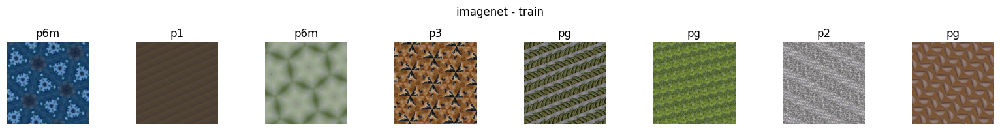

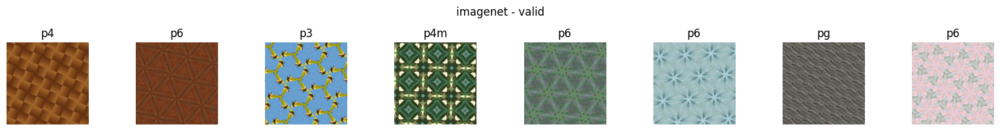

In [6]:
# imagenet
imagenet_ds = hdf5_dataset('/scratch/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning_scratch/datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
_, imagenet_ds = split_train_valid(imagenet_ds, 0.999, seed=42)
print(len(imagenet_ds))
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [ ]:
model = resnet50_(in_channels=3, n_classes=17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,4,5,6,7,9])
device = torch.device('cuda:3')
# model

In [ ]:
config = {'dataset': '10k datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09022024-resnet50-dataset_v5_size-10k-new'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records', save_code=True, config=config)
config = wandb.config

In [ ]:
lr = 1e-3
per_epoch = 20
epoch_start = 0
epochs = 200
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

In [ ]:
trainer.plot_training_metrics()

In [ ]:
wandb.finish()

### 100K dataset

107101


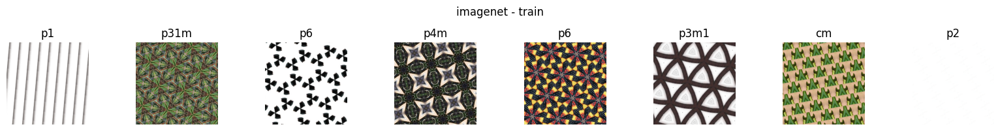

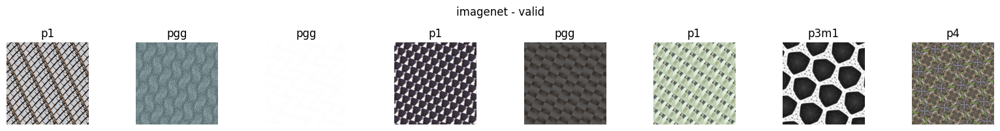

In [ ]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
_, imagenet_ds = split_train_valid(imagenet_ds, 0.99, seed=42)
print(len(imagenet_ds))
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=4)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=4)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [ ]:
model = resnet50_(in_channels=3, n_classes=17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,4,5,6,7,9])
device = torch.device('cuda:3')
# model

torch.Size([2, 17])


In [10]:
config = {'dataset': '100k datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09082024-resnet50-dataset_v5_size-100k'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records', save_code=True, config=config)
config = wandb.config

In [ ]:
lr = 1e-3
per_epoch = 2
epoch_start = 0
epochs = 80
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/80


100%|██████████| 24/24 [00:51<00:00,  2.14s/it]


train_loss: 3.0570, train_accuracy: 6.04%
Epoch 2/80


100%|██████████| 24/24 [00:49<00:00,  2.08s/it]


train_loss: 3.0118, train_accuracy: 6.14%


100%|██████████| 6/6 [00:14<00:00,  2.44s/it]


valid_loss: 2.8453, valid_accuracy: 6.73%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 2.8708, valid_atom_accuracy: 6.15%


100%|██████████| 29/29 [00:43<00:00,  1.51s/it]


valid_noise_loss: 2.9039, valid_noise_accuracy: 4.92%
Model saved at epoch 2
Epoch 3/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 2.9852, train_accuracy: 6.46%
Epoch 4/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 2.9650, train_accuracy: 6.40%


100%|██████████| 6/6 [00:13<00:00,  2.17s/it]


valid_loss: 2.8569, valid_accuracy: 7.16%


100%|██████████| 57/57 [01:15<00:00,  1.32s/it]


valid_atom_loss: 2.8296, valid_atom_accuracy: 2.25%


100%|██████████| 29/29 [00:42<00:00,  1.48s/it]


valid_noise_loss: 5.9790, valid_noise_accuracy: 5.88%
Model saved at epoch 4
Epoch 5/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 2.9373, train_accuracy: 6.54%
Epoch 6/80


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 2.9150, train_accuracy: 6.53%


100%|██████████| 6/6 [00:12<00:00,  2.14s/it]


valid_loss: 2.8367, valid_accuracy: 7.00%


100%|██████████| 57/57 [01:15<00:00,  1.33s/it]


valid_atom_loss: 2.8269, valid_atom_accuracy: 0.64%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 3.1755, valid_noise_accuracy: 10.59%
Model saved at epoch 6
Epoch 7/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 2.8929, train_accuracy: 6.66%
Epoch 8/80


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 2.8814, train_accuracy: 7.06%


100%|██████████| 6/6 [00:12<00:00,  2.14s/it]


valid_loss: 2.8454, valid_accuracy: 8.20%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 2.8097, valid_atom_accuracy: 5.43%


100%|██████████| 29/29 [00:44<00:00,  1.53s/it]


valid_noise_loss: 2.8988, valid_noise_accuracy: 5.89%
Model saved at epoch 8
Epoch 9/80


100%|██████████| 24/24 [00:47<00:00,  1.96s/it]


train_loss: 2.8617, train_accuracy: 7.38%
Epoch 10/80


100%|██████████| 24/24 [00:48<00:00,  2.02s/it]


train_loss: 2.8267, train_accuracy: 8.62%


100%|██████████| 6/6 [00:12<00:00,  2.17s/it]


valid_loss: 2.8321, valid_accuracy: 9.84%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 2.8239, valid_atom_accuracy: 6.11%


100%|██████████| 29/29 [00:41<00:00,  1.43s/it]


valid_noise_loss: 3.7013, valid_noise_accuracy: 5.88%
Model saved at epoch 10
Epoch 11/80


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 2.7812, train_accuracy: 9.70%
Epoch 12/80


100%|██████████| 24/24 [00:46<00:00,  1.95s/it]


train_loss: 2.6758, train_accuracy: 11.83%


100%|██████████| 6/6 [00:12<00:00,  2.13s/it]


valid_loss: 2.8396, valid_accuracy: 8.77%


100%|██████████| 57/57 [01:16<00:00,  1.34s/it]


valid_atom_loss: 2.6385, valid_atom_accuracy: 10.56%


100%|██████████| 29/29 [00:40<00:00,  1.41s/it]


valid_noise_loss: 2.8424, valid_noise_accuracy: 6.23%
Model saved at epoch 12
Epoch 13/80


100%|██████████| 24/24 [00:47<00:00,  2.00s/it]


train_loss: 2.3969, train_accuracy: 19.28%
Epoch 14/80


100%|██████████| 24/24 [00:46<00:00,  1.95s/it]


train_loss: 1.9645, train_accuracy: 32.10%


100%|██████████| 6/6 [00:12<00:00,  2.15s/it]


valid_loss: 1.8899, valid_accuracy: 34.15%


100%|██████████| 57/57 [01:17<00:00,  1.35s/it]


valid_atom_loss: 2.2529, valid_atom_accuracy: 24.02%


100%|██████████| 29/29 [00:41<00:00,  1.42s/it]


valid_noise_loss: 3.2147, valid_noise_accuracy: 7.94%
Model saved at epoch 14
Epoch 15/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 1.5921, train_accuracy: 42.78%
Epoch 16/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 1.3321, train_accuracy: 50.34%


100%|██████████| 6/6 [00:12<00:00,  2.16s/it]


valid_loss: 1.2639, valid_accuracy: 52.22%


100%|██████████| 57/57 [01:16<00:00,  1.34s/it]


valid_atom_loss: 1.9583, valid_atom_accuracy: 34.98%


100%|██████████| 29/29 [00:41<00:00,  1.42s/it]


valid_noise_loss: 3.2544, valid_noise_accuracy: 10.90%
Model saved at epoch 16
Epoch 17/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 1.1388, train_accuracy: 57.11%
Epoch 18/80


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.9967, train_accuracy: 62.87%


100%|██████████| 6/6 [00:12<00:00,  2.13s/it]


valid_loss: 1.3045, valid_accuracy: 51.01%


100%|██████████| 57/57 [01:16<00:00,  1.34s/it]


valid_atom_loss: 1.7739, valid_atom_accuracy: 40.88%


100%|██████████| 29/29 [00:41<00:00,  1.43s/it]


valid_noise_loss: 3.3827, valid_noise_accuracy: 12.88%
Model saved at epoch 18
Epoch 19/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.8628, train_accuracy: 68.56%
Epoch 20/80


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.7661, train_accuracy: 72.20%


100%|██████████| 6/6 [00:12<00:00,  2.14s/it]


valid_loss: 0.9413, valid_accuracy: 63.47%


100%|██████████| 57/57 [01:15<00:00,  1.32s/it]


valid_atom_loss: 2.1205, valid_atom_accuracy: 44.07%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 3.5009, valid_noise_accuracy: 12.66%
Model saved at epoch 20
Epoch 21/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.6742, train_accuracy: 75.94%
Epoch 22/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.6170, train_accuracy: 77.99%


100%|██████████| 6/6 [00:12<00:00,  2.15s/it]


valid_loss: 0.8594, valid_accuracy: 68.35%


100%|██████████| 57/57 [01:15<00:00,  1.33s/it]


valid_atom_loss: 2.0882, valid_atom_accuracy: 39.59%


100%|██████████| 29/29 [00:43<00:00,  1.52s/it]


valid_noise_loss: 2.8935, valid_noise_accuracy: 18.48%
Model saved at epoch 22
Epoch 23/80


100%|██████████| 24/24 [00:47<00:00,  1.97s/it]


train_loss: 0.5532, train_accuracy: 80.58%
Epoch 24/80


100%|██████████| 24/24 [00:47<00:00,  1.96s/it]


train_loss: 0.5020, train_accuracy: 82.29%


100%|██████████| 6/6 [00:13<00:00,  2.17s/it]


valid_loss: 0.7129, valid_accuracy: 74.05%


100%|██████████| 57/57 [01:16<00:00,  1.34s/it]


valid_atom_loss: 1.9886, valid_atom_accuracy: 48.98%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 3.8706, valid_noise_accuracy: 14.05%
Model saved at epoch 24
Epoch 25/80


100%|██████████| 24/24 [00:48<00:00,  2.02s/it]


train_loss: 0.4516, train_accuracy: 84.17%
Epoch 26/80


100%|██████████| 24/24 [00:48<00:00,  2.04s/it]


train_loss: 0.4180, train_accuracy: 85.48%


100%|██████████| 6/6 [00:13<00:00,  2.28s/it]


valid_loss: 0.9507, valid_accuracy: 69.32%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 1.8089, valid_atom_accuracy: 50.47%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 3.3597, valid_noise_accuracy: 18.31%
Model saved at epoch 26
Epoch 27/80


100%|██████████| 24/24 [00:46<00:00,  1.96s/it]


train_loss: 0.3811, train_accuracy: 86.94%
Epoch 28/80


100%|██████████| 24/24 [00:47<00:00,  1.99s/it]


train_loss: 0.3678, train_accuracy: 87.19%


100%|██████████| 6/6 [00:13<00:00,  2.17s/it]


valid_loss: 0.8503, valid_accuracy: 69.83%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 2.2100, valid_atom_accuracy: 47.65%


100%|██████████| 29/29 [00:43<00:00,  1.51s/it]


valid_noise_loss: 3.9101, valid_noise_accuracy: 12.43%
Model saved at epoch 28
Epoch 29/80


100%|██████████| 24/24 [00:46<00:00,  1.95s/it]


train_loss: 0.3207, train_accuracy: 89.03%
Epoch 30/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.2919, train_accuracy: 90.06%


100%|██████████| 6/6 [00:12<00:00,  2.14s/it]


valid_loss: 0.6698, valid_accuracy: 77.53%


100%|██████████| 57/57 [01:19<00:00,  1.40s/it]


valid_atom_loss: 1.9633, valid_atom_accuracy: 50.24%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 3.2358, valid_noise_accuracy: 19.67%
Model saved at epoch 30
Epoch 31/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.2697, train_accuracy: 90.84%
Epoch 32/80


100%|██████████| 24/24 [00:48<00:00,  2.01s/it]


train_loss: 0.2388, train_accuracy: 92.01%


100%|██████████| 6/6 [00:12<00:00,  2.16s/it]


valid_loss: 0.7768, valid_accuracy: 74.56%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 2.1303, valid_atom_accuracy: 52.04%


100%|██████████| 29/29 [00:41<00:00,  1.43s/it]


valid_noise_loss: 3.7049, valid_noise_accuracy: 16.60%
Model saved at epoch 32
Epoch 33/80


100%|██████████| 24/24 [00:48<00:00,  2.01s/it]


train_loss: 0.2136, train_accuracy: 92.96%
Epoch 34/80


100%|██████████| 24/24 [00:46<00:00,  1.92s/it]


train_loss: 0.2162, train_accuracy: 92.76%


100%|██████████| 6/6 [00:13<00:00,  2.23s/it]


valid_loss: 0.8713, valid_accuracy: 76.76%


100%|██████████| 57/57 [01:17<00:00,  1.37s/it]


valid_atom_loss: 2.9000, valid_atom_accuracy: 47.31%


100%|██████████| 29/29 [00:43<00:00,  1.48s/it]


valid_noise_loss: 3.9753, valid_noise_accuracy: 17.80%
Model saved at epoch 34
Epoch 35/80


100%|██████████| 24/24 [00:47<00:00,  1.96s/it]


train_loss: 0.1919, train_accuracy: 93.59%
Epoch 36/80


100%|██████████| 24/24 [00:47<00:00,  1.96s/it]


train_loss: 0.1745, train_accuracy: 94.29%


100%|██████████| 6/6 [00:12<00:00,  2.17s/it]


valid_loss: 0.8262, valid_accuracy: 76.56%


100%|██████████| 57/57 [01:19<00:00,  1.40s/it]


valid_atom_loss: 2.3714, valid_atom_accuracy: 51.50%


100%|██████████| 29/29 [00:42<00:00,  1.47s/it]


valid_noise_loss: 3.4745, valid_noise_accuracy: 17.43%
Model saved at epoch 36
Epoch 37/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.1578, train_accuracy: 94.92%
Epoch 38/80


100%|██████████| 24/24 [00:47<00:00,  1.98s/it]


train_loss: 0.1600, train_accuracy: 94.93%


100%|██████████| 6/6 [00:12<00:00,  2.14s/it]


valid_loss: 0.7815, valid_accuracy: 79.34%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 3.1844, valid_atom_accuracy: 48.57%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 4.2031, valid_noise_accuracy: 17.14%
Model saved at epoch 38
Epoch 39/80


100%|██████████| 24/24 [00:48<00:00,  2.00s/it]


train_loss: 0.1398, train_accuracy: 95.57%
Epoch 40/80


100%|██████████| 24/24 [00:46<00:00,  1.96s/it]


train_loss: 0.1101, train_accuracy: 96.68%


100%|██████████| 6/6 [00:13<00:00,  2.18s/it]


valid_loss: 0.8619, valid_accuracy: 78.80%


100%|██████████| 57/57 [01:17<00:00,  1.37s/it]


valid_atom_loss: 3.0755, valid_atom_accuracy: 48.30%


100%|██████████| 29/29 [00:43<00:00,  1.50s/it]


valid_noise_loss: 4.9081, valid_noise_accuracy: 14.72%
Model saved at epoch 40
Epoch 41/80


100%|██████████| 24/24 [00:49<00:00,  2.07s/it]


train_loss: 0.1067, train_accuracy: 96.78%
Epoch 42/80


100%|██████████| 24/24 [00:47<00:00,  1.99s/it]


train_loss: 0.0954, train_accuracy: 97.20%


100%|██████████| 6/6 [00:13<00:00,  2.18s/it]


valid_loss: 0.8423, valid_accuracy: 77.55%


100%|██████████| 57/57 [01:17<00:00,  1.37s/it]


valid_atom_loss: 2.2447, valid_atom_accuracy: 53.19%


100%|██████████| 29/29 [00:43<00:00,  1.49s/it]


valid_noise_loss: 3.6001, valid_noise_accuracy: 19.95%
Model saved at epoch 42
Epoch 43/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0793, train_accuracy: 97.81%
Epoch 44/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0728, train_accuracy: 97.95%


100%|██████████| 6/6 [00:12<00:00,  2.14s/it]


valid_loss: 0.8739, valid_accuracy: 79.75%


100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 3.6782, valid_atom_accuracy: 45.67%


100%|██████████| 29/29 [00:43<00:00,  1.50s/it]


valid_noise_loss: 4.2180, valid_noise_accuracy: 18.14%
Model saved at epoch 44
Epoch 45/80


100%|██████████| 24/24 [00:47<00:00,  1.98s/it]


train_loss: 0.0864, train_accuracy: 97.46%
Epoch 46/80


100%|██████████| 24/24 [00:47<00:00,  1.96s/it]


train_loss: 0.0701, train_accuracy: 97.99%


100%|██████████| 6/6 [00:12<00:00,  2.16s/it]


valid_loss: 0.7700, valid_accuracy: 80.78%


100%|██████████| 57/57 [01:16<00:00,  1.35s/it]


valid_atom_loss: 2.9677, valid_atom_accuracy: 51.89%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 4.1924, valid_noise_accuracy: 20.08%
Model saved at epoch 46
Epoch 47/80


100%|██████████| 24/24 [00:47<00:00,  1.96s/it]


train_loss: 0.0585, train_accuracy: 98.41%
Epoch 48/80


100%|██████████| 24/24 [00:46<00:00,  1.96s/it]


train_loss: 0.0447, train_accuracy: 98.95%


100%|██████████| 6/6 [00:12<00:00,  2.16s/it]


valid_loss: 0.7993, valid_accuracy: 80.59%


100%|██████████| 57/57 [01:17<00:00,  1.35s/it]


valid_atom_loss: 2.9952, valid_atom_accuracy: 51.64%


100%|██████████| 29/29 [00:42<00:00,  1.48s/it]


valid_noise_loss: 4.2634, valid_noise_accuracy: 19.46%
Model saved at epoch 48
Epoch 49/80


100%|██████████| 24/24 [00:48<00:00,  2.00s/it]


train_loss: 0.0346, train_accuracy: 99.20%
Epoch 50/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0313, train_accuracy: 99.31%


100%|██████████| 6/6 [00:12<00:00,  2.15s/it]


valid_loss: 0.8666, valid_accuracy: 80.01%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 2.9775, valid_atom_accuracy: 50.47%


100%|██████████| 29/29 [00:43<00:00,  1.51s/it]


valid_noise_loss: 4.1054, valid_noise_accuracy: 19.46%
Model saved at epoch 50
Epoch 51/80


100%|██████████| 24/24 [00:47<00:00,  1.97s/it]


train_loss: 0.0302, train_accuracy: 99.32%
Epoch 52/80


100%|██████████| 24/24 [00:47<00:00,  1.96s/it]


train_loss: 0.0304, train_accuracy: 99.28%


100%|██████████| 6/6 [00:13<00:00,  2.17s/it]


valid_loss: 0.8189, valid_accuracy: 82.05%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 3.0065, valid_atom_accuracy: 52.30%


100%|██████████| 29/29 [00:42<00:00,  1.47s/it]


valid_noise_loss: 4.5298, valid_noise_accuracy: 18.15%
Model saved at epoch 52
Epoch 53/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0259, train_accuracy: 99.44%
Epoch 54/80


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0194, train_accuracy: 99.63%


100%|██████████| 6/6 [00:13<00:00,  2.20s/it]


valid_loss: 0.8765, valid_accuracy: 81.63%


100%|██████████| 57/57 [01:15<00:00,  1.33s/it]


valid_atom_loss: 3.1678, valid_atom_accuracy: 52.31%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 4.3851, valid_noise_accuracy: 19.65%
Model saved at epoch 54
Epoch 55/80


100%|██████████| 24/24 [00:46<00:00,  1.95s/it]


train_loss: 0.0160, train_accuracy: 99.73%
Epoch 56/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0137, train_accuracy: 99.79%


100%|██████████| 6/6 [00:12<00:00,  2.16s/it]


valid_loss: 0.8236, valid_accuracy: 83.09%


100%|██████████| 57/57 [01:15<00:00,  1.33s/it]


valid_atom_loss: 3.1979, valid_atom_accuracy: 52.42%


100%|██████████| 29/29 [00:40<00:00,  1.41s/it]


valid_noise_loss: 4.7017, valid_noise_accuracy: 19.62%
Model saved at epoch 56
Epoch 57/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0118, train_accuracy: 99.84%
Epoch 58/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0104, train_accuracy: 99.87%


100%|██████████| 6/6 [00:12<00:00,  2.14s/it]


valid_loss: 0.7907, valid_accuracy: 83.13%


100%|██████████| 57/57 [01:19<00:00,  1.40s/it]


valid_atom_loss: 2.9672, valid_atom_accuracy: 53.83%


100%|██████████| 29/29 [00:44<00:00,  1.53s/it]


valid_noise_loss: 4.5509, valid_noise_accuracy: 18.69%
Model saved at epoch 58
Epoch 59/80


100%|██████████| 24/24 [00:46<00:00,  1.96s/it]


train_loss: 0.0098, train_accuracy: 99.88%
Epoch 60/80


100%|██████████| 24/24 [00:48<00:00,  2.02s/it]


train_loss: 0.0100, train_accuracy: 99.87%


100%|██████████| 6/6 [00:13<00:00,  2.22s/it]


valid_loss: 0.7885, valid_accuracy: 83.04%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 3.0447, valid_atom_accuracy: 53.60%


100%|██████████| 29/29 [00:44<00:00,  1.52s/it]


valid_noise_loss: 4.5249, valid_noise_accuracy: 19.28%
Model saved at epoch 60
Epoch 61/80


100%|██████████| 24/24 [00:48<00:00,  2.02s/it]


train_loss: 0.0094, train_accuracy: 99.89%
Epoch 62/80


100%|██████████| 24/24 [00:47<00:00,  1.98s/it]


train_loss: 0.0089, train_accuracy: 99.89%


100%|██████████| 6/6 [00:12<00:00,  2.16s/it]


valid_loss: 0.8165, valid_accuracy: 83.62%


100%|██████████| 57/57 [01:17<00:00,  1.35s/it]


valid_atom_loss: 3.2866, valid_atom_accuracy: 52.65%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 5.2774, valid_noise_accuracy: 17.29%
Model saved at epoch 62
Epoch 63/80


100%|██████████| 24/24 [00:47<00:00,  1.98s/it]


train_loss: 0.0082, train_accuracy: 99.91%
Epoch 64/80


100%|██████████| 24/24 [00:48<00:00,  2.01s/it]


train_loss: 0.0074, train_accuracy: 99.93%


100%|██████████| 6/6 [00:13<00:00,  2.21s/it]


valid_loss: 0.8150, valid_accuracy: 83.70%


100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 3.1527, valid_atom_accuracy: 53.41%


100%|██████████| 29/29 [00:43<00:00,  1.48s/it]


valid_noise_loss: 4.4552, valid_noise_accuracy: 20.11%
Model saved at epoch 64
Epoch 65/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0076, train_accuracy: 99.93%
Epoch 66/80


100%|██████████| 24/24 [00:46<00:00,  1.96s/it]


train_loss: 0.0074, train_accuracy: 99.93%


100%|██████████| 6/6 [00:12<00:00,  2.15s/it]


valid_loss: 0.8048, valid_accuracy: 83.76%


100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 3.1935, valid_atom_accuracy: 53.48%


100%|██████████| 29/29 [00:45<00:00,  1.57s/it]


valid_noise_loss: 4.5193, valid_noise_accuracy: 19.90%
Model saved at epoch 66
Epoch 67/80


100%|██████████| 24/24 [00:48<00:00,  2.00s/it]


train_loss: 0.0072, train_accuracy: 99.93%
Epoch 68/80


100%|██████████| 24/24 [00:47<00:00,  1.98s/it]


train_loss: 0.0072, train_accuracy: 99.93%


100%|██████████| 6/6 [00:13<00:00,  2.17s/it]


valid_loss: 0.8021, valid_accuracy: 83.74%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 3.1437, valid_atom_accuracy: 53.74%


100%|██████████| 29/29 [00:43<00:00,  1.49s/it]


valid_noise_loss: 4.5048, valid_noise_accuracy: 19.99%
Model saved at epoch 68
Epoch 69/80


100%|██████████| 24/24 [00:47<00:00,  1.96s/it]


train_loss: 0.0069, train_accuracy: 99.93%
Epoch 70/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0070, train_accuracy: 99.93%


100%|██████████| 6/6 [00:12<00:00,  2.14s/it]


valid_loss: 0.8113, valid_accuracy: 83.81%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 3.1536, valid_atom_accuracy: 53.81%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 4.6058, valid_noise_accuracy: 19.70%
Model saved at epoch 70
Epoch 71/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0066, train_accuracy: 99.93%
Epoch 72/80


100%|██████████| 24/24 [00:46<00:00,  1.95s/it]


train_loss: 0.0065, train_accuracy: 99.94%


100%|██████████| 6/6 [00:13<00:00,  2.21s/it]


valid_loss: 0.8049, valid_accuracy: 83.77%


100%|██████████| 57/57 [01:19<00:00,  1.40s/it]


valid_atom_loss: 3.1480, valid_atom_accuracy: 53.90%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 4.5730, valid_noise_accuracy: 19.84%
Model saved at epoch 72
Epoch 73/80


100%|██████████| 24/24 [00:47<00:00,  2.00s/it]


train_loss: 0.0065, train_accuracy: 99.94%
Epoch 74/80


100%|██████████| 24/24 [00:48<00:00,  2.04s/it]


train_loss: 0.0066, train_accuracy: 99.94%


100%|██████████| 6/6 [00:14<00:00,  2.43s/it]


valid_loss: 0.8094, valid_accuracy: 83.79%


100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 3.2050, valid_atom_accuracy: 53.54%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 4.7101, valid_noise_accuracy: 19.30%
Model saved at epoch 74
Epoch 75/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0066, train_accuracy: 99.94%
Epoch 76/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0066, train_accuracy: 99.94%


100%|██████████| 6/6 [00:12<00:00,  2.16s/it]


valid_loss: 0.8101, valid_accuracy: 83.78%


100%|██████████| 57/57 [01:15<00:00,  1.33s/it]


valid_atom_loss: 3.1764, valid_atom_accuracy: 53.71%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 4.6362, valid_noise_accuracy: 19.63%
Model saved at epoch 76
Epoch 77/80


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0065, train_accuracy: 99.93%
Epoch 78/80


100%|██████████| 24/24 [00:47<00:00,  1.98s/it]


train_loss: 0.0063, train_accuracy: 99.94%


100%|██████████| 6/6 [00:12<00:00,  2.15s/it]


valid_loss: 0.8114, valid_accuracy: 83.81%


100%|██████████| 57/57 [01:21<00:00,  1.43s/it]


valid_atom_loss: 3.1417, valid_atom_accuracy: 53.99%


100%|██████████| 29/29 [00:44<00:00,  1.52s/it]


valid_noise_loss: 4.6601, valid_noise_accuracy: 19.33%
Model saved at epoch 78
Epoch 79/80


100%|██████████| 24/24 [00:48<00:00,  2.01s/it]


train_loss: 0.0062, train_accuracy: 99.95%
Epoch 80/80


100%|██████████| 24/24 [00:49<00:00,  2.05s/it]


train_loss: 0.0065, train_accuracy: 99.94%


100%|██████████| 6/6 [00:13<00:00,  2.22s/it]


valid_loss: 0.8124, valid_accuracy: 83.85%


100%|██████████| 57/57 [01:17<00:00,  1.35s/it]


valid_atom_loss: 3.2046, valid_atom_accuracy: 53.60%


100%|██████████| 29/29 [00:43<00:00,  1.50s/it]


valid_noise_loss: 4.7089, valid_noise_accuracy: 19.29%
Model saved at epoch 80


In [11]:
lr = 1e-3
per_epoch = 2
epoch_start = 80
epochs = 160
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 81/240


  0%|          | 0/24 [00:00<?, ?it/s]

100%|██████████| 24/24 [00:47<00:00,  1.98s/it]


train_loss: 0.0079, train_accuracy: 99.91%
Epoch 82/240


100%|██████████| 24/24 [00:48<00:00,  2.01s/it]


train_loss: 0.0072, train_accuracy: 99.92%


100%|██████████| 6/6 [00:13<00:00,  2.25s/it]


valid_loss: 0.8267, valid_accuracy: 83.23%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 3.2100, valid_atom_accuracy: 53.69%


100%|██████████| 29/29 [00:40<00:00,  1.39s/it]


valid_noise_loss: 4.7117, valid_noise_accuracy: 19.06%
Model saved at epoch 82
Epoch 83/240


100%|██████████| 24/24 [00:46<00:00,  1.92s/it]


train_loss: 0.0074, train_accuracy: 99.91%
Epoch 84/240


100%|██████████| 24/24 [00:45<00:00,  1.91s/it]


train_loss: 0.0071, train_accuracy: 99.91%


100%|██████████| 6/6 [00:12<00:00,  2.06s/it]


valid_loss: 0.8305, valid_accuracy: 83.56%


100%|██████████| 57/57 [01:17<00:00,  1.35s/it]


valid_atom_loss: 3.0519, valid_atom_accuracy: 55.00%


100%|██████████| 29/29 [00:42<00:00,  1.48s/it]


valid_noise_loss: 4.4415, valid_noise_accuracy: 21.21%
Model saved at epoch 84
Epoch 85/240


100%|██████████| 24/24 [00:46<00:00,  1.92s/it]


train_loss: 0.0070, train_accuracy: 99.91%
Epoch 86/240


100%|██████████| 24/24 [00:48<00:00,  2.01s/it]


train_loss: 0.0079, train_accuracy: 99.87%


100%|██████████| 6/6 [00:14<00:00,  2.47s/it]


valid_loss: 0.8622, valid_accuracy: 83.05%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 3.2760, valid_atom_accuracy: 53.41%


100%|██████████| 29/29 [00:41<00:00,  1.43s/it]


valid_noise_loss: 4.5568, valid_noise_accuracy: 20.94%
Model saved at epoch 86
Epoch 87/240


100%|██████████| 24/24 [00:47<00:00,  1.97s/it]


train_loss: 0.0095, train_accuracy: 99.84%
Epoch 88/240


100%|██████████| 24/24 [00:48<00:00,  2.01s/it]


train_loss: 0.0121, train_accuracy: 99.75%


100%|██████████| 6/6 [00:14<00:00,  2.37s/it]


valid_loss: 0.9356, valid_accuracy: 81.98%


100%|██████████| 57/57 [01:21<00:00,  1.44s/it]


valid_atom_loss: 3.1196, valid_atom_accuracy: 54.30%


100%|██████████| 29/29 [00:41<00:00,  1.42s/it]


valid_noise_loss: 4.6272, valid_noise_accuracy: 20.29%
Model saved at epoch 88
Epoch 89/240


100%|██████████| 24/24 [00:48<00:00,  2.01s/it]


train_loss: 0.0197, train_accuracy: 99.51%
Epoch 90/240


100%|██████████| 24/24 [00:48<00:00,  2.04s/it]


train_loss: 0.0255, train_accuracy: 99.28%


100%|██████████| 6/6 [00:12<00:00,  2.06s/it]


valid_loss: 1.0079, valid_accuracy: 81.37%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 4.0731, valid_atom_accuracy: 49.11%


100%|██████████| 29/29 [00:41<00:00,  1.43s/it]


valid_noise_loss: 5.2299, valid_noise_accuracy: 17.75%
Model saved at epoch 90
Epoch 91/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0272, train_accuracy: 99.27%
Epoch 92/240


100%|██████████| 24/24 [00:46<00:00,  1.92s/it]


train_loss: 0.0273, train_accuracy: 99.27%


100%|██████████| 6/6 [00:13<00:00,  2.19s/it]


valid_loss: 1.1160, valid_accuracy: 80.52%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 4.1430, valid_atom_accuracy: 50.45%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 5.2972, valid_noise_accuracy: 20.44%
Model saved at epoch 92
Epoch 93/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0322, train_accuracy: 99.10%
Epoch 94/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0384, train_accuracy: 98.90%


100%|██████████| 6/6 [00:12<00:00,  2.13s/it]


valid_loss: 0.9905, valid_accuracy: 80.51%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 3.1947, valid_atom_accuracy: 50.90%


100%|██████████| 29/29 [00:43<00:00,  1.49s/it]


valid_noise_loss: 4.4895, valid_noise_accuracy: 21.07%
Model saved at epoch 94
Epoch 95/240


100%|██████████| 24/24 [00:46<00:00,  1.92s/it]


train_loss: 0.0584, train_accuracy: 98.21%
Epoch 96/240


100%|██████████| 24/24 [00:45<00:00,  1.91s/it]


train_loss: 0.0631, train_accuracy: 98.13%


100%|██████████| 6/6 [00:12<00:00,  2.12s/it]


valid_loss: 0.9854, valid_accuracy: 80.59%


100%|██████████| 57/57 [01:16<00:00,  1.35s/it]


valid_atom_loss: 3.9118, valid_atom_accuracy: 50.22%


100%|██████████| 29/29 [00:43<00:00,  1.48s/it]


valid_noise_loss: 5.9682, valid_noise_accuracy: 16.12%
Model saved at epoch 96
Epoch 97/240


100%|██████████| 24/24 [00:46<00:00,  1.92s/it]


train_loss: 0.0580, train_accuracy: 98.25%
Epoch 98/240


100%|██████████| 24/24 [00:46<00:00,  1.92s/it]


train_loss: 0.0628, train_accuracy: 98.16%


100%|██████████| 6/6 [00:12<00:00,  2.08s/it]


valid_loss: 0.9274, valid_accuracy: 80.78%


100%|██████████| 57/57 [01:16<00:00,  1.34s/it]


valid_atom_loss: 3.7698, valid_atom_accuracy: 51.12%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 5.2265, valid_noise_accuracy: 17.37%
Model saved at epoch 98
Epoch 99/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0711, train_accuracy: 97.84%
Epoch 100/240


100%|██████████| 24/24 [00:45<00:00,  1.91s/it]


train_loss: 0.0721, train_accuracy: 97.84%


100%|██████████| 6/6 [00:12<00:00,  2.06s/it]


valid_loss: 1.0535, valid_accuracy: 79.47%


100%|██████████| 57/57 [01:21<00:00,  1.42s/it]


valid_atom_loss: 3.2051, valid_atom_accuracy: 52.95%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 4.2613, valid_noise_accuracy: 23.32%
Model saved at epoch 100
Epoch 101/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0856, train_accuracy: 97.35%
Epoch 102/240


100%|██████████| 24/24 [00:47<00:00,  1.98s/it]


train_loss: 0.0876, train_accuracy: 97.28%


100%|██████████| 6/6 [00:14<00:00,  2.37s/it]


valid_loss: 0.8727, valid_accuracy: 81.51%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 2.7918, valid_atom_accuracy: 53.25%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 5.0616, valid_noise_accuracy: 19.64%
Model saved at epoch 102
Epoch 103/240


100%|██████████| 24/24 [00:47<00:00,  1.99s/it]


train_loss: 0.0737, train_accuracy: 97.72%
Epoch 104/240


100%|██████████| 24/24 [00:48<00:00,  2.03s/it]


train_loss: 0.0750, train_accuracy: 97.67%


100%|██████████| 6/6 [00:13<00:00,  2.28s/it]


valid_loss: 0.9191, valid_accuracy: 79.93%


100%|██████████| 57/57 [01:21<00:00,  1.43s/it]


valid_atom_loss: 3.2532, valid_atom_accuracy: 51.11%


100%|██████████| 29/29 [00:42<00:00,  1.47s/it]


valid_noise_loss: 4.6047, valid_noise_accuracy: 21.29%
Model saved at epoch 104
Epoch 105/240


100%|██████████| 24/24 [00:47<00:00,  1.96s/it]


train_loss: 0.0893, train_accuracy: 97.25%
Epoch 106/240


100%|██████████| 24/24 [00:46<00:00,  1.92s/it]


train_loss: 0.0978, train_accuracy: 96.93%


100%|██████████| 6/6 [00:12<00:00,  2.15s/it]


valid_loss: 0.8814, valid_accuracy: 78.36%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 2.9000, valid_atom_accuracy: 50.00%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 4.4087, valid_noise_accuracy: 18.59%
Model saved at epoch 106
Epoch 107/240


100%|██████████| 24/24 [00:46<00:00,  1.92s/it]


train_loss: 0.0895, train_accuracy: 97.11%
Epoch 108/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0901, train_accuracy: 97.20%


100%|██████████| 6/6 [00:12<00:00,  2.06s/it]


valid_loss: 0.8973, valid_accuracy: 79.92%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 3.2187, valid_atom_accuracy: 50.23%


100%|██████████| 29/29 [00:42<00:00,  1.47s/it]


valid_noise_loss: 5.1809, valid_noise_accuracy: 16.70%
Model saved at epoch 108
Epoch 109/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0877, train_accuracy: 97.27%
Epoch 110/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0939, train_accuracy: 97.06%


100%|██████████| 6/6 [00:13<00:00,  2.31s/it]


valid_loss: 0.8150, valid_accuracy: 81.82%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 3.9615, valid_atom_accuracy: 47.26%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 3.8567, valid_noise_accuracy: 24.15%
Model saved at epoch 110
Epoch 111/240


100%|██████████| 24/24 [00:47<00:00,  1.98s/it]


train_loss: 0.0894, train_accuracy: 97.19%
Epoch 112/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.1035, train_accuracy: 96.76%


100%|██████████| 6/6 [00:14<00:00,  2.34s/it]


valid_loss: 0.9487, valid_accuracy: 78.85%


100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 2.4254, valid_atom_accuracy: 51.85%


100%|██████████| 29/29 [00:44<00:00,  1.53s/it]


valid_noise_loss: 5.0654, valid_noise_accuracy: 19.35%
Model saved at epoch 112
Epoch 113/240


100%|██████████| 24/24 [00:49<00:00,  2.06s/it]


train_loss: 0.0884, train_accuracy: 97.22%
Epoch 114/240


100%|██████████| 24/24 [00:48<00:00,  2.01s/it]


train_loss: 0.0768, train_accuracy: 97.61%


100%|██████████| 6/6 [00:14<00:00,  2.37s/it]


valid_loss: 0.8222, valid_accuracy: 80.49%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 3.0272, valid_atom_accuracy: 51.78%


100%|██████████| 29/29 [00:41<00:00,  1.43s/it]


valid_noise_loss: 3.4676, valid_noise_accuracy: 26.28%
Model saved at epoch 114
Epoch 115/240


100%|██████████| 24/24 [00:48<00:00,  2.02s/it]


train_loss: 0.0656, train_accuracy: 97.96%
Epoch 116/240


100%|██████████| 24/24 [00:48<00:00,  2.01s/it]


train_loss: 0.0784, train_accuracy: 97.57%


100%|██████████| 6/6 [00:14<00:00,  2.39s/it]


valid_loss: 1.0101, valid_accuracy: 78.36%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 2.9948, valid_atom_accuracy: 51.01%


100%|██████████| 29/29 [00:44<00:00,  1.54s/it]


valid_noise_loss: 4.3603, valid_noise_accuracy: 22.78%
Model saved at epoch 116
Epoch 117/240


100%|██████████| 24/24 [00:45<00:00,  1.91s/it]


train_loss: 0.0805, train_accuracy: 97.46%
Epoch 118/240


100%|██████████| 24/24 [00:45<00:00,  1.91s/it]


train_loss: 0.0790, train_accuracy: 97.48%


100%|██████████| 6/6 [00:12<00:00,  2.11s/it]


valid_loss: 0.9802, valid_accuracy: 80.62%


100%|██████████| 57/57 [01:17<00:00,  1.37s/it]


valid_atom_loss: 3.4878, valid_atom_accuracy: 51.28%


100%|██████████| 29/29 [00:42<00:00,  1.47s/it]


valid_noise_loss: 4.3074, valid_noise_accuracy: 24.61%
Model saved at epoch 118
Epoch 119/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0746, train_accuracy: 97.71%
Epoch 120/240


100%|██████████| 24/24 [00:45<00:00,  1.91s/it]


train_loss: 0.0739, train_accuracy: 97.67%


100%|██████████| 6/6 [00:12<00:00,  2.16s/it]


valid_loss: 0.7709, valid_accuracy: 82.12%


100%|██████████| 57/57 [01:21<00:00,  1.43s/it]


valid_atom_loss: 3.1248, valid_atom_accuracy: 54.77%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 3.9893, valid_noise_accuracy: 26.12%
Model saved at epoch 120
Epoch 121/240


100%|██████████| 24/24 [00:48<00:00,  2.00s/it]


train_loss: 0.0709, train_accuracy: 97.82%
Epoch 122/240


100%|██████████| 24/24 [00:49<00:00,  2.04s/it]


train_loss: 0.0721, train_accuracy: 97.76%


100%|██████████| 6/6 [00:12<00:00,  2.06s/it]


valid_loss: 0.7211, valid_accuracy: 82.59%


100%|██████████| 57/57 [01:19<00:00,  1.40s/it]


valid_atom_loss: 2.5577, valid_atom_accuracy: 54.04%


100%|██████████| 29/29 [00:41<00:00,  1.42s/it]


valid_noise_loss: 4.2157, valid_noise_accuracy: 25.33%
Model saved at epoch 122
Epoch 123/240


100%|██████████| 24/24 [00:49<00:00,  2.05s/it]


train_loss: 0.0619, train_accuracy: 98.07%
Epoch 124/240


100%|██████████| 24/24 [00:46<00:00,  1.95s/it]


train_loss: 0.0565, train_accuracy: 98.23%


100%|██████████| 6/6 [00:14<00:00,  2.35s/it]


valid_loss: 0.8109, valid_accuracy: 83.17%


100%|██████████| 57/57 [01:17<00:00,  1.37s/it]


valid_atom_loss: 3.4883, valid_atom_accuracy: 46.61%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 3.1581, valid_noise_accuracy: 30.15%
Model saved at epoch 124
Epoch 125/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0639, train_accuracy: 98.00%
Epoch 126/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0625, train_accuracy: 98.03%


100%|██████████| 6/6 [00:13<00:00,  2.30s/it]


valid_loss: 1.0776, valid_accuracy: 78.57%


100%|██████████| 57/57 [01:17<00:00,  1.35s/it]


valid_atom_loss: 3.2308, valid_atom_accuracy: 55.29%


100%|██████████| 29/29 [00:40<00:00,  1.40s/it]


valid_noise_loss: 3.4578, valid_noise_accuracy: 28.82%
Model saved at epoch 126
Epoch 127/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0519, train_accuracy: 98.40%
Epoch 128/240


100%|██████████| 24/24 [00:46<00:00,  1.96s/it]


train_loss: 0.0510, train_accuracy: 98.45%


100%|██████████| 6/6 [00:13<00:00,  2.24s/it]


valid_loss: 0.7754, valid_accuracy: 83.09%


100%|██████████| 57/57 [01:14<00:00,  1.31s/it]


valid_atom_loss: 2.9308, valid_atom_accuracy: 53.25%


100%|██████████| 29/29 [00:40<00:00,  1.41s/it]


valid_noise_loss: 3.3389, valid_noise_accuracy: 31.39%
Model saved at epoch 128
Epoch 129/240


100%|██████████| 24/24 [00:46<00:00,  1.92s/it]


train_loss: 0.0605, train_accuracy: 98.16%
Epoch 130/240


100%|██████████| 24/24 [00:46<00:00,  1.92s/it]


train_loss: 0.0641, train_accuracy: 98.04%


100%|██████████| 6/6 [00:13<00:00,  2.22s/it]


valid_loss: 0.8972, valid_accuracy: 81.67%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 3.0945, valid_atom_accuracy: 51.54%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 4.2468, valid_noise_accuracy: 27.22%
Model saved at epoch 130
Epoch 131/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0483, train_accuracy: 98.56%
Epoch 132/240


100%|██████████| 24/24 [00:48<00:00,  2.00s/it]


train_loss: 0.0350, train_accuracy: 98.94%


100%|██████████| 6/6 [00:12<00:00,  2.14s/it]


valid_loss: 0.7733, valid_accuracy: 83.87%


100%|██████████| 57/57 [01:19<00:00,  1.40s/it]


valid_atom_loss: 3.3831, valid_atom_accuracy: 49.17%


100%|██████████| 29/29 [00:41<00:00,  1.45s/it]


valid_noise_loss: 3.4836, valid_noise_accuracy: 28.31%
Model saved at epoch 132
Epoch 133/240


100%|██████████| 24/24 [00:46<00:00,  1.92s/it]


train_loss: 0.0321, train_accuracy: 99.02%
Epoch 134/240


100%|██████████| 24/24 [00:45<00:00,  1.91s/it]


train_loss: 0.0331, train_accuracy: 99.00%


100%|██████████| 6/6 [00:13<00:00,  2.18s/it]


valid_loss: 0.8327, valid_accuracy: 83.47%


100%|██████████| 57/57 [01:16<00:00,  1.34s/it]


valid_atom_loss: 3.9650, valid_atom_accuracy: 46.72%


100%|██████████| 29/29 [00:40<00:00,  1.41s/it]


valid_noise_loss: 4.0203, valid_noise_accuracy: 30.20%
Model saved at epoch 134
Epoch 135/240


100%|██████████| 24/24 [00:47<00:00,  1.97s/it]


train_loss: 0.0277, train_accuracy: 99.21%
Epoch 136/240


100%|██████████| 24/24 [00:48<00:00,  2.00s/it]


train_loss: 0.0250, train_accuracy: 99.23%


100%|██████████| 6/6 [00:13<00:00,  2.19s/it]


valid_loss: 0.8251, valid_accuracy: 83.76%


100%|██████████| 57/57 [01:20<00:00,  1.42s/it]


valid_atom_loss: 3.2845, valid_atom_accuracy: 51.20%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 3.7163, valid_noise_accuracy: 28.65%
Model saved at epoch 136
Epoch 137/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0275, train_accuracy: 99.18%
Epoch 138/240


100%|██████████| 24/24 [00:47<00:00,  1.96s/it]


train_loss: 0.0303, train_accuracy: 99.12%


100%|██████████| 6/6 [00:15<00:00,  2.56s/it]


valid_loss: 0.8598, valid_accuracy: 83.49%


100%|██████████| 57/57 [01:19<00:00,  1.40s/it]


valid_atom_loss: 3.0513, valid_atom_accuracy: 54.87%


100%|██████████| 29/29 [00:44<00:00,  1.54s/it]


valid_noise_loss: 3.8673, valid_noise_accuracy: 29.30%
Model saved at epoch 138
Epoch 139/240


100%|██████████| 24/24 [00:48<00:00,  2.03s/it]


train_loss: 0.0313, train_accuracy: 99.06%
Epoch 140/240


100%|██████████| 24/24 [00:48<00:00,  2.02s/it]


train_loss: 0.0354, train_accuracy: 98.95%


100%|██████████| 6/6 [00:13<00:00,  2.26s/it]


valid_loss: 0.7931, valid_accuracy: 84.30%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 3.3226, valid_atom_accuracy: 53.18%


100%|██████████| 29/29 [00:42<00:00,  1.47s/it]


valid_noise_loss: 3.5476, valid_noise_accuracy: 31.08%
Model saved at epoch 140
Epoch 141/240


100%|██████████| 24/24 [00:47<00:00,  1.96s/it]


train_loss: 0.0386, train_accuracy: 98.82%
Epoch 142/240


100%|██████████| 24/24 [00:50<00:00,  2.11s/it]


train_loss: 0.0361, train_accuracy: 98.91%


100%|██████████| 6/6 [00:15<00:00,  2.51s/it]


valid_loss: 0.8765, valid_accuracy: 83.61%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 3.9856, valid_atom_accuracy: 50.42%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 5.4876, valid_noise_accuracy: 18.23%
Model saved at epoch 142
Epoch 143/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0328, train_accuracy: 99.02%
Epoch 144/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0310, train_accuracy: 99.08%


100%|██████████| 6/6 [00:13<00:00,  2.33s/it]


valid_loss: 0.7360, valid_accuracy: 84.88%


100%|██████████| 57/57 [01:15<00:00,  1.32s/it]


valid_atom_loss: 2.8481, valid_atom_accuracy: 54.49%


100%|██████████| 29/29 [00:43<00:00,  1.49s/it]


valid_noise_loss: 3.3266, valid_noise_accuracy: 31.44%
Model saved at epoch 144
Epoch 145/240


100%|██████████| 24/24 [00:48<00:00,  2.01s/it]


train_loss: 0.0288, train_accuracy: 99.14%
Epoch 146/240


100%|██████████| 24/24 [00:49<00:00,  2.05s/it]


train_loss: 0.0271, train_accuracy: 99.21%


100%|██████████| 6/6 [00:12<00:00,  2.15s/it]


valid_loss: 0.8202, valid_accuracy: 84.84%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 3.4092, valid_atom_accuracy: 54.67%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 3.6747, valid_noise_accuracy: 31.66%
Model saved at epoch 146
Epoch 147/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0268, train_accuracy: 99.20%
Epoch 148/240


100%|██████████| 24/24 [00:46<00:00,  1.92s/it]


train_loss: 0.0239, train_accuracy: 99.29%


100%|██████████| 6/6 [00:12<00:00,  2.11s/it]


valid_loss: 0.8253, valid_accuracy: 85.07%


100%|██████████| 57/57 [01:16<00:00,  1.34s/it]


valid_atom_loss: 3.5497, valid_atom_accuracy: 53.62%


100%|██████████| 29/29 [00:43<00:00,  1.50s/it]


valid_noise_loss: 3.7570, valid_noise_accuracy: 33.29%
Model saved at epoch 148
Epoch 149/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0218, train_accuracy: 99.33%
Epoch 150/240


100%|██████████| 24/24 [00:47<00:00,  1.99s/it]


train_loss: 0.0220, train_accuracy: 99.34%


100%|██████████| 6/6 [00:12<00:00,  2.15s/it]


valid_loss: 1.0152, valid_accuracy: 82.95%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 4.1671, valid_atom_accuracy: 49.05%


100%|██████████| 29/29 [00:42<00:00,  1.48s/it]


valid_noise_loss: 3.9624, valid_noise_accuracy: 30.78%
Model saved at epoch 150
Epoch 151/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0204, train_accuracy: 99.40%
Epoch 152/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0186, train_accuracy: 99.45%


100%|██████████| 6/6 [00:13<00:00,  2.27s/it]


valid_loss: 0.8721, valid_accuracy: 84.20%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 3.2570, valid_atom_accuracy: 55.58%


100%|██████████| 29/29 [00:44<00:00,  1.53s/it]


valid_noise_loss: 4.3774, valid_noise_accuracy: 28.87%
Model saved at epoch 152
Epoch 153/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0187, train_accuracy: 99.48%
Epoch 154/240


100%|██████████| 24/24 [00:45<00:00,  1.91s/it]


train_loss: 0.0190, train_accuracy: 99.42%


100%|██████████| 6/6 [00:12<00:00,  2.07s/it]


valid_loss: 0.8398, valid_accuracy: 84.96%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 3.4342, valid_atom_accuracy: 53.78%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 4.0952, valid_noise_accuracy: 31.03%
Model saved at epoch 154
Epoch 155/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0163, train_accuracy: 99.52%
Epoch 156/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0171, train_accuracy: 99.51%


100%|██████████| 6/6 [00:13<00:00,  2.20s/it]


valid_loss: 0.7478, valid_accuracy: 86.33%


100%|██████████| 57/57 [01:21<00:00,  1.43s/it]


valid_atom_loss: 3.7574, valid_atom_accuracy: 54.29%


100%|██████████| 29/29 [00:44<00:00,  1.52s/it]


valid_noise_loss: 4.0251, valid_noise_accuracy: 30.46%
Model saved at epoch 156
Epoch 157/240


100%|██████████| 24/24 [00:48<00:00,  2.04s/it]


train_loss: 0.0140, train_accuracy: 99.59%
Epoch 158/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0162, train_accuracy: 99.51%


100%|██████████| 6/6 [00:12<00:00,  2.11s/it]


valid_loss: 0.9099, valid_accuracy: 85.15%


100%|██████████| 57/57 [01:17<00:00,  1.37s/it]


valid_atom_loss: 4.5110, valid_atom_accuracy: 52.29%


100%|██████████| 29/29 [00:40<00:00,  1.40s/it]


valid_noise_loss: 3.6753, valid_noise_accuracy: 35.19%
Model saved at epoch 158
Epoch 159/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0163, train_accuracy: 99.54%
Epoch 160/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0142, train_accuracy: 99.57%


100%|██████████| 6/6 [00:12<00:00,  2.08s/it]


valid_loss: 0.8645, valid_accuracy: 85.39%


100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 4.0777, valid_atom_accuracy: 51.61%


100%|██████████| 29/29 [00:41<00:00,  1.42s/it]


valid_noise_loss: 3.7158, valid_noise_accuracy: 33.94%
Model saved at epoch 160
Epoch 161/240


100%|██████████| 24/24 [00:49<00:00,  2.05s/it]


train_loss: 0.0131, train_accuracy: 99.62%
Epoch 162/240


100%|██████████| 24/24 [00:48<00:00,  2.03s/it]


train_loss: 0.0121, train_accuracy: 99.65%


100%|██████████| 6/6 [00:13<00:00,  2.28s/it]


valid_loss: 0.8930, valid_accuracy: 85.28%


100%|██████████| 57/57 [01:19<00:00,  1.40s/it]


valid_atom_loss: 4.1581, valid_atom_accuracy: 50.76%


100%|██████████| 29/29 [00:44<00:00,  1.53s/it]


valid_noise_loss: 3.8307, valid_noise_accuracy: 33.15%
Model saved at epoch 162
Epoch 163/240


100%|██████████| 24/24 [00:48<00:00,  2.00s/it]


train_loss: 0.0123, train_accuracy: 99.64%
Epoch 164/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0133, train_accuracy: 99.61%


100%|██████████| 6/6 [00:14<00:00,  2.35s/it]


valid_loss: 0.8541, valid_accuracy: 86.19%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 4.0102, valid_atom_accuracy: 52.58%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 4.1269, valid_noise_accuracy: 32.25%
Model saved at epoch 164
Epoch 165/240


100%|██████████| 24/24 [00:48<00:00,  2.03s/it]


train_loss: 0.0123, train_accuracy: 99.66%
Epoch 166/240


100%|██████████| 24/24 [00:48<00:00,  2.01s/it]


train_loss: 0.0116, train_accuracy: 99.68%


100%|██████████| 6/6 [00:12<00:00,  2.13s/it]


valid_loss: 0.8190, valid_accuracy: 86.20%


100%|██████████| 57/57 [01:16<00:00,  1.35s/it]


valid_atom_loss: 3.5365, valid_atom_accuracy: 57.28%


100%|██████████| 29/29 [00:41<00:00,  1.43s/it]


valid_noise_loss: 4.3647, valid_noise_accuracy: 29.74%
Model saved at epoch 166
Epoch 167/240


100%|██████████| 24/24 [00:45<00:00,  1.92s/it]


train_loss: 0.0112, train_accuracy: 99.69%
Epoch 168/240


100%|██████████| 24/24 [00:46<00:00,  1.95s/it]


train_loss: 0.0112, train_accuracy: 99.67%


100%|██████████| 6/6 [00:14<00:00,  2.35s/it]


valid_loss: 0.9430, valid_accuracy: 85.47%


100%|██████████| 57/57 [01:16<00:00,  1.35s/it]


valid_atom_loss: 4.2405, valid_atom_accuracy: 52.44%


100%|██████████| 29/29 [00:42<00:00,  1.47s/it]


valid_noise_loss: 4.4275, valid_noise_accuracy: 31.77%
Model saved at epoch 168
Epoch 169/240


100%|██████████| 24/24 [00:48<00:00,  2.02s/it]


train_loss: 0.0101, train_accuracy: 99.70%
Epoch 170/240


100%|██████████| 24/24 [00:45<00:00,  1.90s/it]


train_loss: 0.0088, train_accuracy: 99.76%


100%|██████████| 6/6 [00:13<00:00,  2.23s/it]


valid_loss: 0.8883, valid_accuracy: 85.89%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 3.9328, valid_atom_accuracy: 52.34%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 3.7058, valid_noise_accuracy: 34.96%
Model saved at epoch 170
Epoch 171/240


100%|██████████| 24/24 [00:45<00:00,  1.91s/it]


train_loss: 0.0076, train_accuracy: 99.79%
Epoch 172/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0087, train_accuracy: 99.78%


100%|██████████| 6/6 [00:13<00:00,  2.32s/it]


valid_loss: 0.8337, valid_accuracy: 86.09%


100%|██████████| 57/57 [01:21<00:00,  1.43s/it]


valid_atom_loss: 3.6136, valid_atom_accuracy: 54.80%


100%|██████████| 29/29 [00:44<00:00,  1.52s/it]


valid_noise_loss: 3.7398, valid_noise_accuracy: 35.24%
Model saved at epoch 172
Epoch 173/240


100%|██████████| 24/24 [00:48<00:00,  2.02s/it]


train_loss: 0.0088, train_accuracy: 99.76%
Epoch 174/240


100%|██████████| 24/24 [00:48<00:00,  2.04s/it]


train_loss: 0.0075, train_accuracy: 99.78%


100%|██████████| 6/6 [00:13<00:00,  2.18s/it]


valid_loss: 0.8356, valid_accuracy: 86.42%


100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 3.6066, valid_atom_accuracy: 54.83%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 3.9575, valid_noise_accuracy: 34.24%
Model saved at epoch 174
Epoch 175/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0067, train_accuracy: 99.81%
Epoch 176/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0063, train_accuracy: 99.83%


100%|██████████| 6/6 [00:12<00:00,  2.11s/it]


valid_loss: 0.9145, valid_accuracy: 86.51%


100%|██████████| 57/57 [01:15<00:00,  1.32s/it]


valid_atom_loss: 4.0223, valid_atom_accuracy: 53.94%


100%|██████████| 29/29 [00:40<00:00,  1.38s/it]


valid_noise_loss: 3.6324, valid_noise_accuracy: 36.04%
Model saved at epoch 176
Epoch 177/240


100%|██████████| 24/24 [00:45<00:00,  1.91s/it]


train_loss: 0.0063, train_accuracy: 99.83%
Epoch 178/240


100%|██████████| 24/24 [00:45<00:00,  1.92s/it]


train_loss: 0.0053, train_accuracy: 99.85%


100%|██████████| 6/6 [00:12<00:00,  2.09s/it]


valid_loss: 0.8296, valid_accuracy: 86.96%


100%|██████████| 57/57 [01:16<00:00,  1.34s/it]


valid_atom_loss: 3.9215, valid_atom_accuracy: 54.87%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 3.7208, valid_noise_accuracy: 37.02%
Model saved at epoch 178
Epoch 179/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0043, train_accuracy: 99.90%
Epoch 180/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0038, train_accuracy: 99.91%


100%|██████████| 6/6 [00:13<00:00,  2.27s/it]


valid_loss: 0.8520, valid_accuracy: 87.08%


100%|██████████| 57/57 [01:21<00:00,  1.42s/it]


valid_atom_loss: 4.0488, valid_atom_accuracy: 54.45%


100%|██████████| 29/29 [00:43<00:00,  1.49s/it]


valid_noise_loss: 3.8912, valid_noise_accuracy: 35.29%
Model saved at epoch 180
Epoch 181/240


100%|██████████| 24/24 [00:48<00:00,  2.02s/it]


train_loss: 0.0035, train_accuracy: 99.91%
Epoch 182/240


100%|██████████| 24/24 [00:47<00:00,  1.97s/it]


train_loss: 0.0032, train_accuracy: 99.92%


100%|██████████| 6/6 [00:12<00:00,  2.16s/it]


valid_loss: 0.8485, valid_accuracy: 87.02%


100%|██████████| 57/57 [01:19<00:00,  1.40s/it]


valid_atom_loss: 4.1098, valid_atom_accuracy: 54.15%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 3.7228, valid_noise_accuracy: 36.49%
Model saved at epoch 182
Epoch 183/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0032, train_accuracy: 99.92%
Epoch 184/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0032, train_accuracy: 99.92%


100%|██████████| 6/6 [00:13<00:00,  2.26s/it]


valid_loss: 0.8331, valid_accuracy: 87.20%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 4.0153, valid_atom_accuracy: 54.65%


100%|██████████| 29/29 [00:41<00:00,  1.45s/it]


valid_noise_loss: 3.8228, valid_noise_accuracy: 35.36%
Model saved at epoch 184
Epoch 185/240


100%|██████████| 24/24 [00:45<00:00,  1.91s/it]


train_loss: 0.0031, train_accuracy: 99.92%
Epoch 186/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0030, train_accuracy: 99.92%


100%|██████████| 6/6 [00:13<00:00,  2.21s/it]


valid_loss: 0.8360, valid_accuracy: 87.27%


100%|██████████| 57/57 [01:17<00:00,  1.35s/it]


valid_atom_loss: 4.0646, valid_atom_accuracy: 54.75%


100%|██████████| 29/29 [00:41<00:00,  1.42s/it]


valid_noise_loss: 3.7821, valid_noise_accuracy: 36.33%
Model saved at epoch 186
Epoch 187/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0031, train_accuracy: 99.92%
Epoch 188/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0031, train_accuracy: 99.92%


100%|██████████| 6/6 [00:12<00:00,  2.12s/it]


valid_loss: 0.8456, valid_accuracy: 87.44%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 4.1522, valid_atom_accuracy: 54.04%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 3.7304, valid_noise_accuracy: 36.73%
Model saved at epoch 188
Epoch 189/240


100%|██████████| 24/24 [00:47<00:00,  1.99s/it]


train_loss: 0.0029, train_accuracy: 99.92%
Epoch 190/240


100%|██████████| 24/24 [00:46<00:00,  1.92s/it]


train_loss: 0.0030, train_accuracy: 99.92%


100%|██████████| 6/6 [00:12<00:00,  2.09s/it]


valid_loss: 0.8480, valid_accuracy: 87.38%


100%|██████████| 57/57 [01:21<00:00,  1.43s/it]


valid_atom_loss: 4.0857, valid_atom_accuracy: 54.70%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 3.7603, valid_noise_accuracy: 36.52%
Model saved at epoch 190
Epoch 191/240


100%|██████████| 24/24 [00:48<00:00,  2.04s/it]


train_loss: 0.0029, train_accuracy: 99.93%
Epoch 192/240


100%|██████████| 24/24 [00:48<00:00,  2.03s/it]


train_loss: 0.0029, train_accuracy: 99.92%


100%|██████████| 6/6 [00:12<00:00,  2.13s/it]


valid_loss: 0.8505, valid_accuracy: 87.46%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 4.1171, valid_atom_accuracy: 54.24%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 3.7870, valid_noise_accuracy: 36.73%
Model saved at epoch 192
Epoch 193/240


100%|██████████| 24/24 [00:47<00:00,  1.98s/it]


train_loss: 0.0027, train_accuracy: 99.93%
Epoch 194/240


100%|██████████| 24/24 [00:48<00:00,  2.01s/it]


train_loss: 0.0028, train_accuracy: 99.92%


100%|██████████| 6/6 [00:13<00:00,  2.25s/it]


valid_loss: 0.8564, valid_accuracy: 87.44%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 4.2224, valid_atom_accuracy: 54.09%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 3.8106, valid_noise_accuracy: 36.82%
Model saved at epoch 194
Epoch 195/240


100%|██████████| 24/24 [00:49<00:00,  2.08s/it]


train_loss: 0.0027, train_accuracy: 99.93%
Epoch 196/240


100%|██████████| 24/24 [00:48<00:00,  2.00s/it]


train_loss: 0.0030, train_accuracy: 99.92%


100%|██████████| 6/6 [00:12<00:00,  2.07s/it]


valid_loss: 0.8541, valid_accuracy: 87.48%


100%|██████████| 57/57 [01:21<00:00,  1.42s/it]


valid_atom_loss: 4.2280, valid_atom_accuracy: 53.96%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 3.7613, valid_noise_accuracy: 36.98%
Model saved at epoch 196
Epoch 197/240


100%|██████████| 24/24 [00:48<00:00,  2.03s/it]


train_loss: 0.0029, train_accuracy: 99.92%
Epoch 198/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0029, train_accuracy: 99.93%


100%|██████████| 6/6 [00:13<00:00,  2.20s/it]


valid_loss: 0.8446, valid_accuracy: 87.57%


100%|██████████| 57/57 [01:20<00:00,  1.42s/it]


valid_atom_loss: 4.1068, valid_atom_accuracy: 54.85%


100%|██████████| 29/29 [00:44<00:00,  1.55s/it]


valid_noise_loss: 3.7528, valid_noise_accuracy: 37.17%
Model saved at epoch 198
Epoch 199/240


100%|██████████| 24/24 [00:47<00:00,  1.98s/it]


train_loss: 0.0028, train_accuracy: 99.92%
Epoch 200/240


100%|██████████| 24/24 [00:46<00:00,  1.96s/it]


train_loss: 0.0025, train_accuracy: 99.93%


100%|██████████| 6/6 [00:13<00:00,  2.33s/it]


valid_loss: 0.8596, valid_accuracy: 87.47%


100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 4.2185, valid_atom_accuracy: 54.08%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 3.7995, valid_noise_accuracy: 37.18%
Model saved at epoch 200
Epoch 201/240


100%|██████████| 24/24 [00:46<00:00,  1.96s/it]


train_loss: 0.0027, train_accuracy: 99.93%
Epoch 202/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0027, train_accuracy: 99.93%


100%|██████████| 6/6 [00:13<00:00,  2.29s/it]


valid_loss: 0.8479, valid_accuracy: 87.45%


100%|██████████| 57/57 [01:15<00:00,  1.33s/it]


valid_atom_loss: 4.1341, valid_atom_accuracy: 54.60%


100%|██████████| 29/29 [00:42<00:00,  1.47s/it]


valid_noise_loss: 3.7667, valid_noise_accuracy: 36.99%
Model saved at epoch 202
Epoch 203/240


100%|██████████| 24/24 [00:47<00:00,  1.98s/it]


train_loss: 0.0027, train_accuracy: 99.93%
Epoch 204/240


100%|██████████| 24/24 [00:45<00:00,  1.91s/it]


train_loss: 0.0027, train_accuracy: 99.93%


100%|██████████| 6/6 [00:13<00:00,  2.21s/it]


valid_loss: 0.8544, valid_accuracy: 87.52%


100%|██████████| 57/57 [01:20<00:00,  1.40s/it]


valid_atom_loss: 4.1580, valid_atom_accuracy: 54.66%


100%|██████████| 29/29 [00:41<00:00,  1.42s/it]


valid_noise_loss: 3.8658, valid_noise_accuracy: 36.83%
Model saved at epoch 204
Epoch 205/240


100%|██████████| 24/24 [00:47<00:00,  1.97s/it]


train_loss: 0.0025, train_accuracy: 99.93%
Epoch 206/240


100%|██████████| 24/24 [00:47<00:00,  1.97s/it]


train_loss: 0.0026, train_accuracy: 99.93%


100%|██████████| 6/6 [00:13<00:00,  2.29s/it]


valid_loss: 0.8590, valid_accuracy: 87.54%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 4.2022, valid_atom_accuracy: 54.31%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 3.8373, valid_noise_accuracy: 36.96%
Model saved at epoch 206
Epoch 207/240


100%|██████████| 24/24 [00:46<00:00,  1.92s/it]


train_loss: 0.0024, train_accuracy: 99.93%
Epoch 208/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0025, train_accuracy: 99.93%


100%|██████████| 6/6 [00:13<00:00,  2.29s/it]


valid_loss: 0.8579, valid_accuracy: 87.60%


100%|██████████| 57/57 [01:20<00:00,  1.42s/it]


valid_atom_loss: 4.1957, valid_atom_accuracy: 54.52%


100%|██████████| 29/29 [00:43<00:00,  1.48s/it]


valid_noise_loss: 3.8310, valid_noise_accuracy: 37.07%
Model saved at epoch 208
Epoch 209/240


100%|██████████| 24/24 [00:49<00:00,  2.05s/it]


train_loss: 0.0026, train_accuracy: 99.93%
Epoch 210/240


100%|██████████| 24/24 [00:49<00:00,  2.08s/it]


train_loss: 0.0026, train_accuracy: 99.93%


100%|██████████| 6/6 [00:15<00:00,  2.50s/it]


valid_loss: 0.8633, valid_accuracy: 87.52%


100%|██████████| 57/57 [01:21<00:00,  1.43s/it]


valid_atom_loss: 4.2375, valid_atom_accuracy: 54.14%


100%|██████████| 29/29 [00:44<00:00,  1.53s/it]


valid_noise_loss: 3.8219, valid_noise_accuracy: 37.15%
Model saved at epoch 210
Epoch 211/240


100%|██████████| 24/24 [00:48<00:00,  2.04s/it]


train_loss: 0.0026, train_accuracy: 99.93%
Epoch 212/240


100%|██████████| 24/24 [00:50<00:00,  2.09s/it]


train_loss: 0.0025, train_accuracy: 99.93%


100%|██████████| 6/6 [00:14<00:00,  2.36s/it]


valid_loss: 0.8629, valid_accuracy: 87.47%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 4.2580, valid_atom_accuracy: 54.25%


100%|██████████| 29/29 [00:43<00:00,  1.50s/it]


valid_noise_loss: 3.8511, valid_noise_accuracy: 37.22%
Model saved at epoch 212
Epoch 213/240


100%|██████████| 24/24 [00:49<00:00,  2.05s/it]


train_loss: 0.0025, train_accuracy: 99.93%
Epoch 214/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0023, train_accuracy: 99.93%


100%|██████████| 6/6 [00:12<00:00,  2.14s/it]


valid_loss: 0.8639, valid_accuracy: 87.50%


100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 4.2140, valid_atom_accuracy: 54.41%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 3.8546, valid_noise_accuracy: 36.93%
Model saved at epoch 214
Epoch 215/240


100%|██████████| 24/24 [00:49<00:00,  2.05s/it]


train_loss: 0.0026, train_accuracy: 99.93%
Epoch 216/240


100%|██████████| 24/24 [00:48<00:00,  2.04s/it]


train_loss: 0.0024, train_accuracy: 99.93%


100%|██████████| 6/6 [00:15<00:00,  2.57s/it]


valid_loss: 0.8594, valid_accuracy: 87.56%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 4.2149, valid_atom_accuracy: 54.53%


100%|██████████| 29/29 [00:41<00:00,  1.44s/it]


valid_noise_loss: 3.8468, valid_noise_accuracy: 37.15%
Model saved at epoch 216
Epoch 217/240


100%|██████████| 24/24 [00:46<00:00,  1.92s/it]


train_loss: 0.0024, train_accuracy: 99.93%
Epoch 218/240


100%|██████████| 24/24 [00:46<00:00,  1.92s/it]


train_loss: 0.0022, train_accuracy: 99.94%


100%|██████████| 6/6 [00:12<00:00,  2.13s/it]


valid_loss: 0.8636, valid_accuracy: 87.62%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 4.1953, valid_atom_accuracy: 54.44%


100%|██████████| 29/29 [00:40<00:00,  1.41s/it]


valid_noise_loss: 3.8372, valid_noise_accuracy: 37.22%
Model saved at epoch 218
Epoch 219/240


100%|██████████| 24/24 [00:47<00:00,  1.96s/it]


train_loss: 0.0023, train_accuracy: 99.94%
Epoch 220/240


100%|██████████| 24/24 [00:45<00:00,  1.92s/it]


train_loss: 0.0023, train_accuracy: 99.94%


100%|██████████| 6/6 [00:13<00:00,  2.31s/it]


valid_loss: 0.8618, valid_accuracy: 87.56%


100%|██████████| 57/57 [01:14<00:00,  1.31s/it]


valid_atom_loss: 4.2490, valid_atom_accuracy: 54.34%


100%|██████████| 29/29 [00:40<00:00,  1.40s/it]


valid_noise_loss: 3.8565, valid_noise_accuracy: 37.24%
Model saved at epoch 220
Epoch 221/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0023, train_accuracy: 99.94%
Epoch 222/240


100%|██████████| 24/24 [00:45<00:00,  1.91s/it]


train_loss: 0.0024, train_accuracy: 99.93%


100%|██████████| 6/6 [00:13<00:00,  2.21s/it]


valid_loss: 0.8665, valid_accuracy: 87.54%


100%|██████████| 57/57 [01:13<00:00,  1.30s/it]


valid_atom_loss: 4.2309, valid_atom_accuracy: 54.35%


100%|██████████| 29/29 [00:39<00:00,  1.37s/it]


valid_noise_loss: 3.8103, valid_noise_accuracy: 37.38%
Model saved at epoch 222
Epoch 223/240


100%|██████████| 24/24 [00:45<00:00,  1.91s/it]


train_loss: 0.0023, train_accuracy: 99.93%
Epoch 224/240


100%|██████████| 24/24 [00:45<00:00,  1.91s/it]


train_loss: 0.0024, train_accuracy: 99.94%


100%|██████████| 6/6 [00:12<00:00,  2.12s/it]


valid_loss: 0.8686, valid_accuracy: 87.48%


100%|██████████| 57/57 [01:17<00:00,  1.35s/it]


valid_atom_loss: 4.2662, valid_atom_accuracy: 54.18%


100%|██████████| 29/29 [00:41<00:00,  1.43s/it]


valid_noise_loss: 3.8389, valid_noise_accuracy: 37.38%
Model saved at epoch 224
Epoch 225/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0022, train_accuracy: 99.94%
Epoch 226/240


100%|██████████| 24/24 [00:46<00:00,  1.95s/it]


train_loss: 0.0025, train_accuracy: 99.93%


100%|██████████| 6/6 [00:12<00:00,  2.16s/it]


valid_loss: 0.8672, valid_accuracy: 87.54%


100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 4.2527, valid_atom_accuracy: 54.27%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 3.8512, valid_noise_accuracy: 37.25%
Model saved at epoch 226
Epoch 227/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0024, train_accuracy: 99.93%
Epoch 228/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0022, train_accuracy: 99.93%


100%|██████████| 6/6 [00:14<00:00,  2.34s/it]


valid_loss: 0.8639, valid_accuracy: 87.56%


100%|██████████| 57/57 [01:14<00:00,  1.32s/it]


valid_atom_loss: 4.1890, valid_atom_accuracy: 54.54%


100%|██████████| 29/29 [00:41<00:00,  1.42s/it]


valid_noise_loss: 3.8385, valid_noise_accuracy: 37.22%
Model saved at epoch 228
Epoch 229/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0021, train_accuracy: 99.94%
Epoch 230/240


100%|██████████| 24/24 [00:46<00:00,  1.93s/it]


train_loss: 0.0023, train_accuracy: 99.94%


100%|██████████| 6/6 [00:13<00:00,  2.20s/it]


valid_loss: 0.8653, valid_accuracy: 87.54%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 4.2364, valid_atom_accuracy: 54.40%


100%|██████████| 29/29 [00:41<00:00,  1.45s/it]


valid_noise_loss: 3.8839, valid_noise_accuracy: 37.18%
Model saved at epoch 230
Epoch 231/240


100%|██████████| 24/24 [00:48<00:00,  2.01s/it]


train_loss: 0.0023, train_accuracy: 99.94%
Epoch 232/240


100%|██████████| 24/24 [00:46<00:00,  1.94s/it]


train_loss: 0.0021, train_accuracy: 99.94%


100%|██████████| 6/6 [00:14<00:00,  2.36s/it]


valid_loss: 0.8621, valid_accuracy: 87.52%


100%|██████████| 57/57 [01:19<00:00,  1.40s/it]


valid_atom_loss: 4.2073, valid_atom_accuracy: 54.45%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 3.8388, valid_noise_accuracy: 37.25%
Model saved at epoch 232
Epoch 233/240


100%|██████████| 24/24 [00:48<00:00,  2.02s/it]


train_loss: 0.0020, train_accuracy: 99.94%
Epoch 234/240


100%|██████████| 24/24 [00:47<00:00,  1.98s/it]


train_loss: 0.0022, train_accuracy: 99.94%


100%|██████████| 6/6 [00:12<00:00,  2.13s/it]


valid_loss: 0.8596, valid_accuracy: 87.50%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 4.2163, valid_atom_accuracy: 54.48%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 3.8361, valid_noise_accuracy: 37.32%
Model saved at epoch 234
Epoch 235/240


100%|██████████| 24/24 [00:48<00:00,  2.03s/it]


train_loss: 0.0022, train_accuracy: 99.94%
Epoch 236/240


100%|██████████| 24/24 [00:49<00:00,  2.05s/it]


train_loss: 0.0020, train_accuracy: 99.94%


100%|██████████| 6/6 [00:15<00:00,  2.62s/it]


valid_loss: 0.8691, valid_accuracy: 87.54%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 4.2259, valid_atom_accuracy: 54.32%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 3.8357, valid_noise_accuracy: 37.49%
Model saved at epoch 236
Epoch 237/240


100%|██████████| 24/24 [00:48<00:00,  2.00s/it]


train_loss: 0.0022, train_accuracy: 99.94%
Epoch 238/240


100%|██████████| 24/24 [00:47<00:00,  1.96s/it]


train_loss: 0.0022, train_accuracy: 99.94%


100%|██████████| 6/6 [00:12<00:00,  2.12s/it]


valid_loss: 0.8618, valid_accuracy: 87.60%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 4.2001, valid_atom_accuracy: 54.62%


100%|██████████| 29/29 [00:43<00:00,  1.49s/it]


valid_noise_loss: 3.8259, valid_noise_accuracy: 37.45%
Model saved at epoch 238
Epoch 239/240


100%|██████████| 24/24 [00:47<00:00,  1.97s/it]


train_loss: 0.0021, train_accuracy: 99.94%
Epoch 240/240


100%|██████████| 24/24 [00:46<00:00,  1.95s/it]


train_loss: 0.0022, train_accuracy: 99.94%


100%|██████████| 6/6 [00:13<00:00,  2.21s/it]


valid_loss: 0.8693, valid_accuracy: 87.56%


100%|██████████| 57/57 [01:17<00:00,  1.35s/it]


valid_atom_loss: 4.2332, valid_atom_accuracy: 54.30%


100%|██████████| 29/29 [00:41<00:00,  1.45s/it]


valid_noise_loss: 3.8539, valid_noise_accuracy: 37.18%
Model saved at epoch 240


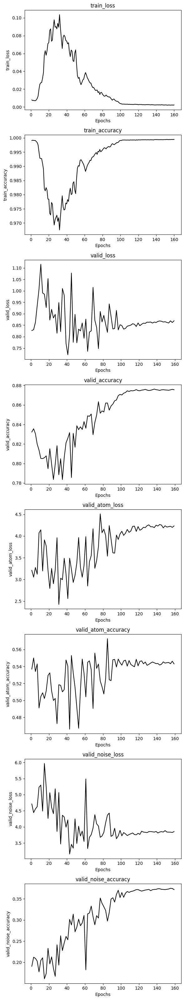

In [12]:
trainer.plot_training_metrics()

In [13]:
wandb.finish()

wandb: WARNING Source type is set to 'repo' but some required information is missing from the environment. A job will not be created from this run. See https://docs.wandb.ai/guides/launch/create-job


epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
records,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
train_accuracy,██▆▆▄▃▁▃▃▃▃▃▃▅▆▆▇▇▇▇▇▇██████████████████
train_loss,▁▁▃▃▄▆█▆▆▆▆▆▆▄▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▄▄▃▃▂▃▁▃▁▂▄▁▅▆▅▅▅▅▅▅▆▇▆▆▇▇▇▇▇█▇▇▇█▇▇▇█▇▇
valid_atom_accuracy,▆▆▃▄▃▃▃▂▄▄▆▅▄▁█▃▆▂▆▅▃▄▆█▇▅▆▆▆▆▇▅▆▇▆▇▆▆▆▆
valid_atom_loss,▃▃▆▃▆▄▂▆▃▅▁▂▃▆▂▆▅▇▄█▇▇▅▄▆▇▆▇▇▇▆▇█▇▇▇▇▇▇▇
valid_loss,▄▄▆▅█▄▃▃▆▆▁▇▃▂▃▃▄▃▄▃▄▃▅▃▅▁▄▂▅▁▄▃▅▁▄▃▅▁▄▄
valid_noise_accuracy,▂▂▁▃▁▂▁▃▃▄▄▅▄▅▅▁▆▅▅▇▇▅▇▆▇▇▇███▇▇▇█▇███▇█
valid_noise_loss,▄▅▇▅▇▇▄▂▄▃▄▁▄▃▂█▂▄▃▂▂▄▂▃▃▂▂▂▂▂▂▃▃▂▂▂▂▃▃▃
epoch,240


### 500K dataset

524792


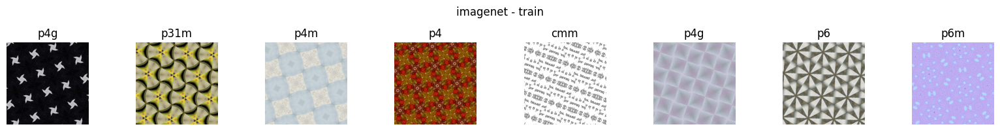

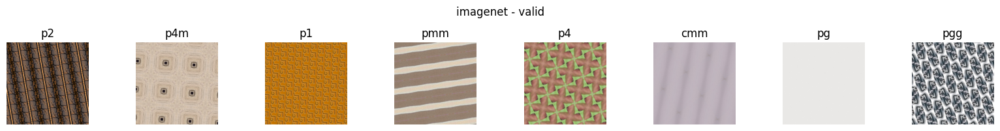

In [ ]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
_, imagenet_ds = split_train_valid(imagenet_ds, 0.951, seed=42) # model can't process single image batch
print(len(imagenet_ds))
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [ ]:
model = resnet50_(in_channels=3, n_classes=17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,4,5,6,7,9])
device = torch.device('cuda:3')
# model

torch.Size([2, 17])


In [ ]:
config = {'dataset': '500k datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09022024-resnet50-dataset_v5_size-500k'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records', save_code=True, config=config, resume='allow')
config = wandb.config

In [ ]:
lr = 1e-3
per_epoch = 5
epoch_start = 0
epochs = 200
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/200


100%|██████████| 117/117 [04:06<00:00,  2.11s/it]


train_loss: 3.0199, train_accuracy: 6.15%
Epoch 2/200


100%|██████████| 117/117 [03:54<00:00,  2.01s/it]


train_loss: 2.9438, train_accuracy: 6.28%
Epoch 3/200


100%|██████████| 117/117 [03:51<00:00,  1.98s/it]


train_loss: 2.8969, train_accuracy: 6.69%
Epoch 4/200


100%|██████████| 117/117 [03:55<00:00,  2.01s/it]


train_loss: 2.8480, train_accuracy: 8.04%
Epoch 5/200


100%|██████████| 117/117 [03:58<00:00,  2.04s/it]


train_loss: 2.7748, train_accuracy: 9.79%


100%|██████████| 30/30 [00:49<00:00,  1.64s/it]


valid_loss: 2.6715, valid_accuracy: 11.97%


100%|██████████| 57/57 [01:28<00:00,  1.55s/it]


valid_atom_loss: 2.9066, valid_atom_accuracy: 9.74%


100%|██████████| 29/29 [00:49<00:00,  1.69s/it]


valid_noise_loss: 12.2463, valid_noise_accuracy: 5.91%
Model saved at epoch 5
Epoch 6/200


100%|██████████| 117/117 [03:38<00:00,  1.87s/it]


train_loss: 2.6025, train_accuracy: 13.70%
Epoch 7/200


100%|██████████| 117/117 [03:52<00:00,  1.98s/it]


train_loss: 2.2354, train_accuracy: 24.92%
Epoch 8/200


100%|██████████| 117/117 [03:52<00:00,  1.99s/it]


train_loss: 1.7545, train_accuracy: 39.37%
Epoch 9/200


100%|██████████| 117/117 [03:46<00:00,  1.94s/it]


train_loss: 1.4219, train_accuracy: 49.87%
Epoch 10/200


100%|██████████| 117/117 [03:48<00:00,  1.95s/it]


train_loss: 1.1902, train_accuracy: 57.70%


100%|██████████| 30/30 [00:49<00:00,  1.65s/it]


valid_loss: 1.0286, valid_accuracy: 62.81%


100%|██████████| 57/57 [01:23<00:00,  1.47s/it]


valid_atom_loss: 1.6754, valid_atom_accuracy: 41.87%


100%|██████████| 29/29 [00:49<00:00,  1.70s/it]


valid_noise_loss: 2.8392, valid_noise_accuracy: 8.86%
Model saved at epoch 10
Epoch 11/200


100%|██████████| 117/117 [03:56<00:00,  2.02s/it]


train_loss: 1.0195, train_accuracy: 63.93%
Epoch 12/200


100%|██████████| 117/117 [04:12<00:00,  2.16s/it]


train_loss: 0.8711, train_accuracy: 69.65%
Epoch 13/200


100%|██████████| 117/117 [04:12<00:00,  2.16s/it]


train_loss: 0.7481, train_accuracy: 74.09%
Epoch 14/200


100%|██████████| 117/117 [04:13<00:00,  2.16s/it]


train_loss: 0.6558, train_accuracy: 77.19%
Epoch 15/200


100%|██████████| 117/117 [04:12<00:00,  2.16s/it]


train_loss: 0.5749, train_accuracy: 80.10%


100%|██████████| 30/30 [00:49<00:00,  1.65s/it]


valid_loss: 0.5877, valid_accuracy: 77.73%


100%|██████████| 57/57 [01:36<00:00,  1.69s/it]


valid_atom_loss: 1.3681, valid_atom_accuracy: 54.87%


100%|██████████| 29/29 [00:49<00:00,  1.72s/it]


valid_noise_loss: 3.1361, valid_noise_accuracy: 2.32%
Model saved at epoch 15
Epoch 16/200


100%|██████████| 117/117 [04:09<00:00,  2.13s/it]


train_loss: 0.5068, train_accuracy: 82.53%
Epoch 17/200


100%|██████████| 117/117 [03:58<00:00,  2.04s/it]


train_loss: 0.4493, train_accuracy: 84.63%
Epoch 18/200


100%|██████████| 117/117 [04:09<00:00,  2.13s/it]


train_loss: 0.4009, train_accuracy: 86.44%
Epoch 19/200


100%|██████████| 117/117 [03:59<00:00,  2.05s/it]


train_loss: 0.3520, train_accuracy: 88.14%
Epoch 20/200


100%|██████████| 117/117 [03:56<00:00,  2.02s/it]


train_loss: 0.3173, train_accuracy: 89.36%


100%|██████████| 30/30 [00:50<00:00,  1.67s/it]


valid_loss: 0.4092, valid_accuracy: 85.43%


100%|██████████| 57/57 [01:26<00:00,  1.52s/it]


valid_atom_loss: 1.4809, valid_atom_accuracy: 61.01%


100%|██████████| 29/29 [00:43<00:00,  1.50s/it]


valid_noise_loss: 3.2306, valid_noise_accuracy: 8.64%
Model saved at epoch 20
Epoch 21/200


100%|██████████| 117/117 [03:51<00:00,  1.98s/it]


train_loss: 0.2800, train_accuracy: 90.68%
Epoch 22/200


100%|██████████| 117/117 [03:51<00:00,  1.97s/it]


train_loss: 0.2588, train_accuracy: 91.38%
Epoch 23/200


100%|██████████| 117/117 [03:51<00:00,  1.98s/it]


train_loss: 0.2329, train_accuracy: 92.27%
Epoch 24/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.2085, train_accuracy: 93.12%
Epoch 25/200


100%|██████████| 117/117 [03:48<00:00,  1.95s/it]


train_loss: 0.1917, train_accuracy: 93.68%


100%|██████████| 30/30 [00:46<00:00,  1.56s/it]


valid_loss: 0.4384, valid_accuracy: 86.41%


100%|██████████| 57/57 [01:22<00:00,  1.44s/it]


valid_atom_loss: 2.0369, valid_atom_accuracy: 56.42%


100%|██████████| 29/29 [00:45<00:00,  1.57s/it]


valid_noise_loss: 4.3729, valid_noise_accuracy: 12.17%
Model saved at epoch 25
Epoch 26/200


100%|██████████| 117/117 [03:46<00:00,  1.94s/it]


train_loss: 0.1776, train_accuracy: 94.15%
Epoch 27/200


100%|██████████| 117/117 [03:44<00:00,  1.92s/it]


train_loss: 0.1671, train_accuracy: 94.49%
Epoch 28/200


100%|██████████| 117/117 [03:41<00:00,  1.90s/it]


train_loss: 0.1535, train_accuracy: 94.97%
Epoch 29/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.1438, train_accuracy: 95.26%
Epoch 30/200


100%|██████████| 117/117 [03:40<00:00,  1.89s/it]


train_loss: 0.1364, train_accuracy: 95.50%


100%|██████████| 30/30 [00:46<00:00,  1.55s/it]


valid_loss: 0.4469, valid_accuracy: 87.01%


100%|██████████| 57/57 [01:24<00:00,  1.49s/it]


valid_atom_loss: 2.1890, valid_atom_accuracy: 57.44%


100%|██████████| 29/29 [00:45<00:00,  1.57s/it]


valid_noise_loss: 3.0136, valid_noise_accuracy: 13.47%
Model saved at epoch 30
Epoch 31/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.1304, train_accuracy: 95.74%
Epoch 32/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.1211, train_accuracy: 96.05%
Epoch 33/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.1139, train_accuracy: 96.29%
Epoch 34/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.1064, train_accuracy: 96.56%
Epoch 35/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.1033, train_accuracy: 96.65%


100%|██████████| 30/30 [00:47<00:00,  1.59s/it]


valid_loss: 0.3463, valid_accuracy: 90.14%


100%|██████████| 57/57 [01:27<00:00,  1.53s/it]


valid_atom_loss: 2.5194, valid_atom_accuracy: 54.76%


100%|██████████| 29/29 [00:46<00:00,  1.62s/it]


valid_noise_loss: 3.0960, valid_noise_accuracy: 21.70%
Model saved at epoch 35
Epoch 36/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0965, train_accuracy: 96.91%
Epoch 37/200


100%|██████████| 117/117 [03:52<00:00,  1.98s/it]


train_loss: 0.0924, train_accuracy: 97.07%
Epoch 38/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0894, train_accuracy: 97.16%
Epoch 39/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0866, train_accuracy: 97.22%
Epoch 40/200


100%|██████████| 117/117 [03:33<00:00,  1.82s/it]


train_loss: 0.0840, train_accuracy: 97.34%


100%|██████████| 30/30 [00:47<00:00,  1.59s/it]


valid_loss: 0.3880, valid_accuracy: 88.95%


100%|██████████| 57/57 [01:24<00:00,  1.48s/it]


valid_atom_loss: 1.6788, valid_atom_accuracy: 64.85%


100%|██████████| 29/29 [00:46<00:00,  1.62s/it]


valid_noise_loss: 2.7990, valid_noise_accuracy: 35.61%
Model saved at epoch 40
Epoch 41/200


100%|██████████| 117/117 [03:46<00:00,  1.94s/it]


train_loss: 0.0769, train_accuracy: 97.59%
Epoch 42/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0755, train_accuracy: 97.61%
Epoch 43/200


100%|██████████| 117/117 [03:48<00:00,  1.95s/it]


train_loss: 0.0680, train_accuracy: 97.85%
Epoch 44/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0688, train_accuracy: 97.84%
Epoch 45/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0627, train_accuracy: 98.02%


100%|██████████| 30/30 [00:48<00:00,  1.62s/it]


valid_loss: 0.2555, valid_accuracy: 93.65%


100%|██████████| 57/57 [01:27<00:00,  1.54s/it]


valid_atom_loss: 2.3948, valid_atom_accuracy: 59.46%


100%|██████████| 29/29 [00:46<00:00,  1.60s/it]


valid_noise_loss: 3.7044, valid_noise_accuracy: 27.26%
Model saved at epoch 45
Epoch 46/200


100%|██████████| 117/117 [03:47<00:00,  1.94s/it]


train_loss: 0.0628, train_accuracy: 98.04%
Epoch 47/200


100%|██████████| 117/117 [03:51<00:00,  1.97s/it]


train_loss: 0.0588, train_accuracy: 98.17%
Epoch 48/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0560, train_accuracy: 98.24%
Epoch 49/200


100%|██████████| 117/117 [03:48<00:00,  1.95s/it]


train_loss: 0.0570, train_accuracy: 98.20%
Epoch 50/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0562, train_accuracy: 98.23%


100%|██████████| 30/30 [00:46<00:00,  1.57s/it]


valid_loss: 0.2731, valid_accuracy: 93.75%


100%|██████████| 57/57 [01:25<00:00,  1.51s/it]


valid_atom_loss: 3.0605, valid_atom_accuracy: 53.72%


100%|██████████| 29/29 [00:45<00:00,  1.58s/it]


valid_noise_loss: 2.4542, valid_noise_accuracy: 44.53%
Model saved at epoch 50
Epoch 51/200


100%|██████████| 117/117 [03:39<00:00,  1.88s/it]


train_loss: 0.0495, train_accuracy: 98.44%
Epoch 52/200


100%|██████████| 117/117 [03:49<00:00,  1.97s/it]


train_loss: 0.0464, train_accuracy: 98.54%
Epoch 53/200


100%|██████████| 117/117 [03:51<00:00,  1.98s/it]


train_loss: 0.0471, train_accuracy: 98.51%
Epoch 54/200


100%|██████████| 117/117 [03:52<00:00,  1.98s/it]


train_loss: 0.0459, train_accuracy: 98.55%
Epoch 55/200


100%|██████████| 117/117 [03:52<00:00,  1.99s/it]


train_loss: 0.0434, train_accuracy: 98.63%


100%|██████████| 30/30 [00:46<00:00,  1.56s/it]


valid_loss: 0.2277, valid_accuracy: 94.96%


100%|██████████| 57/57 [01:27<00:00,  1.53s/it]


valid_atom_loss: 2.9973, valid_atom_accuracy: 54.63%


100%|██████████| 29/29 [00:47<00:00,  1.65s/it]


valid_noise_loss: 1.8193, valid_noise_accuracy: 54.65%
Model saved at epoch 55
Epoch 56/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0408, train_accuracy: 98.72%
Epoch 57/200


100%|██████████| 117/117 [03:52<00:00,  1.98s/it]


train_loss: 0.0394, train_accuracy: 98.76%
Epoch 58/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0366, train_accuracy: 98.84%
Epoch 59/200


100%|██████████| 117/117 [03:47<00:00,  1.95s/it]


train_loss: 0.0374, train_accuracy: 98.84%
Epoch 60/200


100%|██████████| 117/117 [03:48<00:00,  1.96s/it]


train_loss: 0.0352, train_accuracy: 98.90%


100%|██████████| 30/30 [00:43<00:00,  1.45s/it]


valid_loss: 0.2098, valid_accuracy: 95.32%


100%|██████████| 57/57 [01:24<00:00,  1.49s/it]


valid_atom_loss: 2.8716, valid_atom_accuracy: 59.59%


100%|██████████| 29/29 [00:45<00:00,  1.56s/it]


valid_noise_loss: 1.8574, valid_noise_accuracy: 54.10%
Model saved at epoch 60
Epoch 61/200


100%|██████████| 117/117 [03:37<00:00,  1.86s/it]


train_loss: 0.0346, train_accuracy: 98.90%
Epoch 62/200


100%|██████████| 117/117 [03:47<00:00,  1.94s/it]


train_loss: 0.0290, train_accuracy: 99.08%
Epoch 63/200


100%|██████████| 117/117 [03:52<00:00,  1.98s/it]


train_loss: 0.0321, train_accuracy: 98.99%
Epoch 64/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0297, train_accuracy: 99.06%
Epoch 65/200


100%|██████████| 117/117 [03:57<00:00,  2.03s/it]


train_loss: 0.0292, train_accuracy: 99.09%


100%|██████████| 30/30 [00:48<00:00,  1.63s/it]


valid_loss: 0.1852, valid_accuracy: 95.80%


100%|██████████| 57/57 [01:24<00:00,  1.48s/it]


valid_atom_loss: 2.2317, valid_atom_accuracy: 64.58%


100%|██████████| 29/29 [00:46<00:00,  1.59s/it]


valid_noise_loss: 1.9250, valid_noise_accuracy: 56.62%
Model saved at epoch 65
Epoch 66/200


100%|██████████| 117/117 [03:40<00:00,  1.88s/it]


train_loss: 0.0276, train_accuracy: 99.13%
Epoch 67/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0312, train_accuracy: 99.02%
Epoch 68/200


100%|██████████| 117/117 [03:32<00:00,  1.82s/it]


train_loss: 0.0279, train_accuracy: 99.13%
Epoch 69/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0293, train_accuracy: 99.09%
Epoch 70/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0255, train_accuracy: 99.21%


100%|██████████| 30/30 [00:48<00:00,  1.62s/it]


valid_loss: 0.1834, valid_accuracy: 96.06%


100%|██████████| 57/57 [01:28<00:00,  1.55s/it]


valid_atom_loss: 2.7506, valid_atom_accuracy: 60.93%


100%|██████████| 29/29 [00:47<00:00,  1.65s/it]


valid_noise_loss: 1.6481, valid_noise_accuracy: 59.53%
Model saved at epoch 70
Epoch 71/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0231, train_accuracy: 99.28%
Epoch 72/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0225, train_accuracy: 99.29%
Epoch 73/200


100%|██████████| 117/117 [03:49<00:00,  1.97s/it]


train_loss: 0.0230, train_accuracy: 99.29%
Epoch 74/200


100%|██████████| 117/117 [03:55<00:00,  2.01s/it]


train_loss: 0.0268, train_accuracy: 99.17%
Epoch 75/200


100%|██████████| 117/117 [03:55<00:00,  2.02s/it]


train_loss: 0.0235, train_accuracy: 99.26%


100%|██████████| 30/30 [00:46<00:00,  1.56s/it]


valid_loss: 0.1815, valid_accuracy: 95.59%


100%|██████████| 57/57 [01:28<00:00,  1.56s/it]


valid_atom_loss: 2.7282, valid_atom_accuracy: 59.13%


100%|██████████| 29/29 [00:45<00:00,  1.57s/it]


valid_noise_loss: 1.9286, valid_noise_accuracy: 54.46%
Model saved at epoch 75
Epoch 76/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0220, train_accuracy: 99.31%
Epoch 77/200


100%|██████████| 117/117 [03:47<00:00,  1.94s/it]


train_loss: 0.0202, train_accuracy: 99.38%
Epoch 78/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0191, train_accuracy: 99.40%
Epoch 79/200


100%|██████████| 117/117 [03:48<00:00,  1.95s/it]


train_loss: 0.0216, train_accuracy: 99.32%
Epoch 80/200


100%|██████████| 117/117 [03:32<00:00,  1.81s/it]


train_loss: 0.0211, train_accuracy: 99.34%


100%|██████████| 30/30 [00:47<00:00,  1.57s/it]


valid_loss: 0.1993, valid_accuracy: 95.87%


100%|██████████| 57/57 [01:26<00:00,  1.52s/it]


valid_atom_loss: 2.5651, valid_atom_accuracy: 64.71%


100%|██████████| 29/29 [00:45<00:00,  1.55s/it]


valid_noise_loss: 1.6660, valid_noise_accuracy: 63.19%
Model saved at epoch 80
Epoch 81/200


100%|██████████| 117/117 [03:47<00:00,  1.95s/it]


train_loss: 0.0216, train_accuracy: 99.33%
Epoch 82/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0185, train_accuracy: 99.43%
Epoch 83/200


100%|██████████| 117/117 [03:33<00:00,  1.82s/it]


train_loss: 0.0179, train_accuracy: 99.44%
Epoch 84/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0186, train_accuracy: 99.42%
Epoch 85/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0176, train_accuracy: 99.46%


100%|██████████| 30/30 [00:46<00:00,  1.56s/it]


valid_loss: 0.1822, valid_accuracy: 96.43%


100%|██████████| 57/57 [01:26<00:00,  1.51s/it]


valid_atom_loss: 2.5784, valid_atom_accuracy: 63.06%


100%|██████████| 29/29 [00:47<00:00,  1.63s/it]


valid_noise_loss: 1.3417, valid_noise_accuracy: 67.50%
Model saved at epoch 85
Epoch 86/200


100%|██████████| 117/117 [03:47<00:00,  1.94s/it]


train_loss: 0.0181, train_accuracy: 99.44%
Epoch 87/200


100%|██████████| 117/117 [03:48<00:00,  1.96s/it]


train_loss: 0.0173, train_accuracy: 99.46%
Epoch 88/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0149, train_accuracy: 99.55%
Epoch 89/200


100%|██████████| 117/117 [03:57<00:00,  2.03s/it]


train_loss: 0.0137, train_accuracy: 99.57%
Epoch 90/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0153, train_accuracy: 99.52%


100%|██████████| 30/30 [00:51<00:00,  1.73s/it]


valid_loss: 0.1872, valid_accuracy: 96.43%


100%|██████████| 57/57 [01:24<00:00,  1.49s/it]


valid_atom_loss: 2.7404, valid_atom_accuracy: 62.19%


100%|██████████| 29/29 [00:46<00:00,  1.60s/it]


valid_noise_loss: 1.7102, valid_noise_accuracy: 64.68%
Model saved at epoch 90
Epoch 91/200


100%|██████████| 117/117 [03:51<00:00,  1.98s/it]


train_loss: 0.0173, train_accuracy: 99.47%
Epoch 92/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0164, train_accuracy: 99.50%
Epoch 93/200


100%|██████████| 117/117 [03:32<00:00,  1.81s/it]


train_loss: 0.0138, train_accuracy: 99.58%
Epoch 94/200


100%|██████████| 117/117 [03:51<00:00,  1.98s/it]


train_loss: 0.0140, train_accuracy: 99.57%
Epoch 95/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0147, train_accuracy: 99.55%


100%|██████████| 30/30 [00:47<00:00,  1.57s/it]


valid_loss: 0.1792, valid_accuracy: 96.33%


100%|██████████| 57/57 [01:27<00:00,  1.54s/it]


valid_atom_loss: 2.5279, valid_atom_accuracy: 64.47%


100%|██████████| 29/29 [00:45<00:00,  1.57s/it]


valid_noise_loss: 1.4457, valid_noise_accuracy: 68.44%
Model saved at epoch 95
Epoch 96/200


100%|██████████| 117/117 [03:42<00:00,  1.90s/it]


train_loss: 0.0131, train_accuracy: 99.60%
Epoch 97/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0140, train_accuracy: 99.58%
Epoch 98/200


100%|██████████| 117/117 [03:46<00:00,  1.94s/it]


train_loss: 0.0144, train_accuracy: 99.56%
Epoch 99/200


100%|██████████| 117/117 [03:43<00:00,  1.91s/it]


train_loss: 0.0130, train_accuracy: 99.60%
Epoch 100/200


100%|██████████| 117/117 [03:51<00:00,  1.98s/it]


train_loss: 0.0106, train_accuracy: 99.68%


100%|██████████| 30/30 [00:50<00:00,  1.69s/it]


valid_loss: 0.1755, valid_accuracy: 96.85%


100%|██████████| 57/57 [01:28<00:00,  1.56s/it]


valid_atom_loss: 2.7197, valid_atom_accuracy: 65.10%


100%|██████████| 29/29 [00:46<00:00,  1.60s/it]


valid_noise_loss: 1.5221, valid_noise_accuracy: 69.69%
Model saved at epoch 100
Epoch 101/200


100%|██████████| 117/117 [03:47<00:00,  1.95s/it]


train_loss: 0.0120, train_accuracy: 99.64%
Epoch 102/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0112, train_accuracy: 99.66%
Epoch 103/200


100%|██████████| 117/117 [03:51<00:00,  1.98s/it]


train_loss: 0.0115, train_accuracy: 99.66%
Epoch 104/200


100%|██████████| 117/117 [03:48<00:00,  1.95s/it]


train_loss: 0.0112, train_accuracy: 99.66%
Epoch 105/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0115, train_accuracy: 99.65%


100%|██████████| 30/30 [00:47<00:00,  1.58s/it]


valid_loss: 0.1651, valid_accuracy: 96.84%


100%|██████████| 57/57 [01:26<00:00,  1.51s/it]


valid_atom_loss: 2.5582, valid_atom_accuracy: 63.37%


100%|██████████| 29/29 [00:47<00:00,  1.65s/it]


valid_noise_loss: 1.3421, valid_noise_accuracy: 70.68%
Model saved at epoch 105
Epoch 106/200


100%|██████████| 117/117 [03:42<00:00,  1.90s/it]


train_loss: 0.0096, train_accuracy: 99.71%
Epoch 107/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0105, train_accuracy: 99.69%
Epoch 108/200


100%|██████████| 117/117 [03:49<00:00,  1.97s/it]


train_loss: 0.0099, train_accuracy: 99.70%
Epoch 109/200


100%|██████████| 117/117 [03:51<00:00,  1.98s/it]


train_loss: 0.0091, train_accuracy: 99.72%
Epoch 110/200


100%|██████████| 117/117 [03:47<00:00,  1.95s/it]


train_loss: 0.0103, train_accuracy: 99.69%


100%|██████████| 30/30 [00:47<00:00,  1.57s/it]


valid_loss: 0.1614, valid_accuracy: 96.92%


100%|██████████| 57/57 [01:29<00:00,  1.57s/it]


valid_atom_loss: 2.6596, valid_atom_accuracy: 63.45%


100%|██████████| 29/29 [00:45<00:00,  1.58s/it]


valid_noise_loss: 1.3600, valid_noise_accuracy: 71.94%
Model saved at epoch 110
Epoch 111/200


100%|██████████| 117/117 [03:48<00:00,  1.95s/it]


train_loss: 0.0102, train_accuracy: 99.69%
Epoch 112/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0076, train_accuracy: 99.76%
Epoch 113/200


100%|██████████| 117/117 [03:51<00:00,  1.98s/it]


train_loss: 0.0087, train_accuracy: 99.74%
Epoch 114/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0099, train_accuracy: 99.71%
Epoch 115/200


100%|██████████| 117/117 [03:39<00:00,  1.88s/it]


train_loss: 0.0076, train_accuracy: 99.77%


100%|██████████| 30/30 [00:49<00:00,  1.64s/it]


valid_loss: 0.1804, valid_accuracy: 96.87%


100%|██████████| 57/57 [01:21<00:00,  1.43s/it]


valid_atom_loss: 2.6413, valid_atom_accuracy: 65.89%


100%|██████████| 29/29 [00:47<00:00,  1.63s/it]


valid_noise_loss: 1.5243, valid_noise_accuracy: 69.99%
Model saved at epoch 115
Epoch 116/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0085, train_accuracy: 99.74%
Epoch 117/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0079, train_accuracy: 99.76%
Epoch 118/200


100%|██████████| 117/117 [03:51<00:00,  1.98s/it]


train_loss: 0.0081, train_accuracy: 99.76%
Epoch 119/200


100%|██████████| 117/117 [03:51<00:00,  1.98s/it]


train_loss: 0.0092, train_accuracy: 99.72%
Epoch 120/200


100%|██████████| 117/117 [03:53<00:00,  1.99s/it]


train_loss: 0.0081, train_accuracy: 99.75%


100%|██████████| 30/30 [00:47<00:00,  1.58s/it]


valid_loss: 0.1719, valid_accuracy: 97.10%


100%|██████████| 57/57 [01:31<00:00,  1.60s/it]


valid_atom_loss: 2.7948, valid_atom_accuracy: 66.53%


100%|██████████| 29/29 [00:47<00:00,  1.64s/it]


valid_noise_loss: 1.3530, valid_noise_accuracy: 72.60%
Model saved at epoch 120
Epoch 121/200


100%|██████████| 117/117 [03:51<00:00,  1.98s/it]


train_loss: 0.0079, train_accuracy: 99.76%
Epoch 122/200


100%|██████████| 117/117 [03:53<00:00,  2.00s/it]


train_loss: 0.0064, train_accuracy: 99.81%
Epoch 123/200


100%|██████████| 117/117 [03:52<00:00,  1.98s/it]


train_loss: 0.0055, train_accuracy: 99.83%
Epoch 124/200


100%|██████████| 117/117 [03:52<00:00,  1.98s/it]


train_loss: 0.0060, train_accuracy: 99.83%
Epoch 125/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0061, train_accuracy: 99.81%


100%|██████████| 30/30 [00:48<00:00,  1.62s/it]


valid_loss: 0.1844, valid_accuracy: 97.18%


100%|██████████| 57/57 [01:26<00:00,  1.52s/it]


valid_atom_loss: 3.3714, valid_atom_accuracy: 60.64%


100%|██████████| 29/29 [00:48<00:00,  1.68s/it]


valid_noise_loss: 1.2793, valid_noise_accuracy: 74.70%
Model saved at epoch 125
Epoch 126/200


100%|██████████| 117/117 [03:48<00:00,  1.95s/it]


train_loss: 0.0056, train_accuracy: 99.83%
Epoch 127/200


100%|██████████| 117/117 [03:53<00:00,  2.00s/it]


train_loss: 0.0068, train_accuracy: 99.80%
Epoch 128/200


100%|██████████| 117/117 [03:51<00:00,  1.98s/it]


train_loss: 0.0059, train_accuracy: 99.82%
Epoch 129/200


100%|██████████| 117/117 [03:51<00:00,  1.98s/it]


train_loss: 0.0067, train_accuracy: 99.80%
Epoch 130/200


100%|██████████| 117/117 [03:48<00:00,  1.95s/it]


train_loss: 0.0064, train_accuracy: 99.80%


100%|██████████| 30/30 [00:48<00:00,  1.61s/it]


valid_loss: 0.1932, valid_accuracy: 97.11%


100%|██████████| 57/57 [01:26<00:00,  1.52s/it]


valid_atom_loss: 3.2723, valid_atom_accuracy: 62.92%


100%|██████████| 29/29 [00:46<00:00,  1.61s/it]


valid_noise_loss: 1.2459, valid_noise_accuracy: 75.38%
Model saved at epoch 130
Epoch 131/200


100%|██████████| 117/117 [03:45<00:00,  1.92s/it]


train_loss: 0.0060, train_accuracy: 99.82%
Epoch 132/200


100%|██████████| 117/117 [03:47<00:00,  1.94s/it]


train_loss: 0.0053, train_accuracy: 99.84%
Epoch 133/200


100%|██████████| 117/117 [03:53<00:00,  1.99s/it]


train_loss: 0.0048, train_accuracy: 99.85%
Epoch 134/200


100%|██████████| 117/117 [03:47<00:00,  1.94s/it]


train_loss: 0.0053, train_accuracy: 99.84%
Epoch 135/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0054, train_accuracy: 99.84%


100%|██████████| 30/30 [00:50<00:00,  1.67s/it]


valid_loss: 0.1857, valid_accuracy: 97.19%


100%|██████████| 57/57 [01:25<00:00,  1.51s/it]


valid_atom_loss: 3.3330, valid_atom_accuracy: 60.47%


100%|██████████| 29/29 [00:47<00:00,  1.64s/it]


valid_noise_loss: 1.3775, valid_noise_accuracy: 74.18%
Model saved at epoch 135
Epoch 136/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0054, train_accuracy: 99.83%
Epoch 137/200


100%|██████████| 117/117 [03:48<00:00,  1.95s/it]


train_loss: 0.0051, train_accuracy: 99.85%
Epoch 138/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0044, train_accuracy: 99.87%
Epoch 139/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0041, train_accuracy: 99.87%
Epoch 140/200


100%|██████████| 117/117 [03:46<00:00,  1.93s/it]


train_loss: 0.0048, train_accuracy: 99.86%


100%|██████████| 30/30 [00:47<00:00,  1.57s/it]


valid_loss: 0.1896, valid_accuracy: 97.22%


100%|██████████| 57/57 [01:26<00:00,  1.51s/it]


valid_atom_loss: 3.4945, valid_atom_accuracy: 61.39%


100%|██████████| 29/29 [00:44<00:00,  1.54s/it]


valid_noise_loss: 1.4373, valid_noise_accuracy: 73.67%
Model saved at epoch 140
Epoch 141/200


100%|██████████| 117/117 [03:32<00:00,  1.82s/it]


train_loss: 0.0042, train_accuracy: 99.87%
Epoch 142/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 143/200


100%|██████████| 117/117 [03:45<00:00,  1.93s/it]


train_loss: 0.0041, train_accuracy: 99.88%
Epoch 144/200


100%|██████████| 117/117 [03:51<00:00,  1.98s/it]


train_loss: 0.0047, train_accuracy: 99.86%
Epoch 145/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0047, train_accuracy: 99.86%


100%|██████████| 30/30 [00:48<00:00,  1.63s/it]


valid_loss: 0.1754, valid_accuracy: 97.34%


100%|██████████| 57/57 [01:26<00:00,  1.51s/it]


valid_atom_loss: 3.2057, valid_atom_accuracy: 63.03%


100%|██████████| 29/29 [00:45<00:00,  1.57s/it]


valid_noise_loss: 1.3384, valid_noise_accuracy: 74.33%
Model saved at epoch 145
Epoch 146/200


100%|██████████| 117/117 [03:38<00:00,  1.87s/it]


train_loss: 0.0048, train_accuracy: 99.85%
Epoch 147/200


100%|██████████| 117/117 [03:53<00:00,  2.00s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 148/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 149/200


100%|██████████| 117/117 [03:45<00:00,  1.93s/it]


train_loss: 0.0036, train_accuracy: 99.89%
Epoch 150/200


100%|██████████| 117/117 [03:53<00:00,  2.00s/it]


train_loss: 0.0034, train_accuracy: 99.89%


100%|██████████| 30/30 [00:47<00:00,  1.59s/it]


valid_loss: 0.1843, valid_accuracy: 97.53%


100%|██████████| 57/57 [01:17<00:00,  1.37s/it]


valid_atom_loss: 2.8002, valid_atom_accuracy: 67.65%


100%|██████████| 29/29 [00:45<00:00,  1.58s/it]


valid_noise_loss: 1.4701, valid_noise_accuracy: 73.98%
Model saved at epoch 150
Epoch 151/200


100%|██████████| 117/117 [03:42<00:00,  1.90s/it]


train_loss: 0.0033, train_accuracy: 99.90%
Epoch 152/200


100%|██████████| 117/117 [03:48<00:00,  1.96s/it]


train_loss: 0.0033, train_accuracy: 99.90%
Epoch 153/200


100%|██████████| 117/117 [03:48<00:00,  1.96s/it]


train_loss: 0.0031, train_accuracy: 99.90%
Epoch 154/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0031, train_accuracy: 99.90%
Epoch 155/200


100%|██████████| 117/117 [03:48<00:00,  1.95s/it]


train_loss: 0.0032, train_accuracy: 99.90%


100%|██████████| 30/30 [00:46<00:00,  1.56s/it]


valid_loss: 0.1808, valid_accuracy: 97.66%


100%|██████████| 57/57 [01:26<00:00,  1.52s/it]


valid_atom_loss: 3.1574, valid_atom_accuracy: 64.42%


100%|██████████| 29/29 [00:46<00:00,  1.60s/it]


valid_noise_loss: 1.4144, valid_noise_accuracy: 74.75%
Model saved at epoch 155
Epoch 156/200


100%|██████████| 117/117 [03:42<00:00,  1.90s/it]


train_loss: 0.0031, train_accuracy: 99.90%
Epoch 157/200


100%|██████████| 117/117 [03:46<00:00,  1.93s/it]


train_loss: 0.0031, train_accuracy: 99.90%
Epoch 158/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0030, train_accuracy: 99.90%
Epoch 159/200


100%|██████████| 117/117 [03:47<00:00,  1.94s/it]


train_loss: 0.0031, train_accuracy: 99.90%
Epoch 160/200


100%|██████████| 117/117 [03:47<00:00,  1.94s/it]


train_loss: 0.0031, train_accuracy: 99.90%


100%|██████████| 30/30 [00:46<00:00,  1.56s/it]


valid_loss: 0.1833, valid_accuracy: 97.65%


100%|██████████| 57/57 [01:24<00:00,  1.49s/it]


valid_atom_loss: 3.1687, valid_atom_accuracy: 65.22%


100%|██████████| 29/29 [00:49<00:00,  1.72s/it]


valid_noise_loss: 1.3837, valid_noise_accuracy: 75.62%
Model saved at epoch 160
Epoch 161/200


  0%|          | 0/117 [00:00<?, ?it/s]


BlockingIOError: Caught BlockingIOError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/torch/utils/data/_utils/worker.py", line 308, in _worker_loop
    data = fetcher.fetch(index)
  File "/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/torch/utils/data/_utils/fetch.py", line 49, in fetch
    data = self.dataset.__getitems__(possibly_batched_index)
  File "/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/torch/utils/data/dataset.py", line 362, in __getitems__
    return self.dataset.__getitems__([self.indices[idx] for idx in indices])  # type: ignore[attr-defined]
  File "/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/torch/utils/data/dataset.py", line 364, in __getitems__
    return [self.dataset[self.indices[idx]] for idx in indices]
  File "/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/torch/utils/data/dataset.py", line 364, in <listcomp>
    return [self.dataset[self.indices[idx]] for idx in indices]
  File "/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/notebooks/various_dataset_size/../../src/utils/utils.py", line 234, in __getitem__
    self.hf = h5py.File(self.file_path, 'r')
  File "/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/h5py/_hl/files.py", line 562, in __init__
    fid = make_fid(name, mode, userblock_size, fapl, fcpl, swmr=swmr)
  File "/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/h5py/_hl/files.py", line 235, in make_fid
    fid = h5f.open(name, flags, fapl=fapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5f.pyx", line 102, in h5py.h5f.open
BlockingIOError: [Errno 11] Unable to synchronously open file (unable to lock file, errno = 11, error message = 'Resource temporarily unavailable')


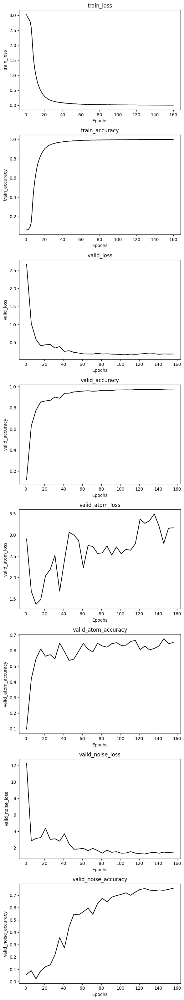

In [ ]:
trainer.plot_training_metrics()

In [ ]:
lr = 1e-3
per_epoch = 5
epoch_start = 160
epochs = 40
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 161/200


  0%|          | 0/117 [00:00<?, ?it/s]

 56%|█████▋    | 66/117 [03:32<01:44,  2.04s/it]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f089c977d00>
Traceback (most recent call last):
  File "/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/home/yichen/anaconda3/envs/symmetry/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
 57%|█████▋    | 67/117 [03:34<01:41,  2.02s/it]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f089c977d00>
Traceback (most recent call last):
  File "/home/yichen/anaconda3/envs/symmetry/lib/python3.10/site-packages/torch/utils/data/dataloader.p

train_loss: 0.0028, train_accuracy: 99.91%
Epoch 162/200


100%|██████████| 117/117 [03:51<00:00,  1.98s/it]


train_loss: 0.0028, train_accuracy: 99.91%
Epoch 163/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0035, train_accuracy: 99.89%
Epoch 164/200


100%|██████████| 117/117 [03:51<00:00,  1.98s/it]


train_loss: 0.0062, train_accuracy: 99.82%
Epoch 165/200


100%|██████████| 117/117 [03:45<00:00,  1.93s/it]


train_loss: 0.0050, train_accuracy: 99.85%


100%|██████████| 30/30 [00:46<00:00,  1.56s/it]


valid_loss: 0.1830, valid_accuracy: 97.29%


100%|██████████| 57/57 [01:30<00:00,  1.59s/it]


valid_atom_loss: 3.0735, valid_atom_accuracy: 65.69%


100%|██████████| 29/29 [00:50<00:00,  1.76s/it]


valid_noise_loss: 1.1565, valid_noise_accuracy: 77.61%
Model saved at epoch 165
Epoch 166/200


100%|██████████| 117/117 [04:03<00:00,  2.08s/it]


train_loss: 0.0085, train_accuracy: 99.75%
Epoch 167/200


100%|██████████| 117/117 [03:48<00:00,  1.95s/it]


train_loss: 0.0144, train_accuracy: 99.57%
Epoch 168/200


100%|██████████| 117/117 [03:46<00:00,  1.94s/it]


train_loss: 0.0129, train_accuracy: 99.61%
Epoch 169/200


100%|██████████| 117/117 [03:49<00:00,  1.97s/it]


train_loss: 0.0149, train_accuracy: 99.56%
Epoch 170/200


100%|██████████| 117/117 [03:48<00:00,  1.95s/it]


train_loss: 0.0169, train_accuracy: 99.48%


100%|██████████| 30/30 [00:46<00:00,  1.57s/it]


valid_loss: 0.1890, valid_accuracy: 96.47%


100%|██████████| 57/57 [01:24<00:00,  1.48s/it]


valid_atom_loss: 2.4470, valid_atom_accuracy: 63.11%


100%|██████████| 29/29 [00:45<00:00,  1.56s/it]


valid_noise_loss: 1.5786, valid_noise_accuracy: 69.58%
Model saved at epoch 170
Epoch 171/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0156, train_accuracy: 99.52%
Epoch 172/200


100%|██████████| 117/117 [03:45<00:00,  1.93s/it]


train_loss: 0.0147, train_accuracy: 99.56%
Epoch 173/200


100%|██████████| 117/117 [03:43<00:00,  1.91s/it]


train_loss: 0.0133, train_accuracy: 99.60%
Epoch 174/200


100%|██████████| 117/117 [03:45<00:00,  1.93s/it]


train_loss: 0.0119, train_accuracy: 99.64%
Epoch 175/200


100%|██████████| 117/117 [03:45<00:00,  1.93s/it]


train_loss: 0.0122, train_accuracy: 99.63%


100%|██████████| 30/30 [00:45<00:00,  1.51s/it]


valid_loss: 0.1665, valid_accuracy: 97.05%


100%|██████████| 57/57 [01:20<00:00,  1.42s/it]


valid_atom_loss: 2.9819, valid_atom_accuracy: 60.67%


100%|██████████| 29/29 [00:47<00:00,  1.62s/it]


valid_noise_loss: 1.0988, valid_noise_accuracy: 75.53%
Model saved at epoch 175
Epoch 176/200


100%|██████████| 117/117 [03:53<00:00,  2.00s/it]


train_loss: 0.0104, train_accuracy: 99.68%
Epoch 177/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0091, train_accuracy: 99.73%
Epoch 178/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0089, train_accuracy: 99.72%
Epoch 179/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0069, train_accuracy: 99.79%
Epoch 180/200


100%|██████████| 117/117 [03:48<00:00,  1.95s/it]


train_loss: 0.0074, train_accuracy: 99.77%


100%|██████████| 30/30 [00:47<00:00,  1.59s/it]


valid_loss: 0.1723, valid_accuracy: 97.12%


100%|██████████| 57/57 [01:24<00:00,  1.49s/it]


valid_atom_loss: 3.2248, valid_atom_accuracy: 61.95%


100%|██████████| 29/29 [00:48<00:00,  1.68s/it]


valid_noise_loss: 1.2784, valid_noise_accuracy: 74.65%
Model saved at epoch 180
Epoch 181/200


100%|██████████| 117/117 [03:53<00:00,  2.00s/it]


train_loss: 0.0064, train_accuracy: 99.81%
Epoch 182/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0051, train_accuracy: 99.85%
Epoch 183/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0049, train_accuracy: 99.85%
Epoch 184/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0046, train_accuracy: 99.86%
Epoch 185/200


100%|██████████| 117/117 [03:51<00:00,  1.98s/it]


train_loss: 0.0038, train_accuracy: 99.88%


100%|██████████| 30/30 [00:48<00:00,  1.60s/it]


valid_loss: 0.1627, valid_accuracy: 97.56%


100%|██████████| 57/57 [01:24<00:00,  1.48s/it]


valid_atom_loss: 3.1178, valid_atom_accuracy: 64.38%


100%|██████████| 29/29 [00:47<00:00,  1.64s/it]


valid_noise_loss: 1.2324, valid_noise_accuracy: 76.45%
Model saved at epoch 185
Epoch 186/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0034, train_accuracy: 99.89%
Epoch 187/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0031, train_accuracy: 99.91%
Epoch 188/200


100%|██████████| 117/117 [03:53<00:00,  1.99s/it]


train_loss: 0.0030, train_accuracy: 99.91%
Epoch 189/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0030, train_accuracy: 99.91%
Epoch 190/200


100%|██████████| 117/117 [03:48<00:00,  1.95s/it]


train_loss: 0.0029, train_accuracy: 99.91%


100%|██████████| 30/30 [00:48<00:00,  1.62s/it]


valid_loss: 0.1646, valid_accuracy: 97.72%


100%|██████████| 57/57 [01:25<00:00,  1.50s/it]


valid_atom_loss: 3.2321, valid_atom_accuracy: 64.59%


100%|██████████| 29/29 [00:45<00:00,  1.57s/it]


valid_noise_loss: 1.1955, valid_noise_accuracy: 77.75%
Model saved at epoch 190
Epoch 191/200


100%|██████████| 117/117 [03:48<00:00,  1.96s/it]


train_loss: 0.0029, train_accuracy: 99.91%
Epoch 192/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0029, train_accuracy: 99.91%
Epoch 193/200


100%|██████████| 117/117 [03:51<00:00,  1.98s/it]


train_loss: 0.0029, train_accuracy: 99.91%
Epoch 194/200


100%|██████████| 117/117 [03:48<00:00,  1.95s/it]


train_loss: 0.0028, train_accuracy: 99.91%
Epoch 195/200


100%|██████████| 117/117 [03:50<00:00,  1.97s/it]


train_loss: 0.0028, train_accuracy: 99.91%


100%|██████████| 30/30 [00:47<00:00,  1.59s/it]


valid_loss: 0.1647, valid_accuracy: 97.77%


100%|██████████| 57/57 [01:24<00:00,  1.48s/it]


valid_atom_loss: 3.2517, valid_atom_accuracy: 65.00%


100%|██████████| 29/29 [00:45<00:00,  1.59s/it]


valid_noise_loss: 1.2495, valid_noise_accuracy: 77.52%
Model saved at epoch 195
Epoch 196/200


100%|██████████| 117/117 [03:47<00:00,  1.94s/it]


train_loss: 0.0028, train_accuracy: 99.91%
Epoch 197/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0028, train_accuracy: 99.91%
Epoch 198/200


100%|██████████| 117/117 [03:48<00:00,  1.95s/it]


train_loss: 0.0027, train_accuracy: 99.91%
Epoch 199/200


100%|██████████| 117/117 [03:49<00:00,  1.96s/it]


train_loss: 0.0028, train_accuracy: 99.91%
Epoch 200/200


100%|██████████| 117/117 [03:48<00:00,  1.96s/it]


train_loss: 0.0028, train_accuracy: 99.91%


100%|██████████| 30/30 [00:47<00:00,  1.58s/it]


valid_loss: 0.1677, valid_accuracy: 97.77%


100%|██████████| 57/57 [01:27<00:00,  1.53s/it]


valid_atom_loss: 3.2585, valid_atom_accuracy: 64.95%


100%|██████████| 29/29 [00:46<00:00,  1.60s/it]


valid_noise_loss: 1.2400, valid_noise_accuracy: 77.68%
Model saved at epoch 200


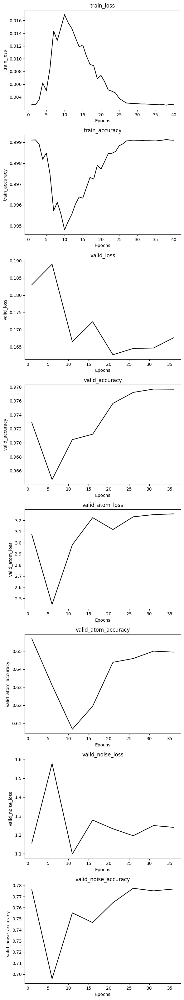

In [ ]:
trainer.plot_training_metrics()

In [ ]:
wandb.finish()

wandb: WARNING Ensure read and write access to run files dir: /home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/notebooks/various_dataset_size/wandb/run-20240904_202607-09022024-resnet50-dataset_v5_size-500k/files, control this via the WANDB_DIR env var. See https://docs.wandb.ai/guides/track/environment-variables


epoch,▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
records,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
train_accuracy,█▆▆█▅▆▆▃▃▁▅▄▃▅▅▆▆▄▆▇▅▆▆▇█▇▆▇▆██▇▇██▇██▆▇
train_loss,▁▃▃▂▄▃▃▆▆█▄▅▆▄▄▄▃▄▃▂▄▃▃▂▂▂▃▂▃▂▁▂▂▂▁▂▁▂▃▂
valid_accuracy,▆▄▄▅▅▄▂▂▁▁▃▃▃▅▅▆▅▄▄▅▆▄▅▆▅█▅▄▆█▆▄▆▇▇▆▆▅▆▆
valid_atom_accuracy,▇██▆▇▃▃▄▄▂▁▂▁▄▁▂▃▂▂▄▆▆▅▇▅▄▆▆▅▇▇█▆▅▅▆▆▅▅▆
valid_atom_loss,▆▅▅▆▆▂▂▁▂▂▅▅▆▄▆▇▇▆█▆▆▆▇▄▇█▇▆█▆▇▅▇██▇▇█▇▇
valid_loss,▆▇▆▆▆▅▆▆▇▆▆▇▆▅▅▄▄▆▅▅▄▇▅▅▅▄█▆▅▄▅▇▅▅▁▇█▆▆▅
valid_noise_accuracy,▆▇▇█▇▁▂▂▂▁▅▆▇▆▆▅▅▆▅▅▆▇▆▇▆▆█▇▇▇▆█▇▇▇▇█▇▇▇
valid_noise_loss,▃▂▂▂▂███▇▇▂▂▁▁▁▄▄▄▄▄▃▂▄▃▃▃▂▃▂▃▄▂▄▃▄▄▂▄▃▃
epoch,200


### 1 million dataset

1070897


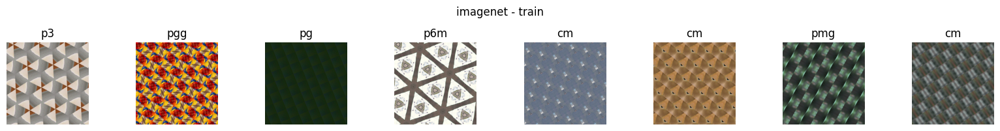

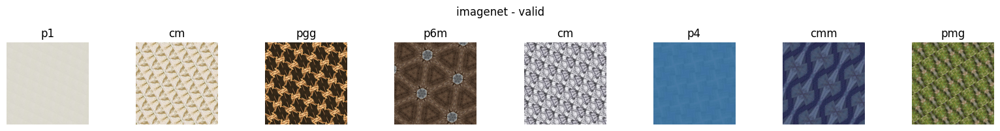

In [ ]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
_, imagenet_ds = split_train_valid(imagenet_ds, 0.90001, seed=42)
print(len(imagenet_ds))
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [ ]:
model = resnet50_(in_channels=3, n_classes=17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,4,5,6,7,9])
device = torch.device('cuda:3')
# model

torch.Size([2, 17])


In [ ]:
config = {'dataset': '1m datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09022024-resnet50-dataset_v5_size-1m'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records', save_code=True, config=config, resume='allow')  
config = wandb.config

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: yig319. Use `wandb login --relogin` to force relogin


In [ ]:
lr = 1e-3
per_epoch = 2
epoch_start = 0
epochs = 80
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/80


100%|██████████| 238/238 [08:09<00:00,  2.06s/it]


train_loss: 2.9897, train_accuracy: 6.39%
Epoch 2/80


100%|██████████| 238/238 [07:37<00:00,  1.92s/it]


train_loss: 2.8529, train_accuracy: 8.30%


100%|██████████| 60/60 [01:28<00:00,  1.48s/it]


valid_loss: 2.7520, valid_accuracy: 10.79%


100%|██████████| 57/57 [01:23<00:00,  1.46s/it]


valid_atom_loss: 2.8833, valid_atom_accuracy: 6.82%


100%|██████████| 29/29 [00:51<00:00,  1.76s/it]


valid_noise_loss: 2.9564, valid_noise_accuracy: 5.95%
Model saved at epoch 2
Epoch 3/80


100%|██████████| 238/238 [07:24<00:00,  1.87s/it]


train_loss: 2.6758, train_accuracy: 11.91%
Epoch 4/80


100%|██████████| 238/238 [07:34<00:00,  1.91s/it]


train_loss: 1.9069, train_accuracy: 33.99%


100%|██████████| 60/60 [01:28<00:00,  1.48s/it]


valid_loss: 1.4168, valid_accuracy: 49.93%


100%|██████████| 57/57 [01:24<00:00,  1.48s/it]


valid_atom_loss: 1.7787, valid_atom_accuracy: 37.65%


100%|██████████| 29/29 [00:48<00:00,  1.67s/it]


valid_noise_loss: 2.6907, valid_noise_accuracy: 11.94%
Model saved at epoch 4
Epoch 5/80


100%|██████████| 238/238 [07:32<00:00,  1.90s/it]


train_loss: 1.2325, train_accuracy: 56.32%
Epoch 6/80


100%|██████████| 238/238 [07:34<00:00,  1.91s/it]


train_loss: 0.8842, train_accuracy: 68.55%


100%|██████████| 60/60 [01:26<00:00,  1.44s/it]


valid_loss: 0.7446, valid_accuracy: 71.30%


100%|██████████| 57/57 [01:24<00:00,  1.48s/it]


valid_atom_loss: 1.5010, valid_atom_accuracy: 52.26%


100%|██████████| 29/29 [00:47<00:00,  1.63s/it]


valid_noise_loss: 3.5418, valid_noise_accuracy: 8.55%
Model saved at epoch 6
Epoch 7/80


100%|██████████| 238/238 [07:20<00:00,  1.85s/it]


train_loss: 0.6741, train_accuracy: 75.99%
Epoch 8/80


100%|██████████| 238/238 [07:27<00:00,  1.88s/it]


train_loss: 0.5343, train_accuracy: 81.16%


100%|██████████| 60/60 [01:29<00:00,  1.49s/it]


valid_loss: 0.4961, valid_accuracy: 81.47%


100%|██████████| 57/57 [01:27<00:00,  1.53s/it]


valid_atom_loss: 1.2496, valid_atom_accuracy: 59.51%


100%|██████████| 29/29 [00:46<00:00,  1.61s/it]


valid_noise_loss: 3.3025, valid_noise_accuracy: 17.40%
Model saved at epoch 8
Epoch 9/80


100%|██████████| 238/238 [07:33<00:00,  1.90s/it]


train_loss: 0.4305, train_accuracy: 85.21%
Epoch 10/80


100%|██████████| 238/238 [07:24<00:00,  1.87s/it]


train_loss: 0.3407, train_accuracy: 88.62%


100%|██████████| 60/60 [01:27<00:00,  1.46s/it]


valid_loss: 0.4077, valid_accuracy: 86.82%


100%|██████████| 57/57 [01:22<00:00,  1.44s/it]


valid_atom_loss: 1.3535, valid_atom_accuracy: 64.47%


100%|██████████| 29/29 [00:44<00:00,  1.53s/it]


valid_noise_loss: 2.7894, valid_noise_accuracy: 23.62%
Model saved at epoch 10
Epoch 11/80


100%|██████████| 238/238 [07:30<00:00,  1.89s/it]


train_loss: 0.2736, train_accuracy: 91.11%
Epoch 12/80


100%|██████████| 238/238 [07:34<00:00,  1.91s/it]


train_loss: 0.2232, train_accuracy: 92.84%


100%|██████████| 60/60 [01:28<00:00,  1.48s/it]


valid_loss: 0.2218, valid_accuracy: 92.48%


100%|██████████| 57/57 [01:22<00:00,  1.45s/it]


valid_atom_loss: 1.4215, valid_atom_accuracy: 65.72%


100%|██████████| 29/29 [00:46<00:00,  1.61s/it]


valid_noise_loss: 2.5935, valid_noise_accuracy: 27.60%
Model saved at epoch 12
Epoch 13/80


100%|██████████| 238/238 [07:35<00:00,  1.91s/it]


train_loss: 0.1840, train_accuracy: 94.21%
Epoch 14/80


100%|██████████| 238/238 [07:36<00:00,  1.92s/it]


train_loss: 0.1572, train_accuracy: 95.13%


100%|██████████| 60/60 [01:29<00:00,  1.50s/it]


valid_loss: 0.3212, valid_accuracy: 89.60%


100%|██████████| 57/57 [01:23<00:00,  1.47s/it]


valid_atom_loss: 1.0833, valid_atom_accuracy: 74.47%


100%|██████████| 29/29 [00:46<00:00,  1.60s/it]


valid_noise_loss: 2.4602, valid_noise_accuracy: 33.77%
Model saved at epoch 14
Epoch 15/80


100%|██████████| 238/238 [07:16<00:00,  1.83s/it]


train_loss: 0.1375, train_accuracy: 95.78%
Epoch 16/80


100%|██████████| 238/238 [07:25<00:00,  1.87s/it]


train_loss: 0.1212, train_accuracy: 96.36%


100%|██████████| 60/60 [01:26<00:00,  1.44s/it]


valid_loss: 0.1809, valid_accuracy: 94.46%


100%|██████████| 57/57 [01:24<00:00,  1.47s/it]


valid_atom_loss: 1.5603, valid_atom_accuracy: 68.12%


100%|██████████| 29/29 [00:46<00:00,  1.60s/it]


valid_noise_loss: 1.9853, valid_noise_accuracy: 43.91%
Model saved at epoch 16
Epoch 17/80


100%|██████████| 238/238 [07:23<00:00,  1.86s/it]


train_loss: 0.1093, train_accuracy: 96.75%
Epoch 18/80


100%|██████████| 238/238 [07:24<00:00,  1.87s/it]


train_loss: 0.0984, train_accuracy: 97.09%


100%|██████████| 60/60 [01:26<00:00,  1.45s/it]


valid_loss: 0.1682, valid_accuracy: 94.94%


100%|██████████| 57/57 [01:23<00:00,  1.46s/it]


valid_atom_loss: 1.5480, valid_atom_accuracy: 68.76%


100%|██████████| 29/29 [00:45<00:00,  1.55s/it]


valid_noise_loss: 2.3605, valid_noise_accuracy: 40.05%
Model saved at epoch 18
Epoch 19/80


100%|██████████| 238/238 [07:28<00:00,  1.88s/it]


train_loss: 0.0908, train_accuracy: 97.31%
Epoch 20/80


100%|██████████| 238/238 [07:31<00:00,  1.90s/it]


train_loss: 0.0822, train_accuracy: 97.59%


100%|██████████| 60/60 [01:25<00:00,  1.42s/it]


valid_loss: 0.1388, valid_accuracy: 95.62%


100%|██████████| 57/57 [01:21<00:00,  1.44s/it]


valid_atom_loss: 1.6415, valid_atom_accuracy: 71.09%


100%|██████████| 29/29 [00:46<00:00,  1.61s/it]


valid_noise_loss: 1.9786, valid_noise_accuracy: 47.39%
Model saved at epoch 20
Epoch 21/80


100%|██████████| 238/238 [07:39<00:00,  1.93s/it]


train_loss: 0.0774, train_accuracy: 97.75%
Epoch 22/80


100%|██████████| 238/238 [07:37<00:00,  1.92s/it]


train_loss: 0.0744, train_accuracy: 97.85%


100%|██████████| 60/60 [01:26<00:00,  1.44s/it]


valid_loss: 0.1391, valid_accuracy: 95.67%


100%|██████████| 57/57 [01:23<00:00,  1.46s/it]


valid_atom_loss: 1.3119, valid_atom_accuracy: 72.86%


100%|██████████| 29/29 [00:45<00:00,  1.56s/it]


valid_noise_loss: 1.5883, valid_noise_accuracy: 55.16%
Model saved at epoch 22
Epoch 23/80


100%|██████████| 238/238 [07:29<00:00,  1.89s/it]


train_loss: 0.0659, train_accuracy: 98.08%
Epoch 24/80


100%|██████████| 238/238 [07:33<00:00,  1.91s/it]


train_loss: 0.0615, train_accuracy: 98.21%


100%|██████████| 60/60 [01:25<00:00,  1.42s/it]


valid_loss: 0.1100, valid_accuracy: 96.75%


100%|██████████| 57/57 [01:21<00:00,  1.42s/it]


valid_atom_loss: 1.4770, valid_atom_accuracy: 74.01%


100%|██████████| 29/29 [00:44<00:00,  1.53s/it]


valid_noise_loss: 1.1648, valid_noise_accuracy: 64.28%
Model saved at epoch 24
Epoch 25/80


100%|██████████| 238/238 [07:29<00:00,  1.89s/it]


train_loss: 0.0586, train_accuracy: 98.30%
Epoch 26/80


100%|██████████| 238/238 [07:29<00:00,  1.89s/it]


train_loss: 0.0540, train_accuracy: 98.44%


100%|██████████| 60/60 [01:28<00:00,  1.47s/it]


valid_loss: 0.0940, valid_accuracy: 97.31%


100%|██████████| 57/57 [01:23<00:00,  1.46s/it]


valid_atom_loss: 1.3624, valid_atom_accuracy: 75.86%


100%|██████████| 29/29 [00:44<00:00,  1.54s/it]


valid_noise_loss: 1.3348, valid_noise_accuracy: 63.39%
Model saved at epoch 26
Epoch 27/80


100%|██████████| 238/238 [07:23<00:00,  1.86s/it]


train_loss: 0.0514, train_accuracy: 98.50%
Epoch 28/80


100%|██████████| 238/238 [07:30<00:00,  1.89s/it]


train_loss: 0.0488, train_accuracy: 98.58%


100%|██████████| 60/60 [01:27<00:00,  1.45s/it]


valid_loss: 0.0876, valid_accuracy: 97.65%


100%|██████████| 57/57 [01:22<00:00,  1.44s/it]


valid_atom_loss: 1.5232, valid_atom_accuracy: 74.16%


100%|██████████| 29/29 [00:45<00:00,  1.56s/it]


valid_noise_loss: 0.7801, valid_noise_accuracy: 76.41%
Model saved at epoch 28
Epoch 29/80


100%|██████████| 238/238 [07:27<00:00,  1.88s/it]


train_loss: 0.0440, train_accuracy: 98.72%
Epoch 30/80


100%|██████████| 238/238 [07:25<00:00,  1.87s/it]


train_loss: 0.0441, train_accuracy: 98.70%


100%|██████████| 60/60 [01:24<00:00,  1.42s/it]


valid_loss: 0.0931, valid_accuracy: 97.45%


100%|██████████| 57/57 [01:23<00:00,  1.46s/it]


valid_atom_loss: 1.3941, valid_atom_accuracy: 73.87%


100%|██████████| 29/29 [00:44<00:00,  1.55s/it]


valid_noise_loss: 1.0971, valid_noise_accuracy: 70.13%
Model saved at epoch 30
Epoch 31/80


100%|██████████| 238/238 [07:24<00:00,  1.87s/it]


train_loss: 0.0407, train_accuracy: 98.81%
Epoch 32/80


100%|██████████| 238/238 [07:27<00:00,  1.88s/it]


train_loss: 0.0380, train_accuracy: 98.90%


100%|██████████| 60/60 [01:24<00:00,  1.41s/it]


valid_loss: 0.0837, valid_accuracy: 97.65%


100%|██████████| 57/57 [01:21<00:00,  1.42s/it]


valid_atom_loss: 1.6316, valid_atom_accuracy: 71.89%


100%|██████████| 29/29 [00:45<00:00,  1.56s/it]


valid_noise_loss: 0.9698, valid_noise_accuracy: 71.85%
Model saved at epoch 32
Epoch 33/80


100%|██████████| 238/238 [07:07<00:00,  1.80s/it]


train_loss: 0.0356, train_accuracy: 98.95%
Epoch 34/80


100%|██████████| 238/238 [07:24<00:00,  1.87s/it]


train_loss: 0.0335, train_accuracy: 99.01%


100%|██████████| 60/60 [01:26<00:00,  1.43s/it]


valid_loss: 0.0940, valid_accuracy: 97.68%


100%|██████████| 57/57 [01:22<00:00,  1.45s/it]


valid_atom_loss: 1.6737, valid_atom_accuracy: 74.56%


100%|██████████| 29/29 [00:44<00:00,  1.52s/it]


valid_noise_loss: 0.8045, valid_noise_accuracy: 78.93%
Model saved at epoch 34
Epoch 35/80


100%|██████████| 238/238 [07:31<00:00,  1.90s/it]


train_loss: 0.0337, train_accuracy: 99.01%
Epoch 36/80


100%|██████████| 238/238 [07:26<00:00,  1.88s/it]


train_loss: 0.0330, train_accuracy: 99.03%


100%|██████████| 60/60 [01:25<00:00,  1.42s/it]


valid_loss: 0.0890, valid_accuracy: 97.68%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 1.7426, valid_atom_accuracy: 71.68%


100%|██████████| 29/29 [00:45<00:00,  1.55s/it]


valid_noise_loss: 0.8704, valid_noise_accuracy: 78.02%
Model saved at epoch 36
Epoch 37/80


100%|██████████| 238/238 [07:15<00:00,  1.83s/it]


train_loss: 0.0275, train_accuracy: 99.16%
Epoch 38/80


100%|██████████| 238/238 [07:21<00:00,  1.86s/it]


train_loss: 0.0277, train_accuracy: 99.15%


100%|██████████| 60/60 [01:24<00:00,  1.41s/it]


valid_loss: 0.0912, valid_accuracy: 97.68%


100%|██████████| 57/57 [01:22<00:00,  1.44s/it]


valid_atom_loss: 1.3605, valid_atom_accuracy: 77.73%


100%|██████████| 29/29 [00:44<00:00,  1.54s/it]


valid_noise_loss: 0.8835, valid_noise_accuracy: 77.23%
Model saved at epoch 38
Epoch 39/80


100%|██████████| 238/238 [07:24<00:00,  1.87s/it]


train_loss: 0.0257, train_accuracy: 99.21%
Epoch 40/80


100%|██████████| 238/238 [07:25<00:00,  1.87s/it]


train_loss: 0.0252, train_accuracy: 99.23%


100%|██████████| 60/60 [01:25<00:00,  1.43s/it]


valid_loss: 0.0810, valid_accuracy: 98.00%


100%|██████████| 57/57 [01:20<00:00,  1.40s/it]


valid_atom_loss: 1.2774, valid_atom_accuracy: 77.83%


100%|██████████| 29/29 [00:44<00:00,  1.53s/it]


valid_noise_loss: 0.7929, valid_noise_accuracy: 79.10%
Model saved at epoch 40
Epoch 41/80


100%|██████████| 238/238 [07:23<00:00,  1.86s/it]


train_loss: 0.0226, train_accuracy: 99.30%
Epoch 42/80


100%|██████████| 238/238 [07:21<00:00,  1.85s/it]


train_loss: 0.0215, train_accuracy: 99.32%


100%|██████████| 60/60 [01:24<00:00,  1.41s/it]


valid_loss: 0.0761, valid_accuracy: 98.08%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 1.1762, valid_atom_accuracy: 80.82%


100%|██████████| 29/29 [00:45<00:00,  1.56s/it]


valid_noise_loss: 0.7787, valid_noise_accuracy: 80.00%
Model saved at epoch 42
Epoch 43/80


100%|██████████| 238/238 [07:15<00:00,  1.83s/it]


train_loss: 0.0195, train_accuracy: 99.38%
Epoch 44/80


100%|██████████| 238/238 [07:11<00:00,  1.81s/it]


train_loss: 0.0177, train_accuracy: 99.43%


100%|██████████| 60/60 [01:24<00:00,  1.40s/it]


valid_loss: 0.0847, valid_accuracy: 98.10%


100%|██████████| 57/57 [01:23<00:00,  1.46s/it]


valid_atom_loss: 1.7766, valid_atom_accuracy: 73.70%


100%|██████████| 29/29 [00:44<00:00,  1.53s/it]


valid_noise_loss: 0.6755, valid_noise_accuracy: 83.29%
Model saved at epoch 44
Epoch 45/80


100%|██████████| 238/238 [07:24<00:00,  1.87s/it]


train_loss: 0.0169, train_accuracy: 99.46%
Epoch 46/80


100%|██████████| 238/238 [07:12<00:00,  1.82s/it]


train_loss: 0.0161, train_accuracy: 99.48%


100%|██████████| 60/60 [01:21<00:00,  1.37s/it]


valid_loss: 0.0838, valid_accuracy: 98.25%


100%|██████████| 57/57 [01:22<00:00,  1.45s/it]


valid_atom_loss: 1.5118, valid_atom_accuracy: 78.00%


100%|██████████| 29/29 [00:45<00:00,  1.57s/it]


valid_noise_loss: 0.6738, valid_noise_accuracy: 84.36%
Model saved at epoch 46
Epoch 47/80


100%|██████████| 238/238 [07:20<00:00,  1.85s/it]


train_loss: 0.0156, train_accuracy: 99.50%
Epoch 48/80


100%|██████████| 238/238 [07:22<00:00,  1.86s/it]


train_loss: 0.0142, train_accuracy: 99.54%


100%|██████████| 60/60 [01:22<00:00,  1.38s/it]


valid_loss: 0.0751, valid_accuracy: 98.35%


100%|██████████| 57/57 [01:21<00:00,  1.44s/it]


valid_atom_loss: 1.6350, valid_atom_accuracy: 75.80%


100%|██████████| 29/29 [00:45<00:00,  1.58s/it]


valid_noise_loss: 0.5312, valid_noise_accuracy: 86.16%
Model saved at epoch 48
Epoch 49/80


100%|██████████| 238/238 [07:34<00:00,  1.91s/it]


train_loss: 0.0122, train_accuracy: 99.61%
Epoch 50/80


100%|██████████| 238/238 [07:30<00:00,  1.89s/it]


train_loss: 0.0138, train_accuracy: 99.56%


100%|██████████| 60/60 [01:24<00:00,  1.41s/it]


valid_loss: 0.0792, valid_accuracy: 98.33%


100%|██████████| 57/57 [01:20<00:00,  1.42s/it]


valid_atom_loss: 1.7397, valid_atom_accuracy: 75.01%


100%|██████████| 29/29 [00:44<00:00,  1.55s/it]


valid_noise_loss: 0.5867, valid_noise_accuracy: 85.47%
Model saved at epoch 50
Epoch 51/80


100%|██████████| 238/238 [07:29<00:00,  1.89s/it]


train_loss: 0.0117, train_accuracy: 99.63%
Epoch 52/80


100%|██████████| 238/238 [07:22<00:00,  1.86s/it]


train_loss: 0.0107, train_accuracy: 99.65%


100%|██████████| 60/60 [01:26<00:00,  1.45s/it]


valid_loss: 0.0775, valid_accuracy: 98.38%


100%|██████████| 57/57 [01:21<00:00,  1.43s/it]


valid_atom_loss: 1.4892, valid_atom_accuracy: 79.89%


100%|██████████| 29/29 [00:46<00:00,  1.61s/it]


valid_noise_loss: 0.7123, valid_noise_accuracy: 84.14%
Model saved at epoch 52
Epoch 53/80


100%|██████████| 238/238 [07:26<00:00,  1.88s/it]


train_loss: 0.0097, train_accuracy: 99.69%
Epoch 54/80


100%|██████████| 238/238 [07:26<00:00,  1.88s/it]


train_loss: 0.0104, train_accuracy: 99.67%


100%|██████████| 60/60 [01:25<00:00,  1.43s/it]


valid_loss: 0.0757, valid_accuracy: 98.57%


100%|██████████| 57/57 [01:23<00:00,  1.47s/it]


valid_atom_loss: 1.8924, valid_atom_accuracy: 76.97%


100%|██████████| 29/29 [00:45<00:00,  1.57s/it]


valid_noise_loss: 0.6476, valid_noise_accuracy: 85.81%
Model saved at epoch 54
Epoch 55/80


100%|██████████| 238/238 [07:25<00:00,  1.87s/it]


train_loss: 0.0077, train_accuracy: 99.75%
Epoch 56/80


100%|██████████| 238/238 [07:26<00:00,  1.88s/it]


train_loss: 0.0077, train_accuracy: 99.75%


100%|██████████| 60/60 [01:22<00:00,  1.38s/it]


valid_loss: 0.0859, valid_accuracy: 98.53%


100%|██████████| 57/57 [01:21<00:00,  1.43s/it]


valid_atom_loss: 1.9750, valid_atom_accuracy: 77.55%


100%|██████████| 29/29 [00:46<00:00,  1.59s/it]


valid_noise_loss: 0.6499, valid_noise_accuracy: 86.18%
Model saved at epoch 56
Epoch 57/80


100%|██████████| 238/238 [07:23<00:00,  1.87s/it]


train_loss: 0.0067, train_accuracy: 99.78%
Epoch 58/80


100%|██████████| 238/238 [07:29<00:00,  1.89s/it]


train_loss: 0.0067, train_accuracy: 99.78%


100%|██████████| 60/60 [01:25<00:00,  1.42s/it]


valid_loss: 0.0842, valid_accuracy: 98.60%


100%|██████████| 57/57 [01:21<00:00,  1.43s/it]


valid_atom_loss: 2.0089, valid_atom_accuracy: 76.92%


100%|██████████| 29/29 [00:46<00:00,  1.61s/it]


valid_noise_loss: 0.6430, valid_noise_accuracy: 86.53%
Model saved at epoch 58
Epoch 59/80


100%|██████████| 238/238 [07:30<00:00,  1.89s/it]


train_loss: 0.0060, train_accuracy: 99.81%
Epoch 60/80


100%|██████████| 238/238 [07:27<00:00,  1.88s/it]


train_loss: 0.0056, train_accuracy: 99.82%


100%|██████████| 60/60 [01:23<00:00,  1.40s/it]


valid_loss: 0.0841, valid_accuracy: 98.63%


100%|██████████| 57/57 [01:21<00:00,  1.43s/it]


valid_atom_loss: 2.0260, valid_atom_accuracy: 77.69%


100%|██████████| 29/29 [00:44<00:00,  1.55s/it]


valid_noise_loss: 0.6111, valid_noise_accuracy: 87.27%
Model saved at epoch 60
Epoch 61/80


100%|██████████| 238/238 [07:36<00:00,  1.92s/it]


train_loss: 0.0051, train_accuracy: 99.83%
Epoch 62/80


100%|██████████| 238/238 [07:28<00:00,  1.88s/it]


train_loss: 0.0056, train_accuracy: 99.82%


100%|██████████| 60/60 [01:26<00:00,  1.44s/it]


valid_loss: 0.0877, valid_accuracy: 98.59%


100%|██████████| 57/57 [01:22<00:00,  1.44s/it]


valid_atom_loss: 2.1816, valid_atom_accuracy: 76.20%


100%|██████████| 29/29 [00:46<00:00,  1.60s/it]


valid_noise_loss: 0.6517, valid_noise_accuracy: 87.17%
Model saved at epoch 62
Epoch 63/80


100%|██████████| 238/238 [07:26<00:00,  1.87s/it]


train_loss: 0.0050, train_accuracy: 99.84%
Epoch 64/80


100%|██████████| 238/238 [07:26<00:00,  1.88s/it]


train_loss: 0.0045, train_accuracy: 99.86%


100%|██████████| 60/60 [01:27<00:00,  1.46s/it]


valid_loss: 0.0830, valid_accuracy: 98.71%


100%|██████████| 57/57 [01:21<00:00,  1.42s/it]


valid_atom_loss: 2.2452, valid_atom_accuracy: 74.51%


100%|██████████| 29/29 [00:44<00:00,  1.52s/it]


valid_noise_loss: 0.6957, valid_noise_accuracy: 86.63%
Model saved at epoch 64
Epoch 65/80


100%|██████████| 238/238 [07:29<00:00,  1.89s/it]


train_loss: 0.0041, train_accuracy: 99.87%
Epoch 66/80


100%|██████████| 238/238 [07:23<00:00,  1.86s/it]


train_loss: 0.0051, train_accuracy: 99.85%


100%|██████████| 60/60 [01:26<00:00,  1.43s/it]


valid_loss: 0.0826, valid_accuracy: 98.68%


100%|██████████| 57/57 [01:22<00:00,  1.44s/it]


valid_atom_loss: 2.4304, valid_atom_accuracy: 75.85%


100%|██████████| 29/29 [00:46<00:00,  1.60s/it]


valid_noise_loss: 0.5898, valid_noise_accuracy: 87.97%
Model saved at epoch 66
Epoch 67/80


100%|██████████| 238/238 [07:28<00:00,  1.88s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 68/80


100%|██████████| 238/238 [07:27<00:00,  1.88s/it]


train_loss: 0.0035, train_accuracy: 99.89%


100%|██████████| 60/60 [01:27<00:00,  1.46s/it]


valid_loss: 0.0827, valid_accuracy: 98.78%


100%|██████████| 57/57 [01:21<00:00,  1.43s/it]


valid_atom_loss: 2.1937, valid_atom_accuracy: 77.03%


100%|██████████| 29/29 [00:44<00:00,  1.55s/it]


valid_noise_loss: 0.6069, valid_noise_accuracy: 88.06%
Model saved at epoch 68
Epoch 69/80


100%|██████████| 238/238 [07:35<00:00,  1.92s/it]


train_loss: 0.0034, train_accuracy: 99.90%
Epoch 70/80


100%|██████████| 238/238 [07:23<00:00,  1.86s/it]


train_loss: 0.0034, train_accuracy: 99.90%


100%|██████████| 60/60 [01:26<00:00,  1.43s/it]


valid_loss: 0.0842, valid_accuracy: 98.77%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 2.1666, valid_atom_accuracy: 77.78%


100%|██████████| 29/29 [00:43<00:00,  1.49s/it]


valid_noise_loss: 0.6793, valid_noise_accuracy: 87.51%
Model saved at epoch 70
Epoch 71/80


100%|██████████| 238/238 [07:22<00:00,  1.86s/it]


train_loss: 0.0032, train_accuracy: 99.90%
Epoch 72/80


100%|██████████| 238/238 [07:24<00:00,  1.87s/it]


train_loss: 0.0033, train_accuracy: 99.90%


100%|██████████| 60/60 [01:25<00:00,  1.42s/it]


valid_loss: 0.0843, valid_accuracy: 98.81%


100%|██████████| 57/57 [01:17<00:00,  1.36s/it]


valid_atom_loss: 2.1646, valid_atom_accuracy: 78.01%


100%|██████████| 29/29 [00:46<00:00,  1.60s/it]


valid_noise_loss: 0.6608, valid_noise_accuracy: 87.88%
Model saved at epoch 72
Epoch 73/80


100%|██████████| 238/238 [07:22<00:00,  1.86s/it]


train_loss: 0.0032, train_accuracy: 99.90%
Epoch 74/80


100%|██████████| 238/238 [07:28<00:00,  1.88s/it]


train_loss: 0.0031, train_accuracy: 99.90%


100%|██████████| 60/60 [01:23<00:00,  1.39s/it]


valid_loss: 0.0839, valid_accuracy: 98.80%


100%|██████████| 57/57 [01:17<00:00,  1.37s/it]


valid_atom_loss: 2.2245, valid_atom_accuracy: 77.64%


100%|██████████| 29/29 [00:43<00:00,  1.52s/it]


valid_noise_loss: 0.6694, valid_noise_accuracy: 87.72%
Model saved at epoch 74
Epoch 75/80


100%|██████████| 238/238 [07:21<00:00,  1.86s/it]


train_loss: 0.0031, train_accuracy: 99.90%
Epoch 76/80


100%|██████████| 238/238 [07:29<00:00,  1.89s/it]


train_loss: 0.0031, train_accuracy: 99.91%


100%|██████████| 60/60 [01:24<00:00,  1.41s/it]


valid_loss: 0.0853, valid_accuracy: 98.79%


100%|██████████| 57/57 [01:23<00:00,  1.46s/it]


valid_atom_loss: 2.2131, valid_atom_accuracy: 77.81%


100%|██████████| 29/29 [00:45<00:00,  1.59s/it]


valid_noise_loss: 0.6503, valid_noise_accuracy: 87.99%
Model saved at epoch 76
Epoch 77/80


100%|██████████| 238/238 [07:30<00:00,  1.89s/it]


train_loss: 0.0031, train_accuracy: 99.90%
Epoch 78/80


100%|██████████| 238/238 [07:28<00:00,  1.88s/it]


train_loss: 0.0031, train_accuracy: 99.91%


100%|██████████| 60/60 [01:24<00:00,  1.41s/it]


valid_loss: 0.0837, valid_accuracy: 98.82%


100%|██████████| 57/57 [01:22<00:00,  1.45s/it]


valid_atom_loss: 2.1700, valid_atom_accuracy: 77.80%


100%|██████████| 29/29 [00:44<00:00,  1.54s/it]


valid_noise_loss: 0.6508, valid_noise_accuracy: 88.00%
Model saved at epoch 78
Epoch 79/80


100%|██████████| 238/238 [07:25<00:00,  1.87s/it]


train_loss: 0.0030, train_accuracy: 99.91%
Epoch 80/80


100%|██████████| 238/238 [07:26<00:00,  1.88s/it]


train_loss: 0.0031, train_accuracy: 99.91%


100%|██████████| 60/60 [01:24<00:00,  1.40s/it]


valid_loss: 0.0839, valid_accuracy: 98.82%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 2.1621, valid_atom_accuracy: 78.10%


100%|██████████| 29/29 [00:45<00:00,  1.56s/it]


valid_noise_loss: 0.6691, valid_noise_accuracy: 87.84%
Model saved at epoch 80


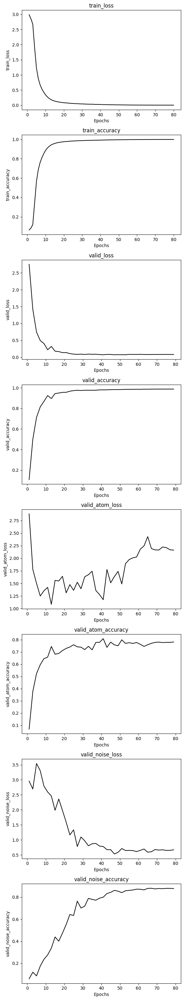

In [ ]:
trainer.plot_training_metrics()

In [ ]:
wandb.finish()

wandb: WARNING Ensure read and write access to run files dir: /home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/notebooks/various_dataset_size/wandb/run-20240905_005242-09022024-resnet50-dataset_v5_size-1m/files, control this via the WANDB_DIR env var. See https://docs.wandb.ai/guides/track/environment-variables


epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
records,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
train_accuracy,▁▁▄▆▇▇██████████████████████████████████
train_loss,██▄▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▁▄▆▇▇▇▇█████████████████████████████████
valid_atom_accuracy,▁▄▅▆▆▇▇▇▇▇▇▇█▇█▇▇▇███▇█▇▇██████▇▇███████
valid_atom_loss,█▄▂▂▂▂▁▃▃▃▂▂▂▃▂▃▃▄▂▂▁▃▂▃▃▂▄▅▄▅▄▅▇▅▅▅▅▅▅▆
valid_loss,█▅▃▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_noise_accuracy,▁▂▁▂▂▃▃▄▄▅▅▆▆▇▆▇▇▇▇▇▇███████████████████
valid_noise_loss,▇▆█▇▆▆▆▄▅▄▄▃▃▂▂▂▂▂▂▂▂▁▁▁▁▂▁▁▁▁▁▁▁▁▁▂▁▁▁▁
epoch,80


### 2 million dataset

2142007


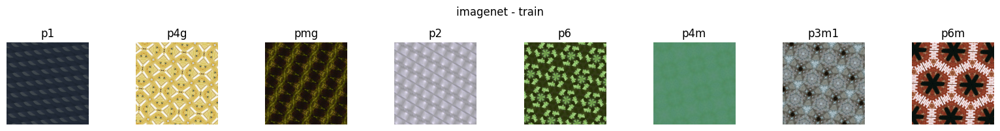

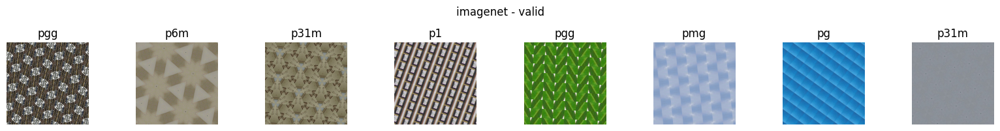

In [ ]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
_, imagenet_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
print(len(imagenet_ds))
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.80001, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [ ]:
model = resnet50_(in_channels=3, n_classes=17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,4,5,6,7,9])
device = torch.device('cuda:3')
# model

torch.Size([2, 17])


In [ ]:
config = {'dataset': '2m datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09052024-resnet50-dataset_v5_size-2m'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records', save_code=True, config=config, resume='allow')
config = wandb.config

In [ ]:
lr = 1e-3
per_epoch = 1
epoch_start = 0
epochs = 40
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/40


  0%|          | 0/477 [00:00<?, ?it/s]

100%|██████████| 477/477 [15:00<00:00,  1.89s/it]


train_loss: 2.9165, train_accuracy: 7.31%


100%|██████████| 119/119 [02:46<00:00,  1.40s/it]


valid_loss: 2.7800, valid_accuracy: 9.78%


100%|██████████| 57/57 [01:23<00:00,  1.47s/it]


valid_atom_loss: 3.1889, valid_atom_accuracy: 6.36%


100%|██████████| 29/29 [00:43<00:00,  1.51s/it]


valid_noise_loss: 3.6304, valid_noise_accuracy: 5.72%
Model saved at epoch 1
Epoch 2/40


100%|██████████| 477/477 [15:02<00:00,  1.89s/it]


train_loss: 2.3994, train_accuracy: 19.92%


100%|██████████| 119/119 [02:47<00:00,  1.41s/it]


valid_loss: 1.5904, valid_accuracy: 45.44%


100%|██████████| 57/57 [01:22<00:00,  1.44s/it]


valid_atom_loss: 2.5048, valid_atom_accuracy: 23.46%


100%|██████████| 29/29 [00:43<00:00,  1.49s/it]


valid_noise_loss: 2.9980, valid_noise_accuracy: 5.13%
Model saved at epoch 2
Epoch 3/40


100%|██████████| 477/477 [15:09<00:00,  1.91s/it]


train_loss: 1.1643, train_accuracy: 57.83%


100%|██████████| 119/119 [02:43<00:00,  1.37s/it]


valid_loss: 0.9829, valid_accuracy: 65.64%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 2.0749, valid_atom_accuracy: 41.60%


100%|██████████| 29/29 [00:44<00:00,  1.52s/it]


valid_noise_loss: 3.0789, valid_noise_accuracy: 14.82%
Model saved at epoch 3
Epoch 4/40


100%|██████████| 477/477 [14:50<00:00,  1.87s/it]


train_loss: 0.6731, train_accuracy: 75.85%


100%|██████████| 119/119 [02:43<00:00,  1.37s/it]


valid_loss: 1.1531, valid_accuracy: 62.36%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 1.8287, valid_atom_accuracy: 46.10%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 3.3850, valid_noise_accuracy: 14.30%
Model saved at epoch 4
Epoch 5/40


100%|██████████| 477/477 [14:53<00:00,  1.87s/it]


train_loss: 0.4652, train_accuracy: 83.80%


100%|██████████| 119/119 [02:43<00:00,  1.37s/it]


valid_loss: 1.4311, valid_accuracy: 70.50%


100%|██████████| 57/57 [01:23<00:00,  1.46s/it]


valid_atom_loss: 2.2503, valid_atom_accuracy: 47.43%


100%|██████████| 29/29 [00:46<00:00,  1.61s/it]


valid_noise_loss: 3.8250, valid_noise_accuracy: 13.18%
Model saved at epoch 5
Epoch 6/40


100%|██████████| 477/477 [15:07<00:00,  1.90s/it]


train_loss: 0.3220, train_accuracy: 89.29%


100%|██████████| 119/119 [02:44<00:00,  1.38s/it]


valid_loss: 2.5033, valid_accuracy: 44.62%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 2.9570, valid_atom_accuracy: 44.10%


100%|██████████| 29/29 [00:44<00:00,  1.54s/it]


valid_noise_loss: 2.8752, valid_noise_accuracy: 9.90%
Model saved at epoch 6
Epoch 7/40


100%|██████████| 477/477 [14:50<00:00,  1.87s/it]


train_loss: 0.3194, train_accuracy: 89.41%


100%|██████████| 119/119 [02:43<00:00,  1.38s/it]


valid_loss: 1.0182, valid_accuracy: 71.40%


100%|██████████| 57/57 [01:27<00:00,  1.53s/it]


valid_atom_loss: 3.0991, valid_atom_accuracy: 44.13%


100%|██████████| 29/29 [00:43<00:00,  1.49s/it]


valid_noise_loss: 4.9213, valid_noise_accuracy: 12.62%
Model saved at epoch 7
Epoch 8/40


100%|██████████| 477/477 [14:53<00:00,  1.87s/it]


train_loss: 0.3139, train_accuracy: 89.79%


100%|██████████| 119/119 [02:44<00:00,  1.38s/it]


valid_loss: 5.6480, valid_accuracy: 9.58%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 4.3511, valid_atom_accuracy: 5.90%


100%|██████████| 29/29 [00:43<00:00,  1.51s/it]


valid_noise_loss: 4.9930, valid_noise_accuracy: 5.84%
Model saved at epoch 8
Epoch 9/40


100%|██████████| 477/477 [15:04<00:00,  1.90s/it]


train_loss: 0.4966, train_accuracy: 82.90%


100%|██████████| 119/119 [02:43<00:00,  1.38s/it]


valid_loss: 3.4146, valid_accuracy: 66.72%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 20.4620, valid_atom_accuracy: 7.75%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 1.9800, valid_noise_accuracy: 38.68%
Model saved at epoch 9
Epoch 10/40


100%|██████████| 477/477 [14:57<00:00,  1.88s/it]


train_loss: 0.2233, train_accuracy: 92.69%


100%|██████████| 119/119 [02:44<00:00,  1.38s/it]


valid_loss: 1.9226, valid_accuracy: 61.54%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 2.7651, valid_atom_accuracy: 41.81%


100%|██████████| 29/29 [00:43<00:00,  1.49s/it]


valid_noise_loss: 2.9432, valid_noise_accuracy: 33.03%
Model saved at epoch 10
Epoch 11/40


100%|██████████| 477/477 [14:52<00:00,  1.87s/it]


train_loss: 0.1865, train_accuracy: 94.06%


100%|██████████| 119/119 [02:44<00:00,  1.38s/it]


valid_loss: 15.8145, valid_accuracy: 68.14%


100%|██████████| 57/57 [01:19<00:00,  1.40s/it]


valid_atom_loss: 3.5937, valid_atom_accuracy: 43.07%


100%|██████████| 29/29 [00:42<00:00,  1.48s/it]


valid_noise_loss: 1.7251, valid_noise_accuracy: 46.13%
Model saved at epoch 11
Epoch 12/40


100%|██████████| 477/477 [14:57<00:00,  1.88s/it]


train_loss: 0.1552, train_accuracy: 95.23%


100%|██████████| 119/119 [02:43<00:00,  1.37s/it]


valid_loss: 2.3401, valid_accuracy: 54.31%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 3.6699, valid_atom_accuracy: 40.08%


100%|██████████| 29/29 [00:43<00:00,  1.48s/it]


valid_noise_loss: 2.6840, valid_noise_accuracy: 35.39%
Model saved at epoch 12
Epoch 13/40


100%|██████████| 477/477 [14:55<00:00,  1.88s/it]


train_loss: 0.1523, train_accuracy: 95.34%


100%|██████████| 119/119 [02:43<00:00,  1.37s/it]


valid_loss: 2.3702, valid_accuracy: 51.34%


100%|██████████| 57/57 [01:19<00:00,  1.40s/it]


valid_atom_loss: 2.1035, valid_atom_accuracy: 51.77%


100%|██████████| 29/29 [00:43<00:00,  1.48s/it]


valid_noise_loss: 3.0353, valid_noise_accuracy: 35.57%
Model saved at epoch 13
Epoch 14/40


100%|██████████| 477/477 [14:52<00:00,  1.87s/it]


train_loss: 0.1366, train_accuracy: 95.90%


100%|██████████| 119/119 [02:43<00:00,  1.38s/it]


valid_loss: 5.2550, valid_accuracy: 23.24%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 7.9391, valid_atom_accuracy: 20.86%


100%|██████████| 29/29 [00:43<00:00,  1.50s/it]


valid_noise_loss: 7.8810, valid_noise_accuracy: 8.83%
Model saved at epoch 14
Epoch 15/40


100%|██████████| 477/477 [14:51<00:00,  1.87s/it]


train_loss: 0.2399, train_accuracy: 92.60%


100%|██████████| 119/119 [02:42<00:00,  1.37s/it]


valid_loss: 1.3502, valid_accuracy: 58.93%


100%|██████████| 57/57 [01:25<00:00,  1.50s/it]


valid_atom_loss: 2.3364, valid_atom_accuracy: 35.57%


100%|██████████| 29/29 [00:47<00:00,  1.64s/it]


valid_noise_loss: 1.5786, valid_noise_accuracy: 49.50%
Model saved at epoch 15
Epoch 16/40


100%|██████████| 477/477 [14:54<00:00,  1.87s/it]


train_loss: 0.1731, train_accuracy: 94.77%


100%|██████████| 119/119 [02:42<00:00,  1.37s/it]


valid_loss: 1.7758, valid_accuracy: 61.53%


100%|██████████| 57/57 [01:21<00:00,  1.43s/it]


valid_atom_loss: 2.7677, valid_atom_accuracy: 45.23%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 2.1836, valid_noise_accuracy: 47.29%
Model saved at epoch 16
Epoch 17/40


100%|██████████| 477/477 [14:53<00:00,  1.87s/it]


train_loss: 0.1591, train_accuracy: 95.30%


100%|██████████| 119/119 [02:42<00:00,  1.37s/it]


valid_loss: 0.3915, valid_accuracy: 87.28%


100%|██████████| 57/57 [01:19<00:00,  1.40s/it]


valid_atom_loss: 1.3168, valid_atom_accuracy: 67.30%


100%|██████████| 29/29 [00:46<00:00,  1.60s/it]


valid_noise_loss: 1.0509, valid_noise_accuracy: 66.80%
Model saved at epoch 17
Epoch 18/40


100%|██████████| 477/477 [15:24<00:00,  1.94s/it]


train_loss: 0.1428, train_accuracy: 95.76%


100%|██████████| 119/119 [02:48<00:00,  1.41s/it]


valid_loss: 0.2914, valid_accuracy: 91.70%


100%|██████████| 57/57 [01:25<00:00,  1.50s/it]


valid_atom_loss: 2.1095, valid_atom_accuracy: 58.36%


100%|██████████| 29/29 [00:44<00:00,  1.53s/it]


valid_noise_loss: 0.7288, valid_noise_accuracy: 75.37%
Model saved at epoch 18
Epoch 19/40


100%|██████████| 477/477 [14:53<00:00,  1.87s/it]


train_loss: 0.1133, train_accuracy: 96.70%


100%|██████████| 119/119 [02:43<00:00,  1.38s/it]


valid_loss: 0.7167, valid_accuracy: 81.86%


100%|██████████| 57/57 [01:19<00:00,  1.40s/it]


valid_atom_loss: 1.8959, valid_atom_accuracy: 64.41%


100%|██████████| 29/29 [00:44<00:00,  1.53s/it]


valid_noise_loss: 1.2566, valid_noise_accuracy: 66.06%
Model saved at epoch 19
Epoch 20/40


100%|██████████| 477/477 [14:49<00:00,  1.86s/it]


train_loss: 0.1419, train_accuracy: 95.69%


100%|██████████| 119/119 [02:43<00:00,  1.37s/it]


valid_loss: 0.2955, valid_accuracy: 91.38%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 1.0123, valid_atom_accuracy: 78.82%


100%|██████████| 29/29 [00:43<00:00,  1.50s/it]


valid_noise_loss: 0.9073, valid_noise_accuracy: 73.89%
Model saved at epoch 20
Epoch 21/40


100%|██████████| 477/477 [14:52<00:00,  1.87s/it]


train_loss: 0.1049, train_accuracy: 96.96%


100%|██████████| 119/119 [02:48<00:00,  1.41s/it]


valid_loss: 1.5494, valid_accuracy: 66.79%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 1.0703, valid_atom_accuracy: 69.91%


100%|██████████| 29/29 [00:44<00:00,  1.53s/it]


valid_noise_loss: 1.8366, valid_noise_accuracy: 53.51%
Model saved at epoch 21
Epoch 22/40


100%|██████████| 477/477 [14:56<00:00,  1.88s/it]


train_loss: 0.1895, train_accuracy: 93.99%


100%|██████████| 119/119 [02:43<00:00,  1.37s/it]


valid_loss: 0.2593, valid_accuracy: 91.49%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 0.5712, valid_atom_accuracy: 85.55%


100%|██████████| 29/29 [00:43<00:00,  1.50s/it]


valid_noise_loss: 0.6029, valid_noise_accuracy: 79.61%
Model saved at epoch 22
Epoch 23/40


100%|██████████| 477/477 [15:16<00:00,  1.92s/it]


train_loss: 0.0988, train_accuracy: 97.12%


100%|██████████| 119/119 [02:43<00:00,  1.38s/it]


valid_loss: 0.1156, valid_accuracy: 96.52%


100%|██████████| 57/57 [01:20<00:00,  1.40s/it]


valid_atom_loss: 1.2336, valid_atom_accuracy: 71.13%


100%|██████████| 29/29 [00:42<00:00,  1.47s/it]


valid_noise_loss: 0.4793, valid_noise_accuracy: 83.90%
Model saved at epoch 23
Epoch 24/40


100%|██████████| 477/477 [14:55<00:00,  1.88s/it]


train_loss: 0.0856, train_accuracy: 97.51%


100%|██████████| 119/119 [02:43<00:00,  1.38s/it]


valid_loss: 0.2046, valid_accuracy: 94.14%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 1.2554, valid_atom_accuracy: 67.23%


100%|██████████| 29/29 [00:42<00:00,  1.47s/it]


valid_noise_loss: 0.5910, valid_noise_accuracy: 81.56%
Model saved at epoch 24
Epoch 25/40


100%|██████████| 477/477 [14:55<00:00,  1.88s/it]


train_loss: 0.0877, train_accuracy: 97.40%


100%|██████████| 119/119 [02:47<00:00,  1.41s/it]


valid_loss: 0.1268, valid_accuracy: 96.63%


100%|██████████| 57/57 [01:19<00:00,  1.40s/it]


valid_atom_loss: 1.5418, valid_atom_accuracy: 67.30%


100%|██████████| 29/29 [00:43<00:00,  1.50s/it]


valid_noise_loss: 0.4649, valid_noise_accuracy: 85.17%
Model saved at epoch 25
Epoch 26/40


100%|██████████| 477/477 [14:54<00:00,  1.88s/it]


train_loss: 0.0784, train_accuracy: 97.77%


100%|██████████| 119/119 [02:44<00:00,  1.38s/it]


valid_loss: 0.1948, valid_accuracy: 94.24%


100%|██████████| 57/57 [01:19<00:00,  1.40s/it]


valid_atom_loss: 0.7633, valid_atom_accuracy: 78.45%


100%|██████████| 29/29 [00:44<00:00,  1.54s/it]


valid_noise_loss: 0.5254, valid_noise_accuracy: 82.35%
Model saved at epoch 26
Epoch 27/40


100%|██████████| 477/477 [14:53<00:00,  1.87s/it]


train_loss: 0.0665, train_accuracy: 98.11%


100%|██████████| 119/119 [02:43<00:00,  1.38s/it]


valid_loss: 0.0958, valid_accuracy: 97.22%


100%|██████████| 57/57 [01:19<00:00,  1.40s/it]


valid_atom_loss: 0.7629, valid_atom_accuracy: 80.87%


100%|██████████| 29/29 [00:45<00:00,  1.57s/it]


valid_noise_loss: 0.3833, valid_noise_accuracy: 87.00%
Model saved at epoch 27
Epoch 28/40


100%|██████████| 477/477 [14:51<00:00,  1.87s/it]


train_loss: 0.0900, train_accuracy: 97.44%


100%|██████████| 119/119 [02:48<00:00,  1.41s/it]


valid_loss: 0.0696, valid_accuracy: 97.90%


100%|██████████| 57/57 [01:22<00:00,  1.44s/it]


valid_atom_loss: 0.7529, valid_atom_accuracy: 82.09%


100%|██████████| 29/29 [00:47<00:00,  1.63s/it]


valid_noise_loss: 0.4151, valid_noise_accuracy: 86.23%
Model saved at epoch 28
Epoch 29/40


100%|██████████| 477/477 [14:49<00:00,  1.87s/it]


train_loss: 0.0597, train_accuracy: 98.33%


100%|██████████| 119/119 [02:44<00:00,  1.38s/it]


valid_loss: 0.0690, valid_accuracy: 98.07%


100%|██████████| 57/57 [01:22<00:00,  1.45s/it]


valid_atom_loss: 0.9989, valid_atom_accuracy: 80.56%


100%|██████████| 29/29 [00:42<00:00,  1.48s/it]


valid_noise_loss: 0.4319, valid_noise_accuracy: 86.38%
Model saved at epoch 29
Epoch 30/40


100%|██████████| 477/477 [15:12<00:00,  1.91s/it]


train_loss: 0.0572, train_accuracy: 98.41%


100%|██████████| 119/119 [02:46<00:00,  1.40s/it]


valid_loss: 0.0600, valid_accuracy: 98.32%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 0.8635, valid_atom_accuracy: 81.03%


100%|██████████| 29/29 [00:42<00:00,  1.47s/it]


valid_noise_loss: 0.4437, valid_noise_accuracy: 85.70%
Model saved at epoch 30
Epoch 31/40


100%|██████████| 477/477 [14:46<00:00,  1.86s/it]


train_loss: 0.0453, train_accuracy: 98.76%


100%|██████████| 119/119 [02:40<00:00,  1.35s/it]


valid_loss: 0.0608, valid_accuracy: 98.35%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 0.7651, valid_atom_accuracy: 83.32%


100%|██████████| 29/29 [00:45<00:00,  1.57s/it]


valid_noise_loss: 0.3868, valid_noise_accuracy: 87.60%
Model saved at epoch 31
Epoch 32/40


100%|██████████| 477/477 [14:47<00:00,  1.86s/it]


train_loss: 0.0456, train_accuracy: 98.75%


100%|██████████| 119/119 [02:41<00:00,  1.36s/it]


valid_loss: 0.0613, valid_accuracy: 98.35%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 0.8602, valid_atom_accuracy: 81.49%


100%|██████████| 29/29 [00:42<00:00,  1.47s/it]


valid_noise_loss: 0.4856, valid_noise_accuracy: 85.46%
Model saved at epoch 32
Epoch 33/40


100%|██████████| 477/477 [15:01<00:00,  1.89s/it]


train_loss: 0.0444, train_accuracy: 98.78%


100%|██████████| 119/119 [02:45<00:00,  1.39s/it]


valid_loss: 0.0597, valid_accuracy: 98.48%


100%|██████████| 57/57 [01:21<00:00,  1.43s/it]


valid_atom_loss: 0.7866, valid_atom_accuracy: 84.25%


100%|██████████| 29/29 [00:43<00:00,  1.50s/it]


valid_noise_loss: 0.3799, valid_noise_accuracy: 88.29%
Model saved at epoch 33
Epoch 34/40


100%|██████████| 477/477 [14:50<00:00,  1.87s/it]


train_loss: 0.0404, train_accuracy: 98.90%


100%|██████████| 119/119 [02:40<00:00,  1.35s/it]


valid_loss: 0.0562, valid_accuracy: 98.50%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 0.8237, valid_atom_accuracy: 82.64%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 0.4221, valid_noise_accuracy: 86.76%
Model saved at epoch 34
Epoch 35/40


100%|██████████| 477/477 [14:48<00:00,  1.86s/it]


train_loss: 0.0347, train_accuracy: 99.08%


100%|██████████| 119/119 [02:42<00:00,  1.37s/it]


valid_loss: 0.0548, valid_accuracy: 98.53%


100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 0.7138, valid_atom_accuracy: 84.53%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 0.3874, valid_noise_accuracy: 87.63%
Model saved at epoch 35
Epoch 36/40


100%|██████████| 477/477 [14:40<00:00,  1.85s/it]


train_loss: 0.0312, train_accuracy: 99.19%


100%|██████████| 119/119 [02:43<00:00,  1.37s/it]


valid_loss: 0.0559, valid_accuracy: 98.55%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 0.7391, valid_atom_accuracy: 84.61%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 0.3838, valid_noise_accuracy: 88.17%
Model saved at epoch 36
Epoch 37/40


100%|██████████| 477/477 [14:44<00:00,  1.85s/it]


train_loss: 0.0305, train_accuracy: 99.22%


100%|██████████| 119/119 [02:39<00:00,  1.34s/it]


valid_loss: 0.0597, valid_accuracy: 98.53%


100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 0.8607, valid_atom_accuracy: 83.92%


100%|██████████| 29/29 [00:42<00:00,  1.45s/it]


valid_noise_loss: 0.4195, valid_noise_accuracy: 87.60%
Model saved at epoch 37
Epoch 38/40


100%|██████████| 477/477 [14:40<00:00,  1.84s/it]


train_loss: 0.0284, train_accuracy: 99.29%


100%|██████████| 119/119 [02:46<00:00,  1.40s/it]


valid_loss: 0.0566, valid_accuracy: 98.52%


100%|██████████| 57/57 [01:20<00:00,  1.42s/it]


valid_atom_loss: 0.8294, valid_atom_accuracy: 82.94%


100%|██████████| 29/29 [00:43<00:00,  1.50s/it]


valid_noise_loss: 0.3997, valid_noise_accuracy: 87.87%
Model saved at epoch 38
Epoch 39/40


100%|██████████| 477/477 [14:46<00:00,  1.86s/it]


train_loss: 0.0272, train_accuracy: 99.33%


100%|██████████| 119/119 [02:45<00:00,  1.39s/it]


valid_loss: 0.0587, valid_accuracy: 98.56%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 0.8264, valid_atom_accuracy: 84.49%


100%|██████████| 29/29 [00:45<00:00,  1.57s/it]


valid_noise_loss: 0.3721, valid_noise_accuracy: 88.73%
Model saved at epoch 39
Epoch 40/40


100%|██████████| 477/477 [14:45<00:00,  1.86s/it]


train_loss: 0.0269, train_accuracy: 99.34%


100%|██████████| 119/119 [02:41<00:00,  1.36s/it]


valid_loss: 0.0591, valid_accuracy: 98.55%


100%|██████████| 57/57 [01:19<00:00,  1.40s/it]


valid_atom_loss: 0.8653, valid_atom_accuracy: 82.87%


100%|██████████| 29/29 [00:43<00:00,  1.49s/it]


valid_noise_loss: 0.4259, valid_noise_accuracy: 87.30%
Model saved at epoch 40


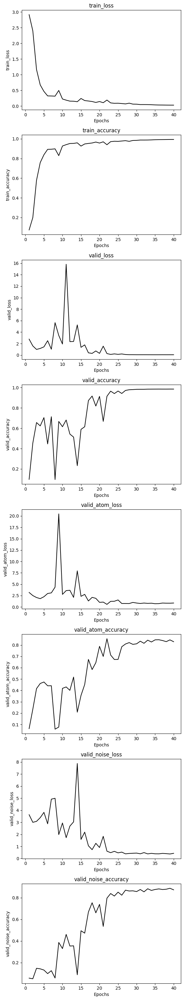

In [ ]:
trainer.plot_training_metrics()

In [ ]:
wandb.finish()

wandb: WARNING Source type is set to 'repo' but some required information is missing from the environment. A job will not be created from this run. See https://docs.wandb.ai/guides/launch/create-job


epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
records,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
train_accuracy,▁▁▄▆▇▇▇▇▄▇██████▇███████████████████████
train_loss,██▄▃▂▂▂▂▄▂▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▁▄▅▅▆▄▆▁▅▅▆▄▄▂▅▅▇▇▇▇▆▇██████████████████
valid_atom_accuracy,▁▃▄▄▅▄▄▁▁▄▄▄▅▂▄▄▆▅▆▇▇█▇▆▆▇██████████████
valid_atom_loss,▂▂▂▁▂▂▂▂█▂▂▂▂▄▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_loss,▂▂▁▁▂▂▁▃▂▂█▂▂▃▂▂▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_noise_accuracy,▁▁▂▂▂▁▂▁▄▃▄▄▄▁▅▅▆▇▆▇▅▇█▇█▇██████████████
valid_noise_loss,▄▃▄▄▄▃▅▅▃▄▂▃▄█▂▃▂▁▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,40


### 5 million dataset

5355017


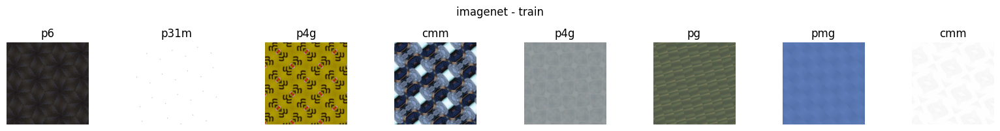

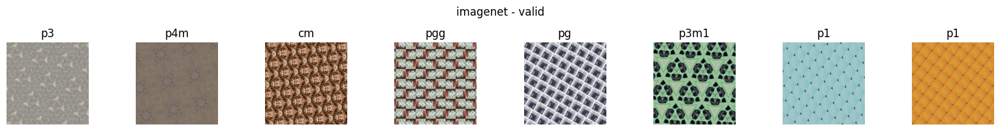

In [ ]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
_, imagenet_ds = split_train_valid(imagenet_ds, 0.5, seed=42)
print(len(imagenet_ds))
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.80001, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [ ]:
model = resnet50_(in_channels=3, n_classes=17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,4,5,6,7,9])
device = torch.device('cuda:3')
# model

torch.Size([2, 17])


In [ ]:
config = {'dataset': '5m datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09032024-resnet50-dataset_v5_size-5m'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records', save_code=True, config=config, resume='allow')
config = wandb.config

In [ ]:
lr = 1e-3
per_epoch = 2
epoch_start = 0
epochs = 20
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/20


  0%|          | 0/1191 [00:00<?, ?it/s]

100%|██████████| 1191/1191 [39:02<00:00,  1.97s/it]


train_loss: 0.7420, train_accuracy: 74.34%
Epoch 2/20


100%|██████████| 1191/1191 [39:00<00:00,  1.97s/it]


train_loss: 0.3640, train_accuracy: 87.72%


100%|██████████| 298/298 [07:07<00:00,  1.44s/it]


valid_loss: 0.3871, valid_accuracy: 86.62%


100%|██████████| 57/57 [01:27<00:00,  1.53s/it]


valid_atom_loss: 1.6109, valid_atom_accuracy: 63.06%


100%|██████████| 29/29 [00:46<00:00,  1.62s/it]


valid_noise_loss: 2.5005, valid_noise_accuracy: 30.89%
Model saved at epoch 2
Epoch 3/20


100%|██████████| 1191/1191 [38:57<00:00,  1.96s/it]


train_loss: 0.1724, train_accuracy: 94.60%
Epoch 4/20


100%|██████████| 1191/1191 [38:22<00:00,  1.93s/it]


train_loss: 0.1156, train_accuracy: 96.61%


100%|██████████| 298/298 [06:45<00:00,  1.36s/it]


valid_loss: 1.4825, valid_accuracy: 64.85%


100%|██████████| 57/57 [01:19<00:00,  1.40s/it]


valid_atom_loss: 2.3947, valid_atom_accuracy: 51.50%


100%|██████████| 29/29 [00:43<00:00,  1.50s/it]


valid_noise_loss: 3.3443, valid_noise_accuracy: 37.84%
Model saved at epoch 4
Epoch 5/20


100%|██████████| 1191/1191 [37:45<00:00,  1.90s/it]


train_loss: 0.0899, train_accuracy: 97.45%
Epoch 6/20


100%|██████████| 1191/1191 [37:48<00:00,  1.90s/it]


train_loss: 0.0670, train_accuracy: 98.15%


100%|██████████| 298/298 [06:45<00:00,  1.36s/it]


valid_loss: 0.4627, valid_accuracy: 87.99%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 1.5995, valid_atom_accuracy: 65.05%


100%|██████████| 29/29 [00:42<00:00,  1.47s/it]


valid_noise_loss: 1.1122, valid_noise_accuracy: 68.23%
Model saved at epoch 6
Epoch 7/20


100%|██████████| 1191/1191 [37:24<00:00,  1.88s/it]


train_loss: 0.0553, train_accuracy: 98.47%
Epoch 8/20


100%|██████████| 1191/1191 [37:39<00:00,  1.90s/it]


train_loss: 0.0478, train_accuracy: 98.69%


100%|██████████| 298/298 [06:56<00:00,  1.40s/it]


valid_loss: 0.3232, valid_accuracy: 91.79%


100%|██████████| 57/57 [01:22<00:00,  1.44s/it]


valid_atom_loss: 2.0363, valid_atom_accuracy: 60.69%


100%|██████████| 29/29 [00:45<00:00,  1.56s/it]


valid_noise_loss: 0.7269, valid_noise_accuracy: 78.36%
Model saved at epoch 8
Epoch 9/20


100%|██████████| 1191/1191 [37:52<00:00,  1.91s/it]


train_loss: 0.0451, train_accuracy: 98.76%
Epoch 10/20


100%|██████████| 1191/1191 [38:05<00:00,  1.92s/it]


train_loss: 0.0353, train_accuracy: 99.04%


100%|██████████| 298/298 [06:36<00:00,  1.33s/it]


valid_loss: 0.1362, valid_accuracy: 96.32%


100%|██████████| 57/57 [01:20<00:00,  1.41s/it]


valid_atom_loss: 1.2668, valid_atom_accuracy: 75.91%


100%|██████████| 29/29 [00:43<00:00,  1.50s/it]


valid_noise_loss: 0.5368, valid_noise_accuracy: 86.90%
Model saved at epoch 10
Epoch 11/20


100%|██████████| 1191/1191 [37:25<00:00,  1.89s/it]


train_loss: 0.0323, train_accuracy: 99.13%
Epoch 12/20


100%|██████████| 1191/1191 [37:47<00:00,  1.90s/it]


train_loss: 0.0306, train_accuracy: 99.17%


100%|██████████| 298/298 [06:38<00:00,  1.34s/it]


valid_loss: 0.0337, valid_accuracy: 99.05%


100%|██████████| 57/57 [01:18<00:00,  1.38s/it]


valid_atom_loss: 1.2650, valid_atom_accuracy: 78.50%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 0.2114, valid_noise_accuracy: 93.02%
Model saved at epoch 12
Epoch 13/20


100%|██████████| 1191/1191 [37:22<00:00,  1.88s/it]


train_loss: 0.0251, train_accuracy: 99.33%
Epoch 14/20


100%|██████████| 1191/1191 [37:31<00:00,  1.89s/it]


train_loss: 0.0213, train_accuracy: 99.44%


100%|██████████| 298/298 [06:40<00:00,  1.34s/it]


valid_loss: 0.0293, valid_accuracy: 99.21%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 1.0791, valid_atom_accuracy: 82.63%


100%|██████████| 29/29 [00:43<00:00,  1.49s/it]


valid_noise_loss: 0.3505, valid_noise_accuracy: 91.52%
Model saved at epoch 14
Epoch 15/20


100%|██████████| 1191/1191 [37:32<00:00,  1.89s/it]


train_loss: 0.0192, train_accuracy: 99.50%
Epoch 16/20


100%|██████████| 1191/1191 [37:18<00:00,  1.88s/it]


train_loss: 0.0158, train_accuracy: 99.60%


100%|██████████| 298/298 [06:35<00:00,  1.33s/it]


valid_loss: 0.0225, valid_accuracy: 99.42%


100%|██████████| 57/57 [01:18<00:00,  1.37s/it]


valid_atom_loss: 1.2483, valid_atom_accuracy: 82.57%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 0.2422, valid_noise_accuracy: 93.71%
Model saved at epoch 16
Epoch 17/20


100%|██████████| 1191/1191 [37:11<00:00,  1.87s/it]


train_loss: 0.0149, train_accuracy: 99.63%
Epoch 18/20


100%|██████████| 1191/1191 [36:59<00:00,  1.86s/it]


train_loss: 0.0133, train_accuracy: 99.68%


100%|██████████| 298/298 [06:40<00:00,  1.34s/it]


valid_loss: 0.0210, valid_accuracy: 99.48%


100%|██████████| 57/57 [01:19<00:00,  1.39s/it]


valid_atom_loss: 1.2323, valid_atom_accuracy: 83.93%


100%|██████████| 29/29 [00:43<00:00,  1.51s/it]


valid_noise_loss: 0.2513, valid_noise_accuracy: 93.72%
Model saved at epoch 18
Epoch 19/20


100%|██████████| 1191/1191 [37:19<00:00,  1.88s/it]


train_loss: 0.0120, train_accuracy: 99.72%
Epoch 20/20


100%|██████████| 1191/1191 [37:34<00:00,  1.89s/it]


train_loss: 0.0116, train_accuracy: 99.73%


100%|██████████| 298/298 [06:37<00:00,  1.33s/it]


valid_loss: 0.0209, valid_accuracy: 99.49%


100%|██████████| 57/57 [01:19<00:00,  1.40s/it]


valid_atom_loss: 1.1837, valid_atom_accuracy: 84.24%


100%|██████████| 29/29 [00:42<00:00,  1.46s/it]


valid_noise_loss: 0.2734, valid_noise_accuracy: 93.51%
Model saved at epoch 20


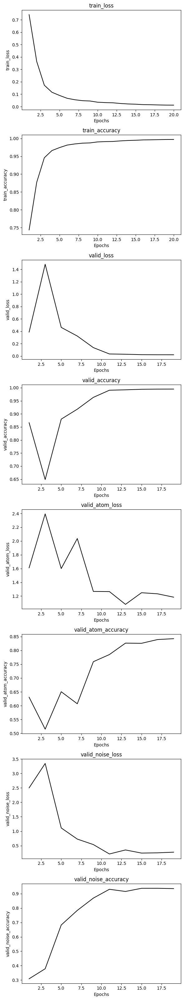

In [ ]:
trainer.plot_training_metrics()

In [ ]:
wandb.finish()

wandb: WARNING Source type is set to 'repo' but some required information is missing from the environment. A job will not be created from this run. See https://docs.wandb.ai/guides/launch/create-job


epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇████
records,▁▁▁▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
train_accuracy,▁▂▅▆▇▇██████████████████████████████████
train_loss,█▇▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▅▆▅▆▁▁▁▁▆▆▆▆▆▆▇▇▇▇▇▇████████████████████
valid_atom_accuracy,▄▄▄▄▁▂▁▁▄▄▄▄▃▃▃▃▆▆▆▆▆▇▇▇▇█▇▇▇▇▇▇████████
valid_atom_loss,▄▄▄▄████▄▃▄▄▆▆▇▆▃▂▃▃▃▂▂▃▂▁▁▂▃▂▃▃▂▂▂▃▂▂▂▂
valid_loss,▃▃▃▃████▃▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_noise_accuracy,▁▁▁▁▂▂▂▂▅▅▅▅▆▆▆▆▇▇▇▇████████████████████
valid_noise_loss,▆▆▆▆████▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,20


### full size dataset - 10 million

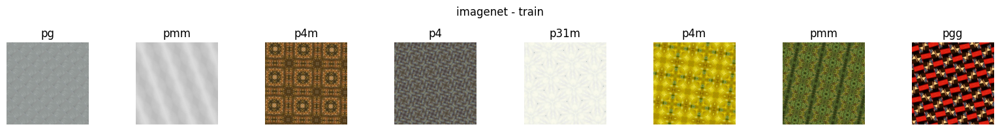

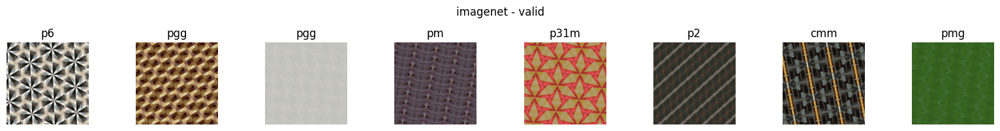

In [14]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [15]:
model = resnet50_(in_channels=3, n_classes=17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,4,5,6,7,9])
device = torch.device('cuda:3')
# model

torch.Size([2, 17])


In [16]:
config = {'dataset': '10m datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09112024-resnet50-dataset_v5_size-10m'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records', save_code=True, config=config, resume='allow')
config = wandb.config

In [17]:
lr = 1e-3
per_epoch = 1
epoch_start = 0
epochs = 20
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)
wandb.finish()

Epoch 1/20


100%|██████████| 2381/2381 [1:10:38<00:00,  1.78s/it]


train_loss: 1.7379, train_accuracy: 42.28%


100%|██████████| 596/596 [13:42<00:00,  1.38s/it]


valid_loss: 0.9738, valid_accuracy: 70.20%


100%|██████████| 57/57 [01:27<00:00,  1.53s/it]


valid_atom_loss: 1.9531, valid_atom_accuracy: 50.79%


100%|██████████| 29/29 [00:45<00:00,  1.55s/it]


valid_noise_loss: 30.4754, valid_noise_accuracy: 1.30%
Model saved at epoch 1
Epoch 2/20


100%|██████████| 2381/2381 [1:16:03<00:00,  1.92s/it]


train_loss: 0.3237, train_accuracy: 89.28%


100%|██████████| 596/596 [14:03<00:00,  1.42s/it]


valid_loss: 6.5376, valid_accuracy: 63.86%


100%|██████████| 57/57 [01:32<00:00,  1.62s/it]


valid_atom_loss: 2.4565, valid_atom_accuracy: 51.28%


100%|██████████| 29/29 [00:46<00:00,  1.59s/it]


valid_noise_loss: 2.9739, valid_noise_accuracy: 28.46%
Model saved at epoch 2
Epoch 3/20


100%|██████████| 2381/2381 [1:20:46<00:00,  2.04s/it]


train_loss: 0.1317, train_accuracy: 96.09%


100%|██████████| 596/596 [14:40<00:00,  1.48s/it]


valid_loss: 3.5785, valid_accuracy: 50.22%


100%|██████████| 57/57 [01:34<00:00,  1.66s/it]


valid_atom_loss: 4.8685, valid_atom_accuracy: 35.21%


100%|██████████| 29/29 [00:51<00:00,  1.77s/it]


valid_noise_loss: 4.4007, valid_noise_accuracy: 29.33%
Model saved at epoch 3
Epoch 4/20


100%|██████████| 2381/2381 [1:21:00<00:00,  2.04s/it]


train_loss: 0.0849, train_accuracy: 97.59%


100%|██████████| 596/596 [14:51<00:00,  1.50s/it]


valid_loss: 4.0753, valid_accuracy: 47.52%


100%|██████████| 57/57 [01:31<00:00,  1.60s/it]


valid_atom_loss: 3.3231, valid_atom_accuracy: 46.30%


100%|██████████| 29/29 [00:46<00:00,  1.61s/it]


valid_noise_loss: 3.5556, valid_noise_accuracy: 35.93%
Model saved at epoch 4
Epoch 5/20


100%|██████████| 2381/2381 [1:18:10<00:00,  1.97s/it]


train_loss: 0.0803, train_accuracy: 97.71%


100%|██████████| 596/596 [14:48<00:00,  1.49s/it]


valid_loss: 1.6159, valid_accuracy: 63.97%


100%|██████████| 57/57 [01:27<00:00,  1.54s/it]


valid_atom_loss: 2.8535, valid_atom_accuracy: 53.97%


100%|██████████| 29/29 [00:48<00:00,  1.69s/it]


valid_noise_loss: 2.2427, valid_noise_accuracy: 47.41%
Model saved at epoch 5
Epoch 6/20


100%|██████████| 2381/2381 [1:18:52<00:00,  1.99s/it]


train_loss: 0.0573, train_accuracy: 98.40%


100%|██████████| 596/596 [14:44<00:00,  1.48s/it]


valid_loss: 1.6488, valid_accuracy: 59.32%


100%|██████████| 57/57 [01:30<00:00,  1.58s/it]


valid_atom_loss: 2.5274, valid_atom_accuracy: 47.53%


100%|██████████| 29/29 [00:45<00:00,  1.57s/it]


valid_noise_loss: 2.0145, valid_noise_accuracy: 49.50%
Model saved at epoch 6
Epoch 7/20


100%|██████████| 2381/2381 [1:19:13<00:00,  2.00s/it]


train_loss: 0.0921, train_accuracy: 97.23%


100%|██████████| 596/596 [14:52<00:00,  1.50s/it]


valid_loss: 2.7912, valid_accuracy: 61.58%


100%|██████████| 57/57 [01:28<00:00,  1.55s/it]


valid_atom_loss: 2.0668, valid_atom_accuracy: 60.75%


100%|██████████| 29/29 [00:48<00:00,  1.69s/it]


valid_noise_loss: 1.8682, valid_noise_accuracy: 61.39%
Model saved at epoch 7
Epoch 8/20


100%|██████████| 2381/2381 [1:18:58<00:00,  1.99s/it]


train_loss: 0.0487, train_accuracy: 98.64%


100%|██████████| 596/596 [14:51<00:00,  1.50s/it]


valid_loss: 0.3808, valid_accuracy: 89.92%


100%|██████████| 57/57 [01:32<00:00,  1.62s/it]


valid_atom_loss: 1.1592, valid_atom_accuracy: 77.94%


100%|██████████| 29/29 [00:50<00:00,  1.74s/it]


valid_noise_loss: 0.7771, valid_noise_accuracy: 78.28%
Model saved at epoch 8
Epoch 9/20


100%|██████████| 2381/2381 [1:18:21<00:00,  1.97s/it]


train_loss: 0.0409, train_accuracy: 98.87%


100%|██████████| 596/596 [15:00<00:00,  1.51s/it]


valid_loss: 0.1630, valid_accuracy: 95.06%


100%|██████████| 57/57 [01:36<00:00,  1.70s/it]


valid_atom_loss: 1.1362, valid_atom_accuracy: 80.79%


100%|██████████| 29/29 [00:50<00:00,  1.75s/it]


valid_noise_loss: 0.6180, valid_noise_accuracy: 86.31%
Model saved at epoch 9
Epoch 10/20


100%|██████████| 2381/2381 [1:19:39<00:00,  2.01s/it]


train_loss: 0.0340, train_accuracy: 99.07%


100%|██████████| 596/596 [14:44<00:00,  1.48s/it]


valid_loss: 0.2851, valid_accuracy: 91.60%


100%|██████████| 57/57 [01:30<00:00,  1.59s/it]


valid_atom_loss: 1.1870, valid_atom_accuracy: 76.61%


100%|██████████| 29/29 [00:49<00:00,  1.70s/it]


valid_noise_loss: 0.6939, valid_noise_accuracy: 81.60%
Model saved at epoch 10
Epoch 11/20


100%|██████████| 2381/2381 [1:19:14<00:00,  2.00s/it]


train_loss: 0.0345, train_accuracy: 99.05%


100%|██████████| 596/596 [15:06<00:00,  1.52s/it]


valid_loss: 0.2349, valid_accuracy: 94.19%


100%|██████████| 57/57 [01:36<00:00,  1.69s/it]


valid_atom_loss: 0.9774, valid_atom_accuracy: 80.90%


100%|██████████| 29/29 [00:48<00:00,  1.68s/it]


valid_noise_loss: 0.2901, valid_noise_accuracy: 89.93%
Model saved at epoch 11
Epoch 12/20


100%|██████████| 2381/2381 [1:20:19<00:00,  2.02s/it]


train_loss: 0.0275, train_accuracy: 99.26%


100%|██████████| 596/596 [14:48<00:00,  1.49s/it]


valid_loss: 0.1823, valid_accuracy: 95.49%


100%|██████████| 57/57 [01:31<00:00,  1.61s/it]


valid_atom_loss: 0.9965, valid_atom_accuracy: 81.79%


100%|██████████| 29/29 [00:48<00:00,  1.66s/it]


valid_noise_loss: 0.4021, valid_noise_accuracy: 88.48%
Model saved at epoch 12
Epoch 13/20


100%|██████████| 2381/2381 [1:22:15<00:00,  2.07s/it]


train_loss: 0.0245, train_accuracy: 99.34%


100%|██████████| 596/596 [16:29<00:00,  1.66s/it]


valid_loss: 0.0306, valid_accuracy: 99.09%


100%|██████████| 57/57 [01:34<00:00,  1.66s/it]


valid_atom_loss: 0.7594, valid_atom_accuracy: 82.62%


100%|██████████| 29/29 [00:49<00:00,  1.72s/it]


valid_noise_loss: 0.2336, valid_noise_accuracy: 92.35%
Model saved at epoch 13
Epoch 14/20


100%|██████████| 2381/2381 [1:26:10<00:00,  2.17s/it]


train_loss: 0.0218, train_accuracy: 99.42%


100%|██████████| 596/596 [16:23<00:00,  1.65s/it]


valid_loss: 0.0212, valid_accuracy: 99.41%


100%|██████████| 57/57 [01:37<00:00,  1.71s/it]


valid_atom_loss: 0.7354, valid_atom_accuracy: 86.81%


100%|██████████| 29/29 [00:51<00:00,  1.79s/it]


valid_noise_loss: 0.1643, valid_noise_accuracy: 94.52%
Model saved at epoch 14
Epoch 15/20


100%|██████████| 2381/2381 [1:25:20<00:00,  2.15s/it]


train_loss: 0.0185, train_accuracy: 99.51%


100%|██████████| 596/596 [16:14<00:00,  1.64s/it]


valid_loss: 0.0201, valid_accuracy: 99.45%


100%|██████████| 57/57 [01:33<00:00,  1.64s/it]


valid_atom_loss: 0.8848, valid_atom_accuracy: 84.72%


100%|██████████| 29/29 [00:50<00:00,  1.73s/it]


valid_noise_loss: 0.2116, valid_noise_accuracy: 93.80%
Model saved at epoch 15
Epoch 16/20


100%|██████████| 2381/2381 [1:24:37<00:00,  2.13s/it]


train_loss: 0.0167, train_accuracy: 99.57%


100%|██████████| 596/596 [16:22<00:00,  1.65s/it]


valid_loss: 0.0197, valid_accuracy: 99.48%


100%|██████████| 57/57 [01:34<00:00,  1.67s/it]


valid_atom_loss: 0.8570, valid_atom_accuracy: 84.84%


100%|██████████| 29/29 [00:48<00:00,  1.67s/it]


valid_noise_loss: 0.2160, valid_noise_accuracy: 93.91%
Model saved at epoch 16
Epoch 17/20


100%|██████████| 2381/2381 [1:21:49<00:00,  2.06s/it]


train_loss: 0.0152, train_accuracy: 99.62%


100%|██████████| 596/596 [16:13<00:00,  1.63s/it]


valid_loss: 0.0185, valid_accuracy: 99.52%


100%|██████████| 57/57 [01:37<00:00,  1.71s/it]


valid_atom_loss: 0.8551, valid_atom_accuracy: 86.27%


100%|██████████| 29/29 [00:52<00:00,  1.80s/it]


valid_noise_loss: 0.1872, valid_noise_accuracy: 94.70%
Model saved at epoch 17
Epoch 18/20


100%|██████████| 2381/2381 [1:24:40<00:00,  2.13s/it]


train_loss: 0.0138, train_accuracy: 99.66%


100%|██████████| 596/596 [16:26<00:00,  1.65s/it]


valid_loss: 0.0187, valid_accuracy: 99.52%


100%|██████████| 57/57 [01:38<00:00,  1.73s/it]


valid_atom_loss: 1.0035, valid_atom_accuracy: 85.11%


100%|██████████| 29/29 [00:51<00:00,  1.77s/it]


valid_noise_loss: 0.1916, valid_noise_accuracy: 94.81%
Model saved at epoch 18
Epoch 19/20


100%|██████████| 2381/2381 [1:24:02<00:00,  2.12s/it]


train_loss: 0.0131, train_accuracy: 99.68%


100%|██████████| 596/596 [16:21<00:00,  1.65s/it]


valid_loss: 0.0186, valid_accuracy: 99.53%


100%|██████████| 57/57 [01:39<00:00,  1.74s/it]


valid_atom_loss: 1.0563, valid_atom_accuracy: 84.25%


100%|██████████| 29/29 [00:52<00:00,  1.80s/it]


valid_noise_loss: 0.2643, valid_noise_accuracy: 93.54%
Model saved at epoch 19
Epoch 20/20


100%|██████████| 2381/2381 [1:22:50<00:00,  2.09s/it]


train_loss: 0.0127, train_accuracy: 99.69%


100%|██████████| 596/596 [15:13<00:00,  1.53s/it]


valid_loss: 0.0182, valid_accuracy: 99.54%


100%|██████████| 57/57 [01:36<00:00,  1.70s/it]


valid_atom_loss: 0.9027, valid_atom_accuracy: 85.81%


100%|██████████| 29/29 [00:51<00:00,  1.78s/it]


valid_noise_loss: 0.2047, valid_noise_accuracy: 94.55%
Model saved at epoch 20


wandb: WARNING Source type is set to 'repo' but some required information is missing from the environment. A job will not be created from this run. See https://docs.wandb.ai/guides/launch/create-job


epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇████
records,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇█████
train_accuracy,▁▅▇▇████████████████████████████████████
train_loss,█▄▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▄▄▃▃▂▁▁▁▃▃▃▃▃▃▇▇▇▇▇▇▇▇▇▇████████████████
valid_atom_accuracy,▃▃▃▃▁▁▃▂▄▄▃▃▄▄▇▇▇▇▇▆▇▇▇▇█▇██████████████
valid_atom_loss,▃▃▄▄██▅▅▄▄▄▄▃▃▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▁▁
valid_loss,▂▂▇█▄▄▅▅▂▂▃▃▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_noise_accuracy,▁▁▃▃▃▃▄▄▄▄▅▅▅▅▇▇▇▇▇▇██▇▇████████████████
valid_noise_loss,██▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,20


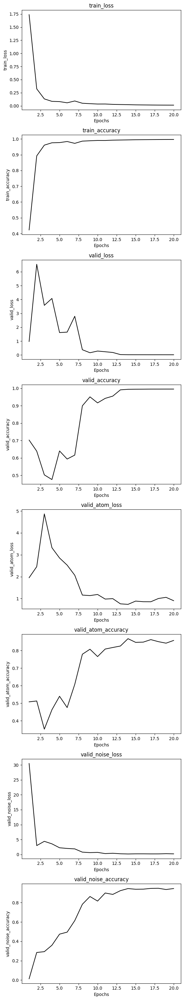

In [18]:
trainer.plot_training_metrics()